<a href="https://colab.research.google.com/github/SuloveBhattarai/GAN_Digits/blob/main/GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#Importing libraries::
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from tqdm.auto import tqdm #progress bar to show progress during training
import matplotlib.pyplot as plt

In [2]:
#Visualization function
def show(tensor, ch=1, size= (28, 28), num= 16):
  data= tensor.detach().cpu().view(-1,ch,*size) #128*1*28 x 28
  grid= make_grid(data[:num], nrow=4).permute(1,2,0) #permute-> change the order of the channel
  plt.imshow(grid)
  plt.show()

In [3]:
#Setup of the main parameters and hyperparameters:
epochs= 500
cur_step= 0
info_step= 300
mean_gen_loss= 0
mean_disc_loss= 0
z_dim= 64
lr= 0.00001
loss_func= nn.BCEWithLogitsLoss()

bs= 128
device= 'cuda'

dataloader= DataLoader(MNIST('.', download=True, transform= transforms.ToTensor()), shuffle= True, batch_size= bs)

100%|██████████| 9912422/9912422 [00:00<00:00, 98563852.03it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 9788742.94it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 33277315.62it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 18265128.25it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [4]:
from torch.nn.modules.activation import ReLU

#Defining a Generator Class:

def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp,out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace= True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim= 64, i_dim= 784, h_dim= 128):
    super().__init__()
    self.gen=nn.Sequential(
        genBlock(z_dim, h_dim), # 64,128
        genBlock(h_dim, h_dim*2), #128, 256
        genBlock(h_dim*2, h_dim*4), #256, 512
        genBlock(h_dim*4, h_dim*8), # 512,1024
        nn.Linear(h_dim*8, i_dim), #1024, 784 (28 X 28)
        nn.Sigmoid(),
    )

  def forward(self, noise):
    return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)


## Discriminator

def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim= 784, h_dim= 256):
    super().__init__()
    self.disc= nn.Sequential(
        discBlock(i_dim, h_dim*4), #784, 1024
        discBlock(h_dim*4, h_dim*2), #1024, 512
        discBlock(h_dim*2, h_dim), #512, 256
        nn.Linear(h_dim, 1) #256, 1
    )

  def forward(self, image):
    return self.disc(image)


In [5]:
gen= Generator(z_dim).to(device)
gen_opt= torch.optim.Adam(gen.parameters(), lr= lr)
disc= Discriminator().to(device)
disc_opt= torch.optim.Adam(disc.parameters(), lr= lr)

In [6]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [7]:
disc


Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([1, 7, 5, 9, 1, 9, 3, 3, 1, 8])


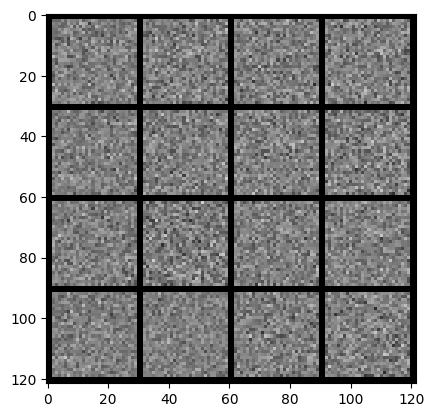

In [8]:
x,y= next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise= gen_noise(bs,z_dim)
fake= gen(noise)
show(fake)

In [9]:
#calculation of the loss:

#Generator loss

def calc_gen_loss(loss_func, gen, disc, number, z_dim):
  noise= gen_noise(number, z_dim)
  fake= gen(noise)
  pred= disc(fake)
  targets= torch.ones_like(pred)
  gen_loss= loss_func(pred, targets)
  return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
  noise= gen_noise(number, z_dim)
  fake= gen(noise)
  disc_fake= disc(fake.detach())
  disc_fake_targets= torch.zeros_like(disc_fake)
  disc_fake_loss= loss_func(disc_fake, disc_fake_targets)

  disc_real= disc(real)
  disc_real_targets= torch.ones_like(disc_real)
  disc_real_loss= loss_func(disc_real, disc_real_targets)

  disc_loss= (disc_fake_loss+disc_real_loss)/2

  return disc_loss


  0%|          | 0/469 [00:00<?, ?it/s]

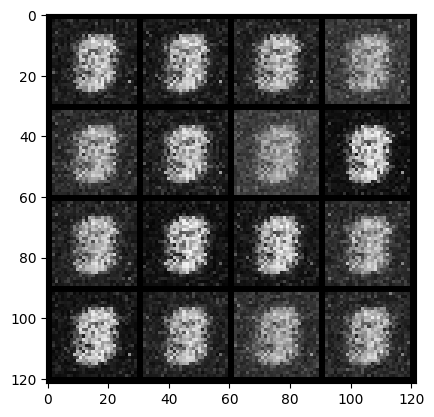

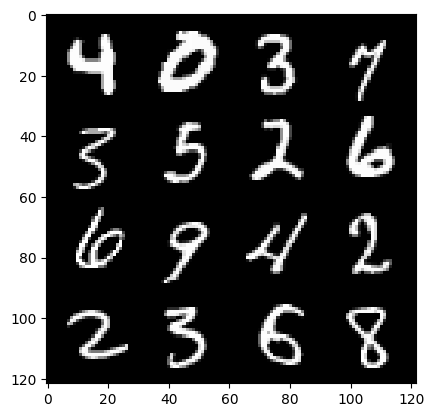

(epoch): step300/Gen loss: 1.960093561808268/disc_loss: 0.3430068051069974


  0%|          | 0/469 [00:00<?, ?it/s]

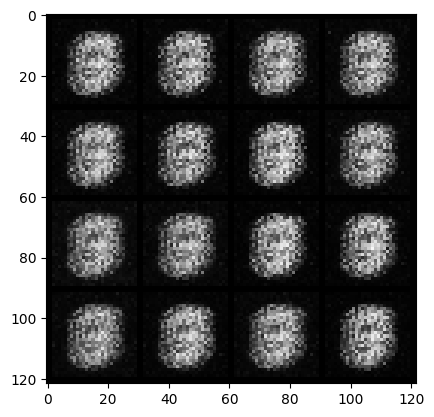

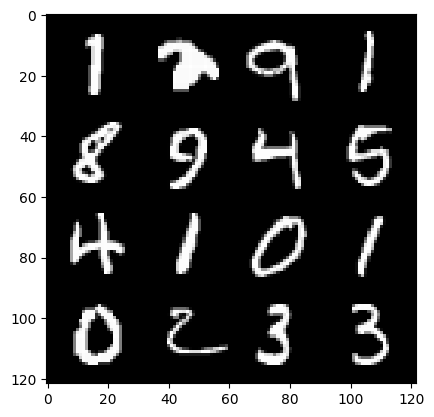

(epoch): step600/Gen loss: 3.469776642322541/disc_loss: 0.12093187501033137


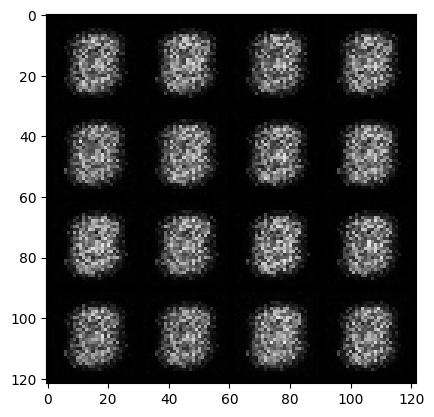

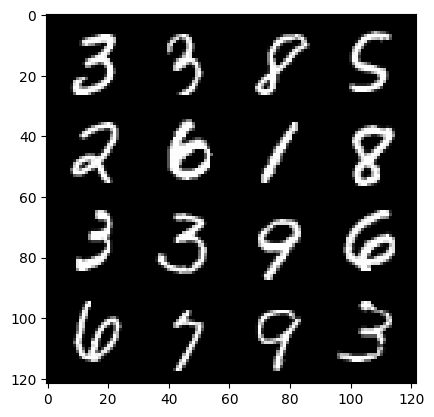

(epoch): step900/Gen loss: 3.5366790207227083/disc_loss: 0.053183375286559226


  0%|          | 0/469 [00:00<?, ?it/s]

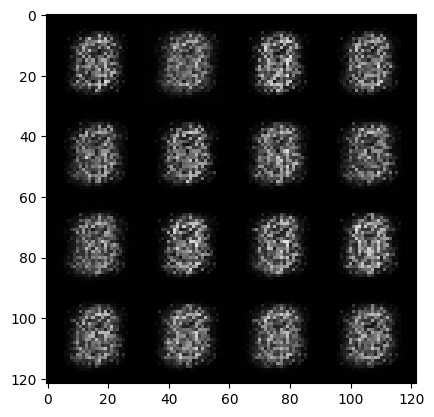

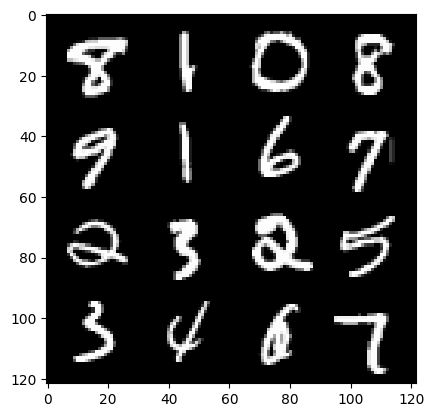

(epoch): step1200/Gen loss: 3.6277229356765757/disc_loss: 0.034258242522676806


  0%|          | 0/469 [00:00<?, ?it/s]

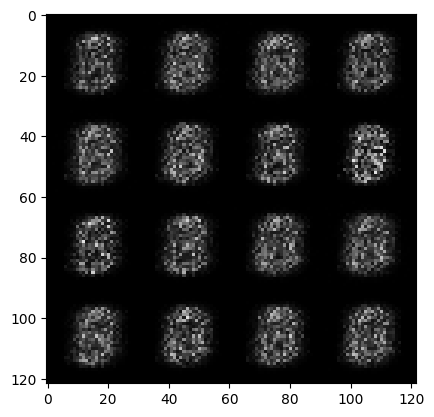

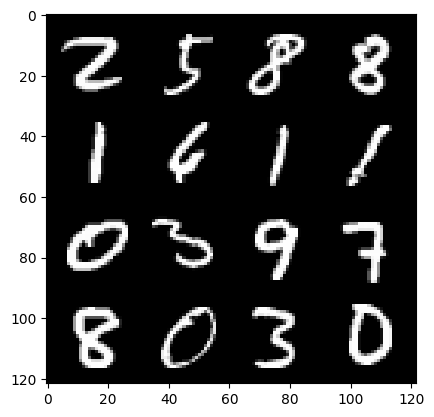

(epoch): step1500/Gen loss: 3.4804346895217915/disc_loss: 0.03776715737457076


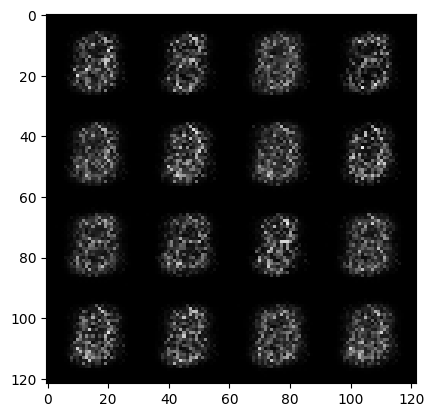

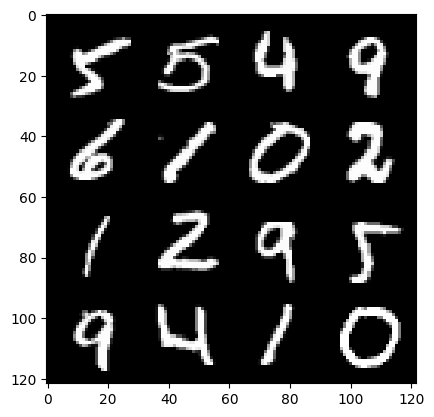

(epoch): step1800/Gen loss: 3.3171378707885757/disc_loss: 0.04976062248150507


  0%|          | 0/469 [00:00<?, ?it/s]

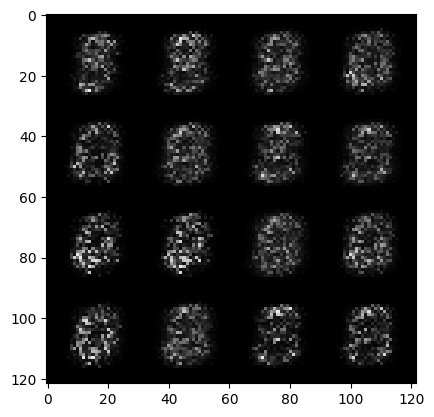

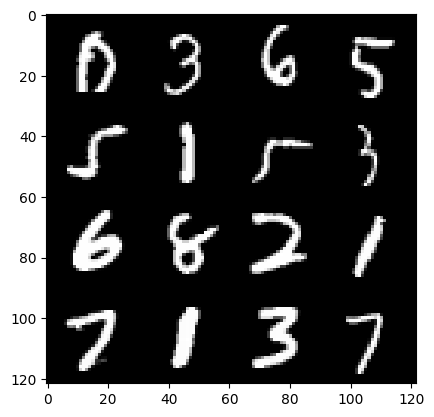

(epoch): step2100/Gen loss: 3.5220197272300737/disc_loss: 0.04857066572954258


  0%|          | 0/469 [00:00<?, ?it/s]

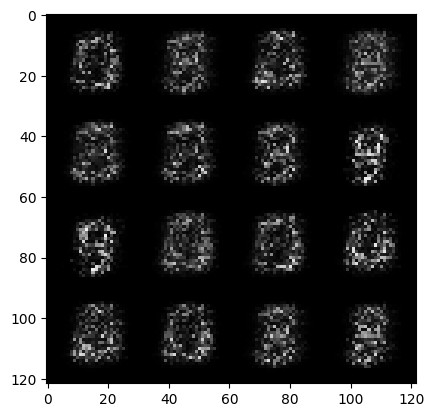

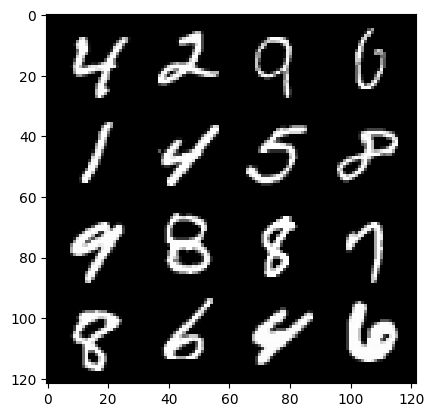

(epoch): step2400/Gen loss: 3.732497890790304/disc_loss: 0.0423201475975414


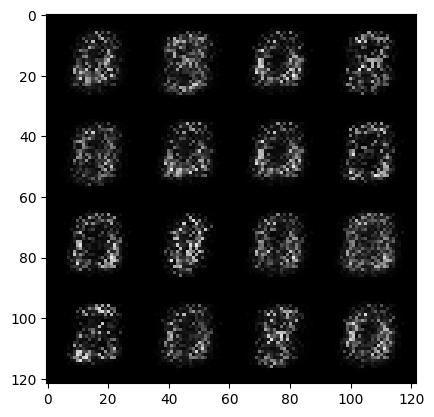

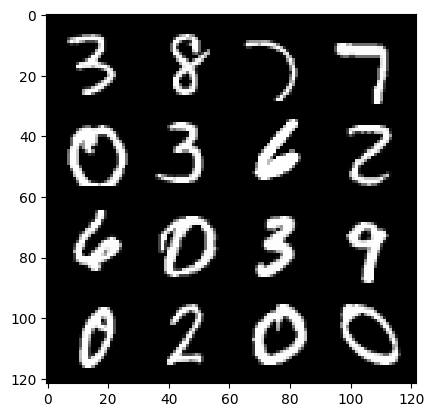

(epoch): step2700/Gen loss: 4.175793356895444/disc_loss: 0.032684674418220934


  0%|          | 0/469 [00:00<?, ?it/s]

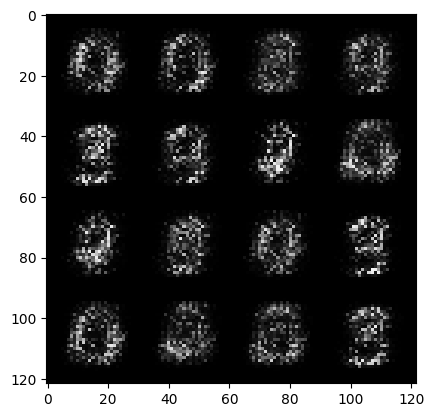

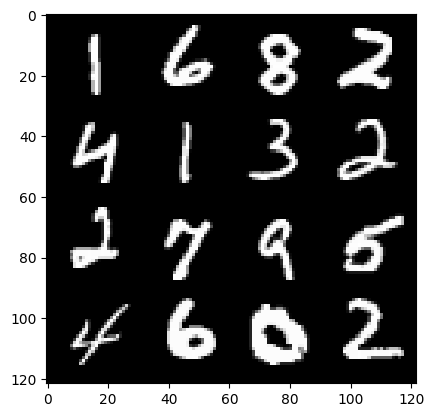

(epoch): step3000/Gen loss: 4.693675967852275/disc_loss: 0.027630187924951338


  0%|          | 0/469 [00:00<?, ?it/s]

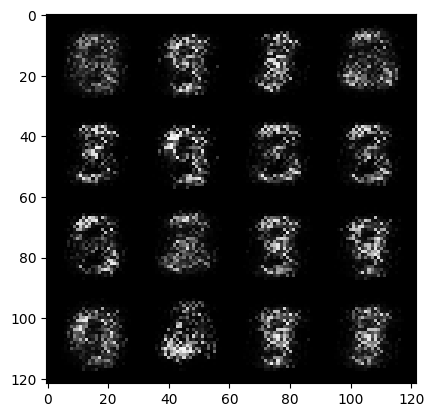

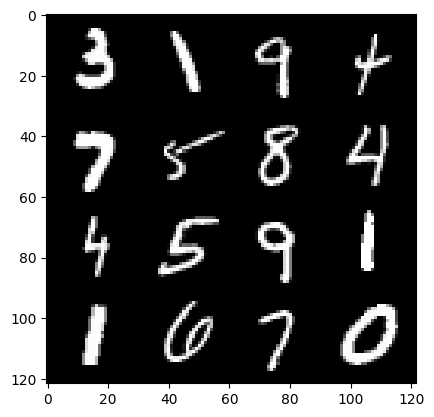

(epoch): step3300/Gen loss: 4.771472280820211/disc_loss: 0.027601287141442256


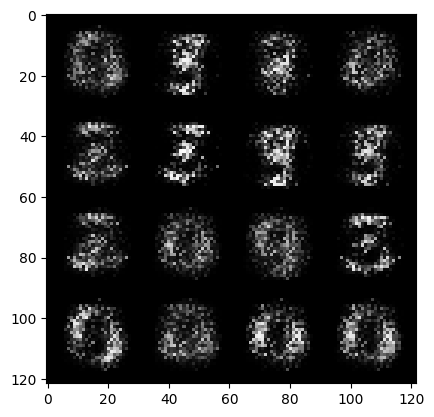

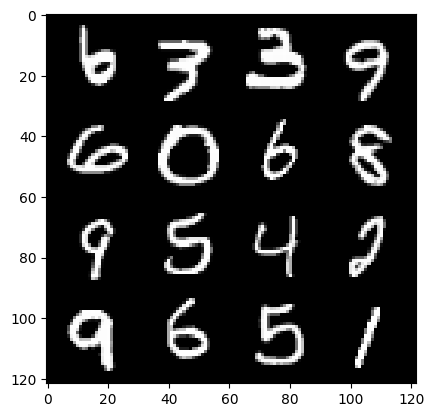

(epoch): step3600/Gen loss: 4.9967341931661/disc_loss: 0.025078774699941266


  0%|          | 0/469 [00:00<?, ?it/s]

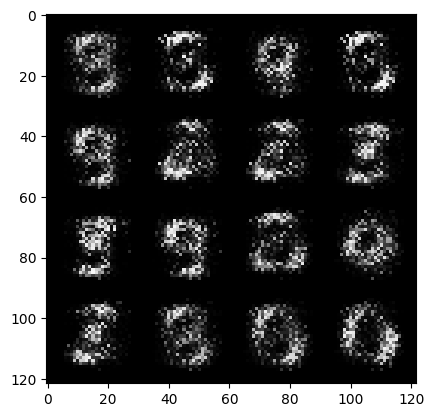

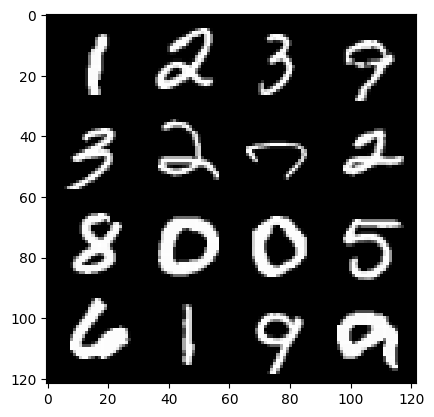

(epoch): step3900/Gen loss: 5.362740063667299/disc_loss: 0.026216192068532096


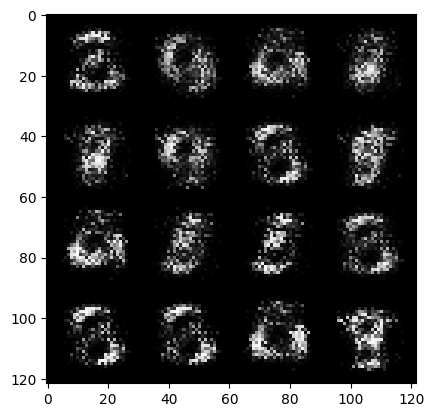

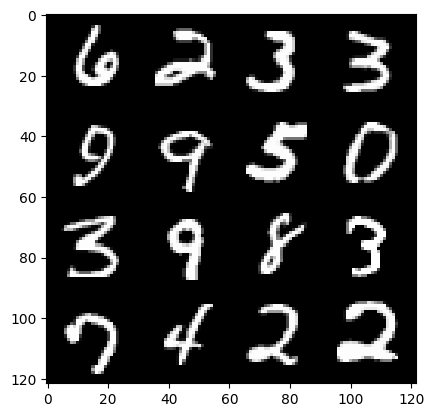

(epoch): step4200/Gen loss: 5.869433369636541/disc_loss: 0.02289511866246661


  0%|          | 0/469 [00:00<?, ?it/s]

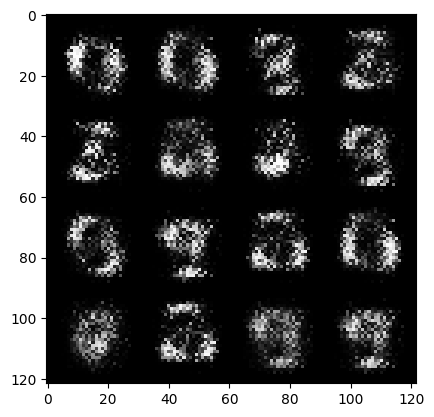

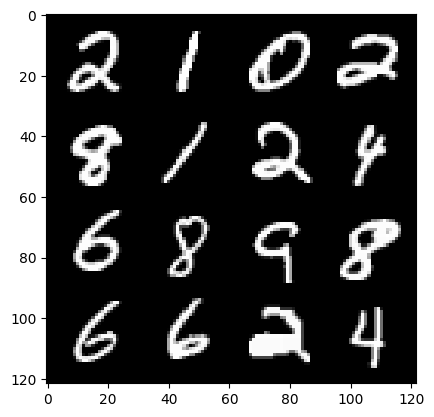

(epoch): step4500/Gen loss: 5.603457662264508/disc_loss: 0.023898780851935343


  0%|          | 0/469 [00:00<?, ?it/s]

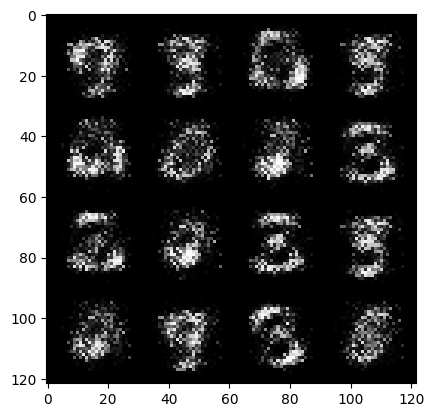

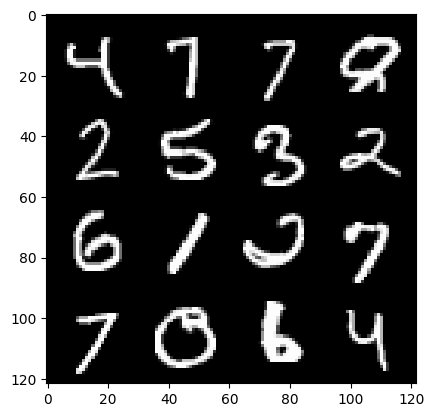

(epoch): step4800/Gen loss: 5.755898187955217/disc_loss: 0.0182640926570942


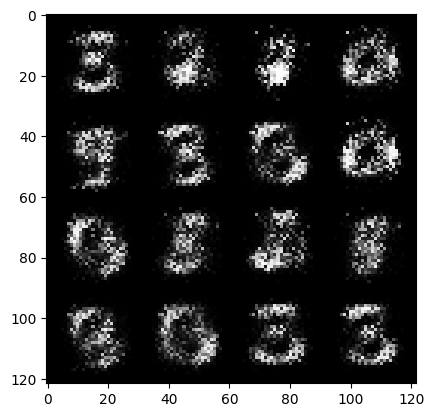

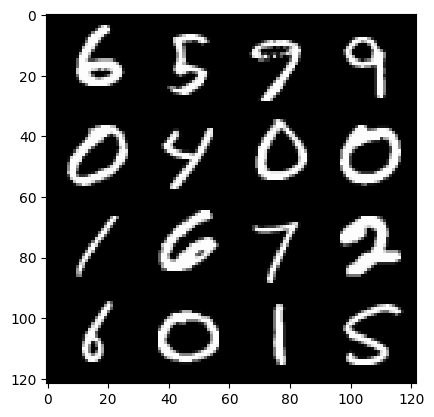

(epoch): step5100/Gen loss: 5.947050725618999/disc_loss: 0.01553032426939656


  0%|          | 0/469 [00:00<?, ?it/s]

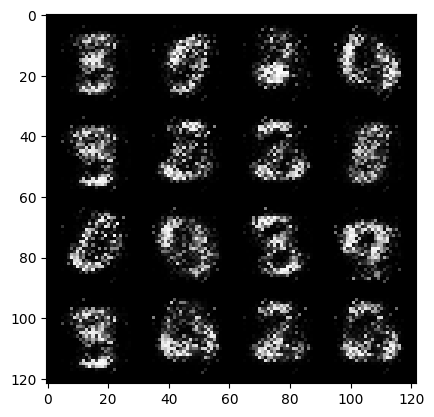

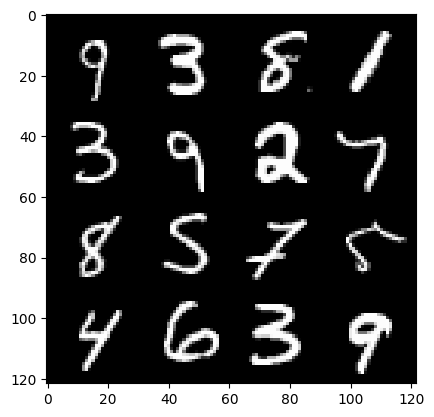

(epoch): step5400/Gen loss: 6.054412412643436/disc_loss: 0.012816132626806698


  0%|          | 0/469 [00:00<?, ?it/s]

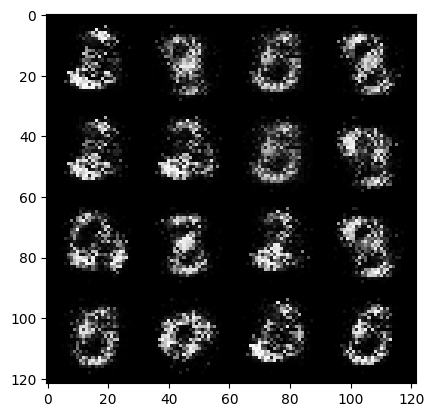

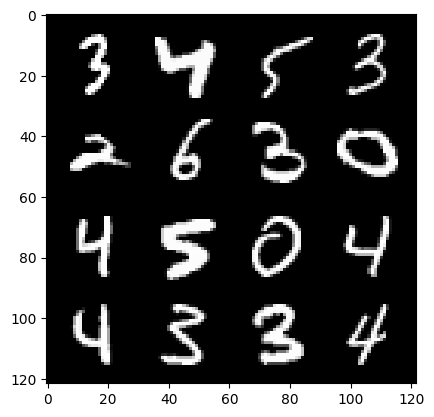

(epoch): step5700/Gen loss: 6.323463578224182/disc_loss: 0.012821397801550727


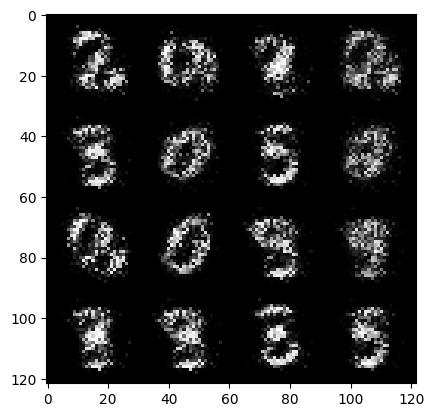

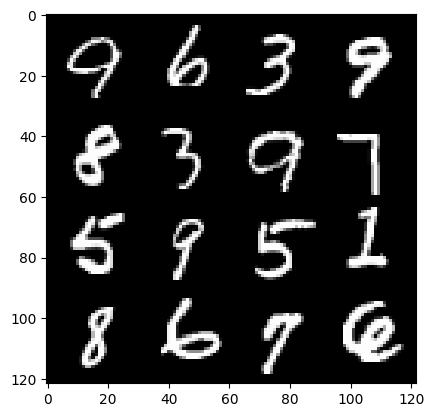

(epoch): step6000/Gen loss: 6.170106883049008/disc_loss: 0.01403968357015401


  0%|          | 0/469 [00:00<?, ?it/s]

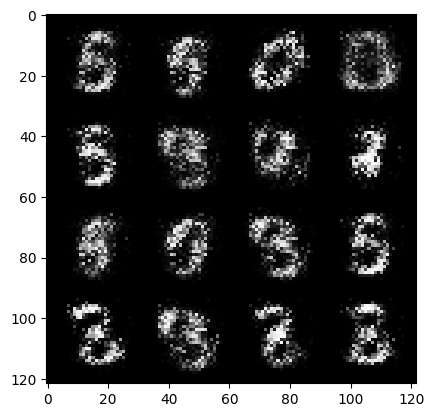

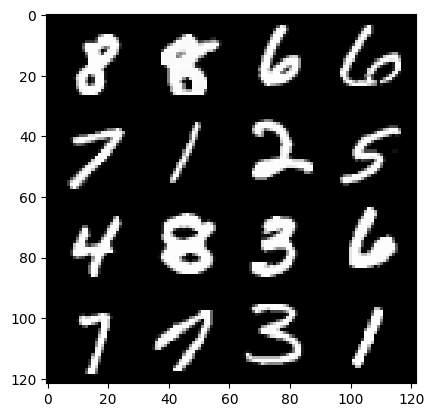

(epoch): step6300/Gen loss: 6.403367015520739/disc_loss: 0.013376235580847906


  0%|          | 0/469 [00:00<?, ?it/s]

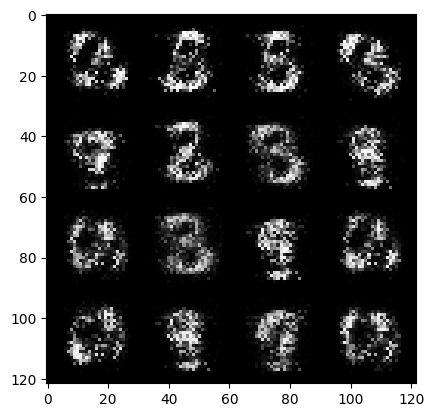

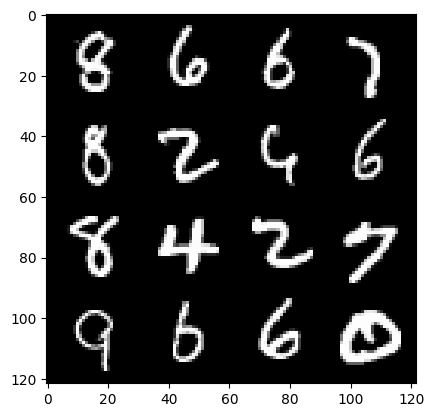

(epoch): step6600/Gen loss: 6.348713440895077/disc_loss: 0.01537462855999668


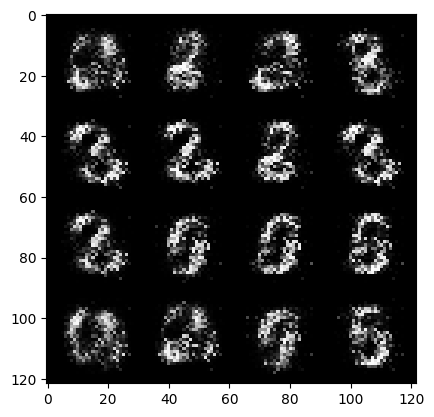

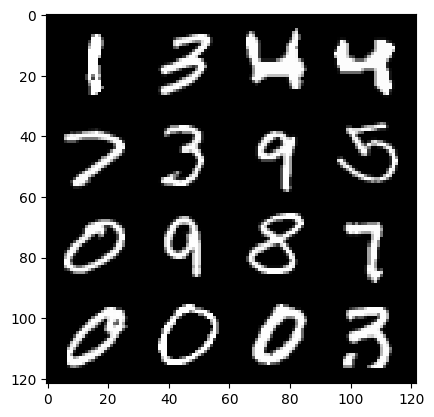

(epoch): step6900/Gen loss: 6.344993046124773/disc_loss: 0.012974599113998328


  0%|          | 0/469 [00:00<?, ?it/s]

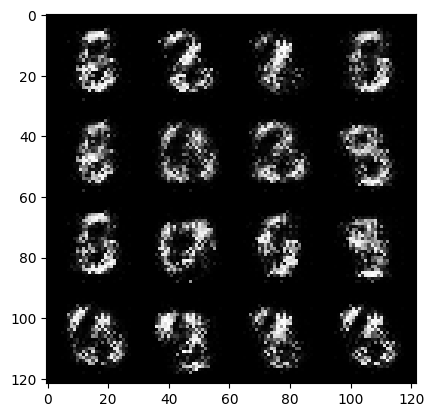

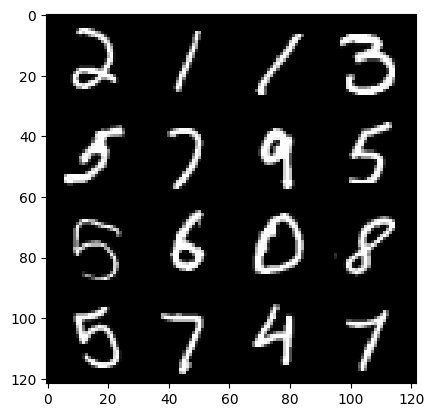

(epoch): step7200/Gen loss: 7.1056725613276175/disc_loss: 0.01291525987675414


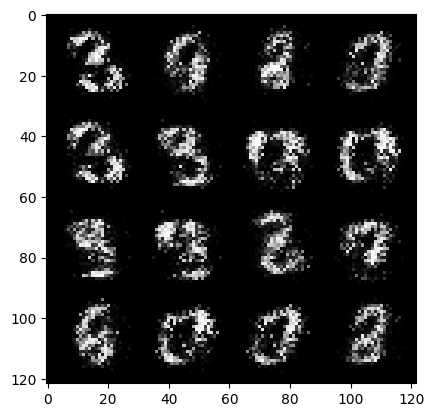

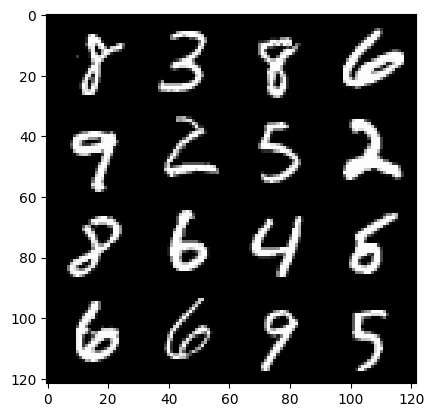

(epoch): step7500/Gen loss: 6.754398932456969/disc_loss: 0.014064440789322062


  0%|          | 0/469 [00:00<?, ?it/s]

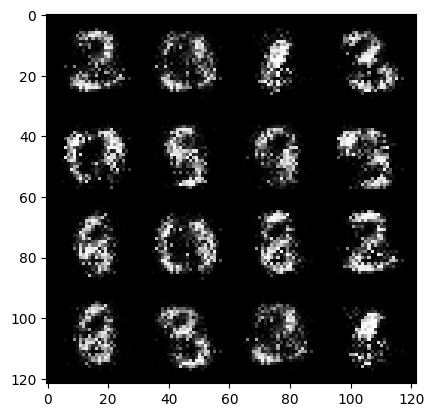

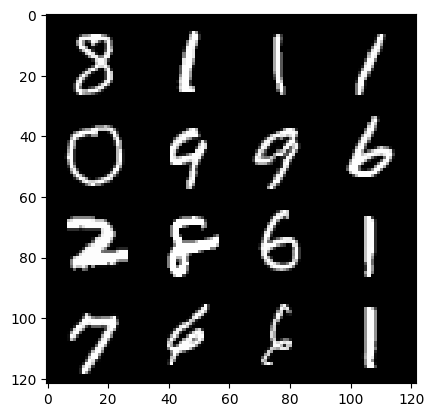

(epoch): step7800/Gen loss: 6.731774431864426/disc_loss: 0.011938556713672976


  0%|          | 0/469 [00:00<?, ?it/s]

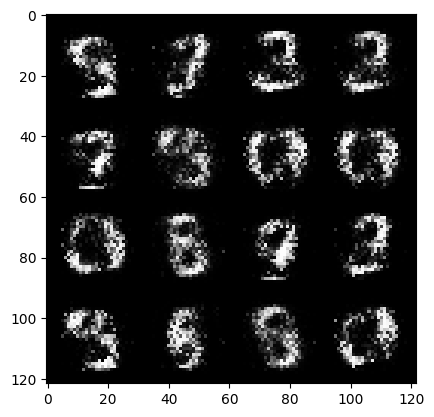

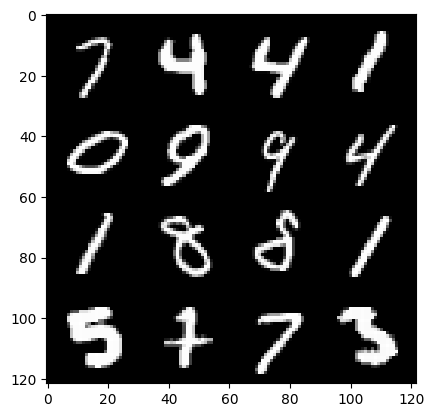

(epoch): step8100/Gen loss: 6.953679620424907/disc_loss: 0.012915263697505003


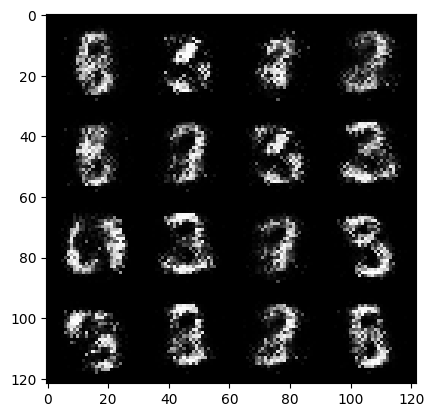

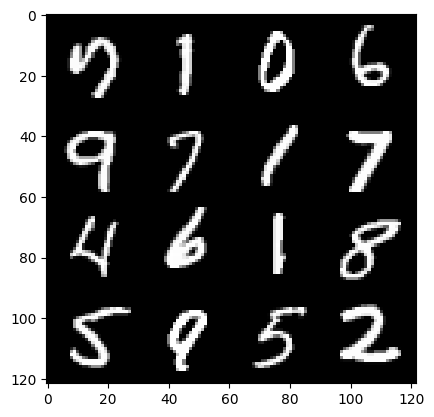

(epoch): step8400/Gen loss: 6.5756009022394855/disc_loss: 0.015154859290147822


  0%|          | 0/469 [00:00<?, ?it/s]

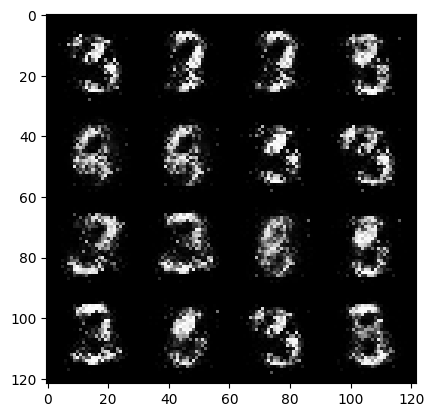

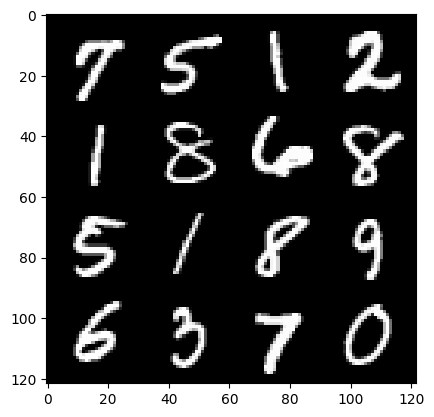

(epoch): step8700/Gen loss: 6.900360264778139/disc_loss: 0.013305625645443794


  0%|          | 0/469 [00:00<?, ?it/s]

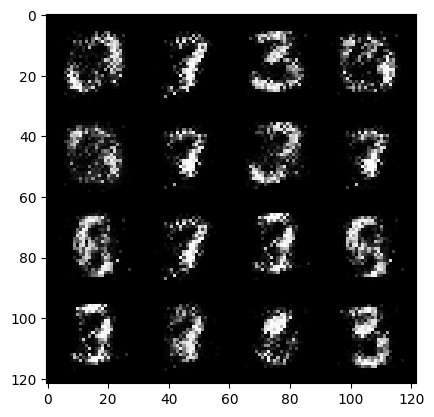

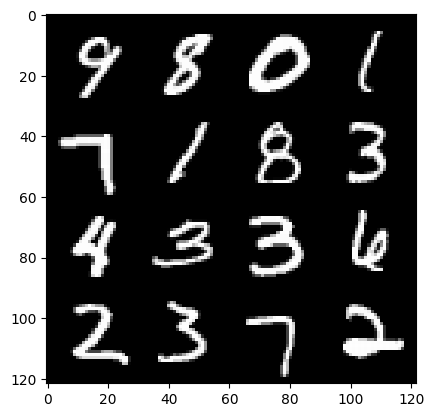

(epoch): step9000/Gen loss: 6.941261019706729/disc_loss: 0.011685256424049531


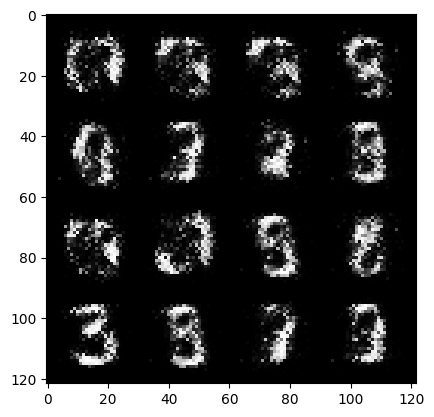

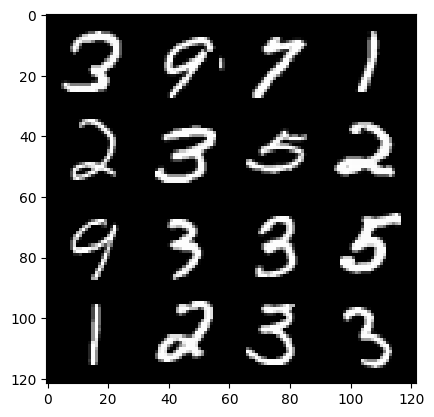

(epoch): step9300/Gen loss: 6.811924309730531/disc_loss: 0.013565606023184957


  0%|          | 0/469 [00:00<?, ?it/s]

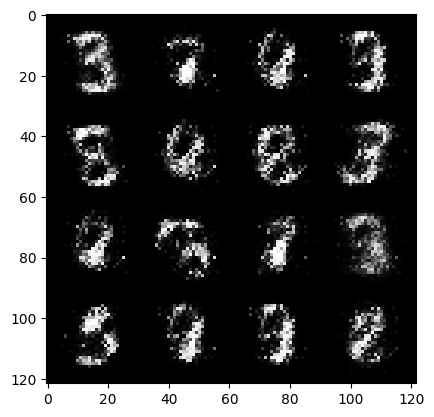

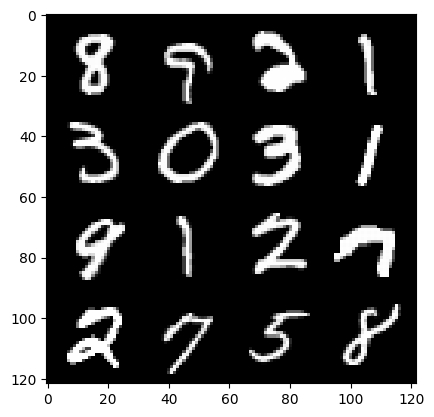

(epoch): step9600/Gen loss: 6.8498535394668565/disc_loss: 0.01352381077051784


  0%|          | 0/469 [00:00<?, ?it/s]

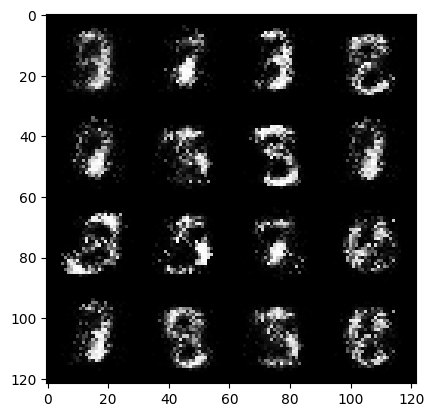

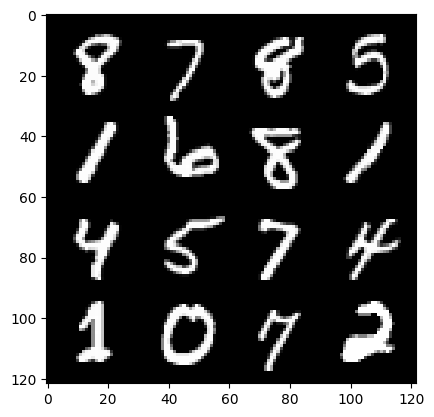

(epoch): step9900/Gen loss: 6.958478136062625/disc_loss: 0.013036371112490695


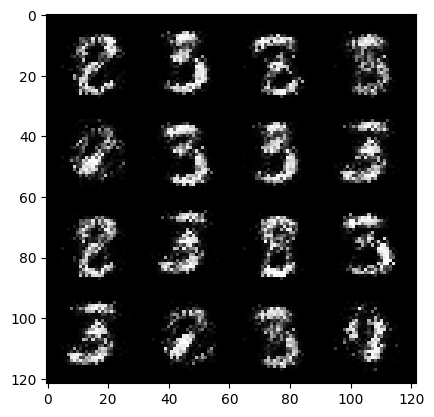

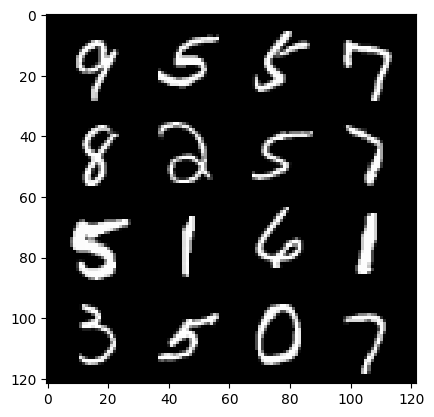

(epoch): step10200/Gen loss: 6.6197012265523245/disc_loss: 0.015809385788937407


  0%|          | 0/469 [00:00<?, ?it/s]

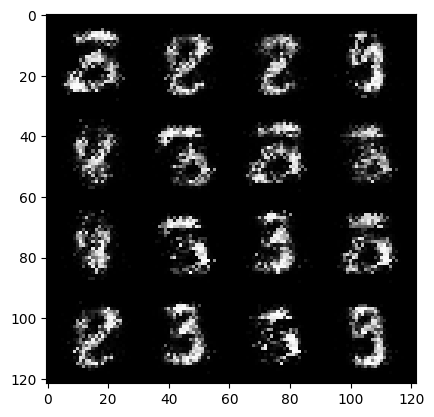

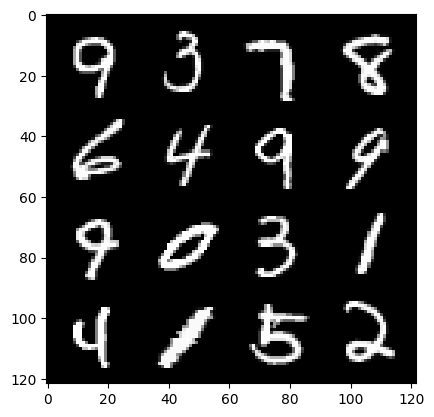

(epoch): step10500/Gen loss: 6.404950529734291/disc_loss: 0.01802974016095201


  0%|          | 0/469 [00:00<?, ?it/s]

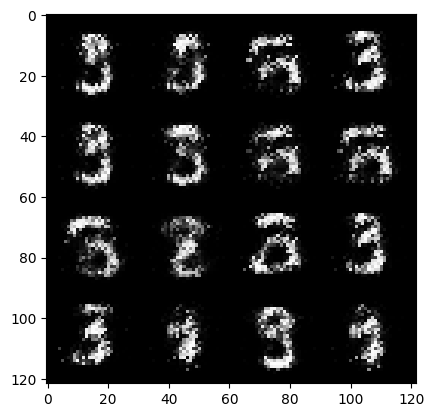

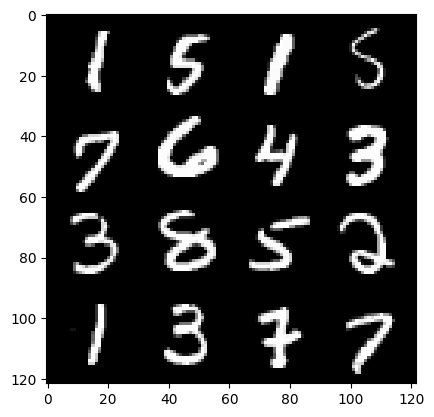

(epoch): step10800/Gen loss: 6.720188727378839/disc_loss: 0.016990600726567197


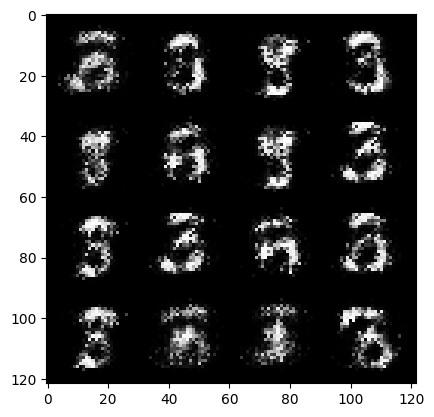

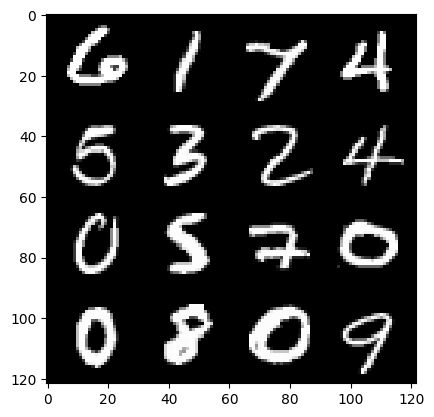

(epoch): step11100/Gen loss: 6.403120538393657/disc_loss: 0.018633646982101095


  0%|          | 0/469 [00:00<?, ?it/s]

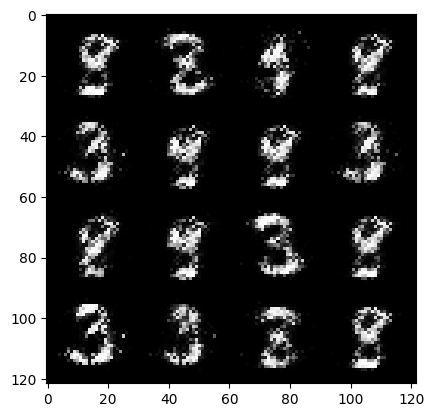

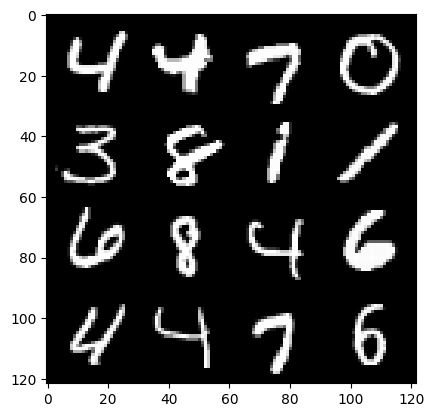

(epoch): step11400/Gen loss: 6.985076950391133/disc_loss: 0.01849004832562059


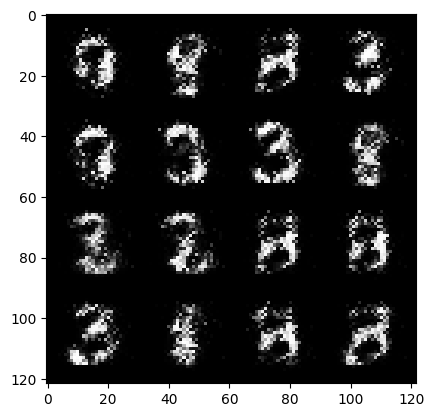

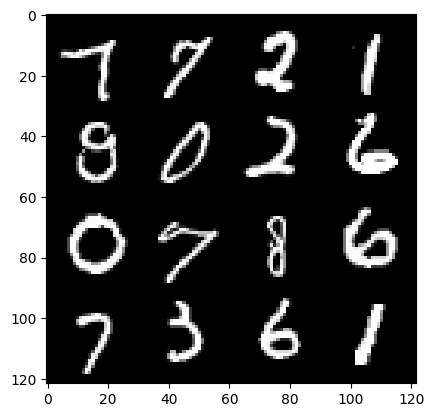

(epoch): step11700/Gen loss: 6.7826186402638715/disc_loss: 0.018410844317016496


  0%|          | 0/469 [00:00<?, ?it/s]

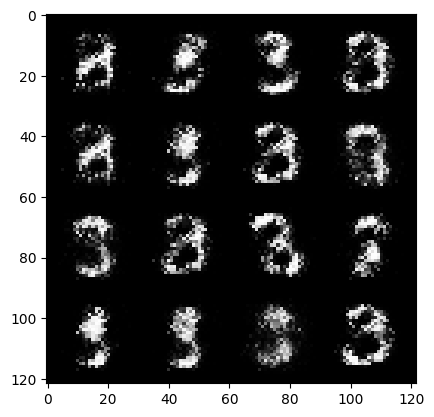

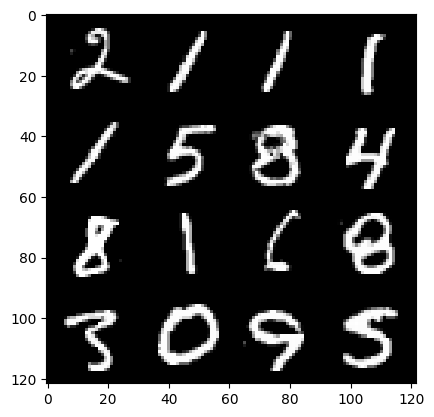

(epoch): step12000/Gen loss: 6.606603107452391/disc_loss: 0.017137847351841626


  0%|          | 0/469 [00:00<?, ?it/s]

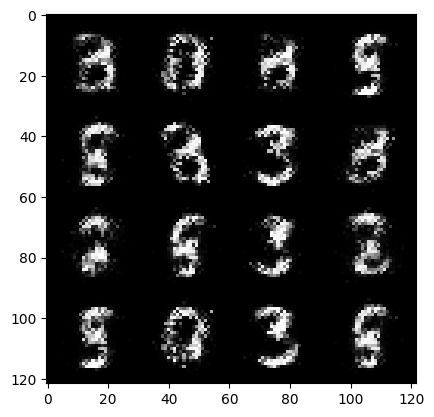

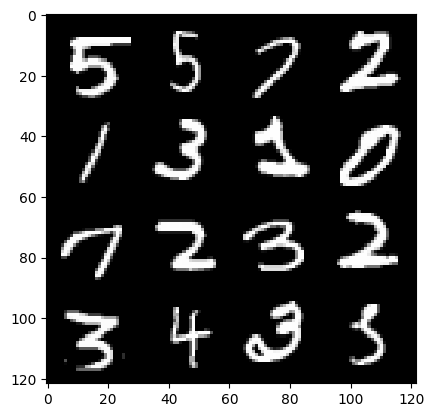

(epoch): step12300/Gen loss: 6.667952733039855/disc_loss: 0.017994355019958077


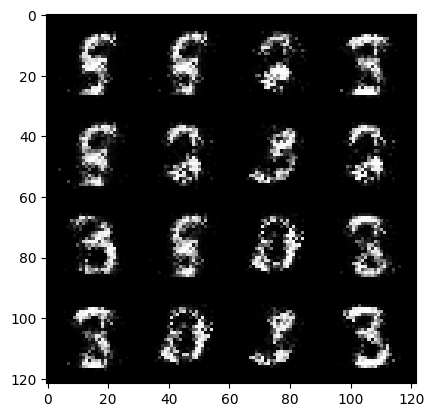

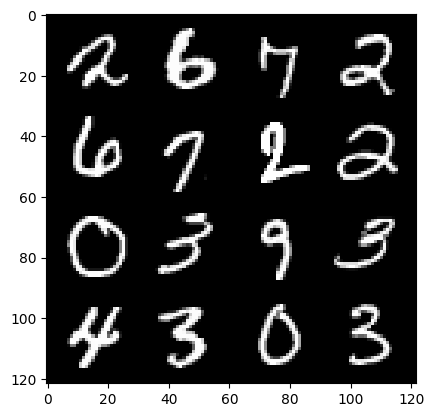

(epoch): step12600/Gen loss: 6.731984729766846/disc_loss: 0.02059459143628678


  0%|          | 0/469 [00:00<?, ?it/s]

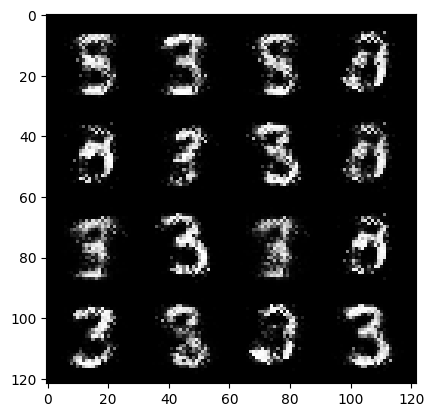

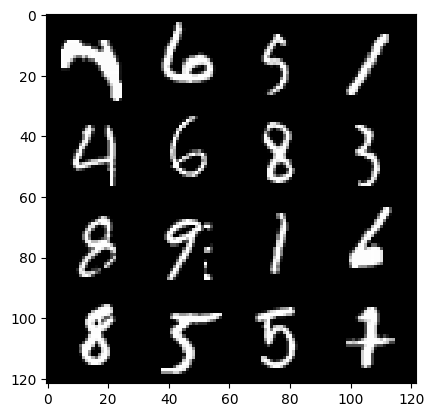

(epoch): step12900/Gen loss: 6.273094264666239/disc_loss: 0.02181393580045551


  0%|          | 0/469 [00:00<?, ?it/s]

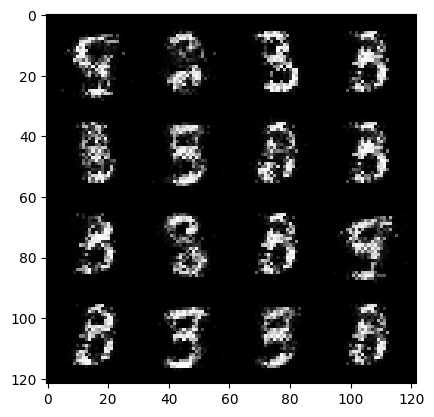

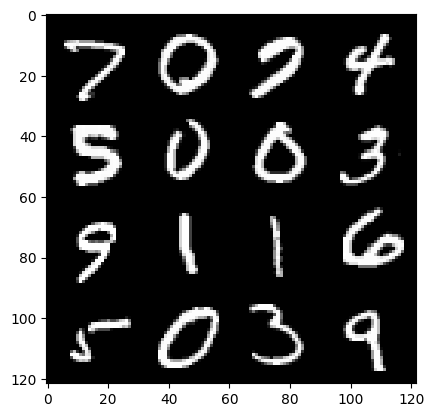

(epoch): step13200/Gen loss: 6.345684725443524/disc_loss: 0.019075177945196625


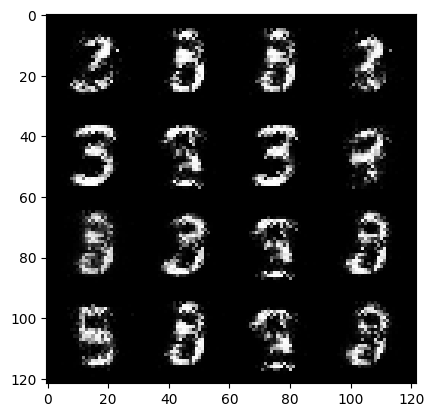

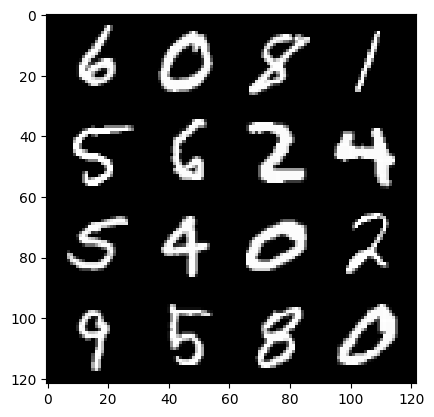

(epoch): step13500/Gen loss: 6.298622622489926/disc_loss: 0.01993906707968562


  0%|          | 0/469 [00:00<?, ?it/s]

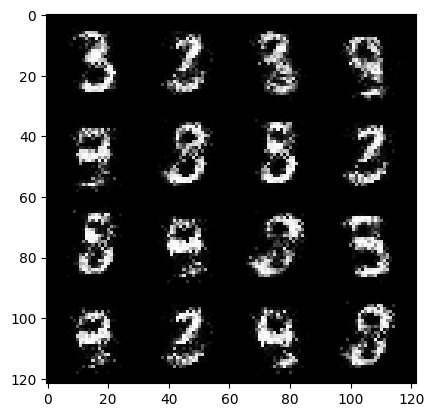

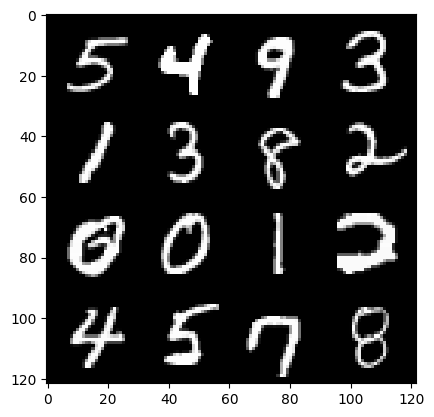

(epoch): step13800/Gen loss: 6.376038578351343/disc_loss: 0.020427923143530875


  0%|          | 0/469 [00:00<?, ?it/s]

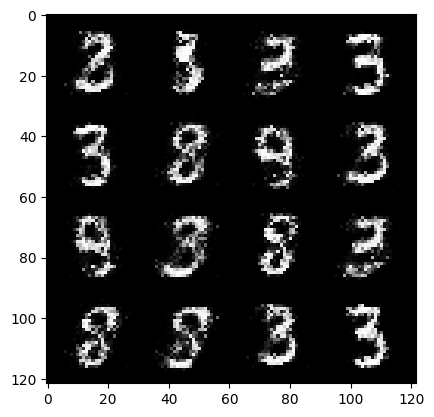

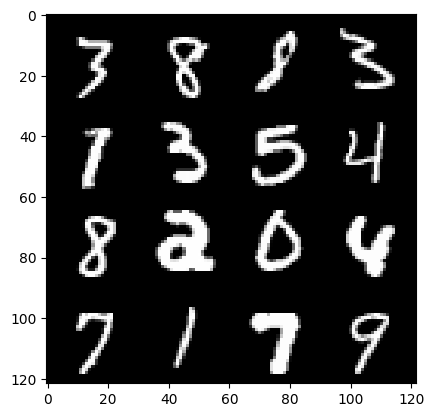

(epoch): step14100/Gen loss: 6.235546585718793/disc_loss: 0.01925629005379353


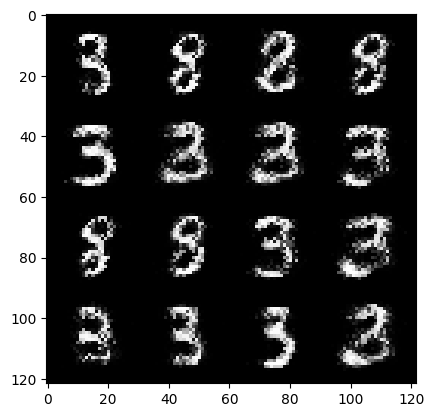

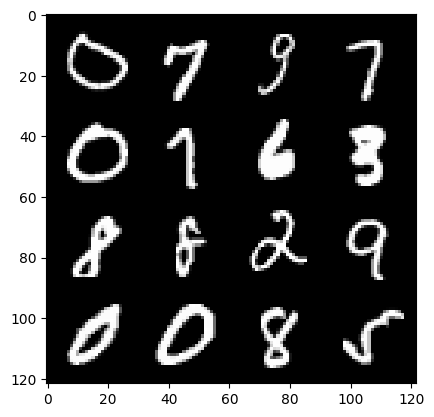

(epoch): step14400/Gen loss: 5.89670689423879/disc_loss: 0.02079670957444857


  0%|          | 0/469 [00:00<?, ?it/s]

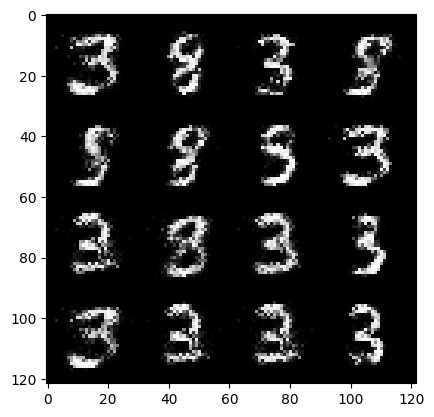

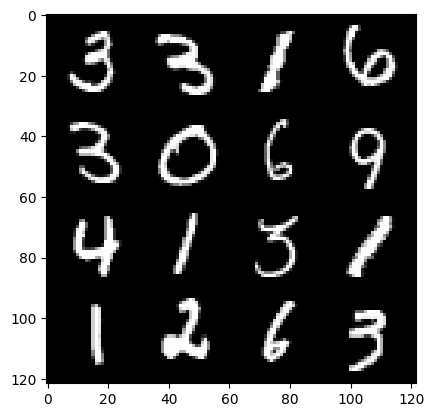

(epoch): step14700/Gen loss: 6.041083652178447/disc_loss: 0.023718104537886874


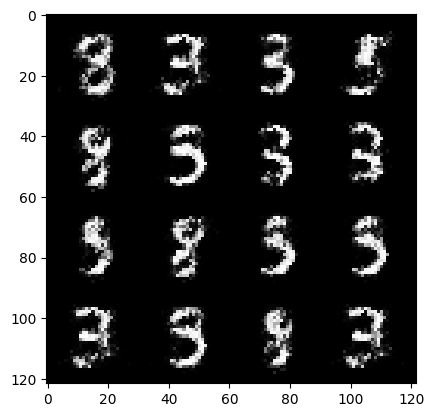

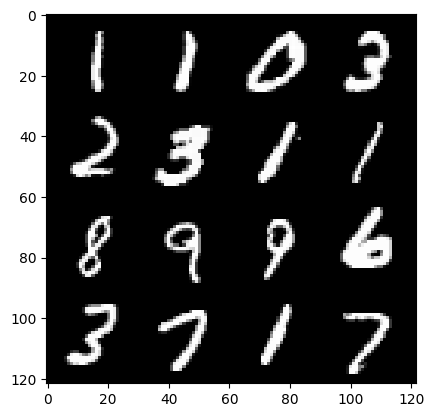

(epoch): step15000/Gen loss: 6.283548723856603/disc_loss: 0.02574993925945212


  0%|          | 0/469 [00:00<?, ?it/s]

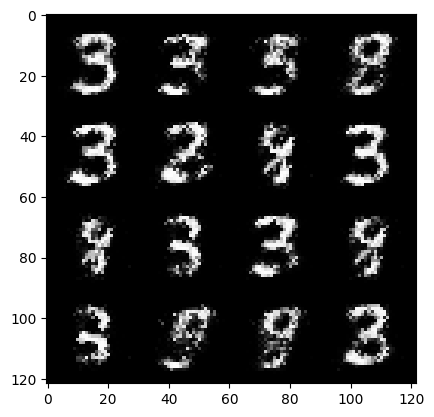

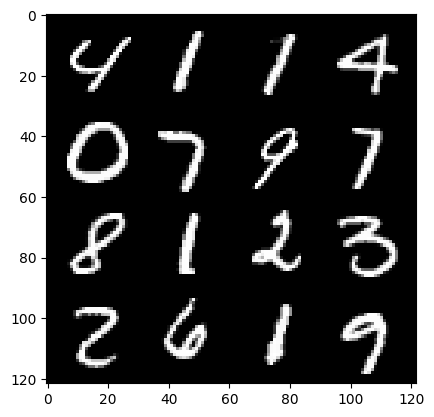

(epoch): step15300/Gen loss: 5.910875387191774/disc_loss: 0.02828436943391957


  0%|          | 0/469 [00:00<?, ?it/s]

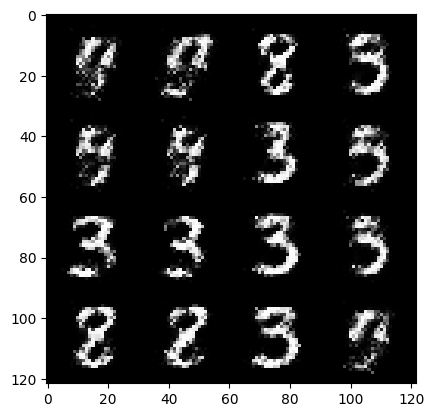

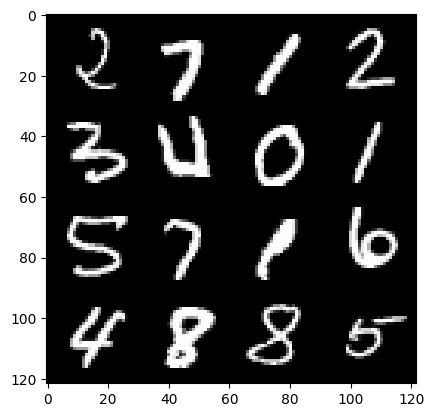

(epoch): step15600/Gen loss: 6.167992173830667/disc_loss: 0.02533740152294437


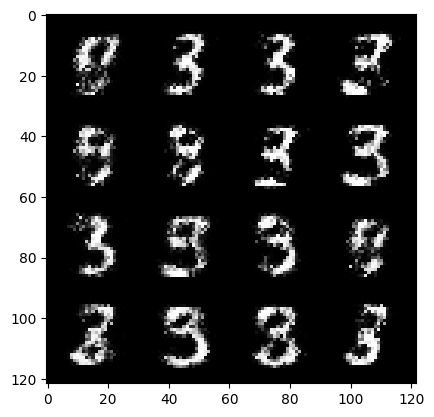

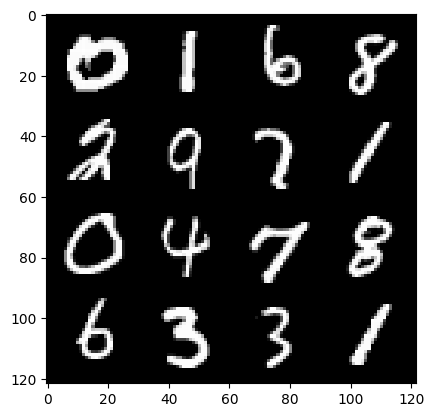

(epoch): step15900/Gen loss: 5.72138685385386/disc_loss: 0.028273741044104104


  0%|          | 0/469 [00:00<?, ?it/s]

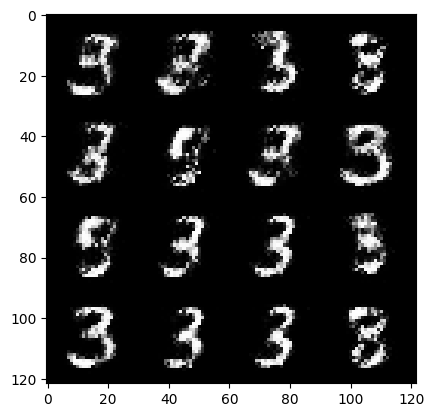

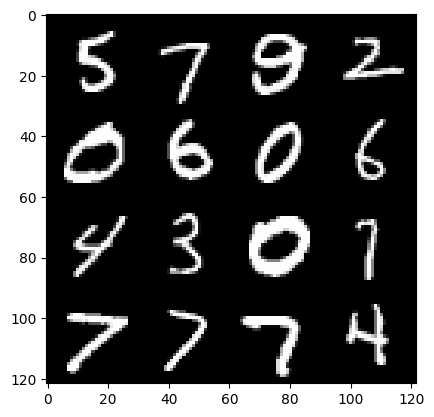

(epoch): step16200/Gen loss: 5.897572558720908/disc_loss: 0.02939997251921643


  0%|          | 0/469 [00:00<?, ?it/s]

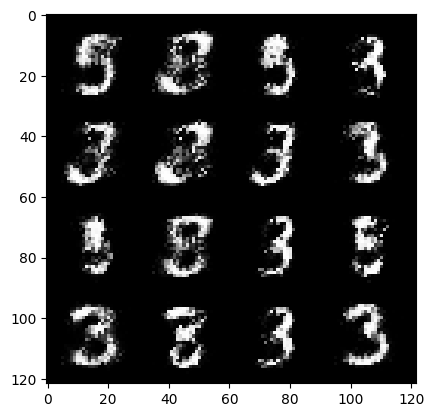

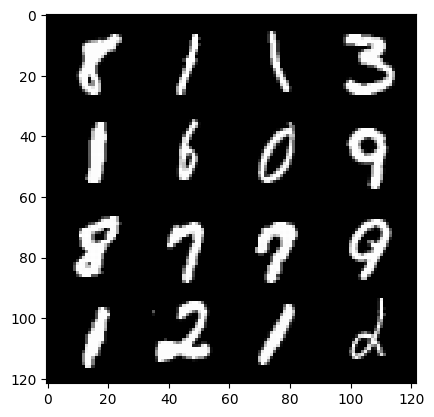

(epoch): step16500/Gen loss: 5.870575160980227/disc_loss: 0.027036159375372026


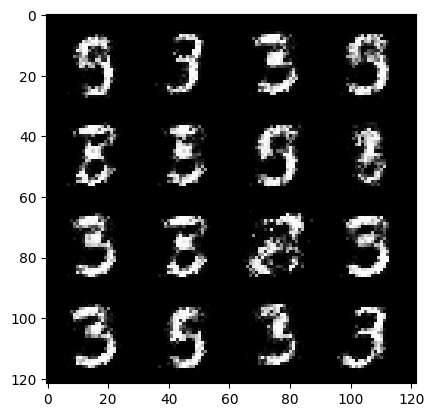

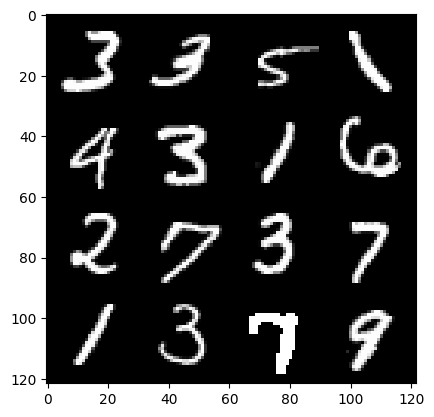

(epoch): step16800/Gen loss: 6.194806318283078/disc_loss: 0.02688057233501847


  0%|          | 0/469 [00:00<?, ?it/s]

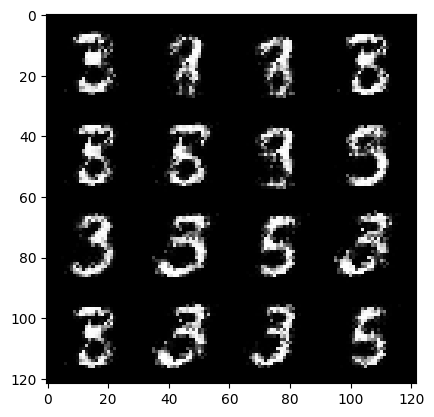

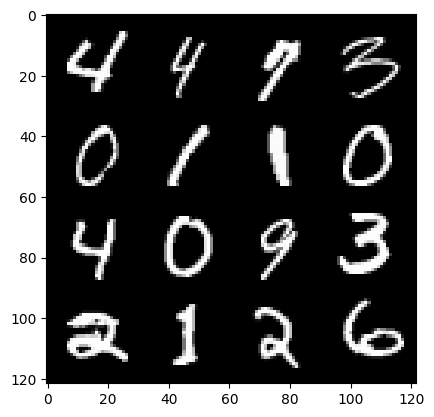

(epoch): step17100/Gen loss: 5.961825618743895/disc_loss: 0.030212865484257553


  0%|          | 0/469 [00:00<?, ?it/s]

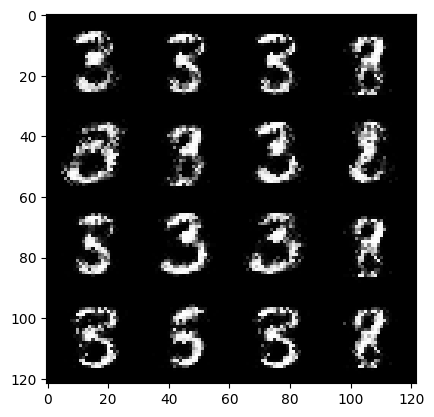

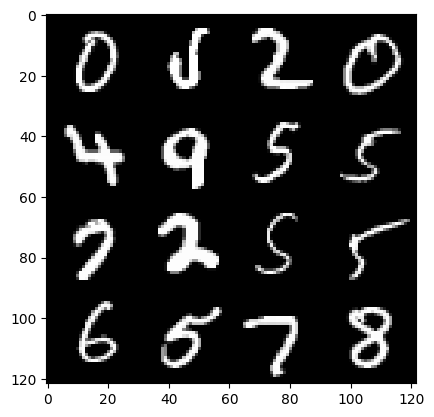

(epoch): step17400/Gen loss: 6.139461460113527/disc_loss: 0.03203946089372039


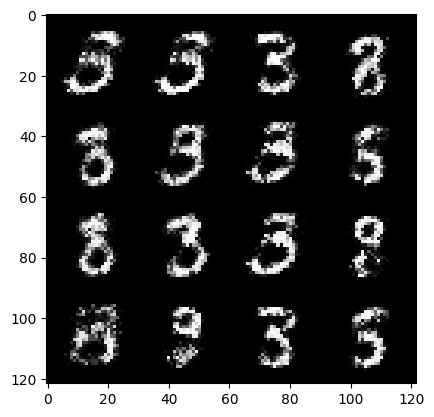

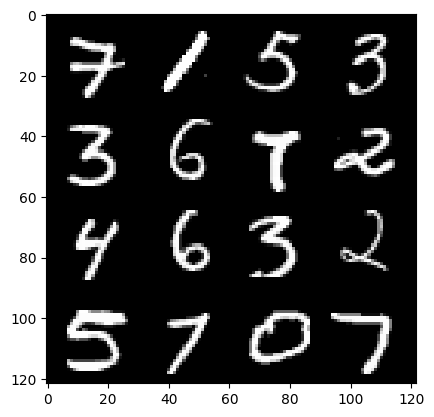

(epoch): step17700/Gen loss: 5.932726062138873/disc_loss: 0.03007771506439895


  0%|          | 0/469 [00:00<?, ?it/s]

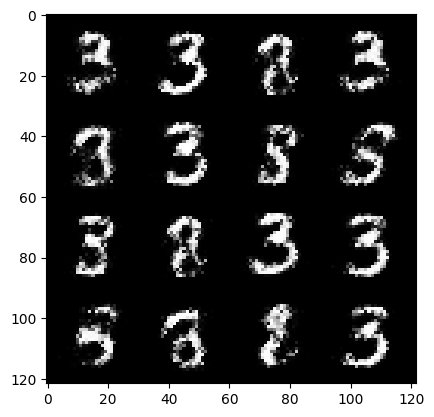

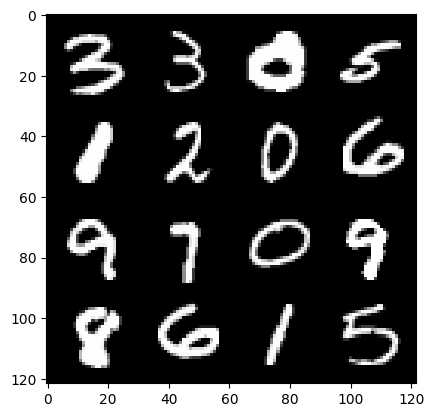

(epoch): step18000/Gen loss: 6.0513018830617264/disc_loss: 0.03254620163391031


  0%|          | 0/469 [00:00<?, ?it/s]

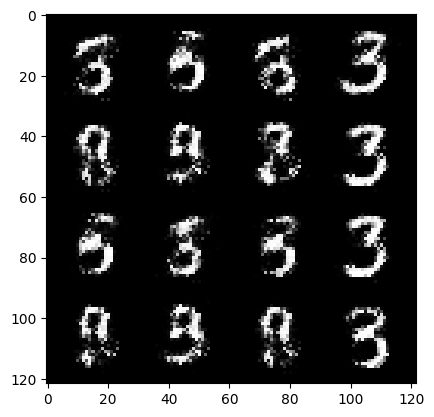

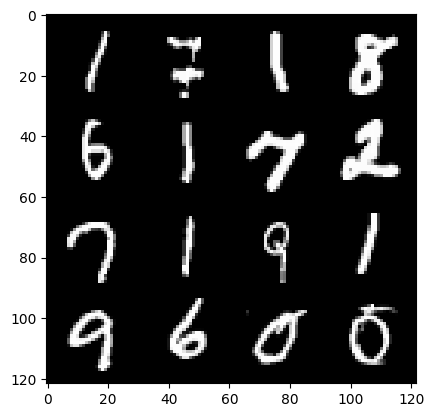

(epoch): step18300/Gen loss: 5.907970932324723/disc_loss: 0.031678746123798174


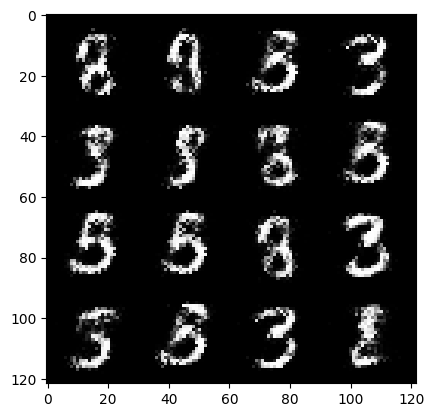

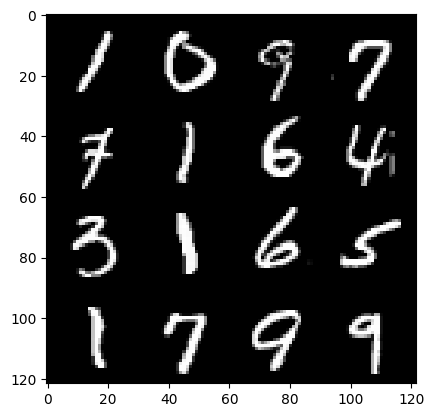

(epoch): step18600/Gen loss: 5.863095366160077/disc_loss: 0.031020839999740323


  0%|          | 0/469 [00:00<?, ?it/s]

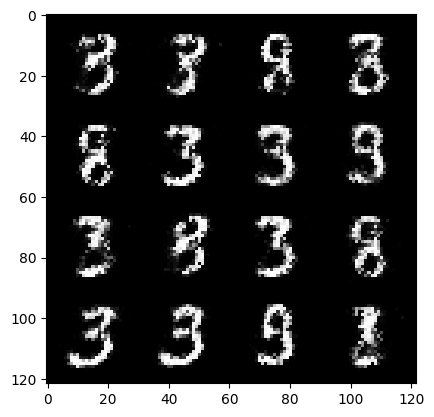

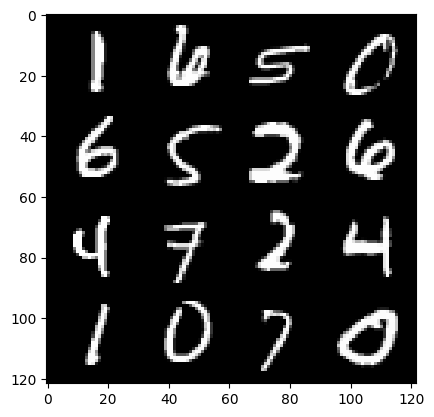

(epoch): step18900/Gen loss: 5.774667832056683/disc_loss: 0.037558491998352074


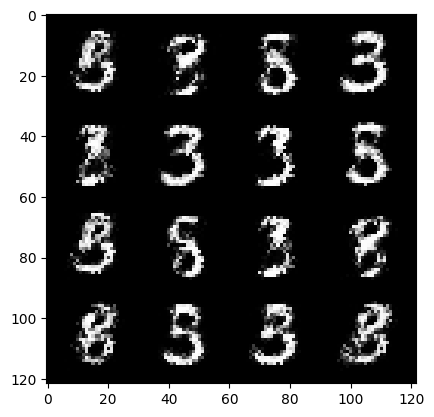

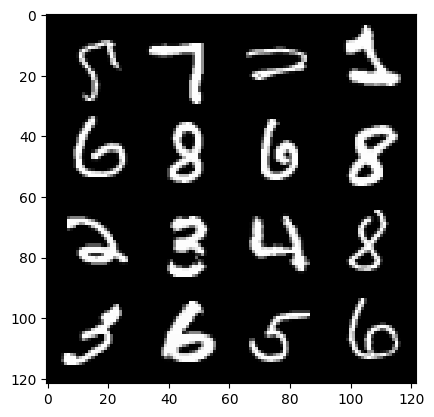

(epoch): step19200/Gen loss: 5.7026579840978/disc_loss: 0.03486566846414156


  0%|          | 0/469 [00:00<?, ?it/s]

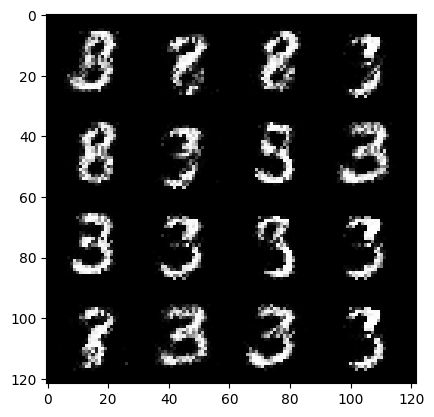

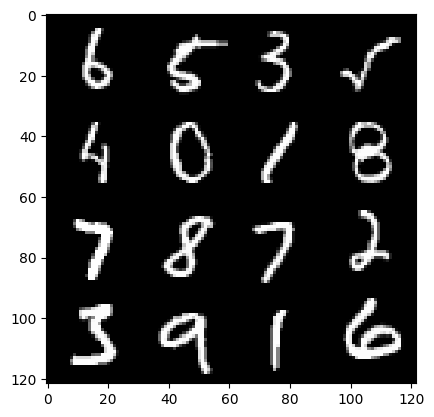

(epoch): step19500/Gen loss: 5.781177388827003/disc_loss: 0.03774798336749276


  0%|          | 0/469 [00:00<?, ?it/s]

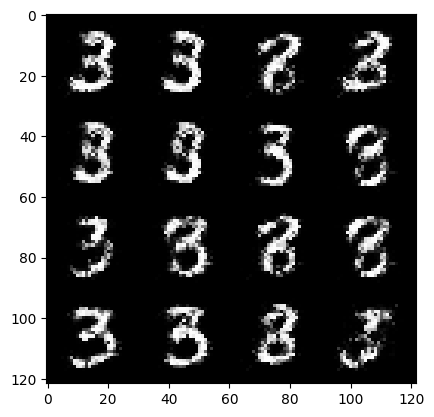

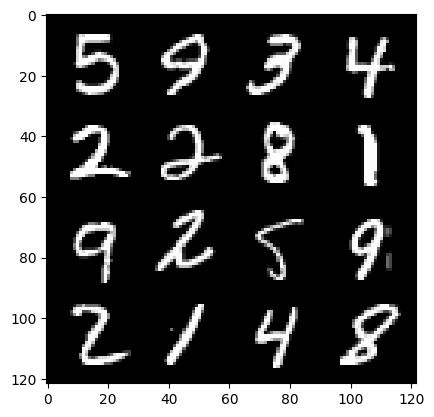

(epoch): step19800/Gen loss: 5.409029695987698/disc_loss: 0.04049606282884876


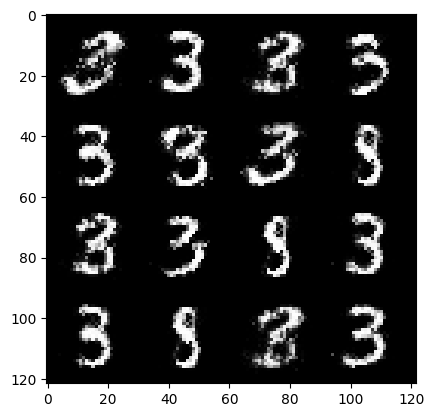

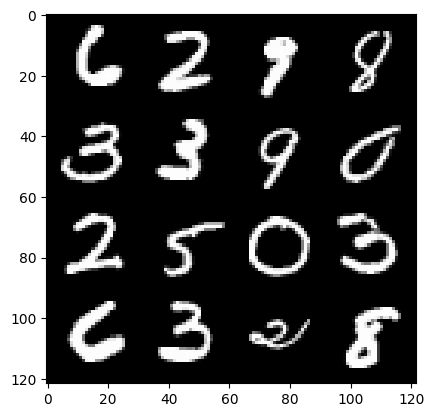

(epoch): step20100/Gen loss: 5.835656729539233/disc_loss: 0.04010126209041724


  0%|          | 0/469 [00:00<?, ?it/s]

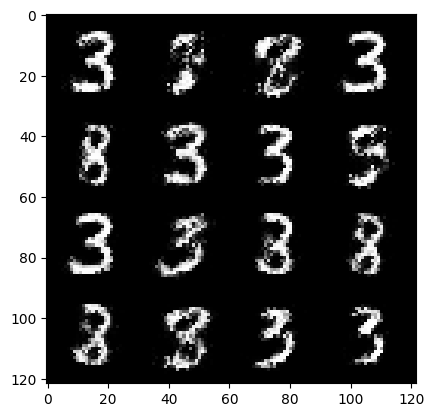

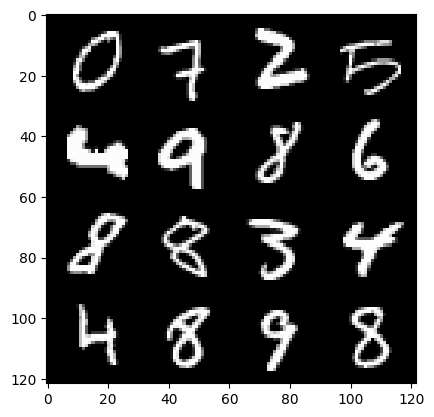

(epoch): step20400/Gen loss: 5.7385616413752265/disc_loss: 0.053215874186716985


  0%|          | 0/469 [00:00<?, ?it/s]

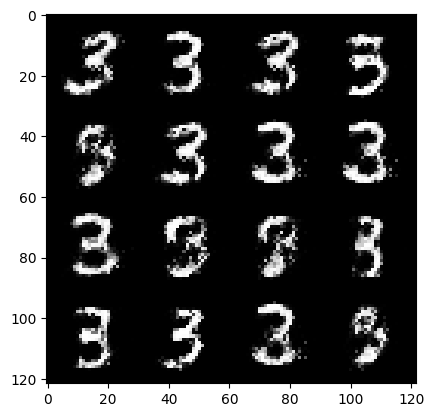

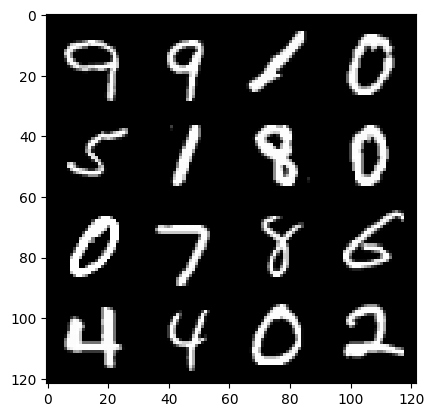

(epoch): step20700/Gen loss: 5.387113730907442/disc_loss: 0.05455373581498862


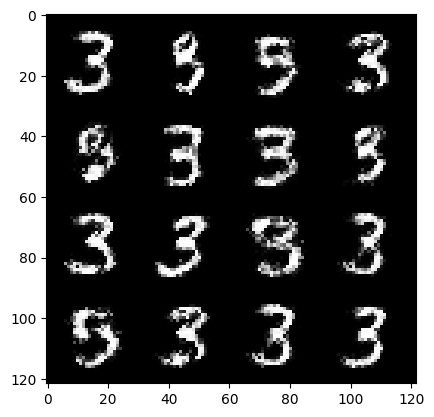

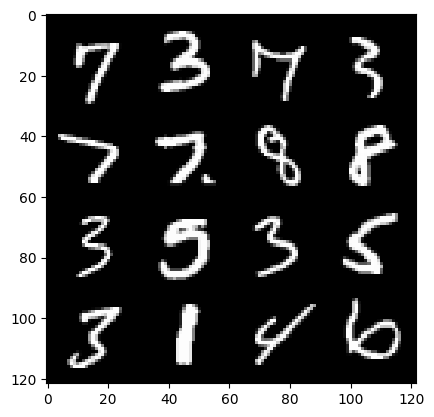

(epoch): step21000/Gen loss: 5.50224909305573/disc_loss: 0.040682756050179396


  0%|          | 0/469 [00:00<?, ?it/s]

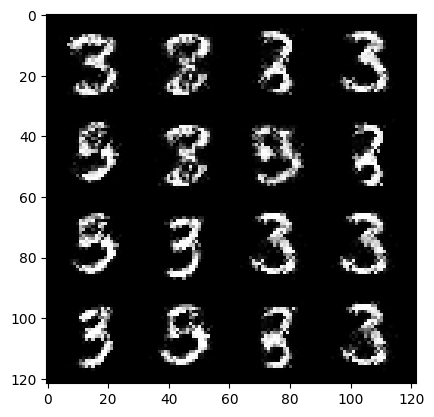

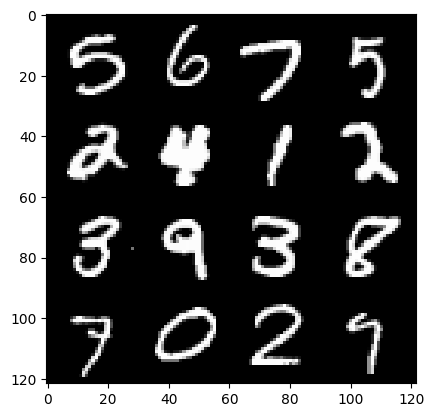

(epoch): step21300/Gen loss: 5.718930258750914/disc_loss: 0.042271763291209956


  0%|          | 0/469 [00:00<?, ?it/s]

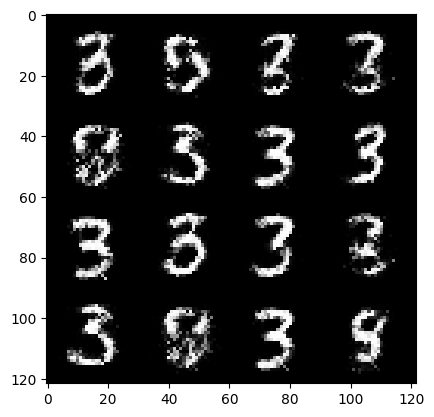

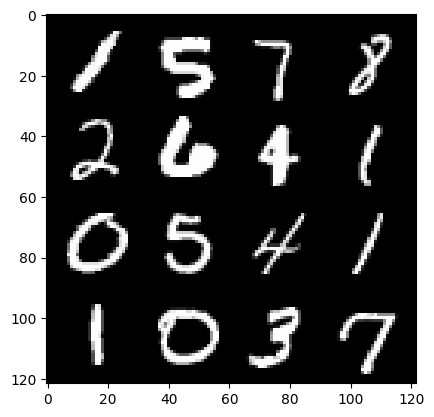

(epoch): step21600/Gen loss: 5.524305311044057/disc_loss: 0.05516619448860484


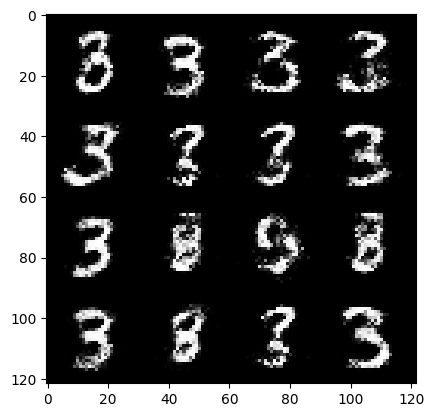

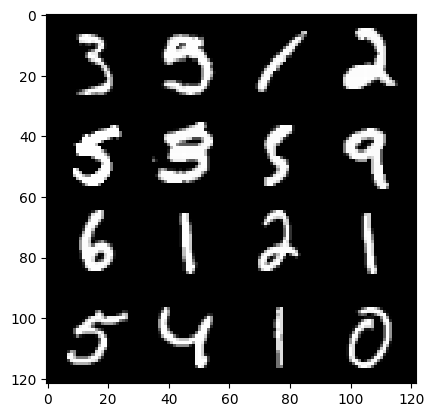

(epoch): step21900/Gen loss: 5.170731048583983/disc_loss: 0.0626770869456231


  0%|          | 0/469 [00:00<?, ?it/s]

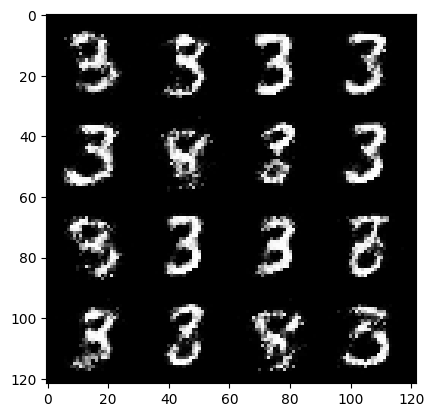

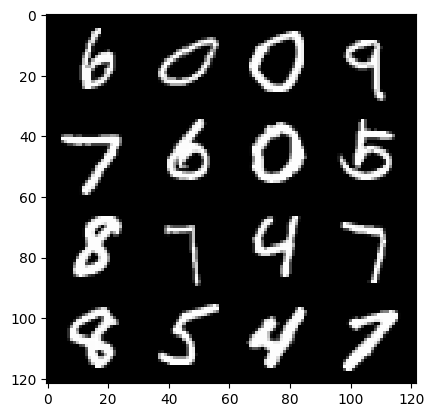

(epoch): step22200/Gen loss: 5.001494614283246/disc_loss: 0.05778124757111074


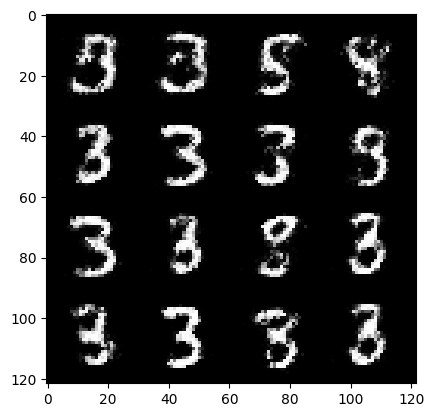

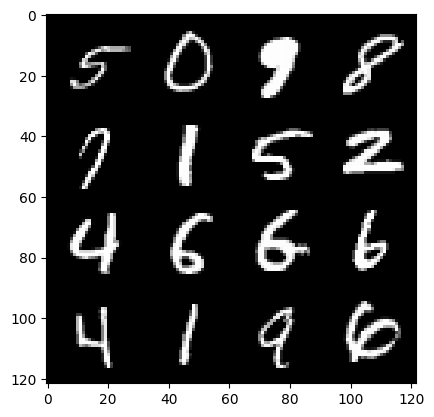

(epoch): step22500/Gen loss: 5.076827484766641/disc_loss: 0.05697661316332717


  0%|          | 0/469 [00:00<?, ?it/s]

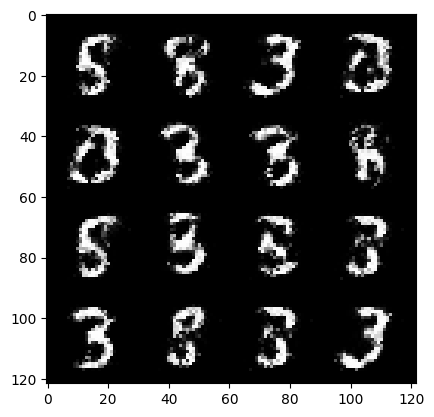

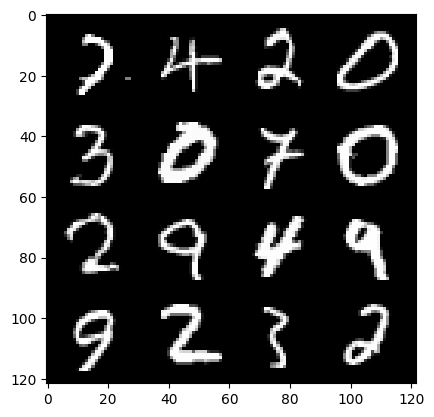

(epoch): step22800/Gen loss: 4.7923033642768855/disc_loss: 0.06602083592365181


  0%|          | 0/469 [00:00<?, ?it/s]

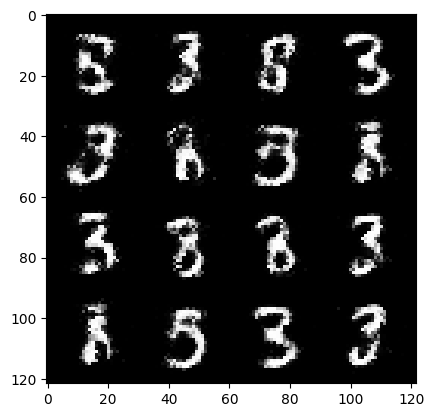

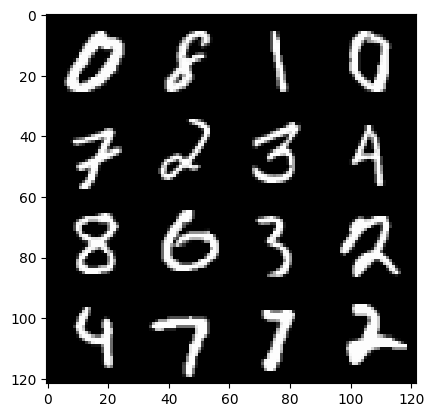

(epoch): step23100/Gen loss: 4.968730053901671/disc_loss: 0.05221057248301805


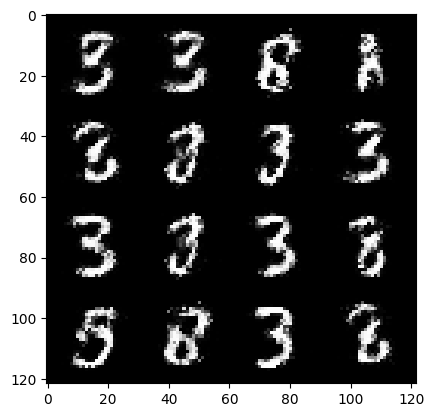

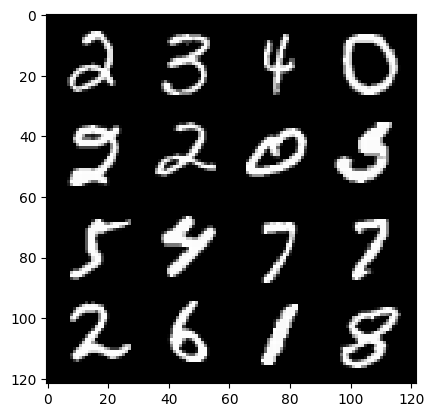

(epoch): step23400/Gen loss: 4.890294268131256/disc_loss: 0.05776382582883043


  0%|          | 0/469 [00:00<?, ?it/s]

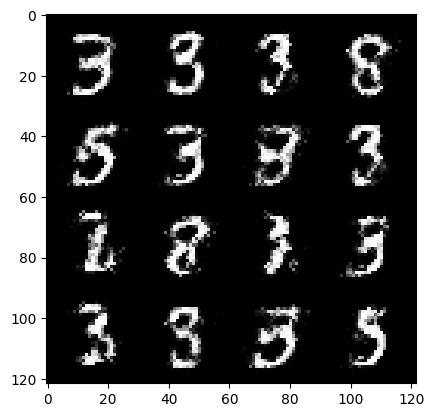

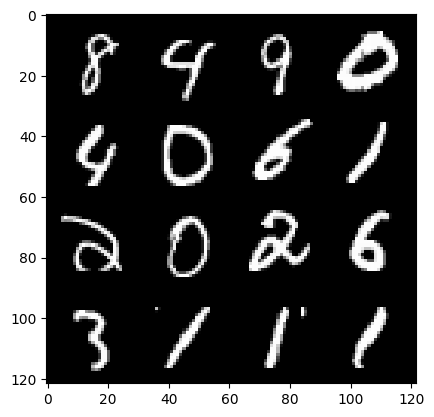

(epoch): step23700/Gen loss: 5.088386293252312/disc_loss: 0.06274958198890092


  0%|          | 0/469 [00:00<?, ?it/s]

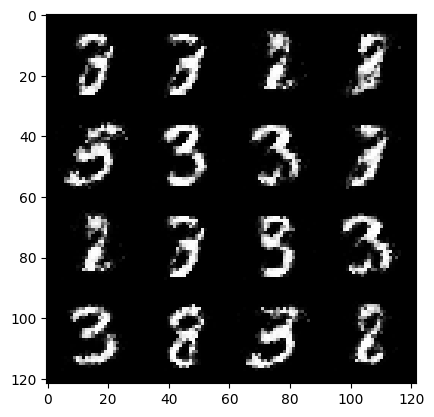

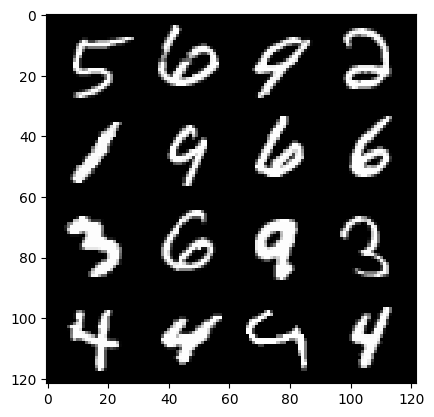

(epoch): step24000/Gen loss: 4.9668437226613396/disc_loss: 0.061919390211502716


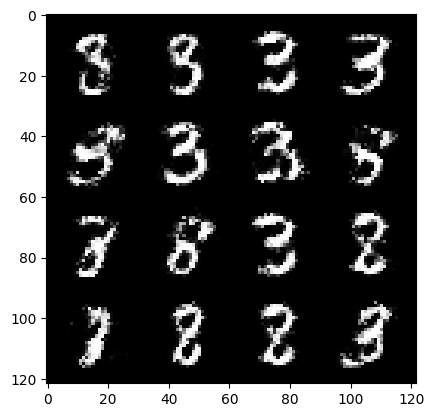

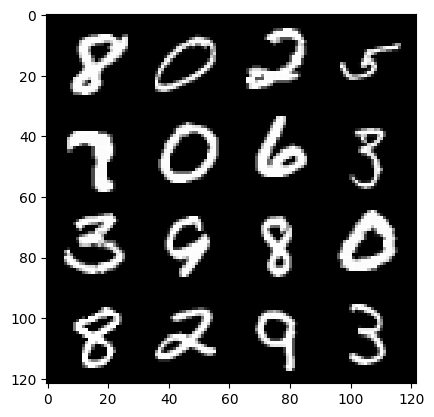

(epoch): step24300/Gen loss: 4.931686305205032/disc_loss: 0.05764548512796565


  0%|          | 0/469 [00:00<?, ?it/s]

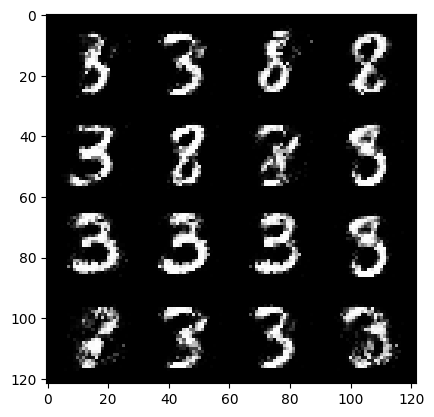

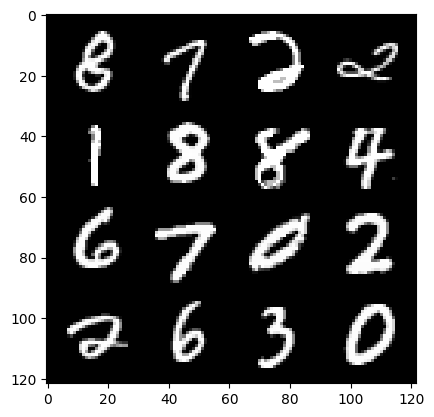

(epoch): step24600/Gen loss: 4.893934698899588/disc_loss: 0.07304106069107845


  0%|          | 0/469 [00:00<?, ?it/s]

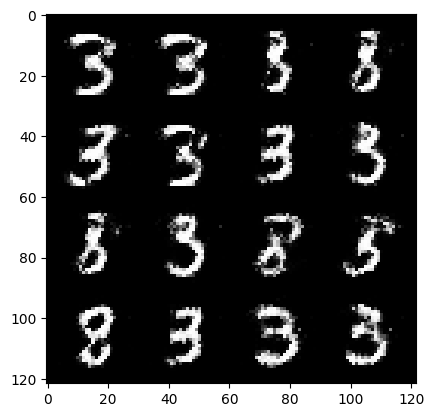

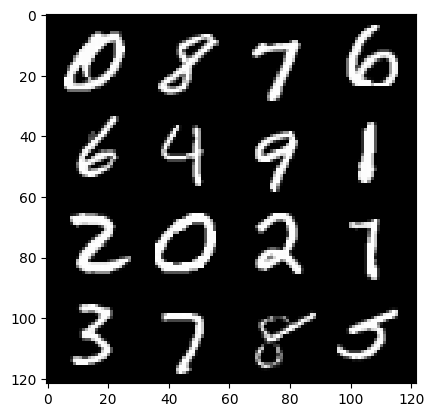

(epoch): step24900/Gen loss: 4.887656634648643/disc_loss: 0.06597133528441194


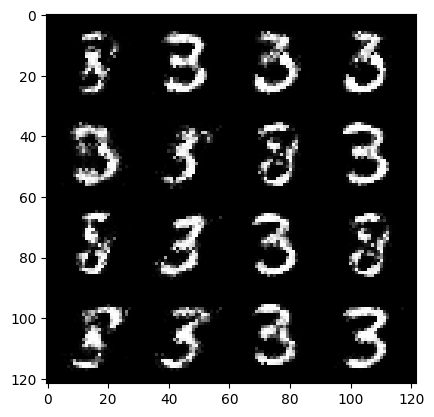

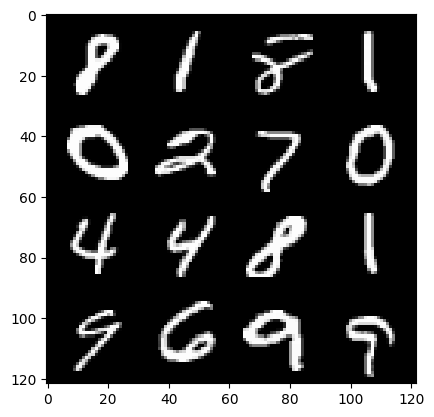

(epoch): step25200/Gen loss: 4.96459687868754/disc_loss: 0.06633122948929666


  0%|          | 0/469 [00:00<?, ?it/s]

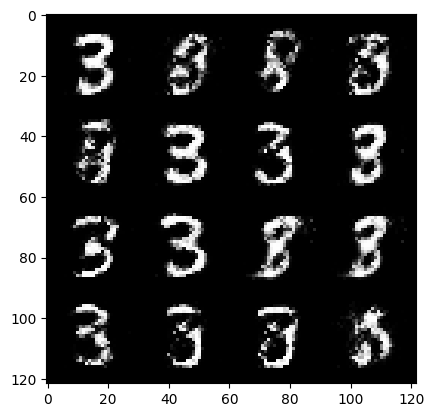

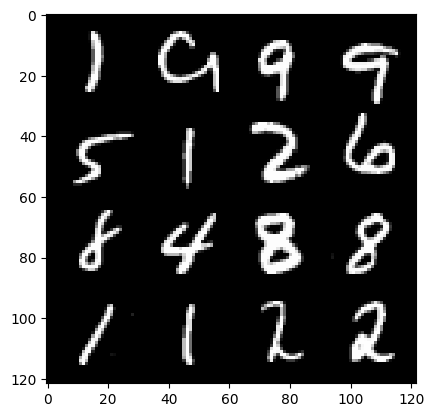

(epoch): step25500/Gen loss: 5.0702848188082354/disc_loss: 0.0621166699938476


  0%|          | 0/469 [00:00<?, ?it/s]

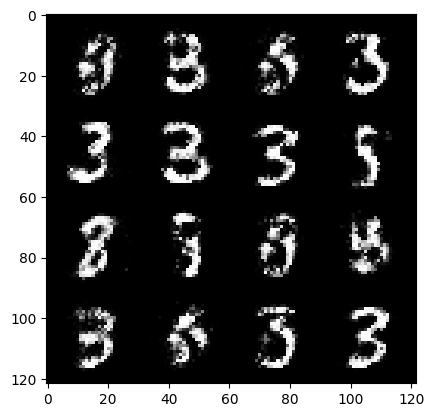

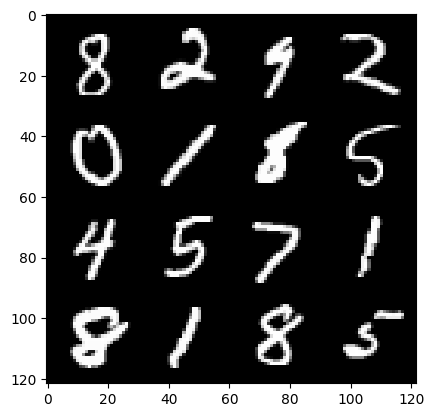

(epoch): step25800/Gen loss: 4.988051767349246/disc_loss: 0.07221630696828167


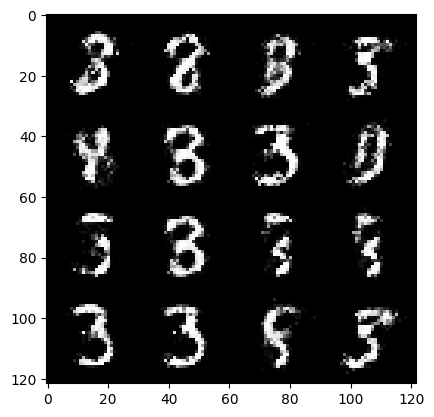

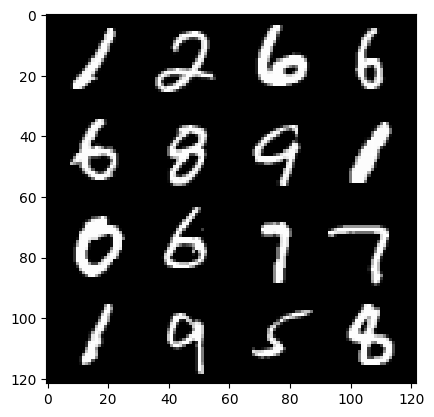

(epoch): step26100/Gen loss: 4.917982762654619/disc_loss: 0.07474694781005384


  0%|          | 0/469 [00:00<?, ?it/s]

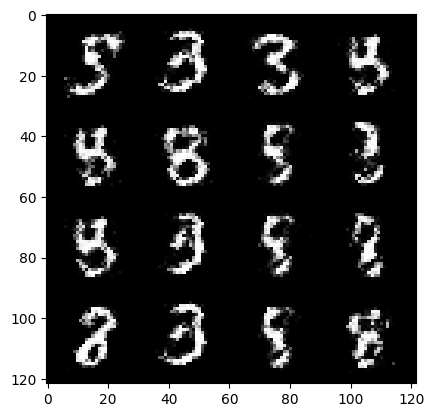

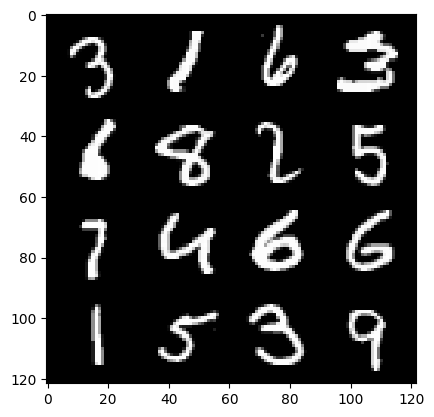

(epoch): step26400/Gen loss: 4.706527823607129/disc_loss: 0.07518300031311813


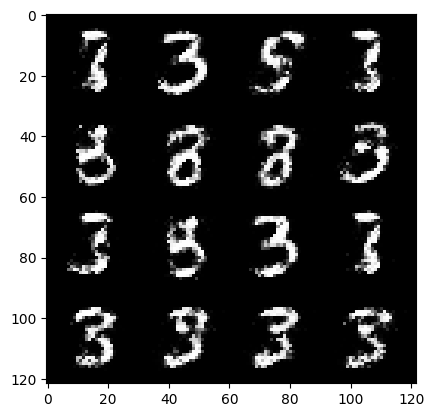

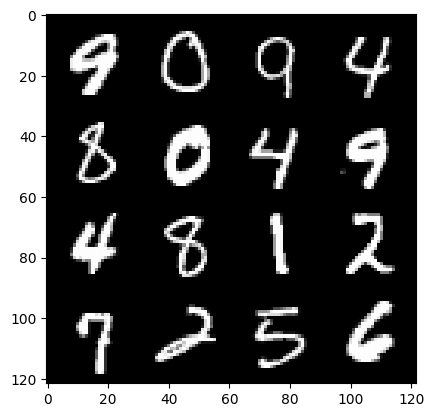

(epoch): step26700/Gen loss: 4.5722798720995605/disc_loss: 0.08563701250279944


  0%|          | 0/469 [00:00<?, ?it/s]

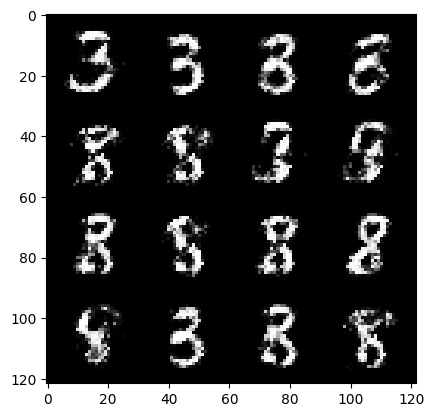

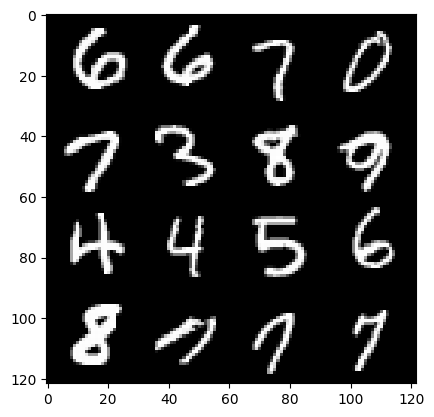

(epoch): step27000/Gen loss: 4.78447495619456/disc_loss: 0.08849067632729812


  0%|          | 0/469 [00:00<?, ?it/s]

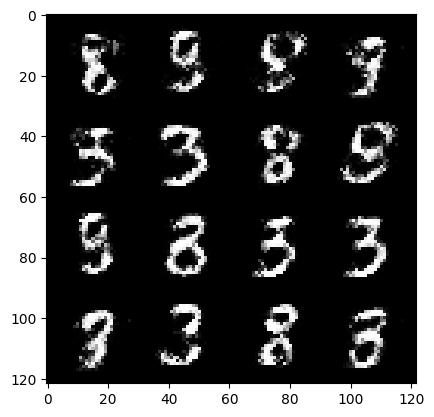

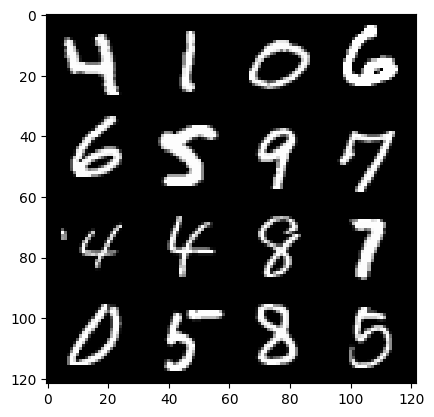

(epoch): step27300/Gen loss: 4.609625493685405/disc_loss: 0.0804047584161162


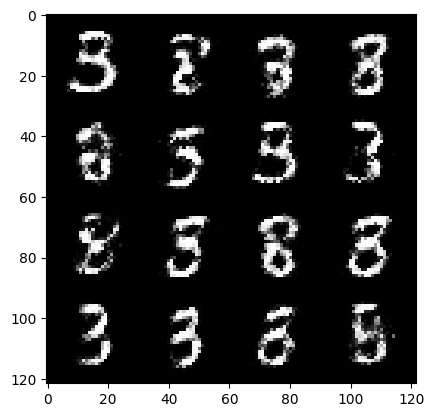

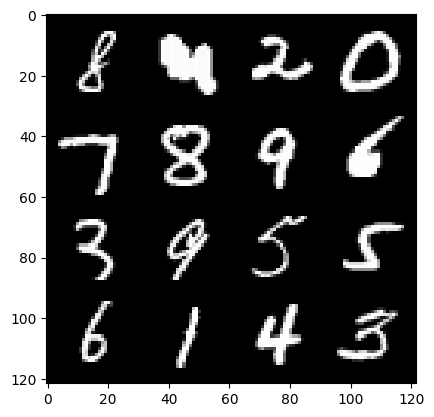

(epoch): step27600/Gen loss: 4.602897369861605/disc_loss: 0.09168549015497168


  0%|          | 0/469 [00:00<?, ?it/s]

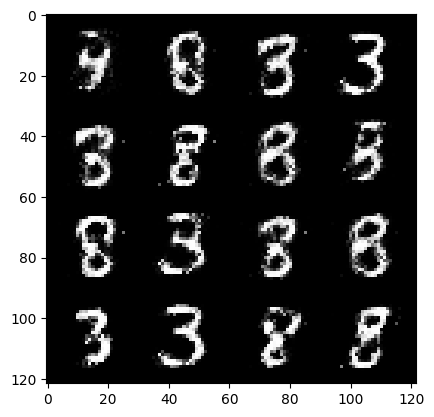

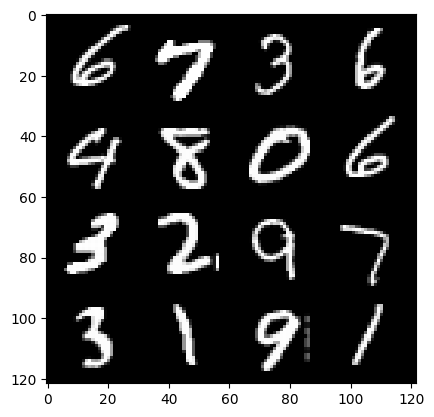

(epoch): step27900/Gen loss: 4.6367777140935225/disc_loss: 0.09375995213786764


  0%|          | 0/469 [00:00<?, ?it/s]

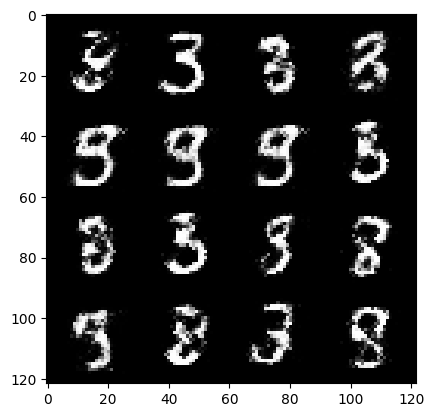

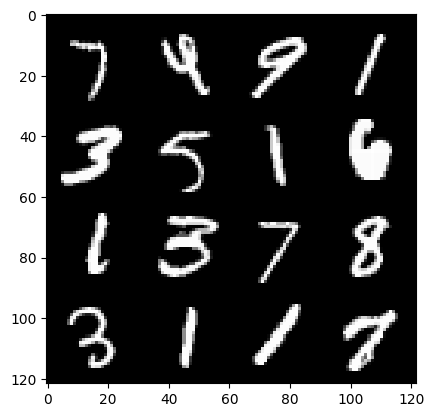

(epoch): step28200/Gen loss: 4.250326811472573/disc_loss: 0.10521586775779723


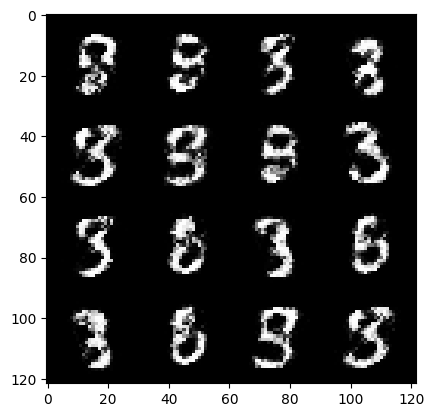

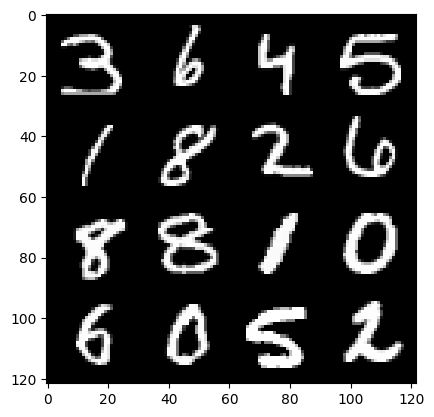

(epoch): step28500/Gen loss: 4.133113927046457/disc_loss: 0.10109097801148892


  0%|          | 0/469 [00:00<?, ?it/s]

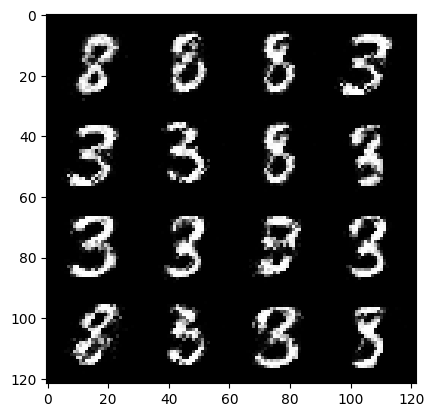

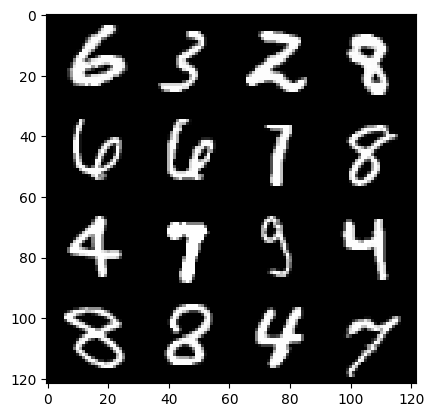

(epoch): step28800/Gen loss: 4.290064583619436/disc_loss: 0.09255235019450397


  0%|          | 0/469 [00:00<?, ?it/s]

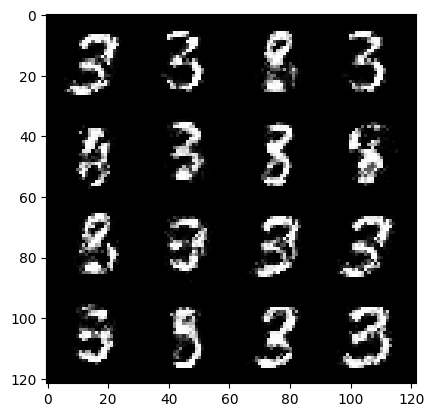

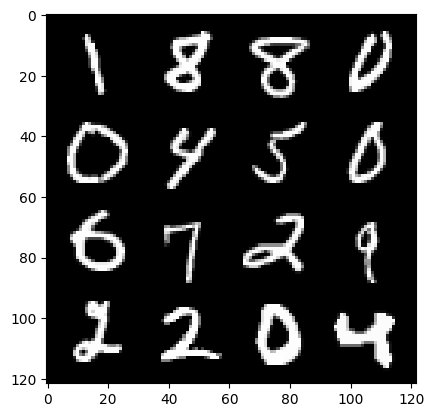

(epoch): step29100/Gen loss: 4.3634500392278035/disc_loss: 0.07887303142497938


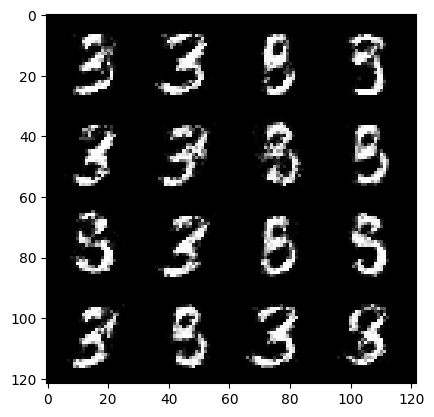

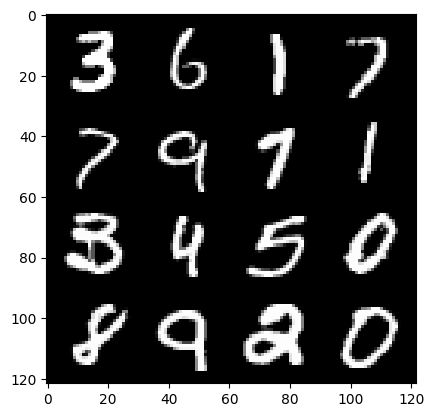

(epoch): step29400/Gen loss: 4.38142120440801/disc_loss: 0.08656740074977283


  0%|          | 0/469 [00:00<?, ?it/s]

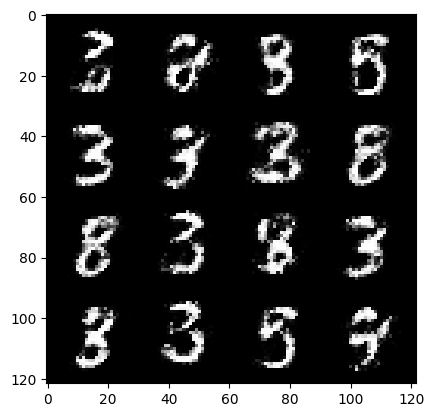

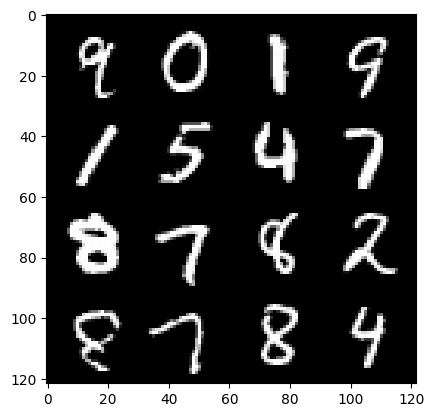

(epoch): step29700/Gen loss: 4.359624327023826/disc_loss: 0.11435644812881941


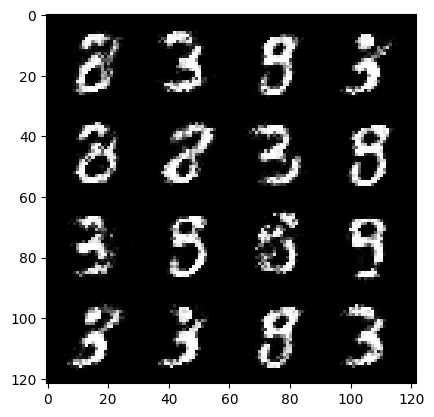

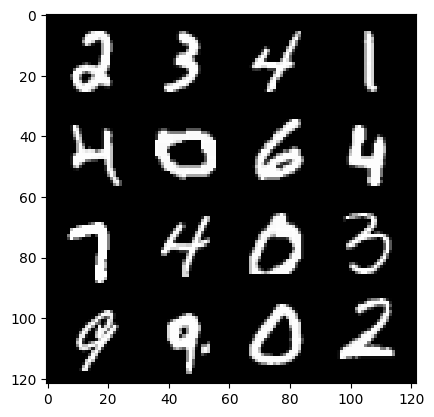

(epoch): step30000/Gen loss: 4.161031193733213/disc_loss: 0.10143006764352332


  0%|          | 0/469 [00:00<?, ?it/s]

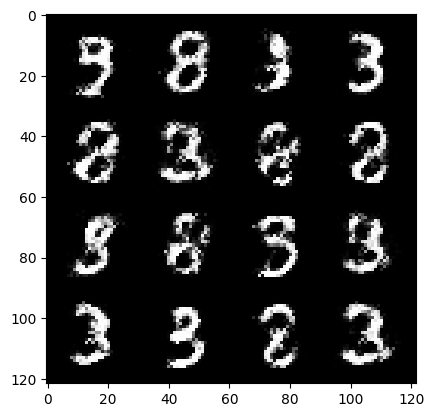

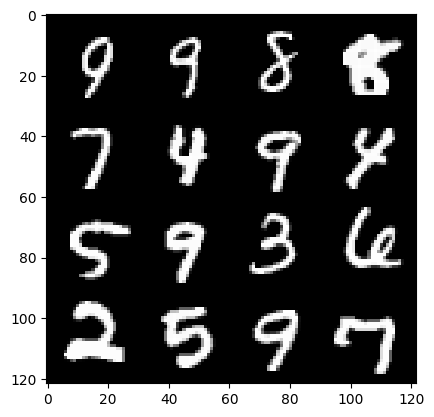

(epoch): step30300/Gen loss: 4.234781822363536/disc_loss: 0.09531384946157534


  0%|          | 0/469 [00:00<?, ?it/s]

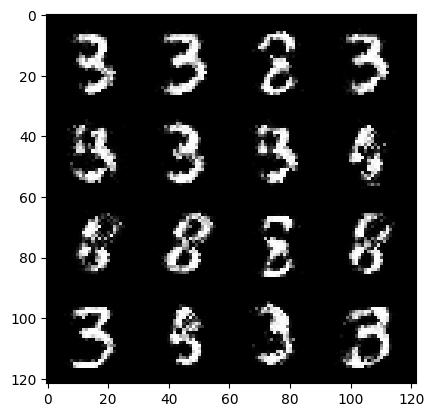

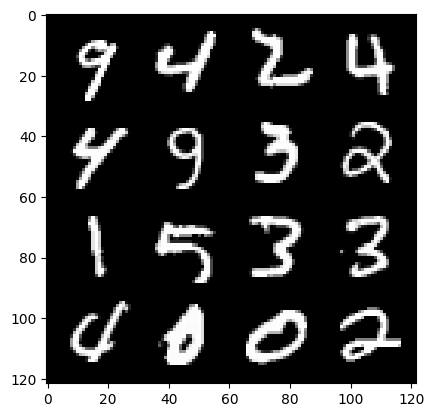

(epoch): step30600/Gen loss: 4.235301436583202/disc_loss: 0.09365977412710587


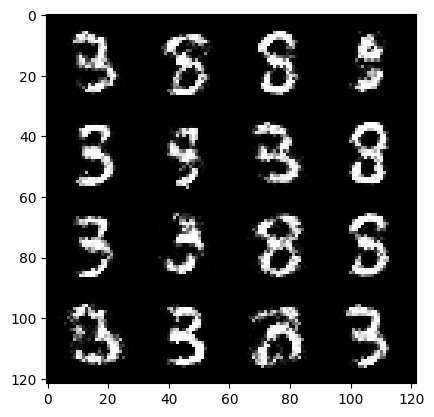

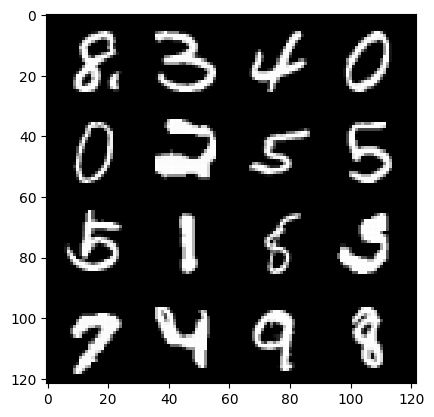

(epoch): step30900/Gen loss: 4.299655536810559/disc_loss: 0.08984222427631422


  0%|          | 0/469 [00:00<?, ?it/s]

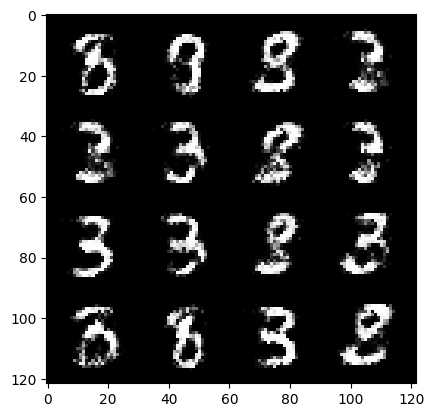

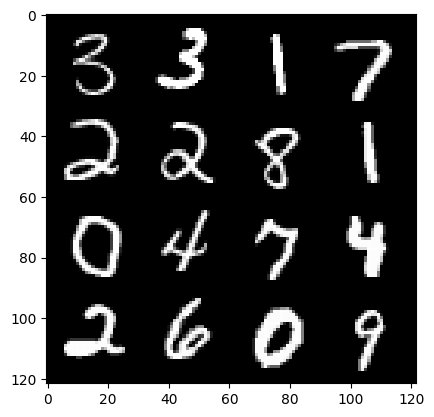

(epoch): step31200/Gen loss: 4.198754851023352/disc_loss: 0.08974951406319948


  0%|          | 0/469 [00:00<?, ?it/s]

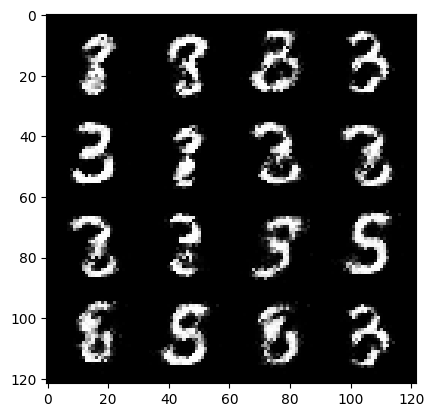

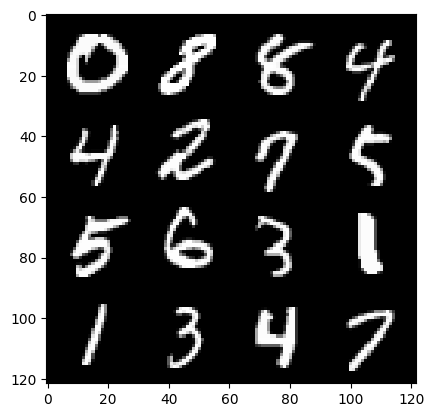

(epoch): step31500/Gen loss: 3.9357599234581033/disc_loss: 0.1124626002833247


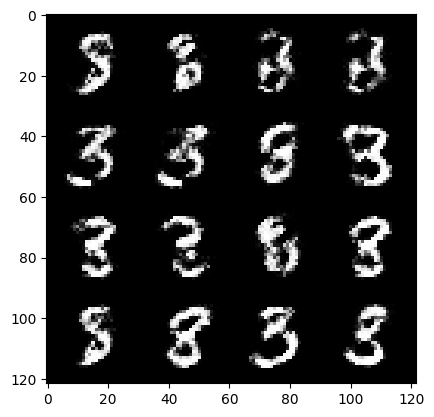

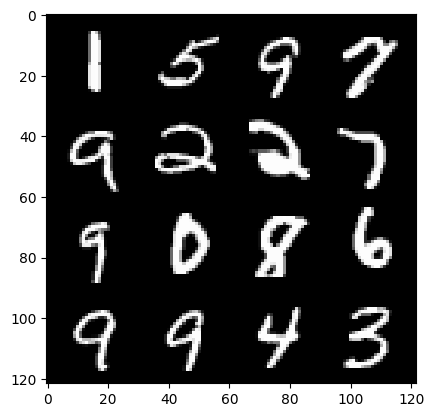

(epoch): step31800/Gen loss: 3.734304401079813/disc_loss: 0.13196621896078184


  0%|          | 0/469 [00:00<?, ?it/s]

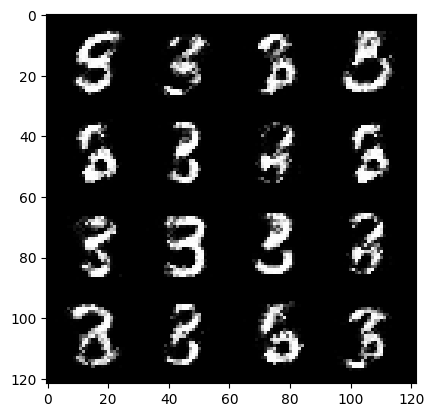

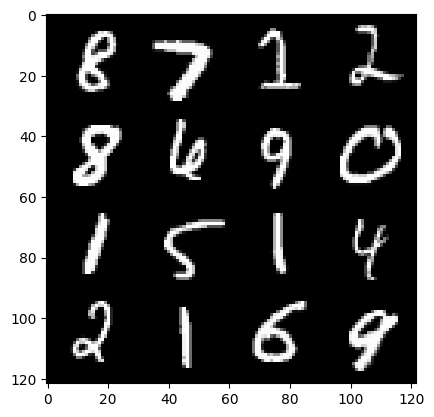

(epoch): step32100/Gen loss: 3.6884892010688786/disc_loss: 0.13296110951652135


  0%|          | 0/469 [00:00<?, ?it/s]

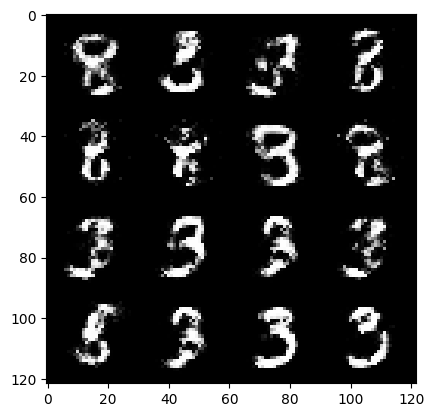

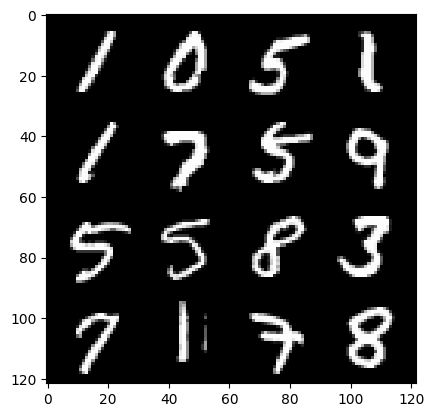

(epoch): step32400/Gen loss: 3.91527443965276/disc_loss: 0.10969710631916914


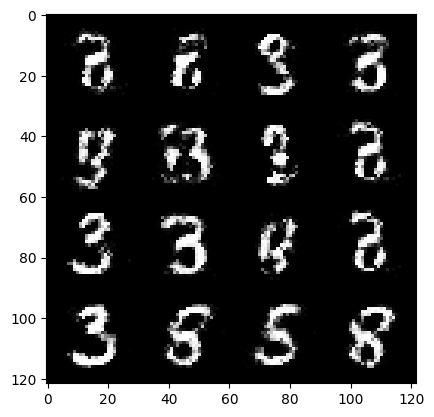

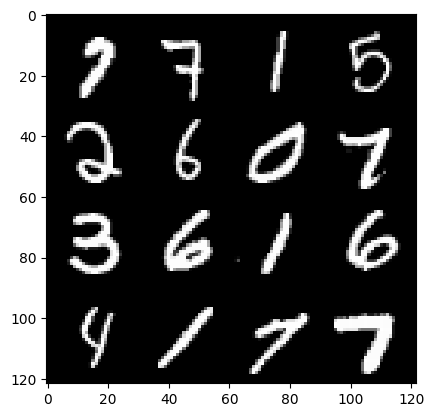

(epoch): step32700/Gen loss: 4.040805548032126/disc_loss: 0.1175756501033903


  0%|          | 0/469 [00:00<?, ?it/s]

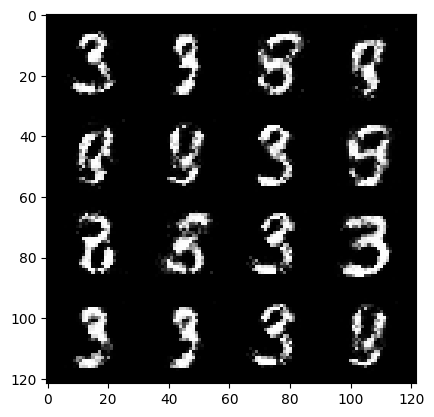

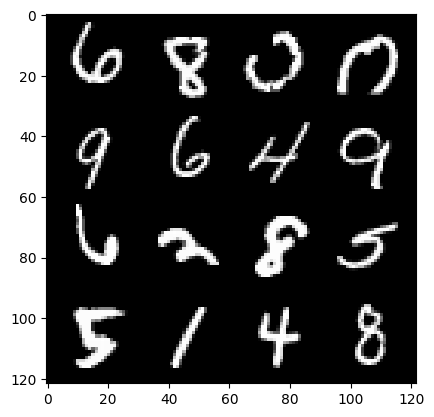

(epoch): step33000/Gen loss: 3.9187009445826213/disc_loss: 0.1087560199573636


  0%|          | 0/469 [00:00<?, ?it/s]

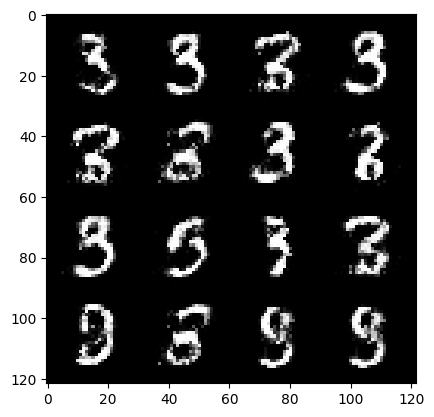

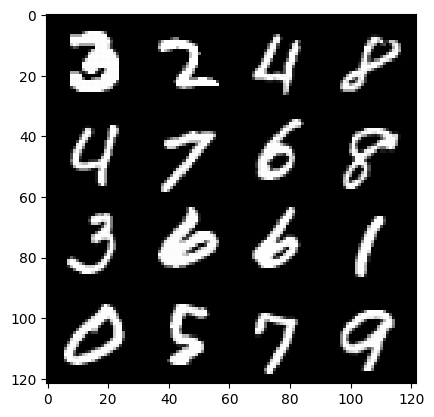

(epoch): step33300/Gen loss: 4.083561998208366/disc_loss: 0.10560628975431126


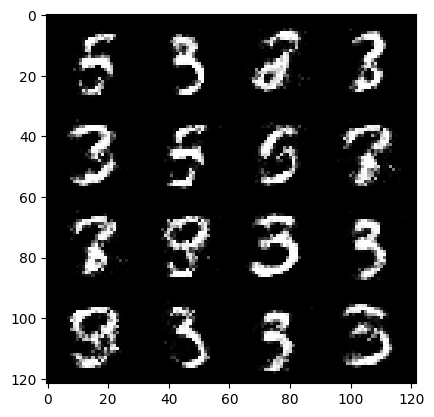

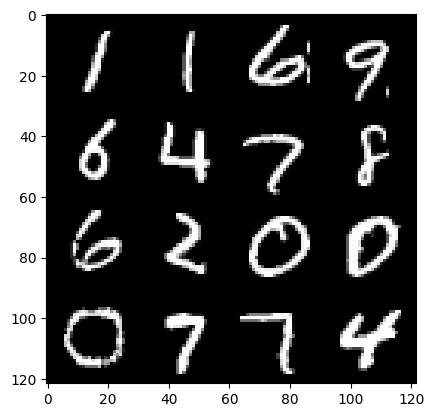

(epoch): step33600/Gen loss: 3.895183258851368/disc_loss: 0.11107613905022534


  0%|          | 0/469 [00:00<?, ?it/s]

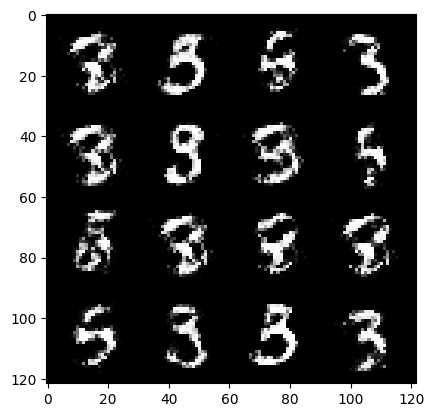

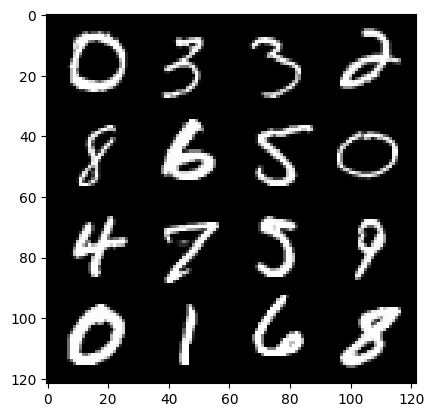

(epoch): step33900/Gen loss: 4.0481982469558755/disc_loss: 0.10721974212676283


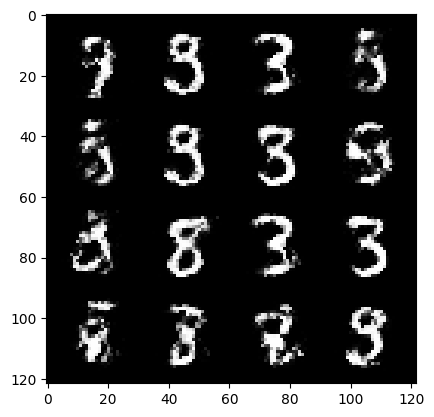

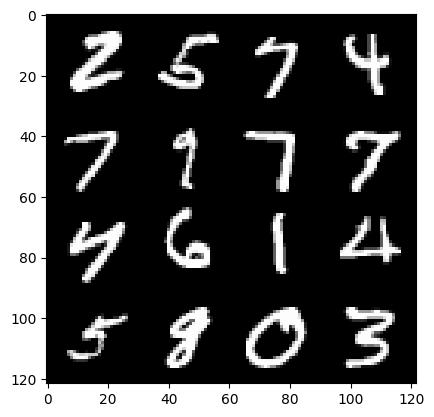

(epoch): step34200/Gen loss: 3.819220964908597/disc_loss: 0.12517498455941675


  0%|          | 0/469 [00:00<?, ?it/s]

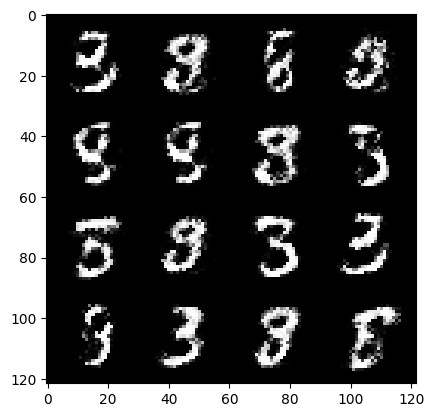

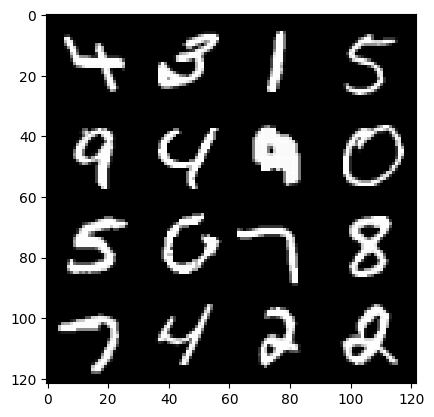

(epoch): step34500/Gen loss: 3.797245581150054/disc_loss: 0.11122576002031563


  0%|          | 0/469 [00:00<?, ?it/s]

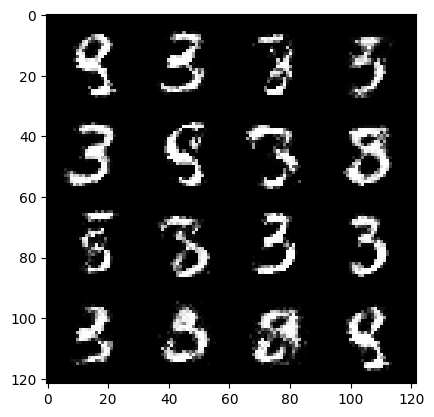

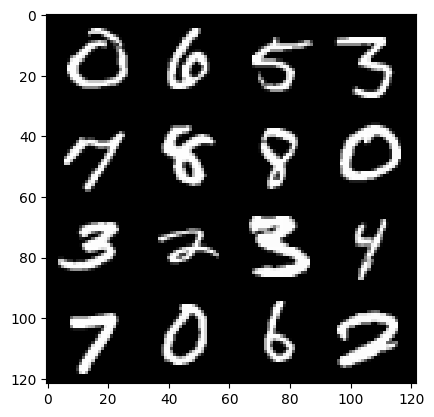

(epoch): step34800/Gen loss: 4.046911318302156/disc_loss: 0.10447049425294005


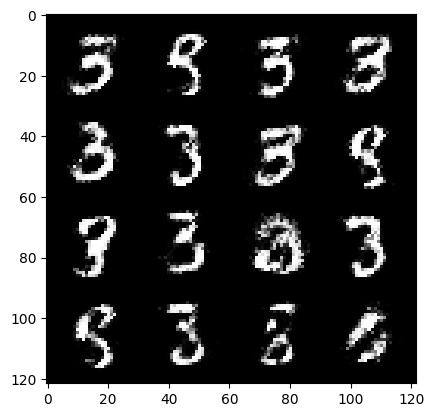

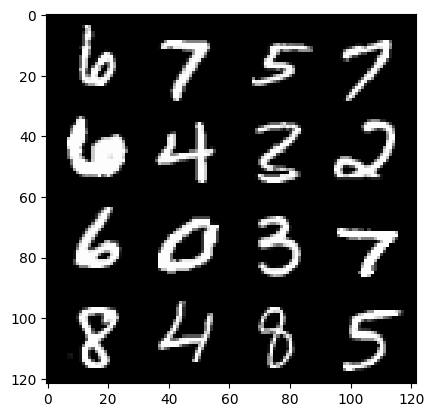

(epoch): step35100/Gen loss: 3.7938077608744316/disc_loss: 0.11166935775429004


  0%|          | 0/469 [00:00<?, ?it/s]

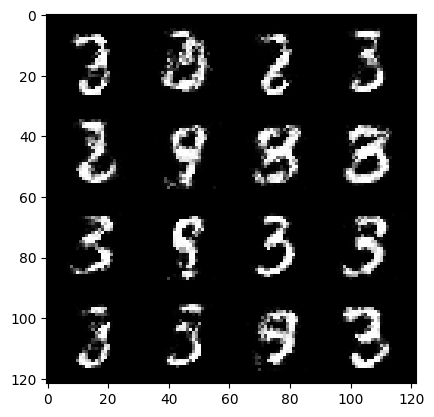

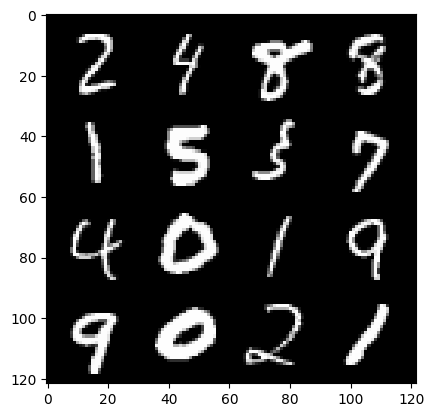

(epoch): step35400/Gen loss: 3.838644762039185/disc_loss: 0.12101407880584408


  0%|          | 0/469 [00:00<?, ?it/s]

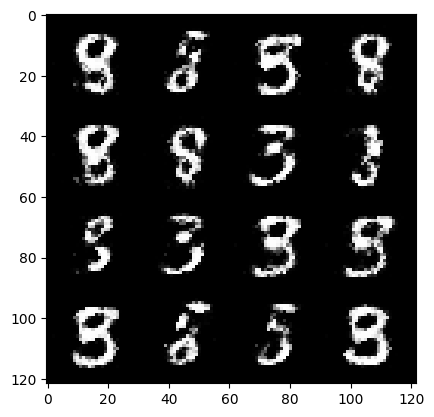

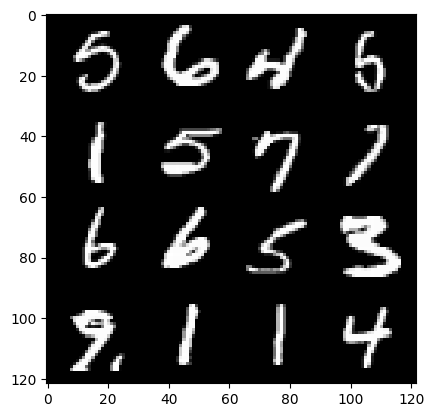

(epoch): step35700/Gen loss: 3.840061254501341/disc_loss: 0.10906462331612912


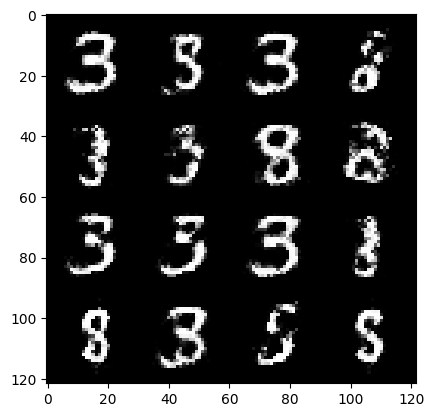

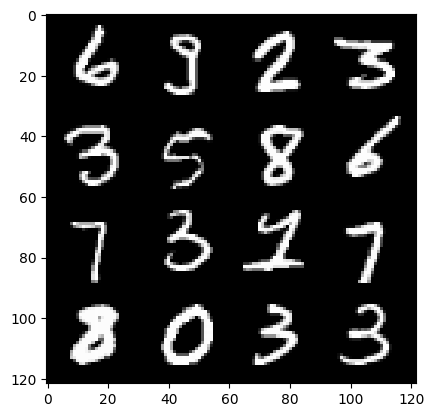

(epoch): step36000/Gen loss: 3.8448971907297773/disc_loss: 0.11345744529118137


  0%|          | 0/469 [00:00<?, ?it/s]

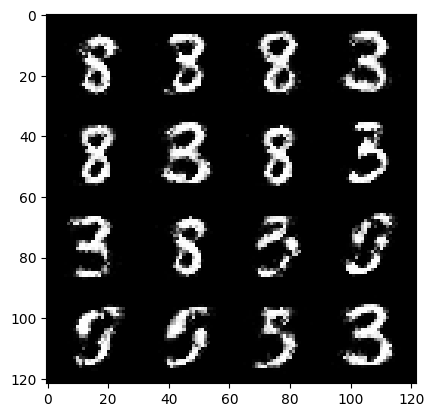

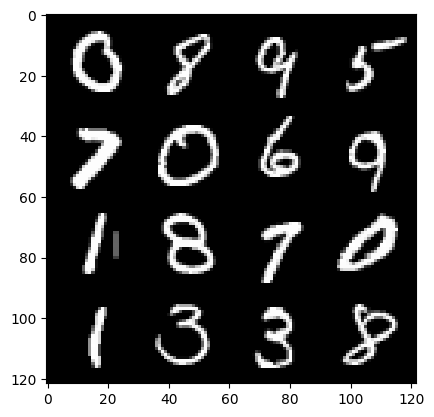

(epoch): step36300/Gen loss: 3.9738396549224833/disc_loss: 0.11574100791166231


  0%|          | 0/469 [00:00<?, ?it/s]

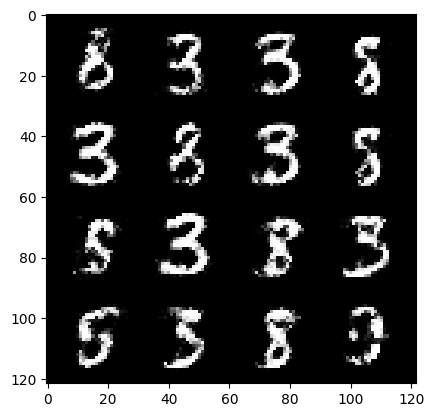

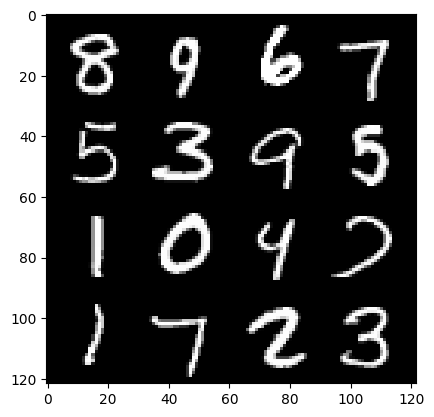

(epoch): step36600/Gen loss: 3.9162329808870946/disc_loss: 0.12110677494357024


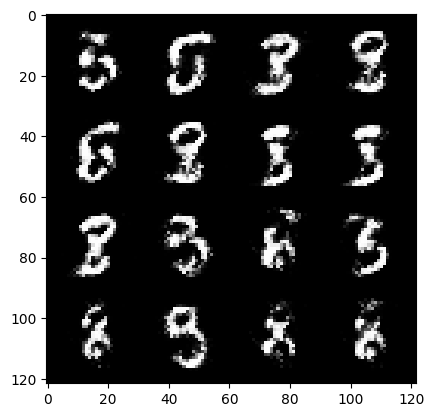

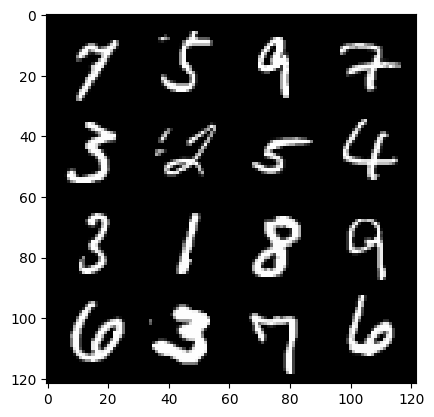

(epoch): step36900/Gen loss: 3.7053052783012386/disc_loss: 0.15586504064500334


  0%|          | 0/469 [00:00<?, ?it/s]

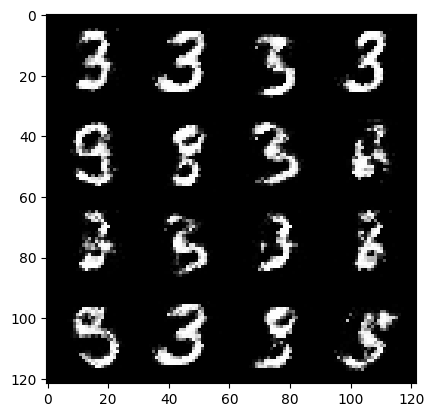

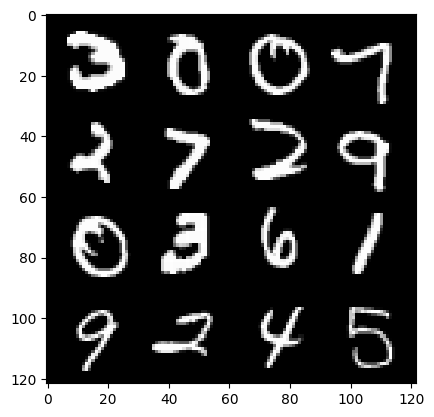

(epoch): step37200/Gen loss: 3.4909699972470594/disc_loss: 0.1466875023022292


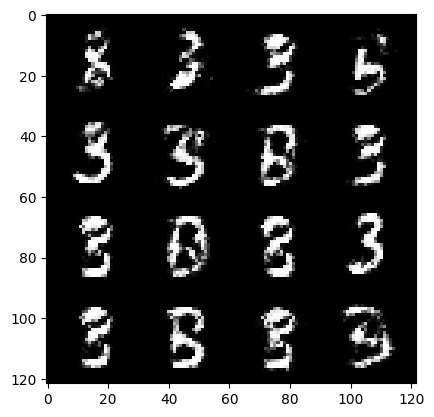

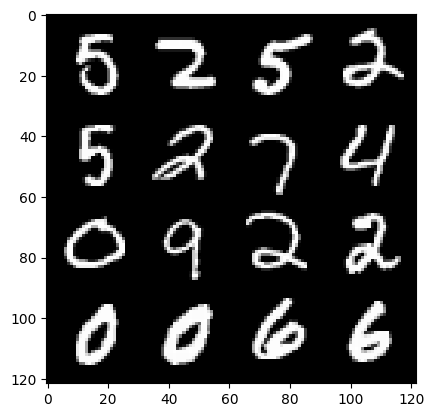

(epoch): step37500/Gen loss: 3.756765630245207/disc_loss: 0.13355088766664264


  0%|          | 0/469 [00:00<?, ?it/s]

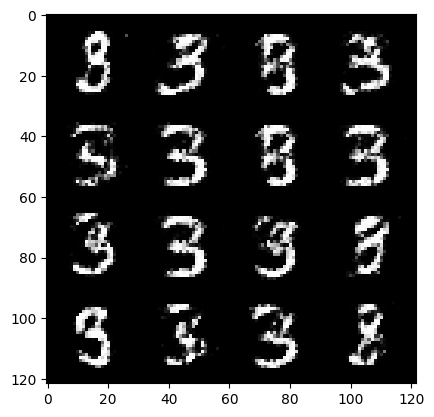

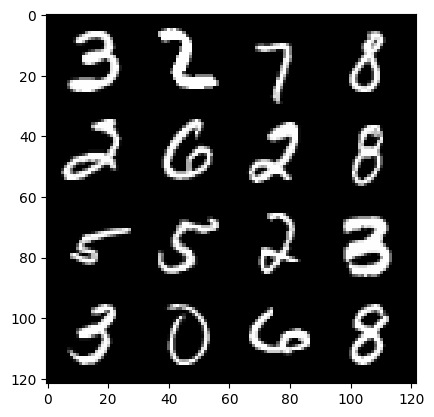

(epoch): step37800/Gen loss: 3.839385383129122/disc_loss: 0.11966736036042373


  0%|          | 0/469 [00:00<?, ?it/s]

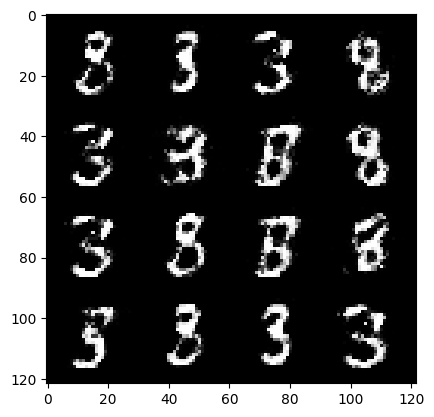

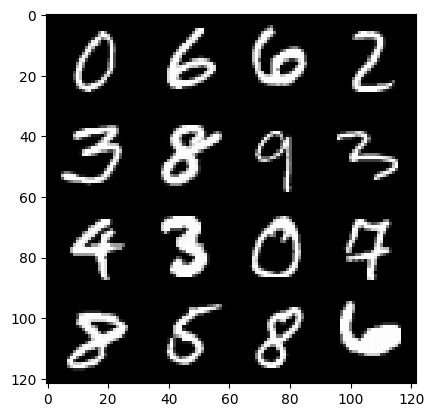

(epoch): step38100/Gen loss: 3.9150632198651643/disc_loss: 0.10855959078917903


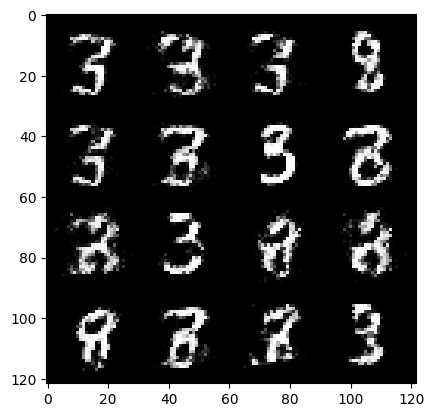

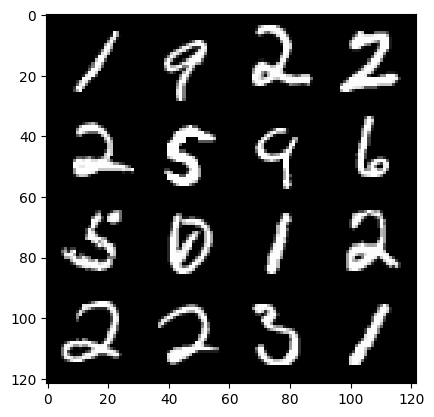

(epoch): step38400/Gen loss: 3.8374380199114486/disc_loss: 0.13093055135260032


  0%|          | 0/469 [00:00<?, ?it/s]

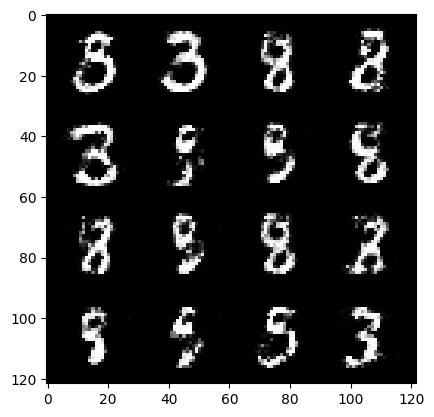

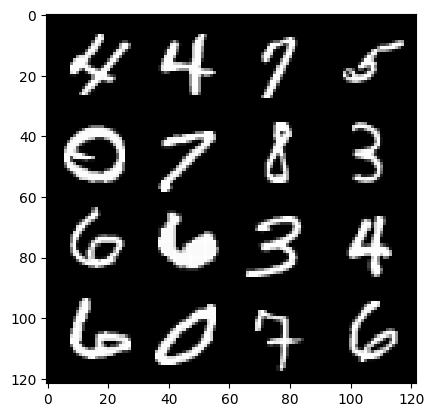

(epoch): step38700/Gen loss: 3.8776682170232157/disc_loss: 0.10894052229821687


  0%|          | 0/469 [00:00<?, ?it/s]

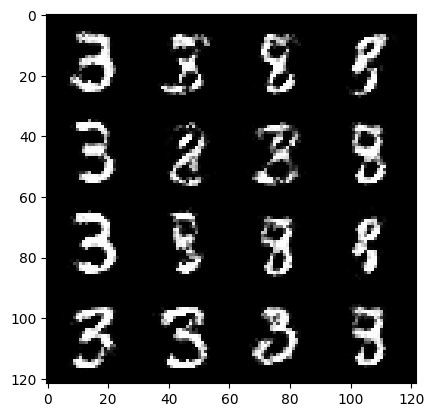

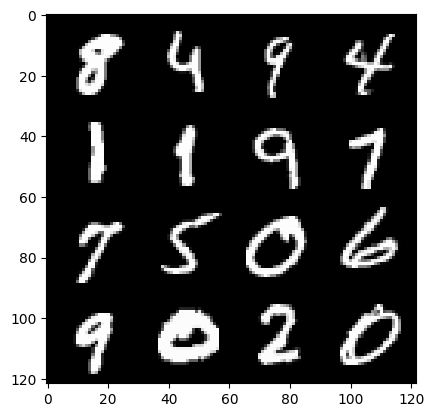

(epoch): step39000/Gen loss: 3.8313061809539812/disc_loss: 0.11577067431062463


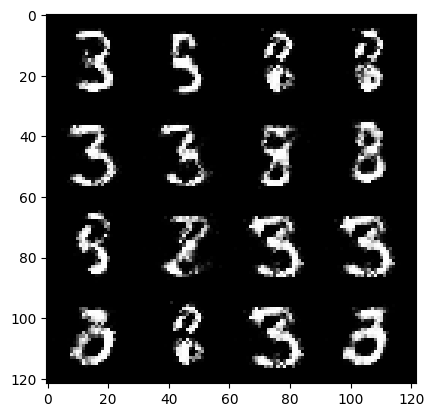

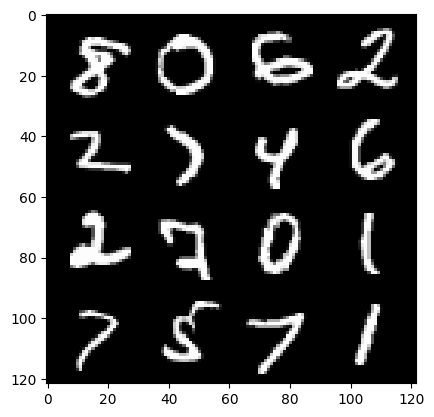

(epoch): step39300/Gen loss: 3.8281401960055033/disc_loss: 0.12319811445971325


  0%|          | 0/469 [00:00<?, ?it/s]

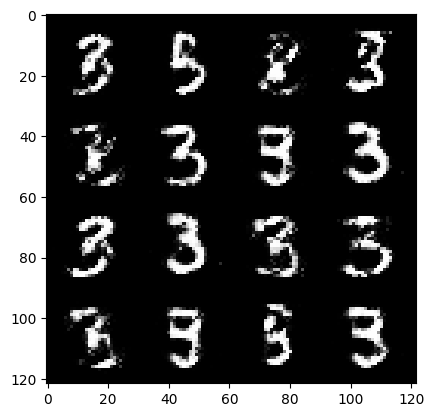

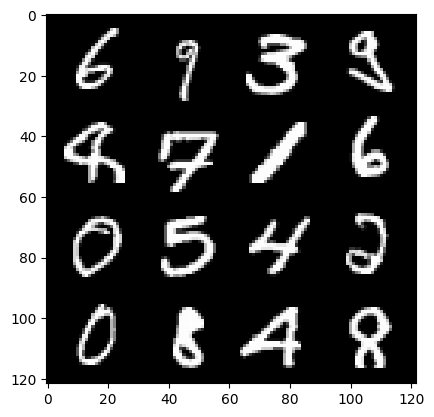

(epoch): step39600/Gen loss: 3.758090260823568/disc_loss: 0.12768562639753017


  0%|          | 0/469 [00:00<?, ?it/s]

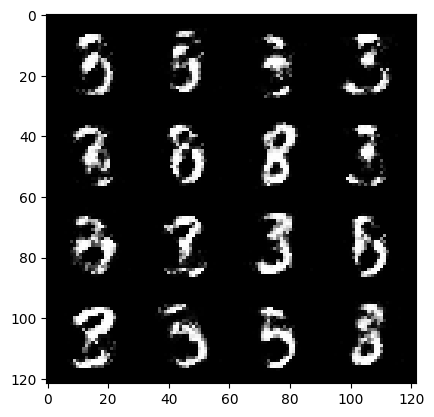

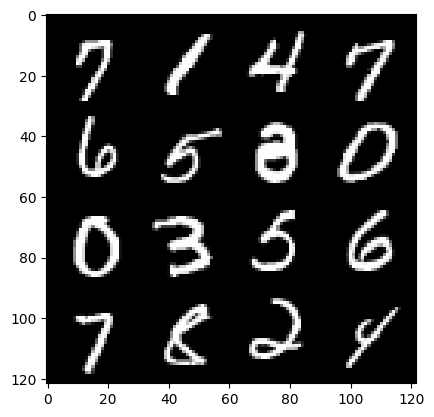

(epoch): step39900/Gen loss: 3.6033101423581444/disc_loss: 0.13598065602282683


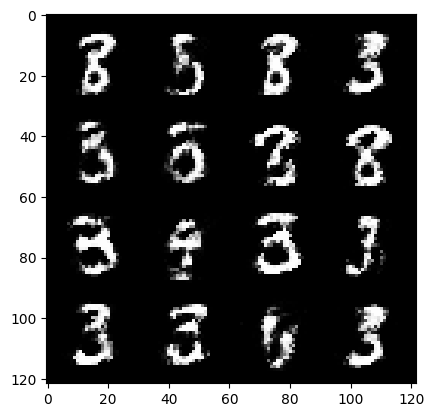

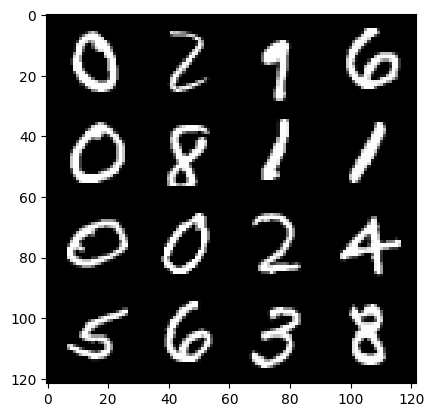

(epoch): step40200/Gen loss: 3.5224309833844485/disc_loss: 0.14548811192313832


  0%|          | 0/469 [00:00<?, ?it/s]

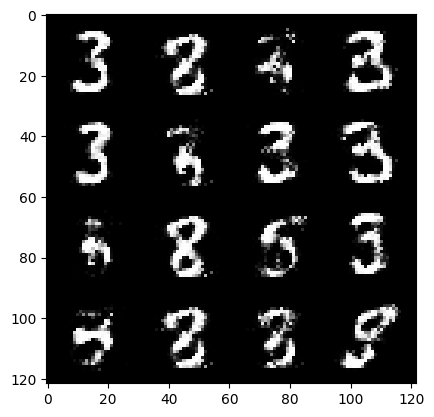

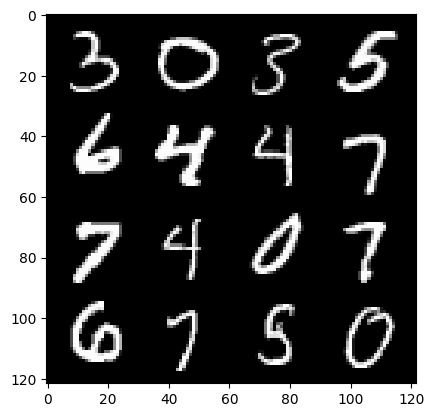

(epoch): step40500/Gen loss: 3.595914857387546/disc_loss: 0.1361202380433678


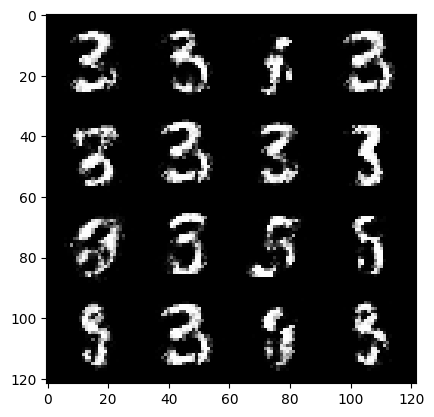

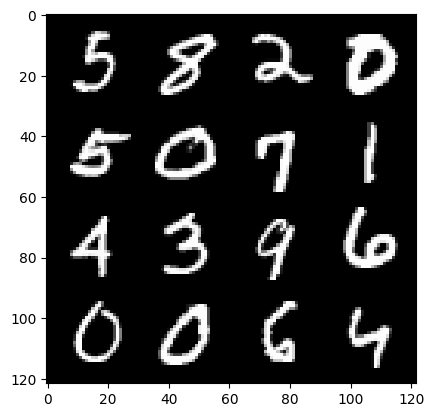

(epoch): step40800/Gen loss: 3.65578387816747/disc_loss: 0.12669753504296144


  0%|          | 0/469 [00:00<?, ?it/s]

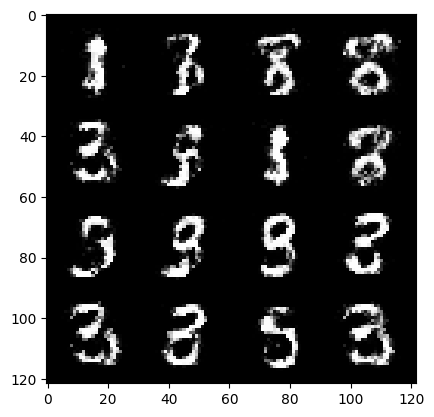

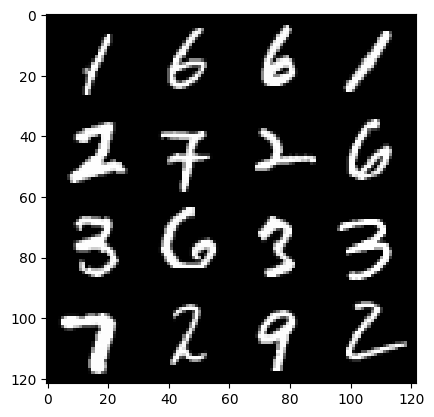

(epoch): step41100/Gen loss: 3.584984731674194/disc_loss: 0.13240978185087443


  0%|          | 0/469 [00:00<?, ?it/s]

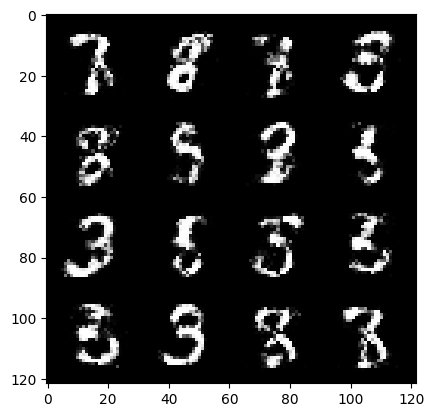

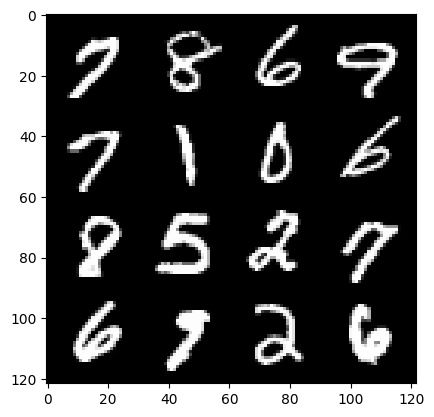

(epoch): step41400/Gen loss: 3.4300681988398236/disc_loss: 0.15340857878327369


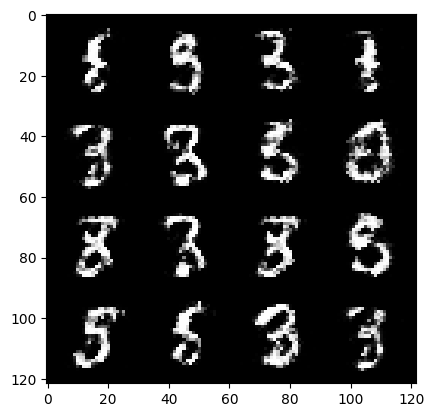

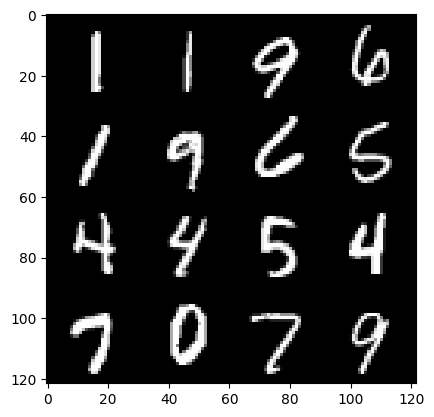

(epoch): step41700/Gen loss: 3.3617409070332855/disc_loss: 0.1557204976926246


  0%|          | 0/469 [00:00<?, ?it/s]

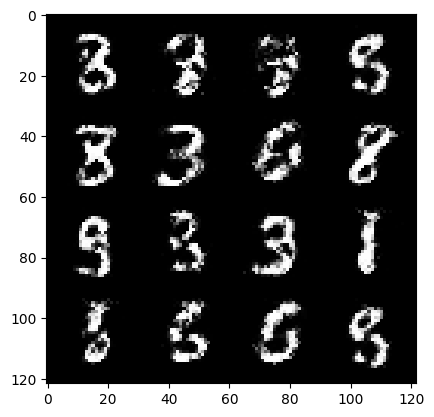

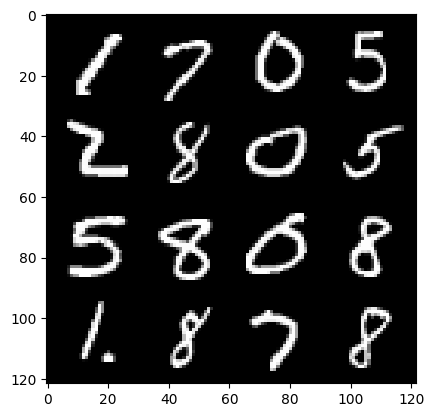

(epoch): step42000/Gen loss: 3.445462917486825/disc_loss: 0.15323535516858094


  0%|          | 0/469 [00:00<?, ?it/s]

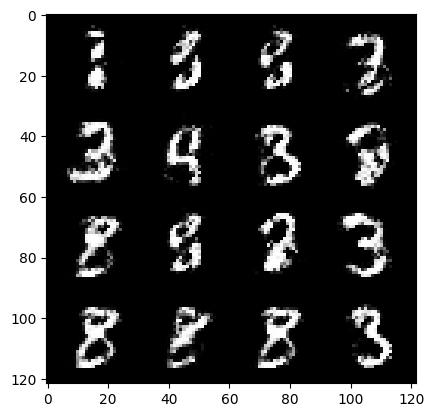

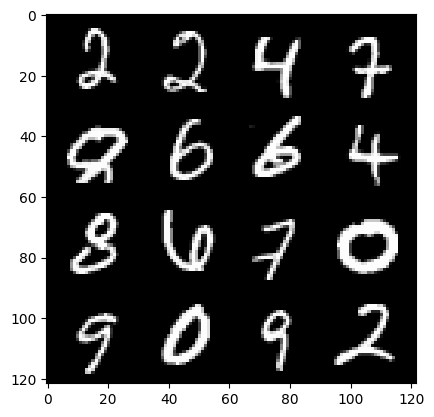

(epoch): step42300/Gen loss: 3.2619815135002135/disc_loss: 0.17269988025228167


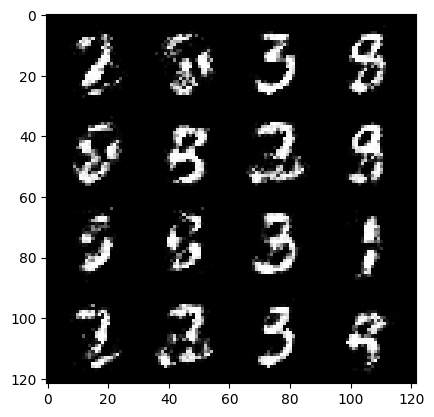

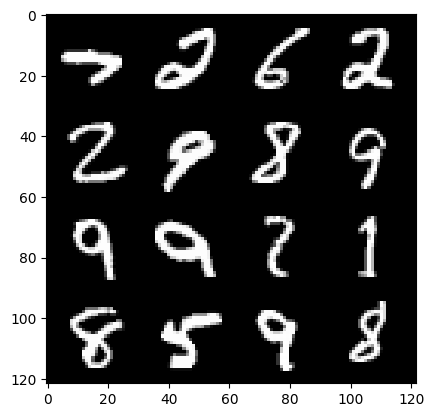

(epoch): step42600/Gen loss: 3.2700937008857736/disc_loss: 0.17304381921887396


  0%|          | 0/469 [00:00<?, ?it/s]

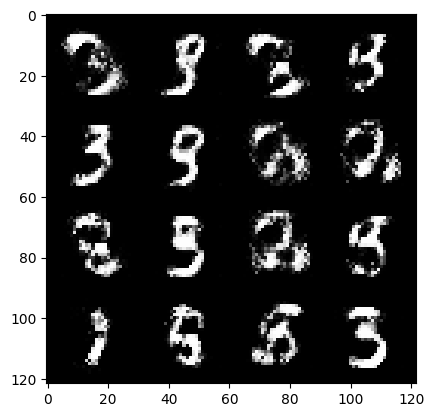

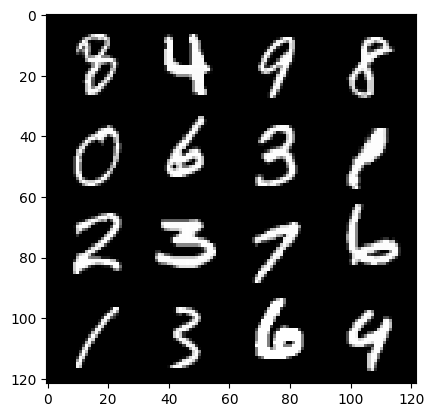

(epoch): step42900/Gen loss: 3.3977848807970705/disc_loss: 0.1668997609366973


  0%|          | 0/469 [00:00<?, ?it/s]

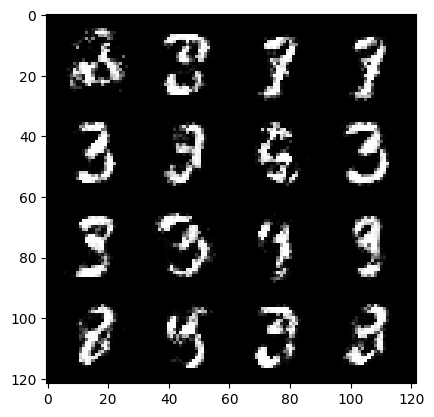

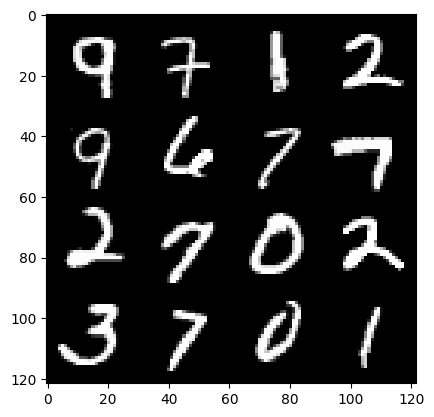

(epoch): step43200/Gen loss: 3.459707187016804/disc_loss: 0.16199755231539412


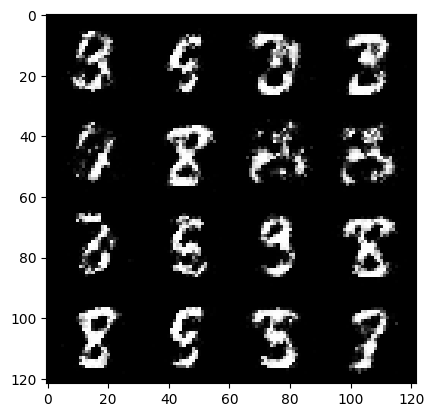

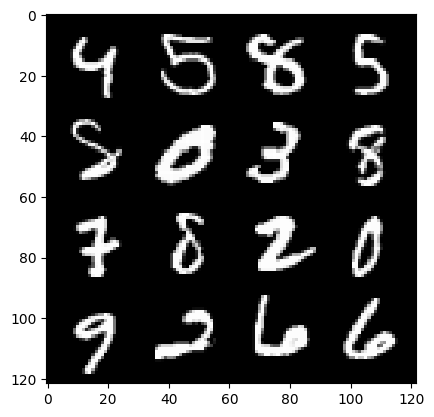

(epoch): step43500/Gen loss: 3.38950407187144/disc_loss: 0.1581909215450289


  0%|          | 0/469 [00:00<?, ?it/s]

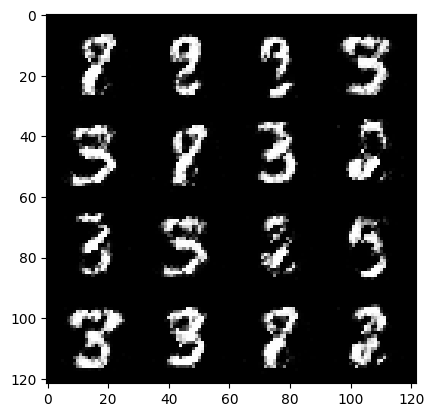

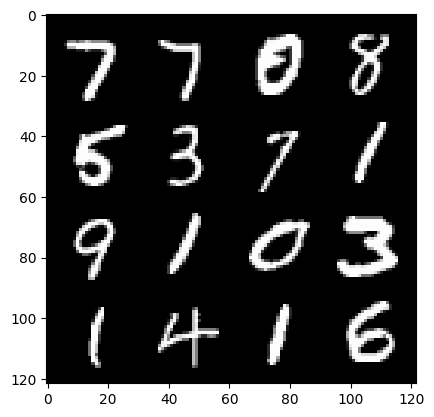

(epoch): step43800/Gen loss: 3.4292311882972717/disc_loss: 0.15165637619793415


  0%|          | 0/469 [00:00<?, ?it/s]

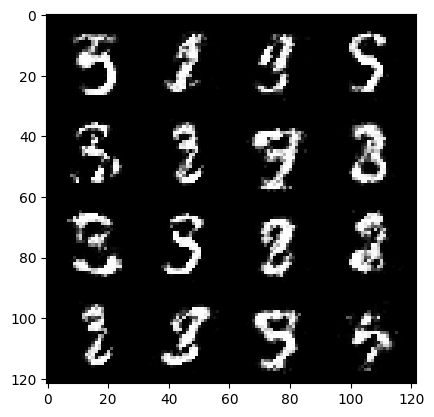

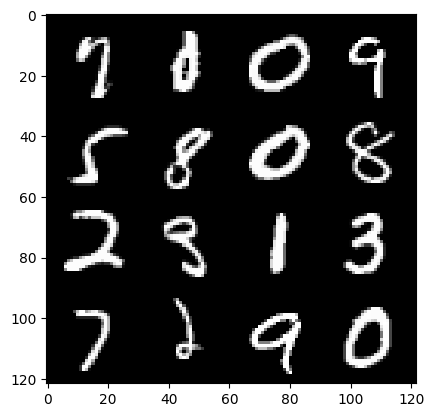

(epoch): step44100/Gen loss: 3.323832287788393/disc_loss: 0.17342666621009498


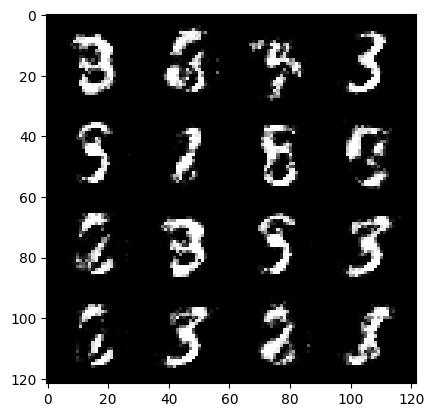

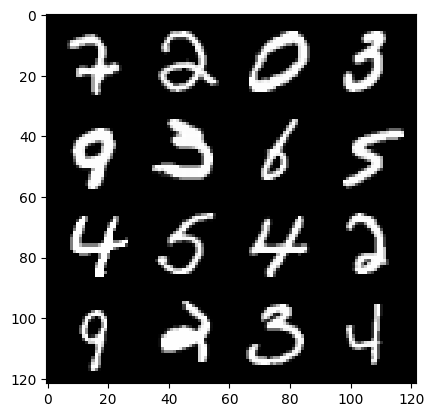

(epoch): step44400/Gen loss: 3.240211779276528/disc_loss: 0.17456083451708165


  0%|          | 0/469 [00:00<?, ?it/s]

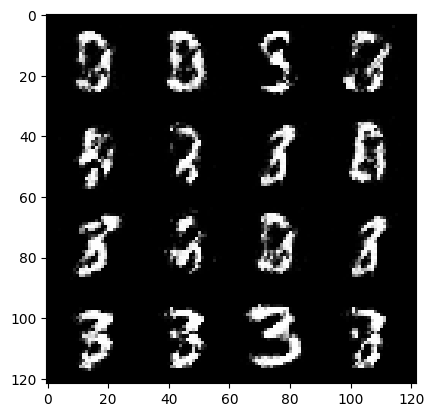

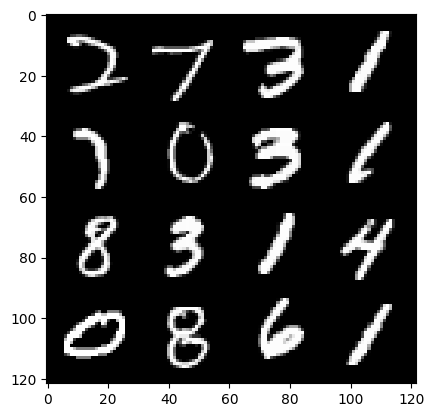

(epoch): step44700/Gen loss: 3.173676370779674/disc_loss: 0.1721960365275543


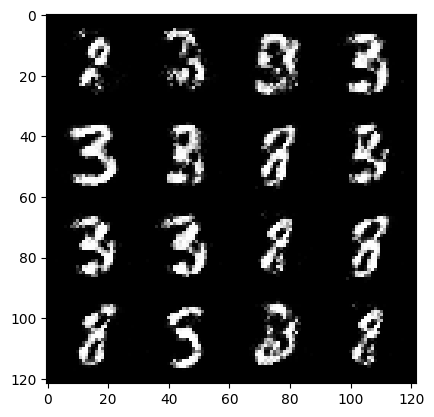

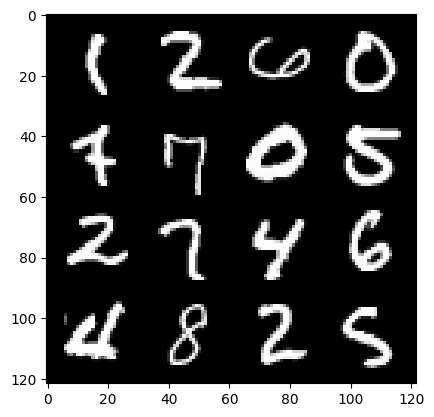

(epoch): step45000/Gen loss: 3.2406295633316047/disc_loss: 0.16777819151679677


  0%|          | 0/469 [00:00<?, ?it/s]

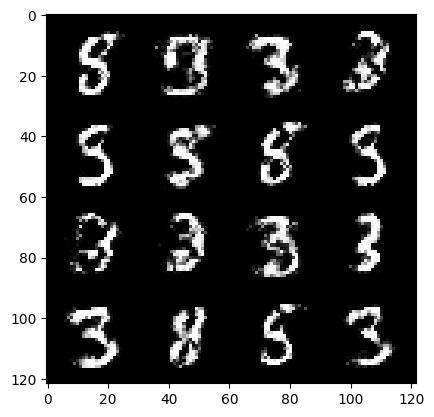

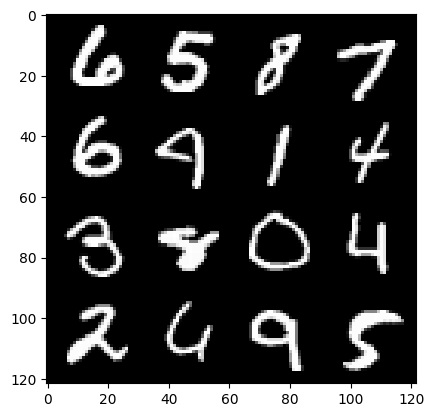

(epoch): step45300/Gen loss: 3.140300870736437/disc_loss: 0.176224035943548


  0%|          | 0/469 [00:00<?, ?it/s]

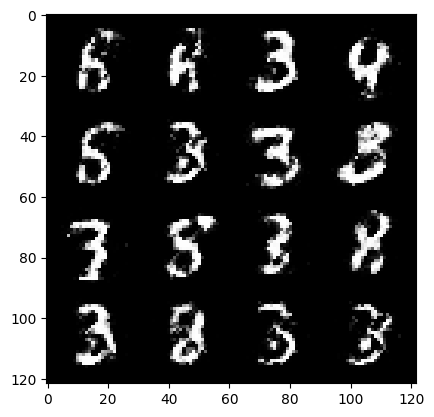

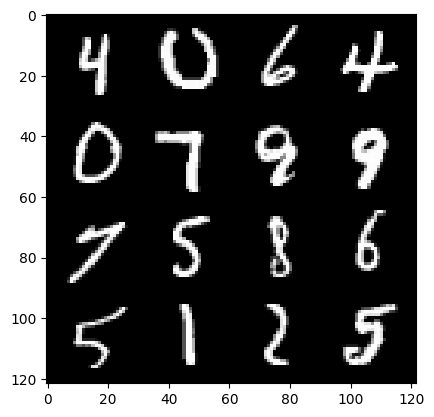

(epoch): step45600/Gen loss: 3.410579466025032/disc_loss: 0.14369833240906396


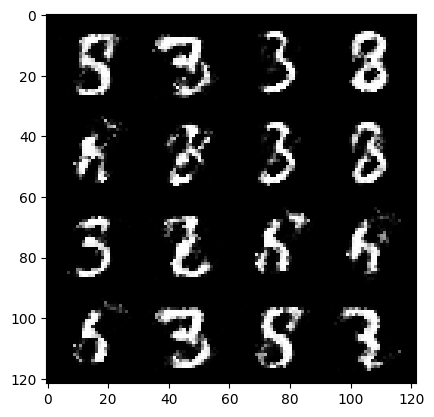

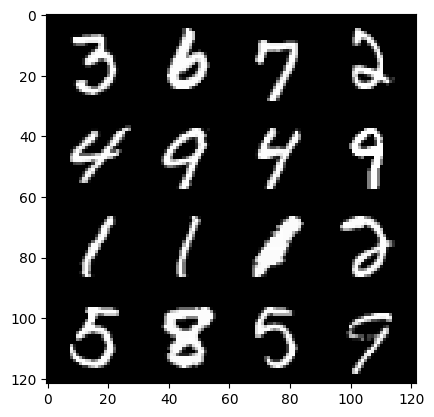

(epoch): step45900/Gen loss: 3.535490611394246/disc_loss: 0.14417626385887458


  0%|          | 0/469 [00:00<?, ?it/s]

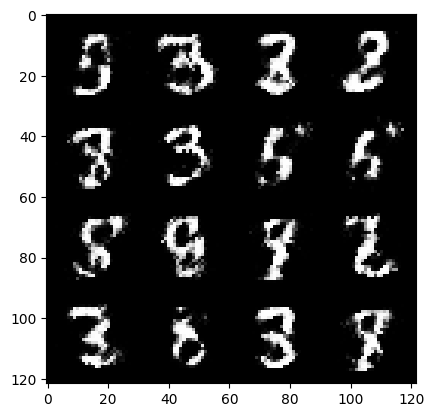

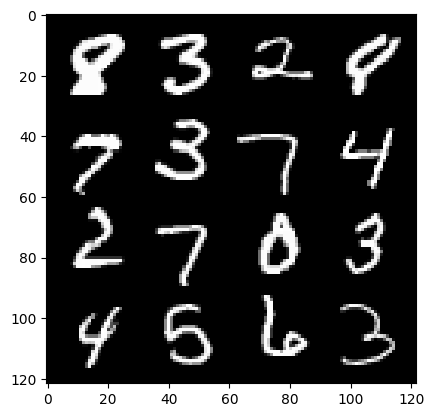

(epoch): step46200/Gen loss: 3.2159285092353818/disc_loss: 0.16885726429522038


  0%|          | 0/469 [00:00<?, ?it/s]

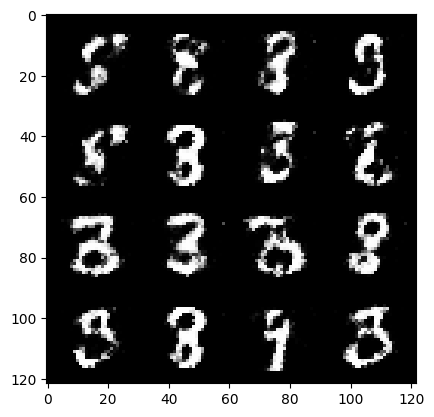

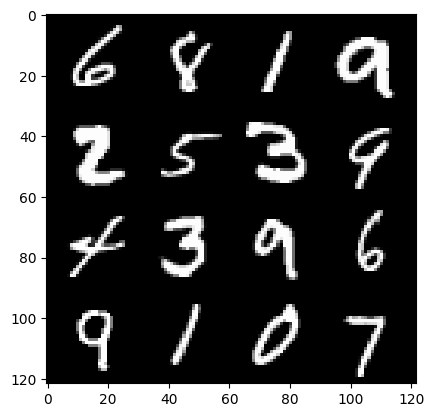

(epoch): step46500/Gen loss: 3.256609412829081/disc_loss: 0.17083413762350882


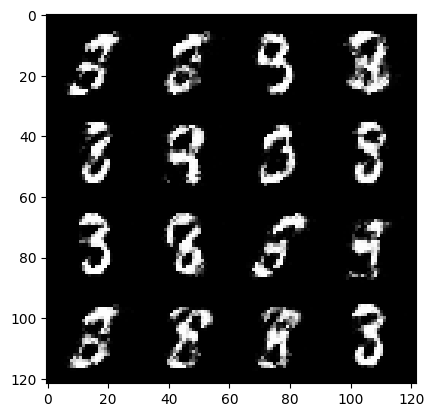

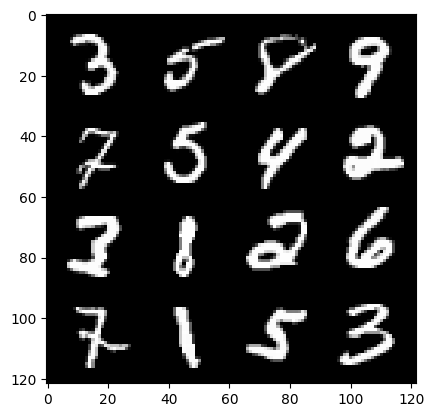

(epoch): step46800/Gen loss: 3.08237782239914/disc_loss: 0.1877353490144014


  0%|          | 0/469 [00:00<?, ?it/s]

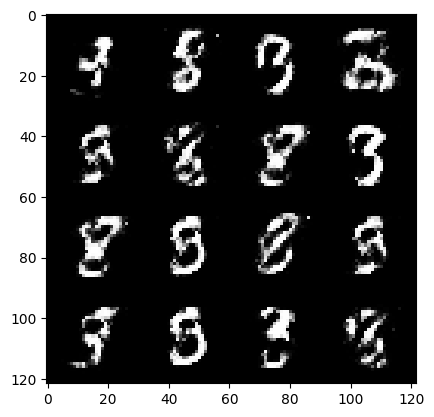

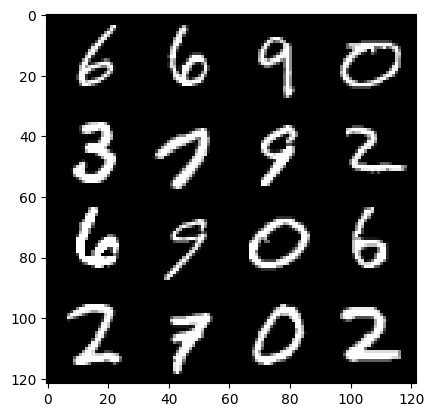

(epoch): step47100/Gen loss: 3.2052727715174365/disc_loss: 0.17749798191090413


  0%|          | 0/469 [00:00<?, ?it/s]

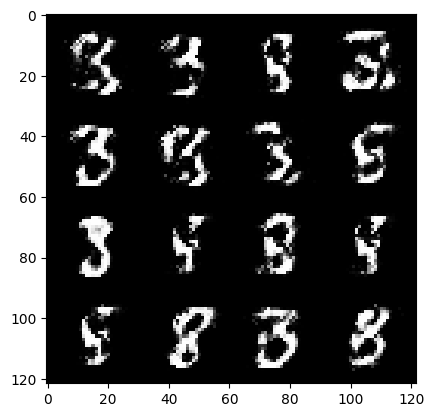

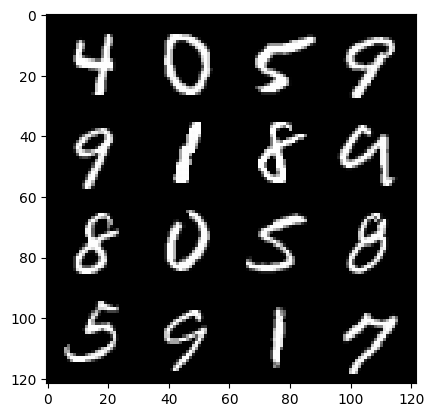

(epoch): step47400/Gen loss: 3.1891189153989186/disc_loss: 0.16745102308690554


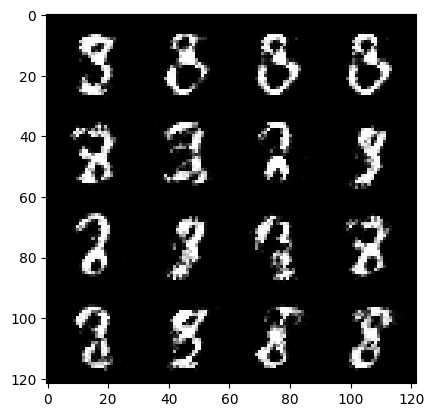

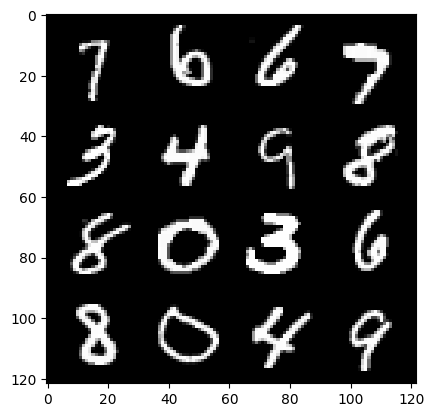

(epoch): step47700/Gen loss: 3.1813015000025424/disc_loss: 0.1788012153903643


  0%|          | 0/469 [00:00<?, ?it/s]

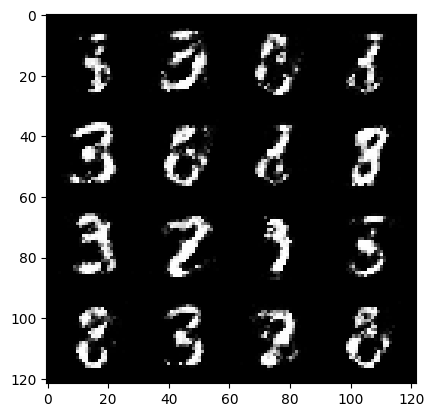

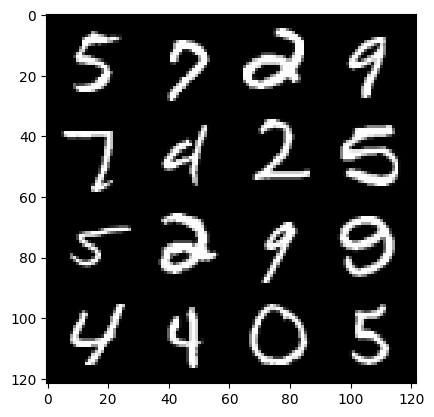

(epoch): step48000/Gen loss: 3.1133277694384267/disc_loss: 0.18802137777209277


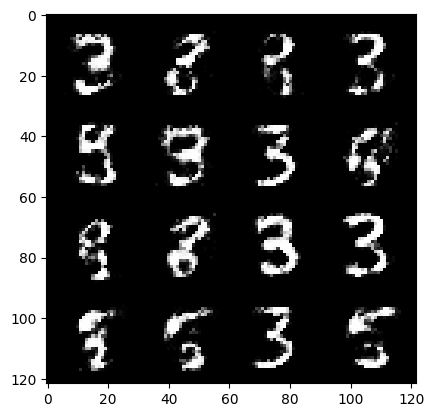

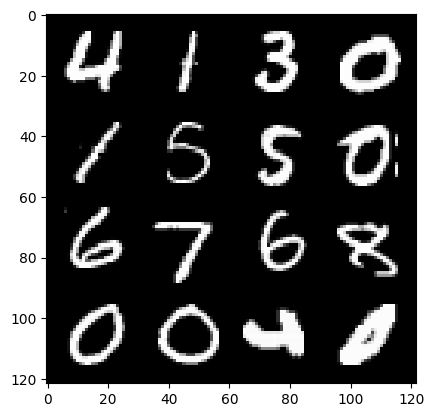

(epoch): step48300/Gen loss: 3.076067272822061/disc_loss: 0.1880784962574641


  0%|          | 0/469 [00:00<?, ?it/s]

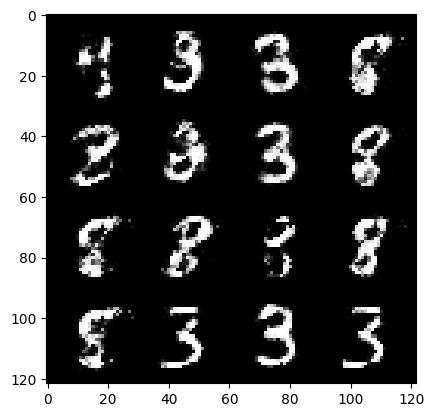

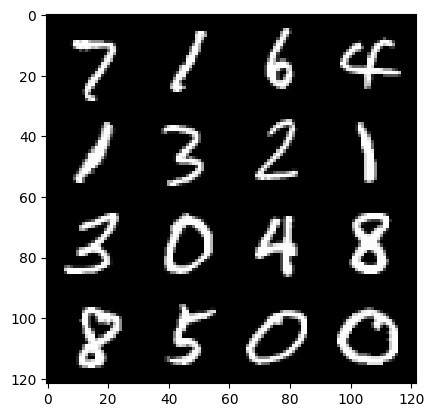

(epoch): step48600/Gen loss: 2.97414753119151/disc_loss: 0.18199513619144747


  0%|          | 0/469 [00:00<?, ?it/s]

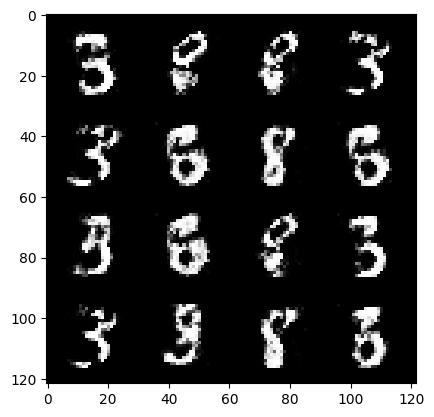

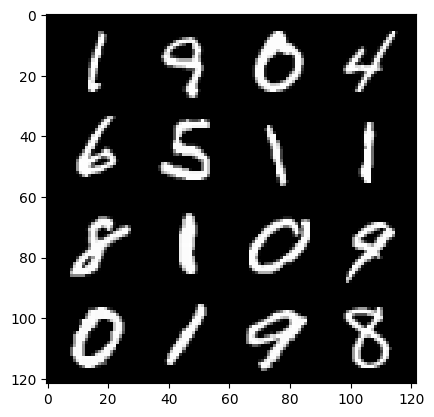

(epoch): step48900/Gen loss: 3.080436539649963/disc_loss: 0.17706714786589148


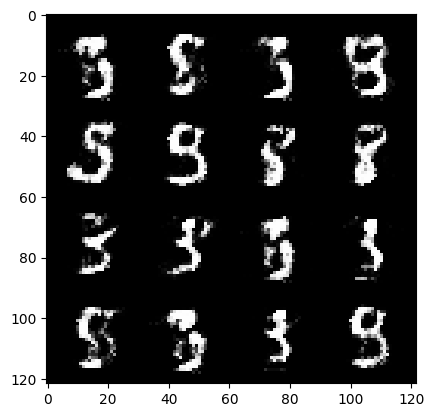

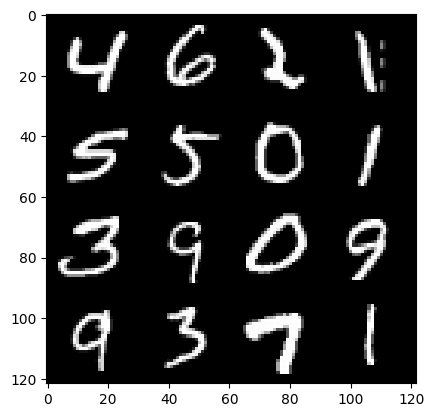

(epoch): step49200/Gen loss: 3.1784829847017946/disc_loss: 0.1662945092717807


  0%|          | 0/469 [00:00<?, ?it/s]

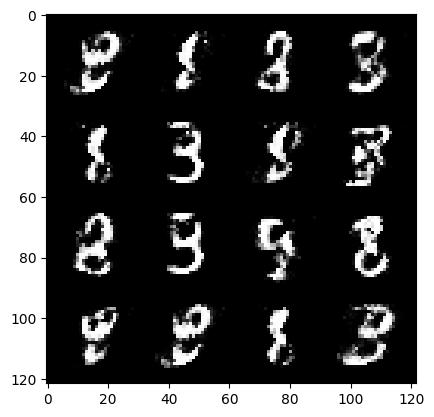

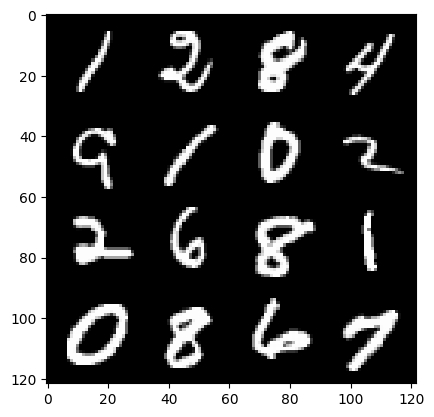

(epoch): step49500/Gen loss: 3.2001772658030188/disc_loss: 0.17508785610397656


  0%|          | 0/469 [00:00<?, ?it/s]

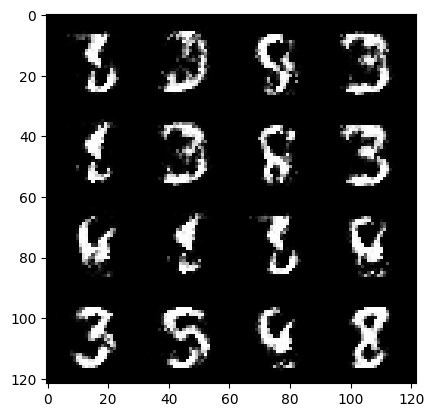

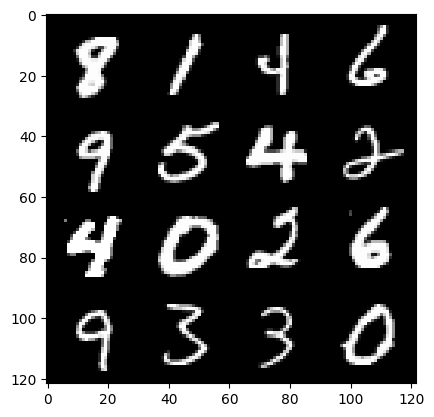

(epoch): step49800/Gen loss: 3.0549388130505855/disc_loss: 0.19082109160721317


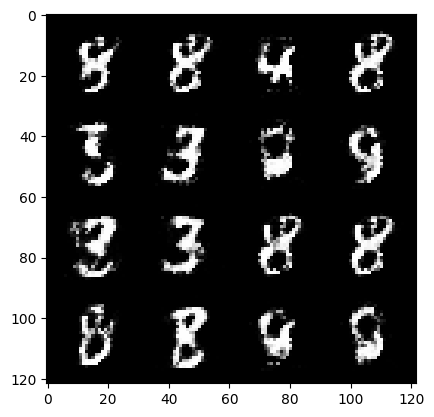

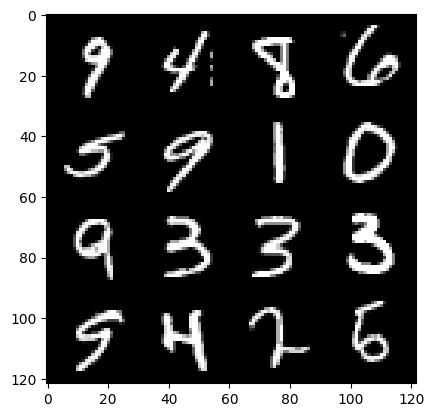

(epoch): step50100/Gen loss: 3.1983123413721763/disc_loss: 0.16295222001771134


  0%|          | 0/469 [00:00<?, ?it/s]

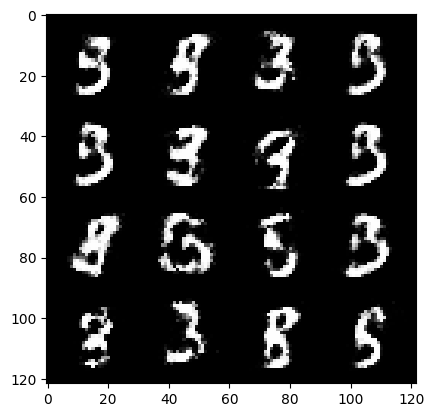

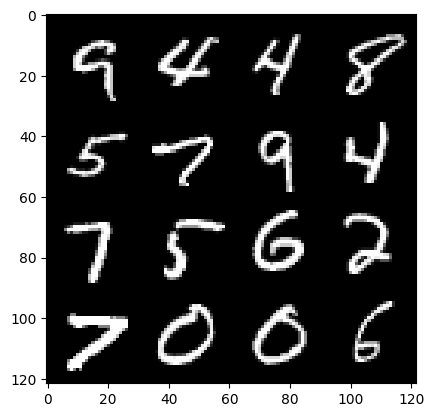

(epoch): step50400/Gen loss: 3.2165481551488204/disc_loss: 0.17015347833434744


  0%|          | 0/469 [00:00<?, ?it/s]

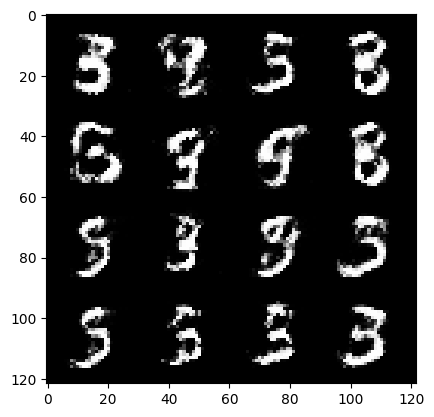

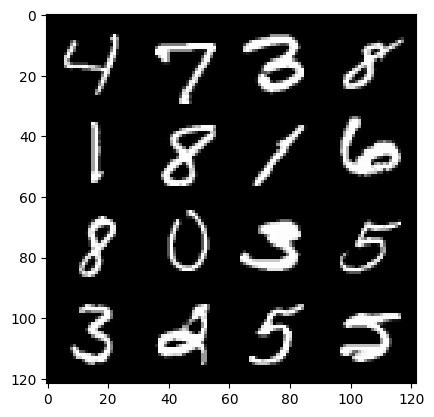

(epoch): step50700/Gen loss: 3.121041567325593/disc_loss: 0.18590989328920832


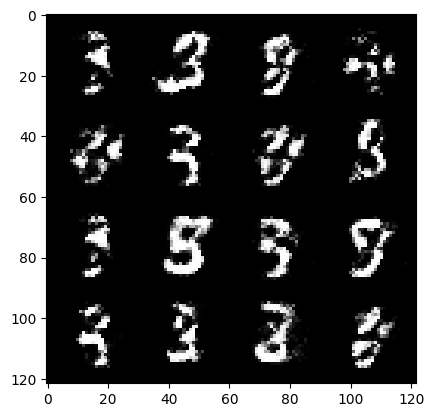

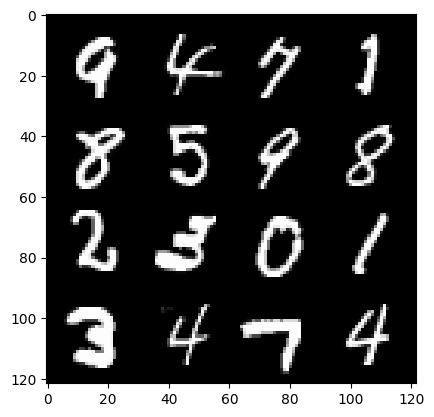

(epoch): step51000/Gen loss: 3.0528755982716875/disc_loss: 0.19919167290131243


  0%|          | 0/469 [00:00<?, ?it/s]

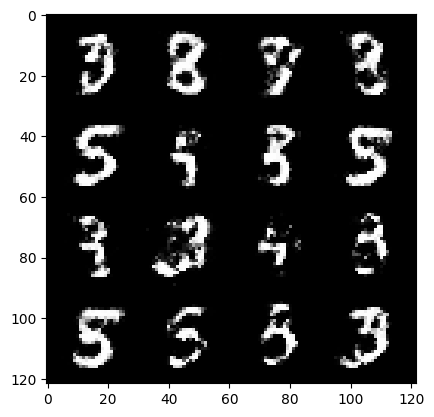

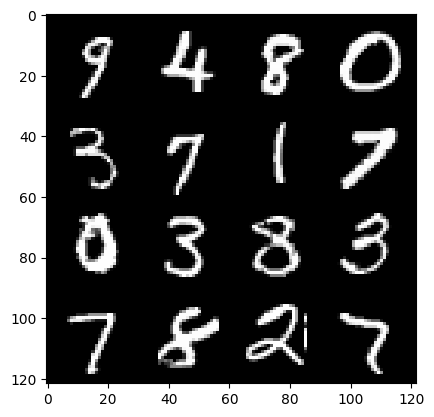

(epoch): step51300/Gen loss: 2.8652862763404845/disc_loss: 0.20594109381238626


  0%|          | 0/469 [00:00<?, ?it/s]

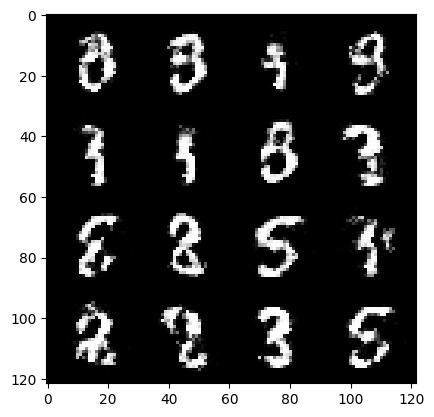

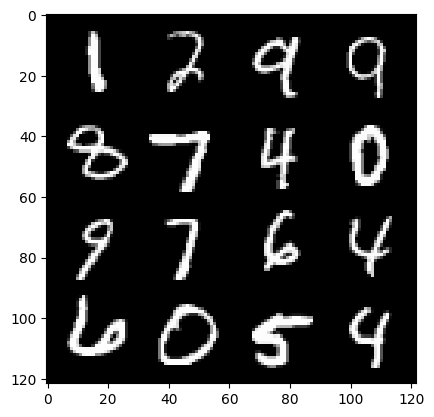

(epoch): step51600/Gen loss: 3.036152891318001/disc_loss: 0.17978192523121828


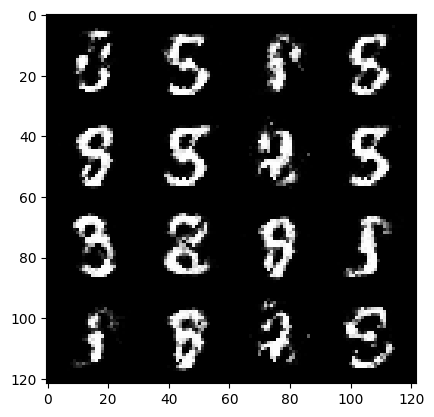

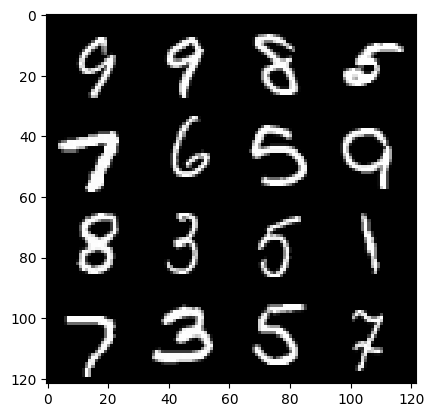

(epoch): step51900/Gen loss: 3.0903775930404658/disc_loss: 0.1811181848247846


  0%|          | 0/469 [00:00<?, ?it/s]

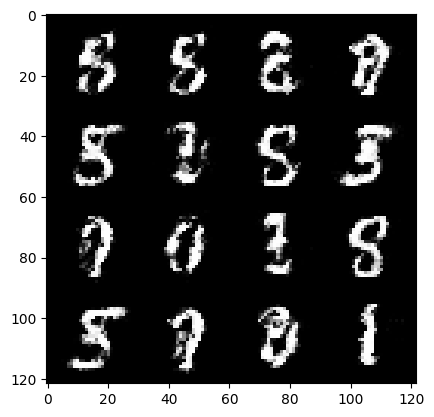

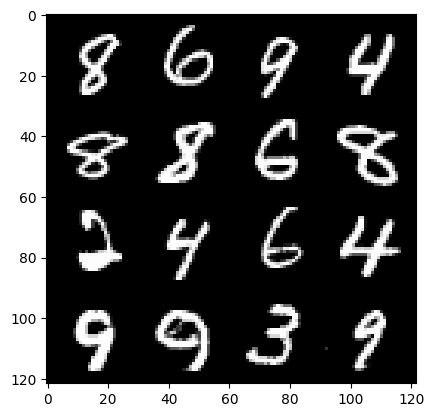

(epoch): step52200/Gen loss: 2.9746429864565544/disc_loss: 0.19316664857168991


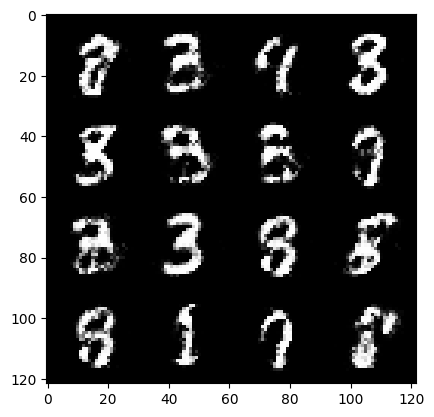

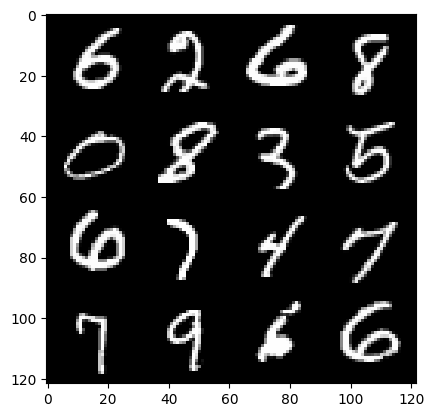

(epoch): step52500/Gen loss: 2.8799089678128564/disc_loss: 0.19650739364325984


  0%|          | 0/469 [00:00<?, ?it/s]

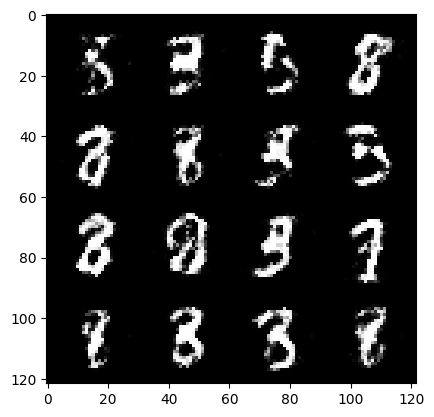

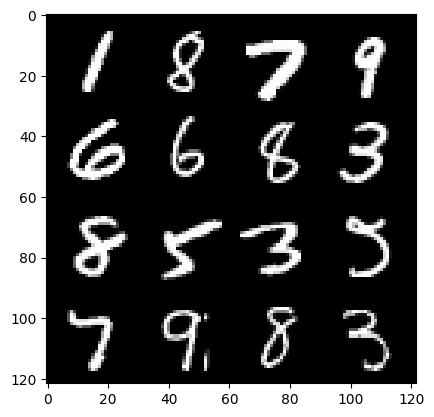

(epoch): step52800/Gen loss: 2.7870747224489842/disc_loss: 0.22063356315096233


  0%|          | 0/469 [00:00<?, ?it/s]

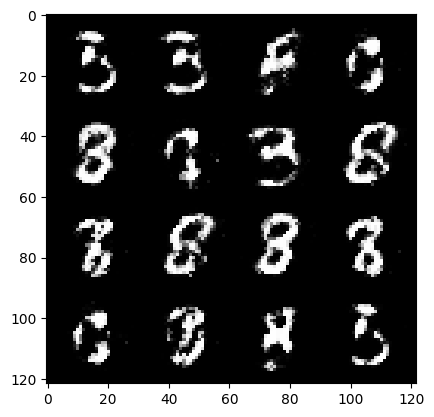

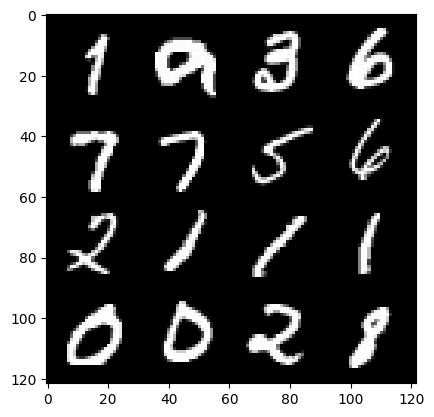

(epoch): step53100/Gen loss: 2.8226808245976756/disc_loss: 0.20133863170941665


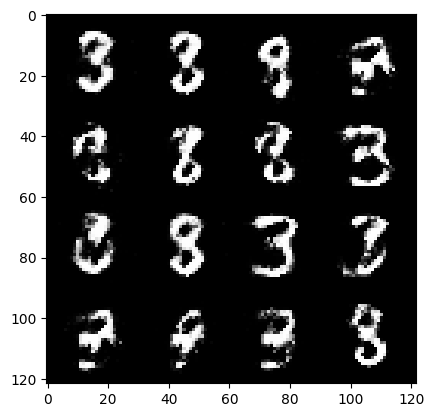

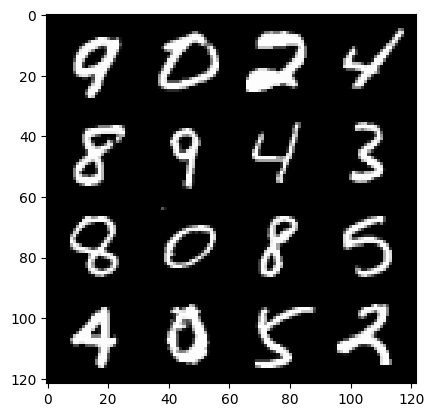

(epoch): step53400/Gen loss: 3.0594216998418178/disc_loss: 0.18216724872589107


  0%|          | 0/469 [00:00<?, ?it/s]

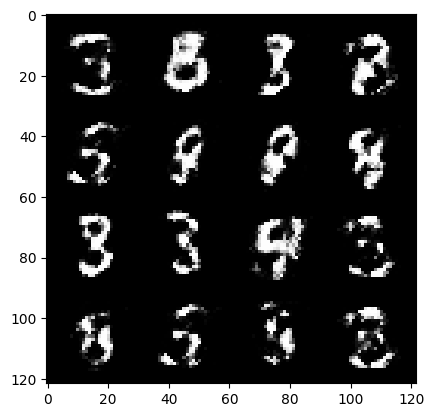

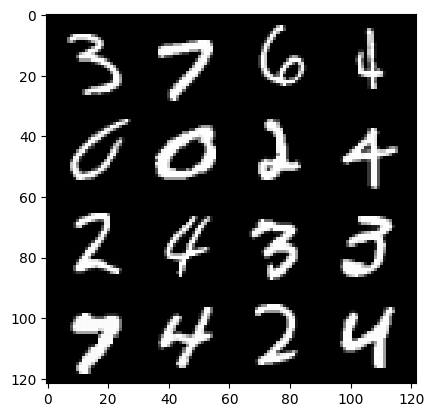

(epoch): step53700/Gen loss: 2.9873831216494238/disc_loss: 0.18687304156521947


  0%|          | 0/469 [00:00<?, ?it/s]

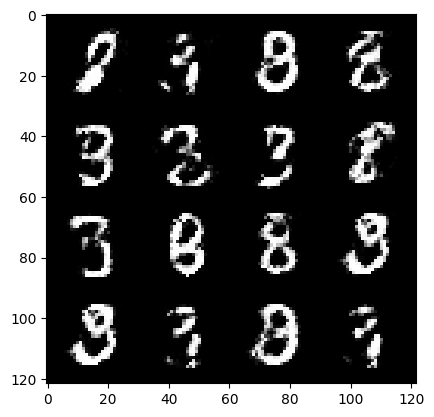

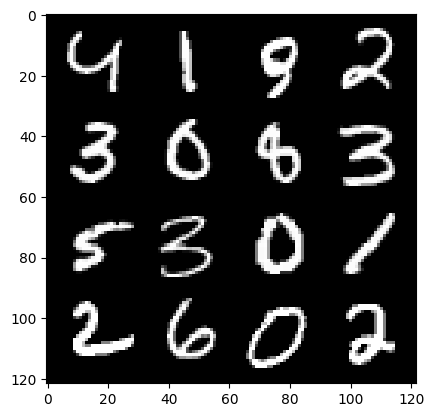

(epoch): step54000/Gen loss: 2.8970947798093176/disc_loss: 0.2051721015820901


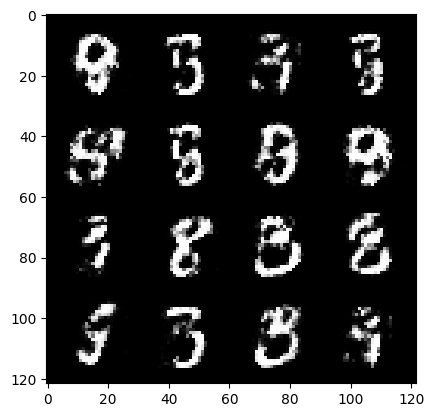

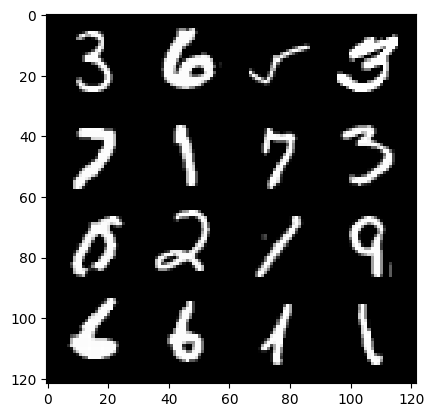

(epoch): step54300/Gen loss: 2.814442045688632/disc_loss: 0.22413256992896405


  0%|          | 0/469 [00:00<?, ?it/s]

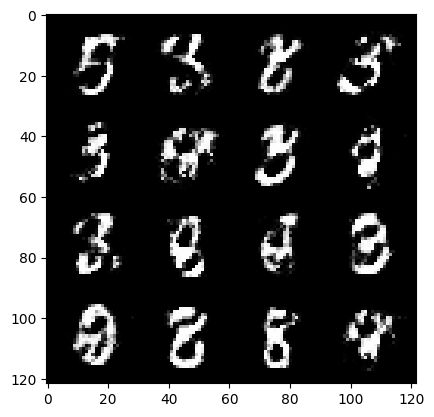

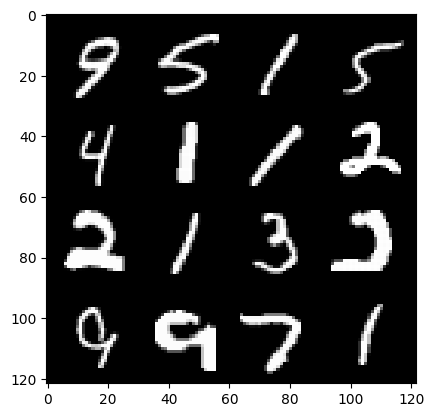

(epoch): step54600/Gen loss: 2.784425000349682/disc_loss: 0.22154432348906997


  0%|          | 0/469 [00:00<?, ?it/s]

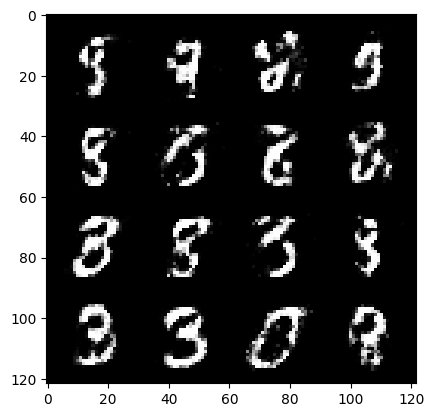

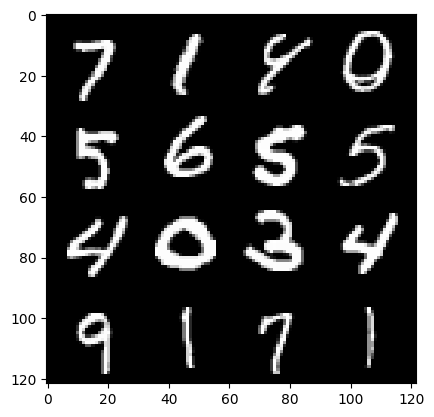

(epoch): step54900/Gen loss: 2.9190582116444914/disc_loss: 0.1876744715372721


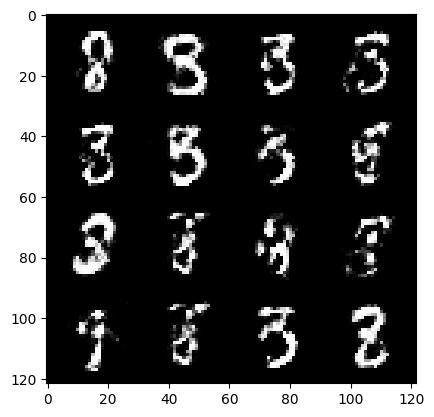

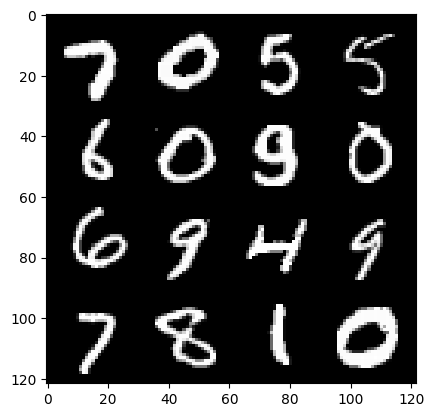

(epoch): step55200/Gen loss: 2.844346883296966/disc_loss: 0.21472110720972218


  0%|          | 0/469 [00:00<?, ?it/s]

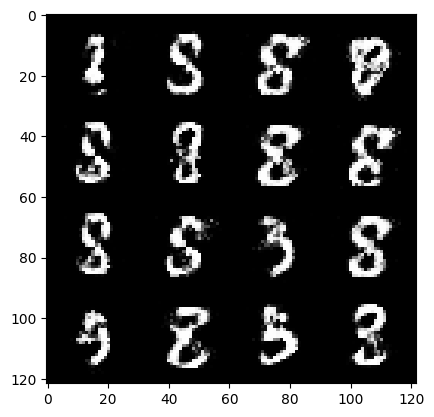

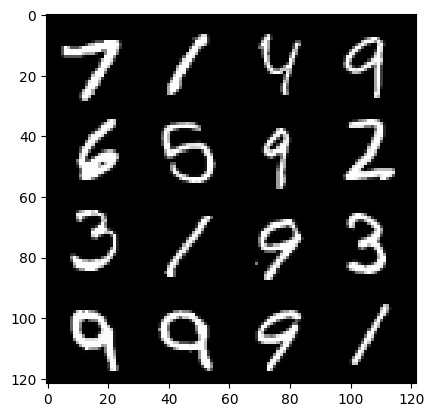

(epoch): step55500/Gen loss: 2.719363667170206/disc_loss: 0.23737010657787322


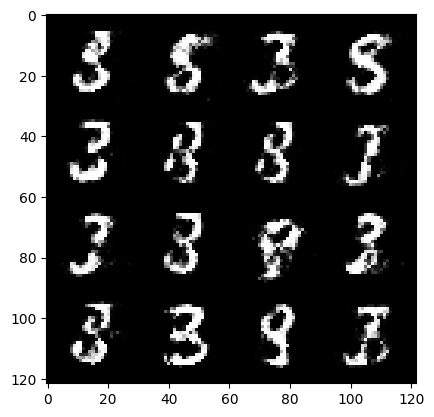

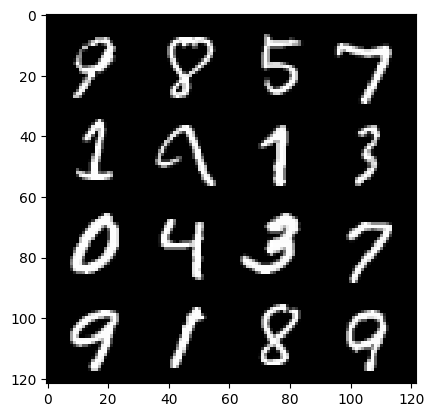

(epoch): step55800/Gen loss: 2.879809904098511/disc_loss: 0.20042404234409353


  0%|          | 0/469 [00:00<?, ?it/s]

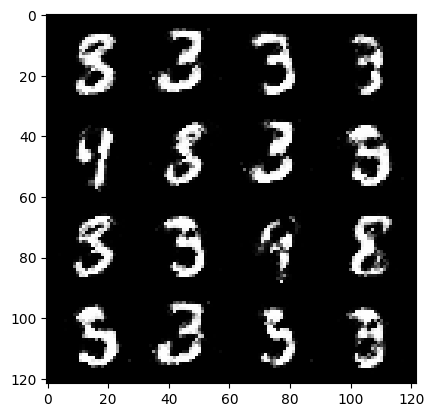

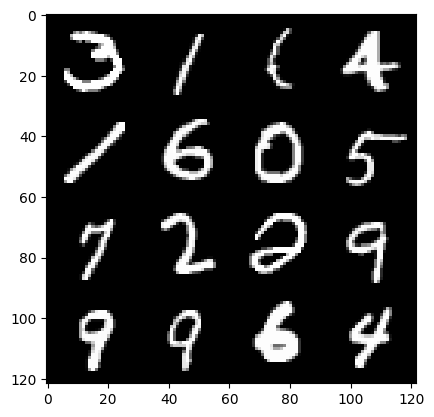

(epoch): step56100/Gen loss: 2.769402175744374/disc_loss: 0.21558120141426731


  0%|          | 0/469 [00:00<?, ?it/s]

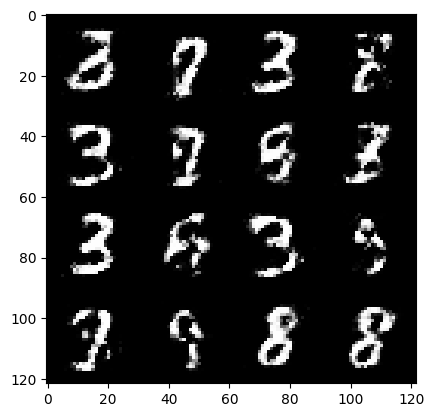

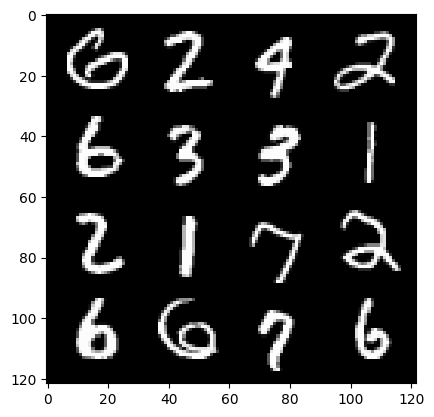

(epoch): step56400/Gen loss: 2.56008863290151/disc_loss: 0.2512902008990447


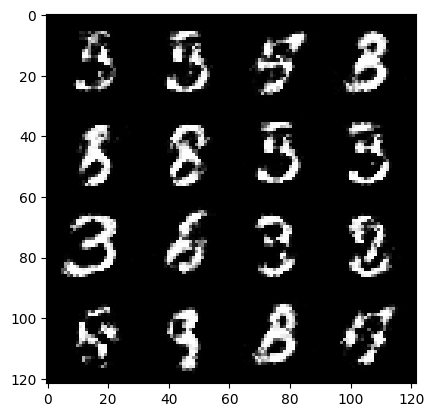

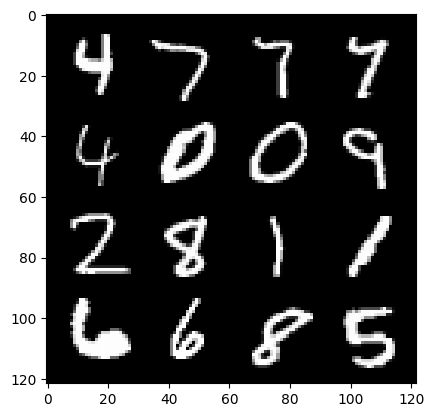

(epoch): step56700/Gen loss: 2.5652695377667745/disc_loss: 0.240585195819537


  0%|          | 0/469 [00:00<?, ?it/s]

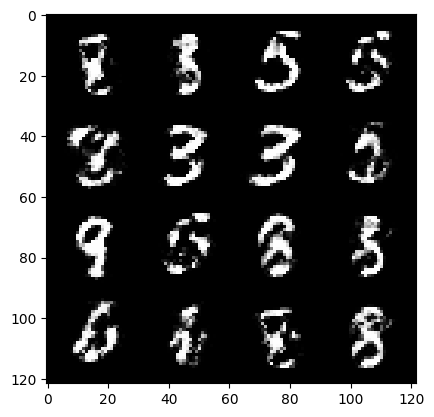

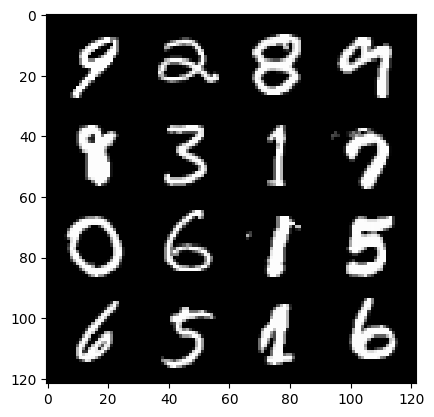

(epoch): step57000/Gen loss: 2.8167858084042856/disc_loss: 0.19654773809015746


  0%|          | 0/469 [00:00<?, ?it/s]

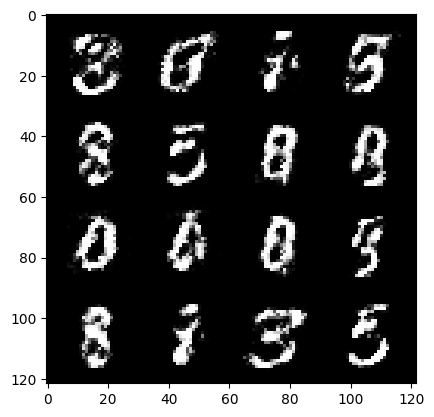

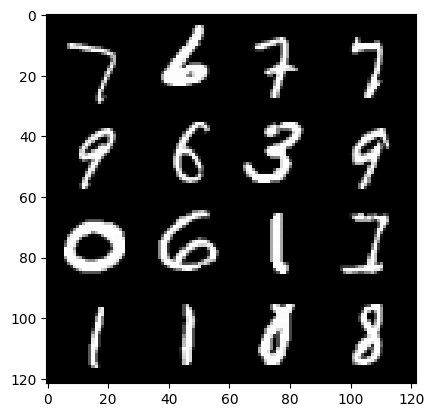

(epoch): step57300/Gen loss: 2.7865162181854233/disc_loss: 0.20280725009739398


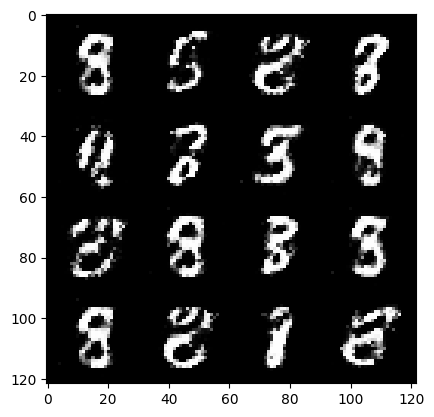

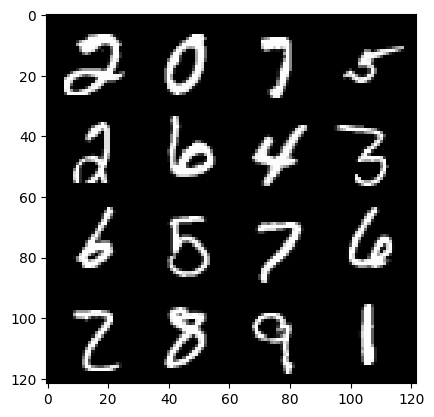

(epoch): step57600/Gen loss: 2.7572375583648694/disc_loss: 0.21415821053087702


  0%|          | 0/469 [00:00<?, ?it/s]

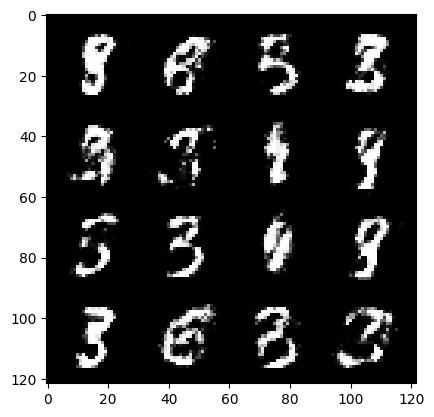

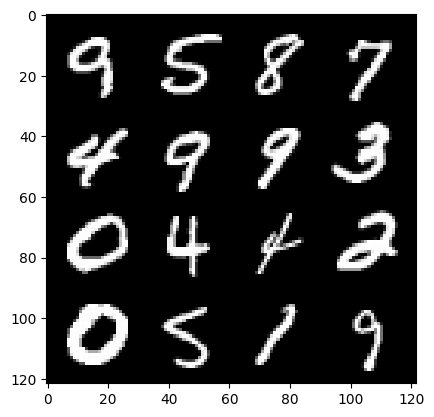

(epoch): step57900/Gen loss: 2.703160720666251/disc_loss: 0.21604921656350293


  0%|          | 0/469 [00:00<?, ?it/s]

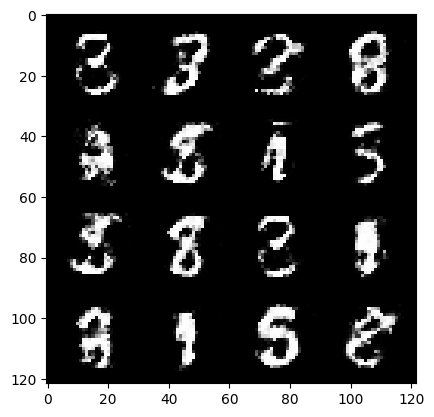

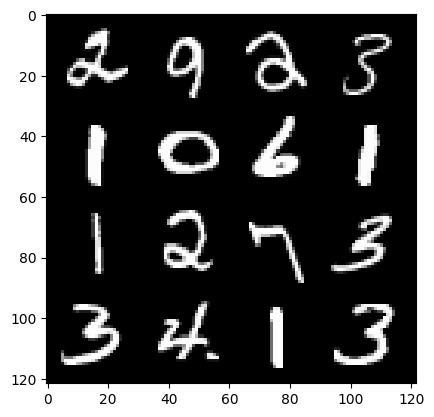

(epoch): step58200/Gen loss: 2.5667030362288172/disc_loss: 0.23920430205762389


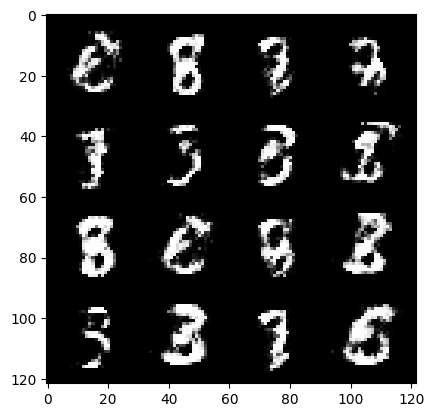

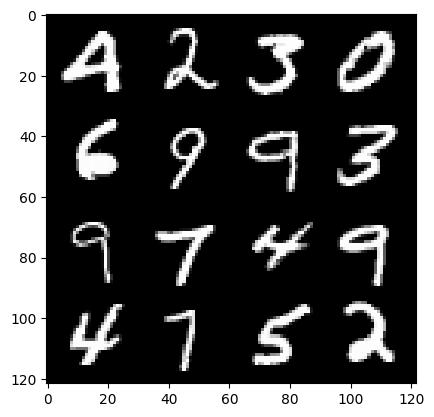

(epoch): step58500/Gen loss: 2.5759506313006053/disc_loss: 0.2346325250466664


  0%|          | 0/469 [00:00<?, ?it/s]

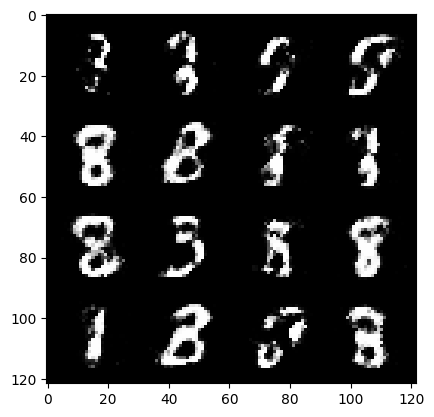

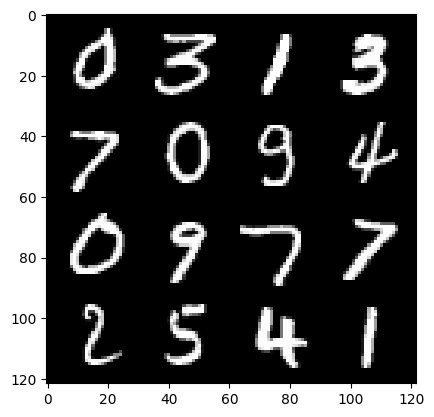

(epoch): step58800/Gen loss: 2.619032204151153/disc_loss: 0.2443100814521314


  0%|          | 0/469 [00:00<?, ?it/s]

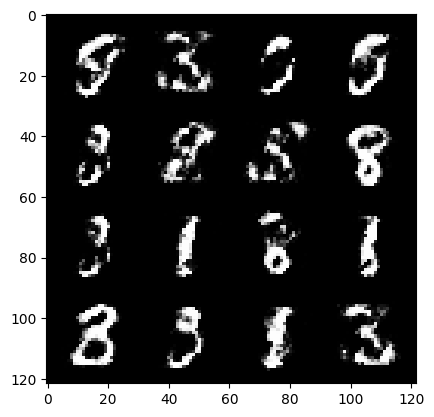

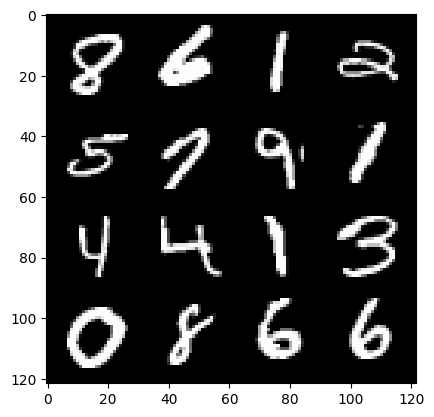

(epoch): step59100/Gen loss: 2.4623532863458/disc_loss: 0.2676835905015469


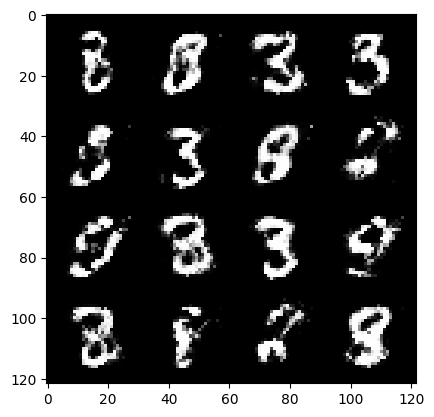

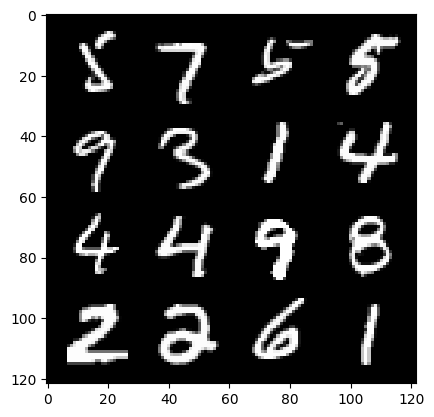

(epoch): step59400/Gen loss: 2.612009030183156/disc_loss: 0.23088693062464383


  0%|          | 0/469 [00:00<?, ?it/s]

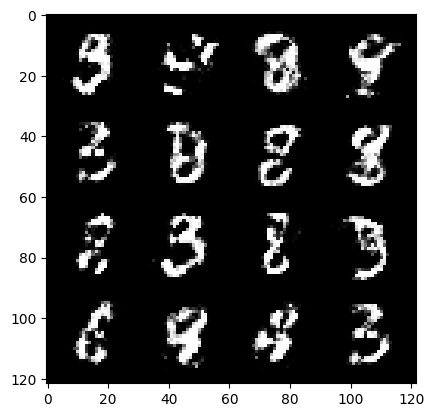

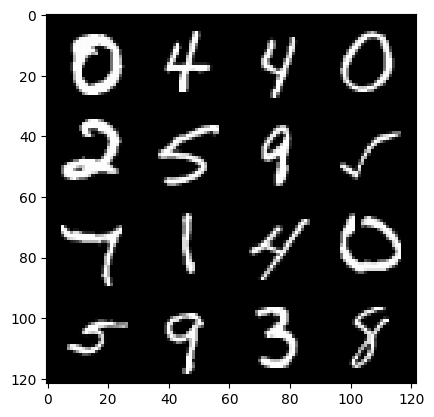

(epoch): step59700/Gen loss: 2.588466447989144/disc_loss: 0.23421034966905915


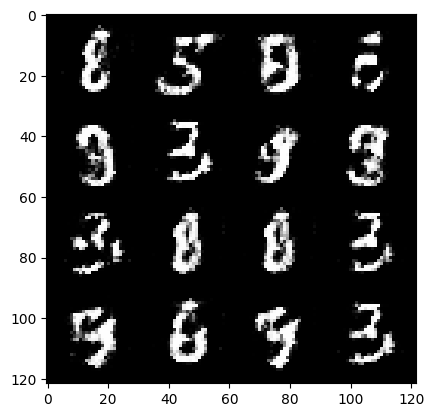

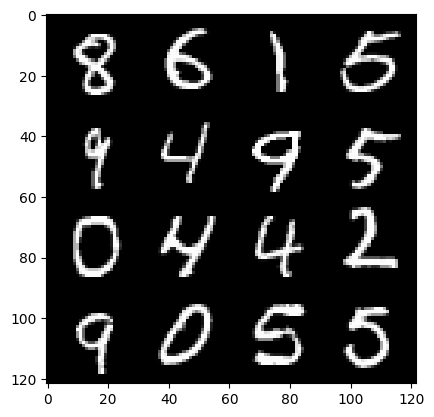

(epoch): step60000/Gen loss: 2.5576298395792634/disc_loss: 0.24115357560416048


  0%|          | 0/469 [00:00<?, ?it/s]

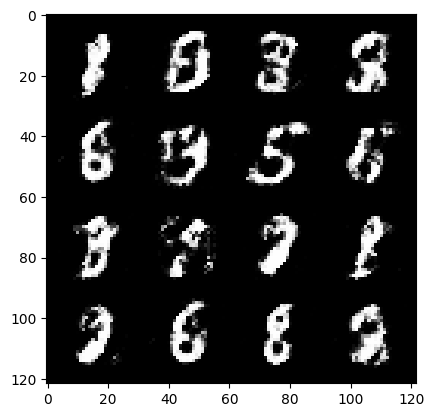

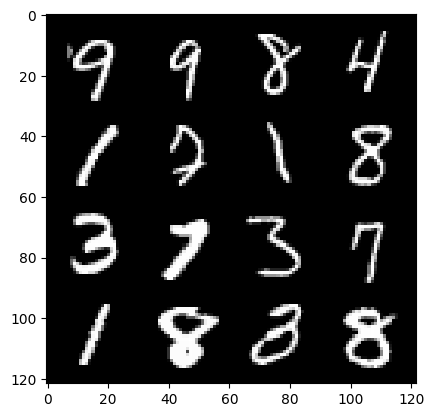

(epoch): step60300/Gen loss: 2.5939471872647593/disc_loss: 0.22989943866928403


  0%|          | 0/469 [00:00<?, ?it/s]

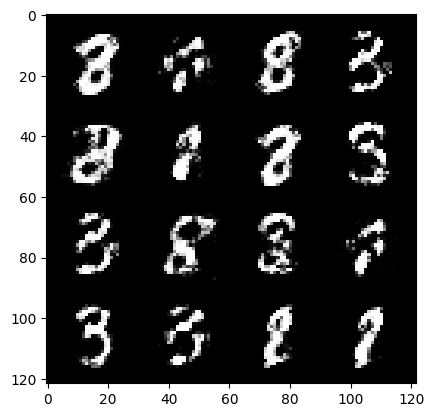

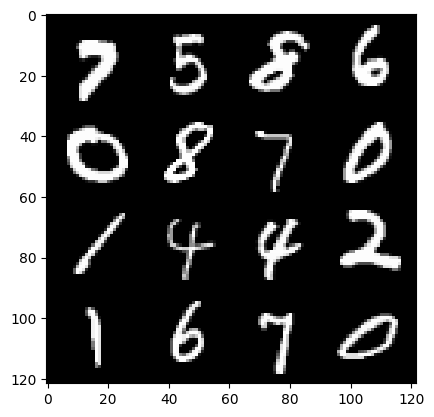

(epoch): step60600/Gen loss: 2.6198009427388524/disc_loss: 0.2233651522795358


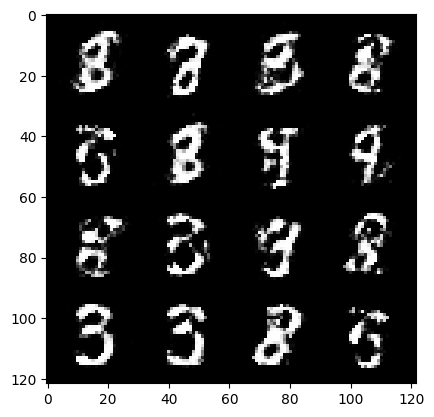

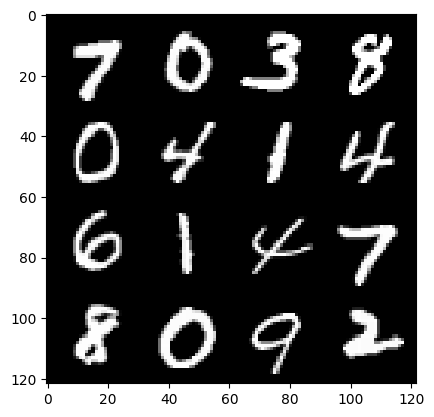

(epoch): step60900/Gen loss: 2.598583287398019/disc_loss: 0.2224751745164394


  0%|          | 0/469 [00:00<?, ?it/s]

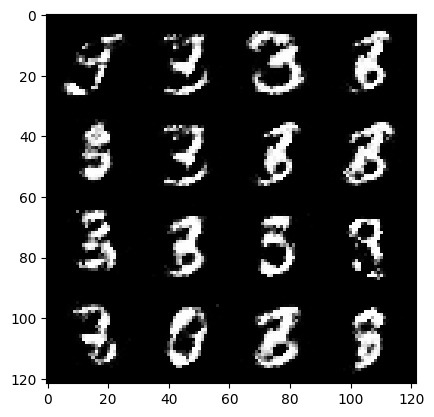

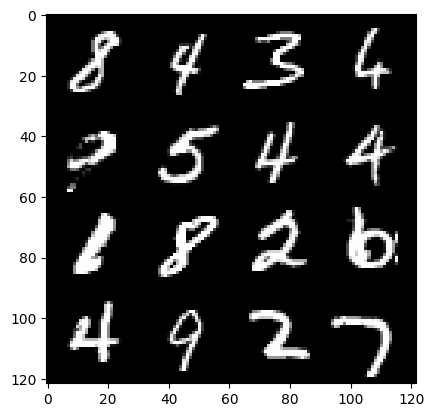

(epoch): step61200/Gen loss: 2.7469613043467183/disc_loss: 0.2076063382377226


  0%|          | 0/469 [00:00<?, ?it/s]

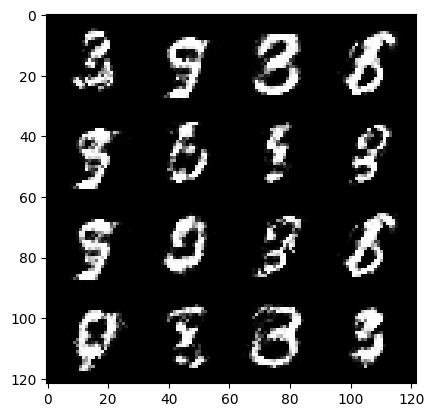

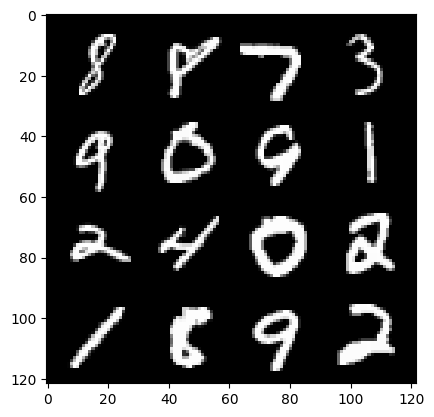

(epoch): step61500/Gen loss: 2.5634015373388945/disc_loss: 0.23911654422680548


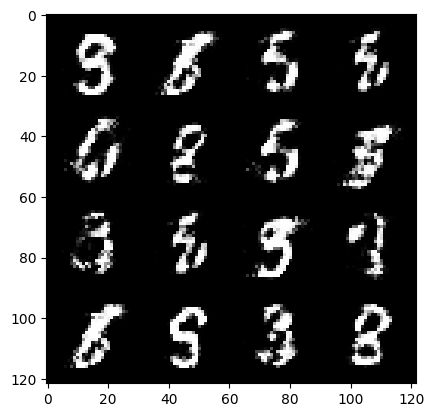

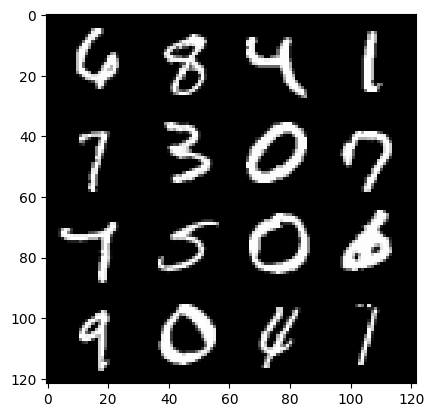

(epoch): step61800/Gen loss: 2.469427867333094/disc_loss: 0.24949819773435597


  0%|          | 0/469 [00:00<?, ?it/s]

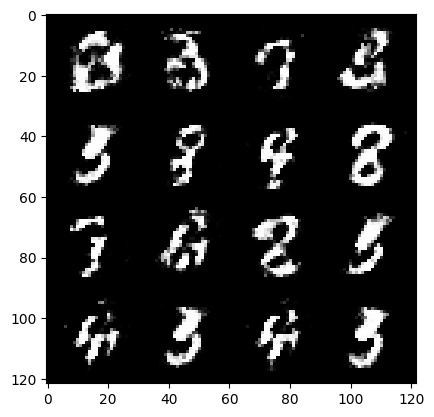

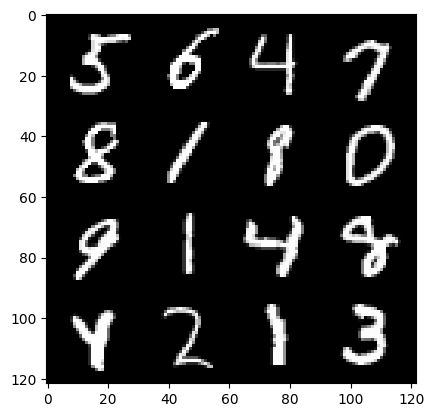

(epoch): step62100/Gen loss: 2.581926908493039/disc_loss: 0.23186247780919075


  0%|          | 0/469 [00:00<?, ?it/s]

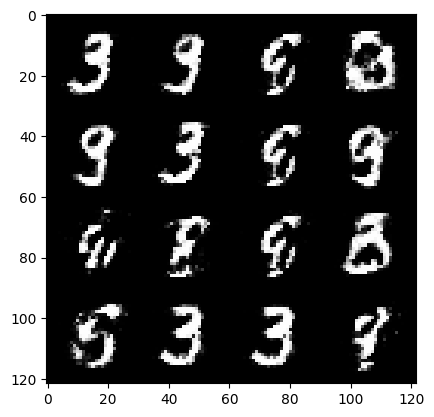

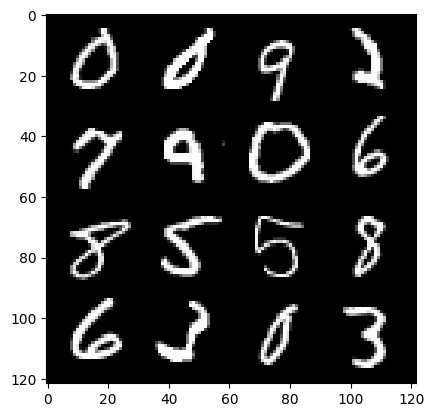

(epoch): step62400/Gen loss: 2.642969816525778/disc_loss: 0.2185022043188414


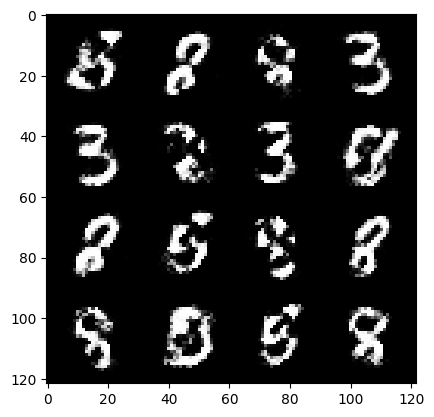

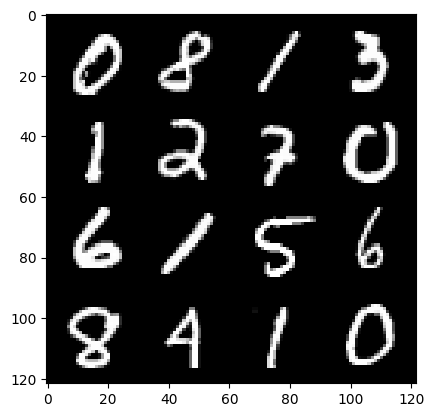

(epoch): step62700/Gen loss: 2.6620322219530737/disc_loss: 0.22837208807468393


  0%|          | 0/469 [00:00<?, ?it/s]

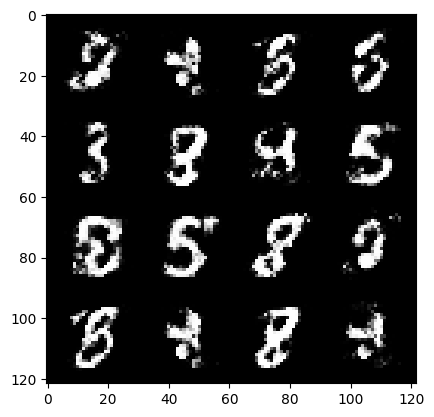

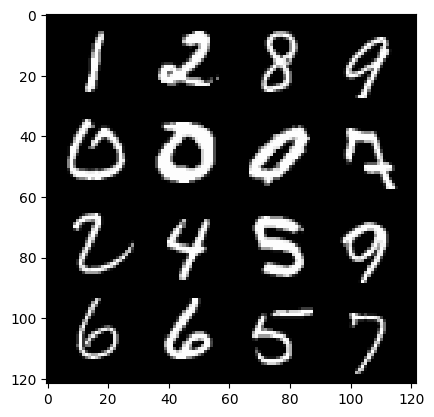

(epoch): step63000/Gen loss: 2.4856038188934324/disc_loss: 0.2506848552326364


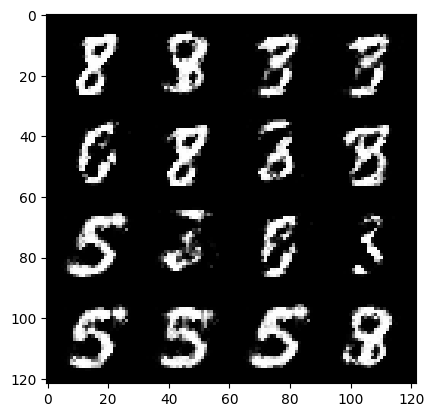

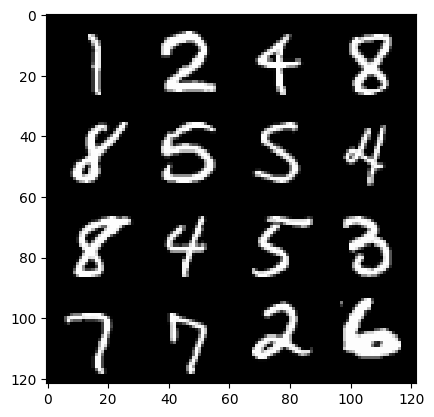

(epoch): step63300/Gen loss: 2.640737445354461/disc_loss: 0.2123129576941331


  0%|          | 0/469 [00:00<?, ?it/s]

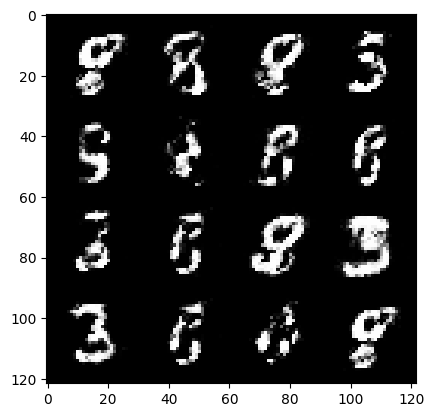

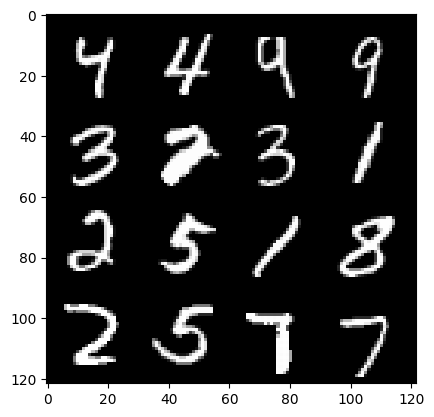

(epoch): step63600/Gen loss: 2.6038822984695447/disc_loss: 0.21479310298959423


  0%|          | 0/469 [00:00<?, ?it/s]

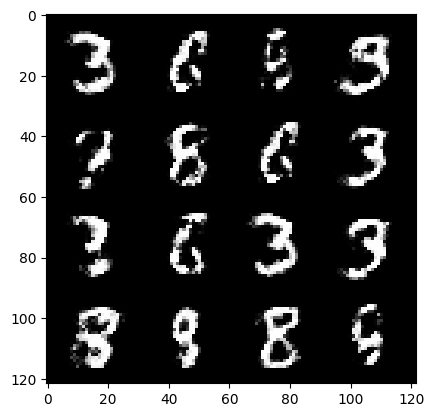

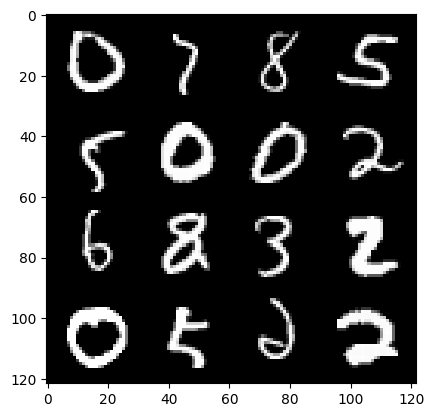

(epoch): step63900/Gen loss: 2.6755841191609653/disc_loss: 0.21469665306309862


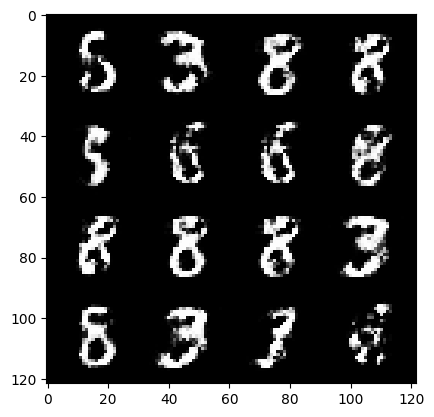

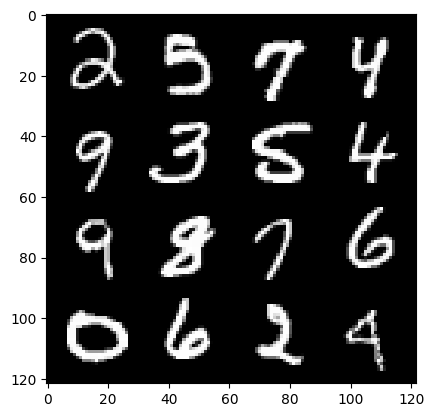

(epoch): step64200/Gen loss: 2.482729078531265/disc_loss: 0.23556646540760995


  0%|          | 0/469 [00:00<?, ?it/s]

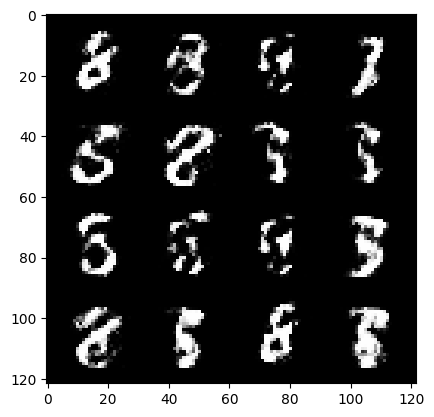

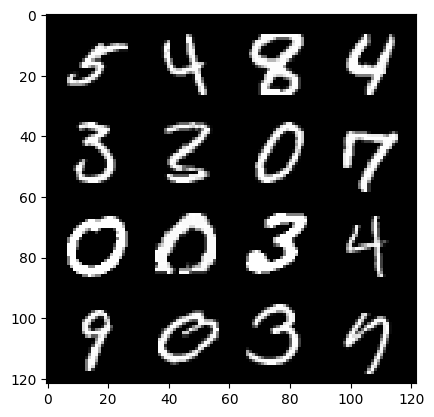

(epoch): step64500/Gen loss: 2.5992663566271466/disc_loss: 0.2161593695233265


  0%|          | 0/469 [00:00<?, ?it/s]

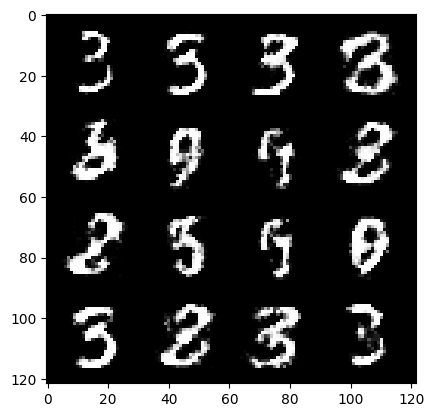

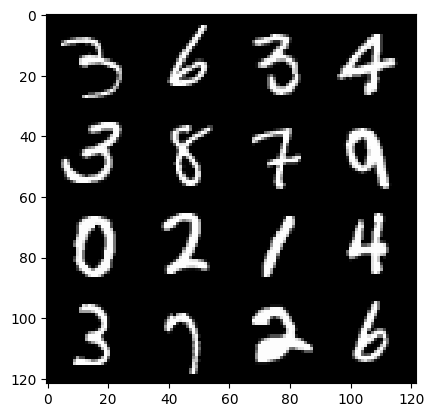

(epoch): step64800/Gen loss: 2.5236805367469763/disc_loss: 0.24301156570514032


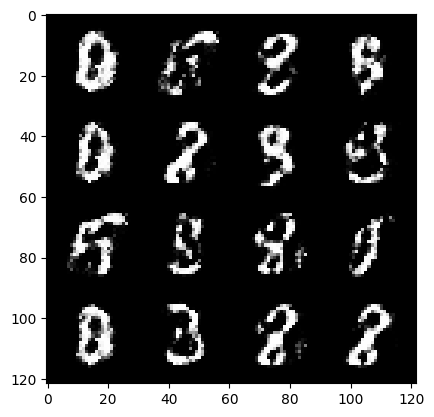

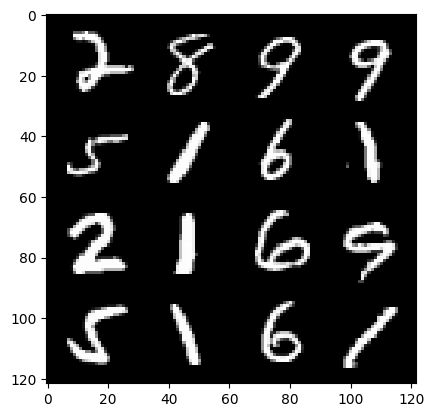

(epoch): step65100/Gen loss: 2.542864910761516/disc_loss: 0.23355303183197973


  0%|          | 0/469 [00:00<?, ?it/s]

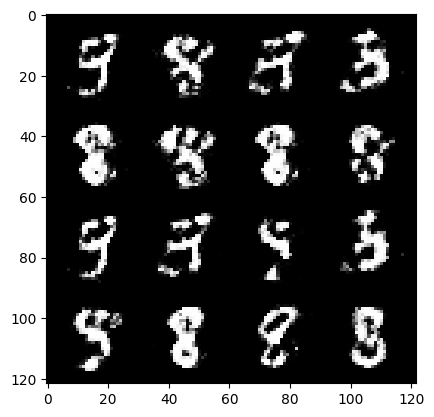

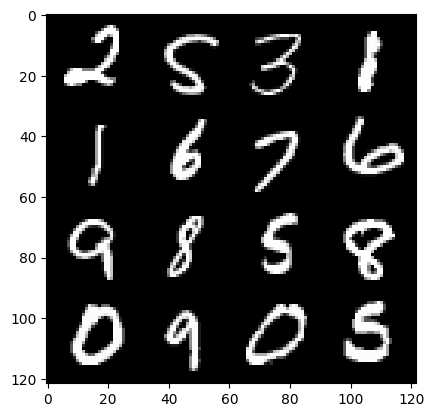

(epoch): step65400/Gen loss: 2.540876939694088/disc_loss: 0.23836627821127584


  0%|          | 0/469 [00:00<?, ?it/s]

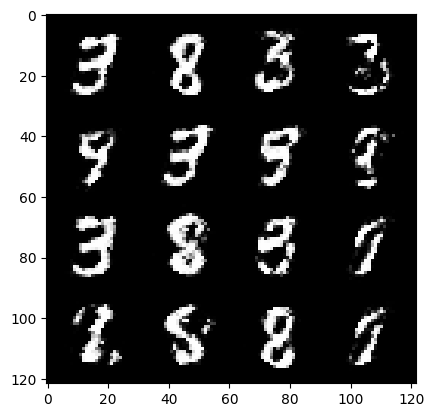

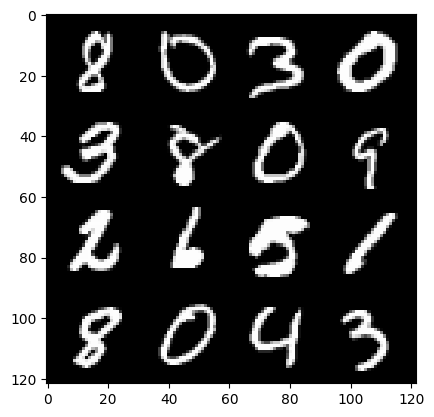

(epoch): step65700/Gen loss: 2.610400852362315/disc_loss: 0.22666296218832344


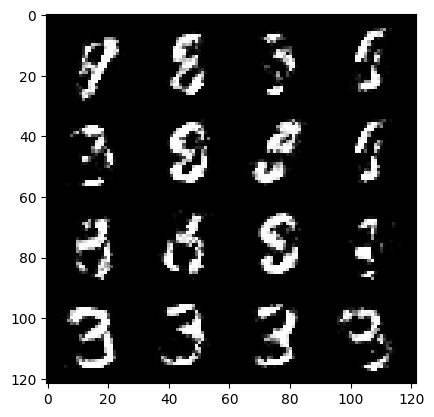

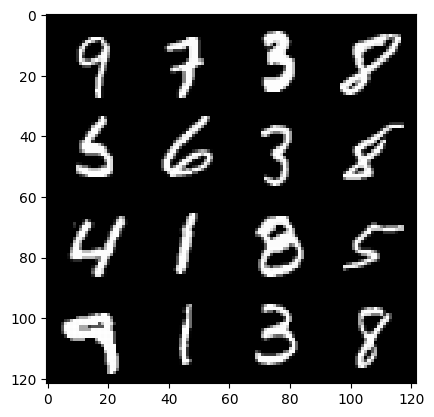

(epoch): step66000/Gen loss: 2.523269284963606/disc_loss: 0.23562233348687486


  0%|          | 0/469 [00:00<?, ?it/s]

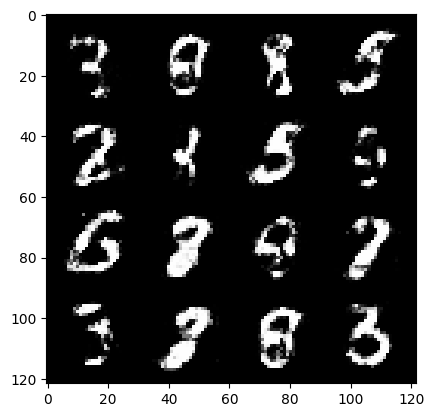

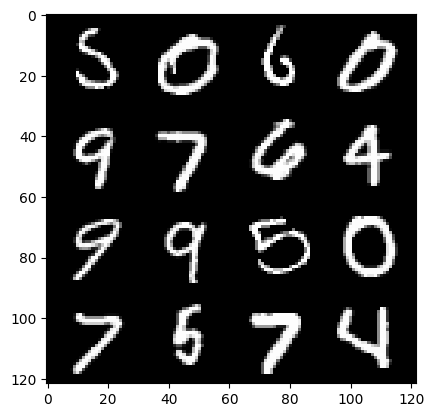

(epoch): step66300/Gen loss: 2.453140304883322/disc_loss: 0.24767102688550965


  0%|          | 0/469 [00:00<?, ?it/s]

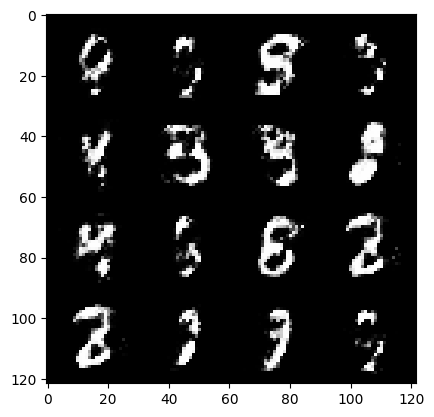

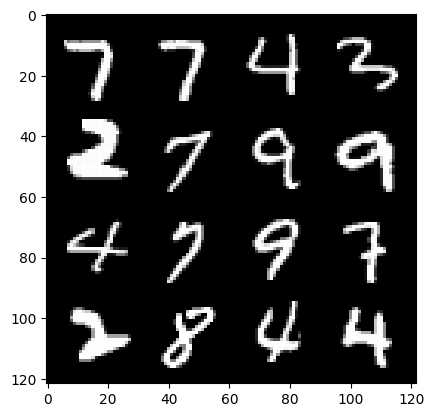

(epoch): step66600/Gen loss: 2.4853582906723006/disc_loss: 0.24048653061191227


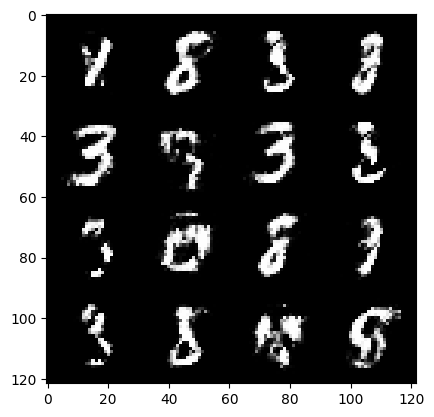

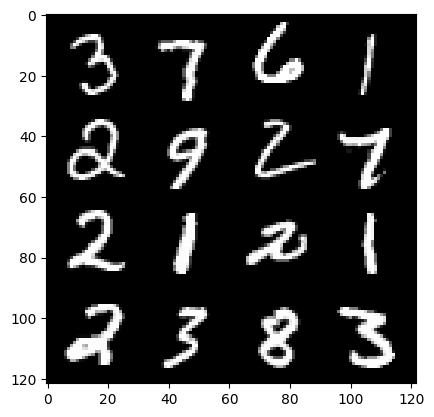

(epoch): step66900/Gen loss: 2.42702204823494/disc_loss: 0.25293874258796367


  0%|          | 0/469 [00:00<?, ?it/s]

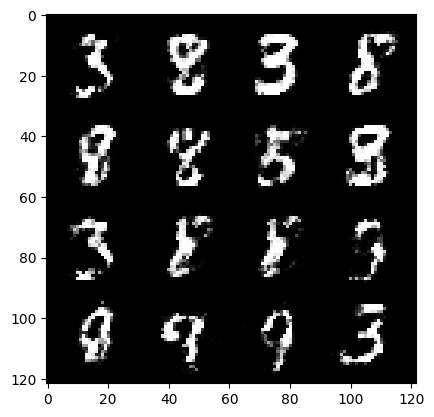

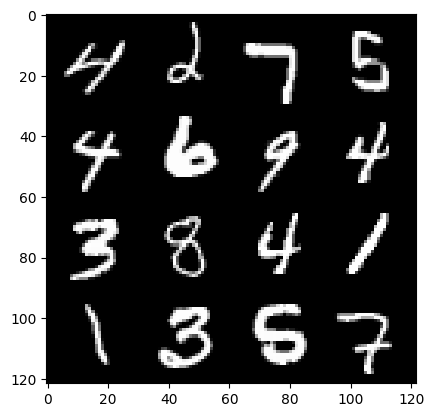

(epoch): step67200/Gen loss: 2.3738487537701918/disc_loss: 0.26008688911795597


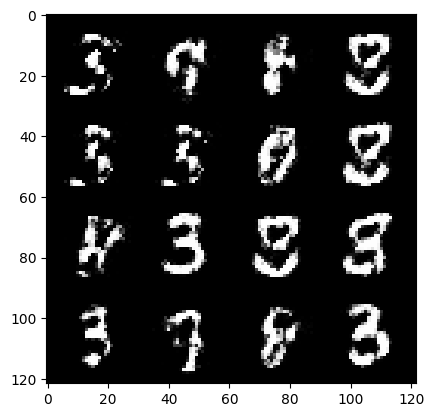

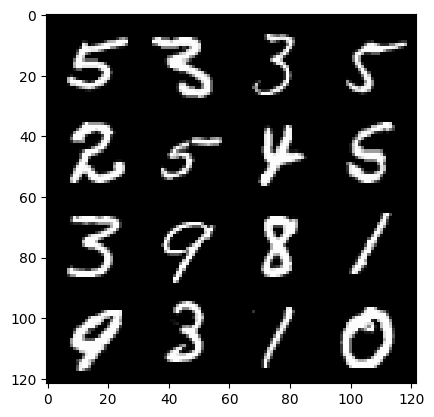

(epoch): step67500/Gen loss: 2.446900482177733/disc_loss: 0.2539308112363021


  0%|          | 0/469 [00:00<?, ?it/s]

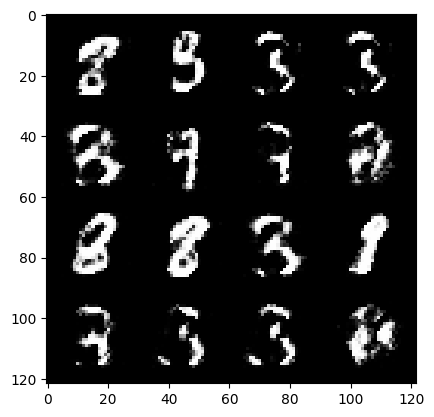

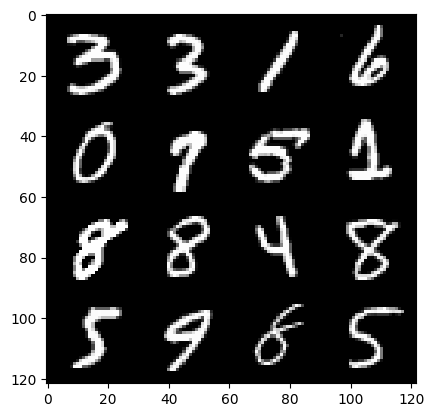

(epoch): step67800/Gen loss: 2.32368564248085/disc_loss: 0.27002435331543273


  0%|          | 0/469 [00:00<?, ?it/s]

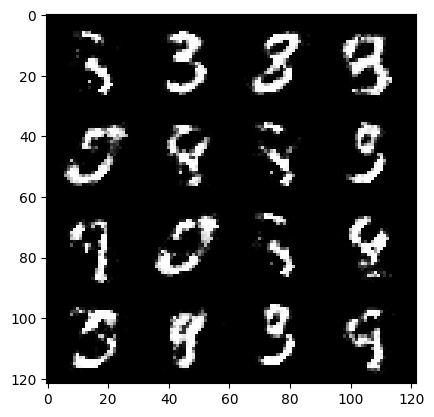

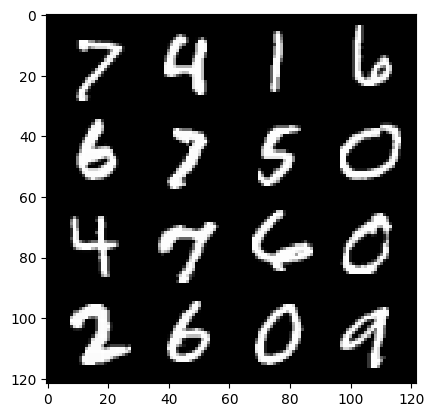

(epoch): step68100/Gen loss: 2.3513572963078837/disc_loss: 0.2621761825680735


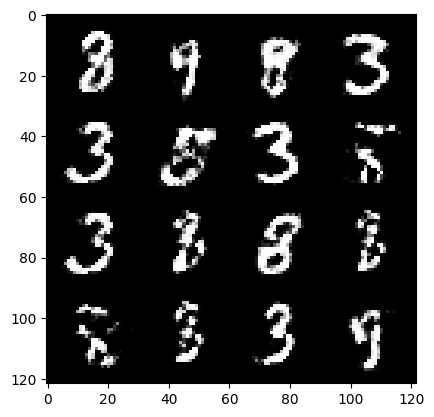

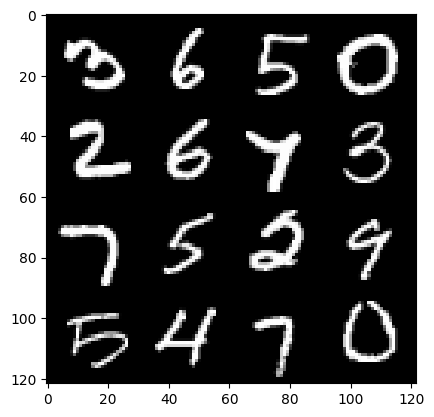

(epoch): step68400/Gen loss: 2.5616928116480513/disc_loss: 0.2232385673622291


  0%|          | 0/469 [00:00<?, ?it/s]

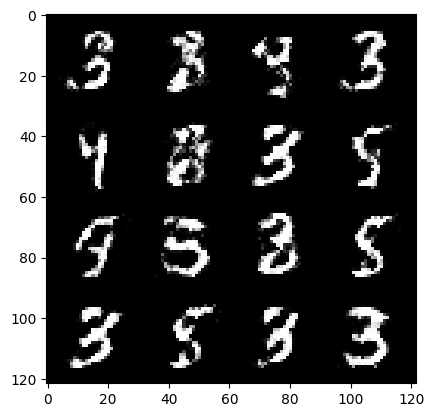

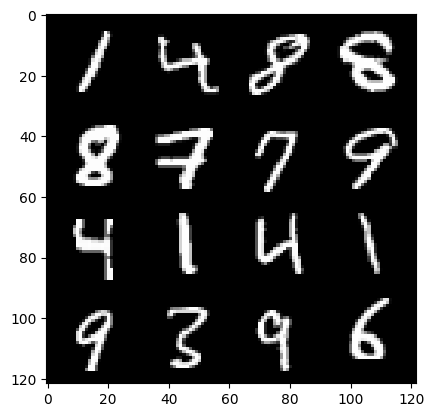

(epoch): step68700/Gen loss: 2.5272045818964664/disc_loss: 0.22329489901661875


  0%|          | 0/469 [00:00<?, ?it/s]

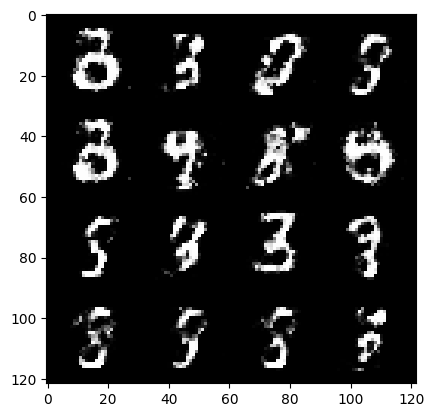

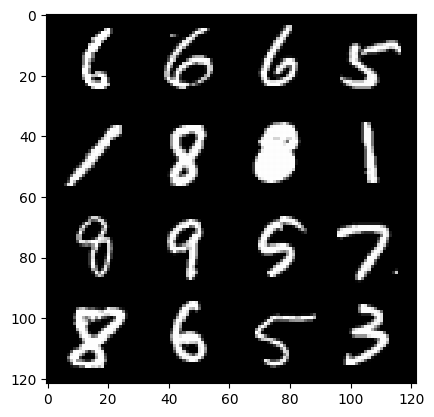

(epoch): step69000/Gen loss: 2.4926819729804968/disc_loss: 0.23955405155817672


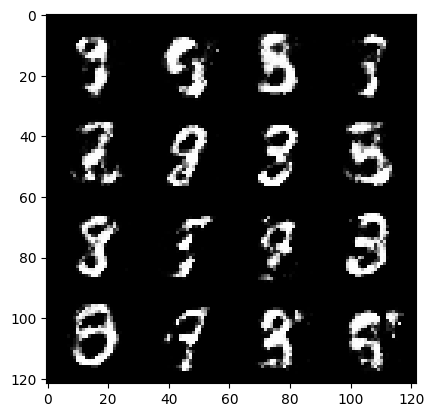

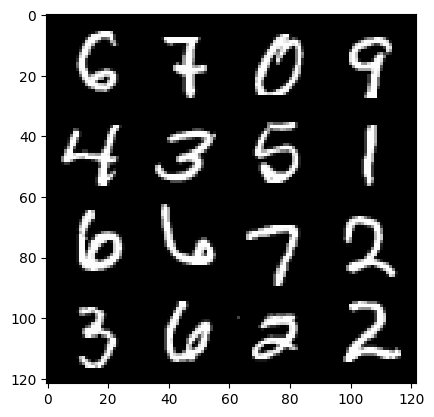

(epoch): step69300/Gen loss: 2.4781140307585368/disc_loss: 0.24266498953104026


  0%|          | 0/469 [00:00<?, ?it/s]

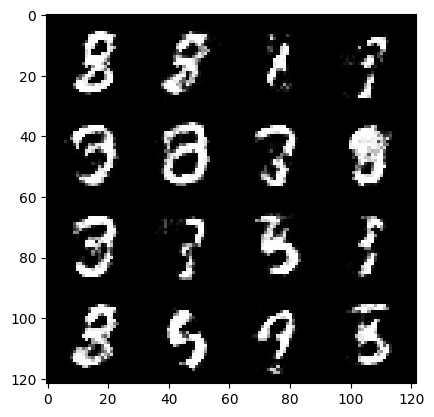

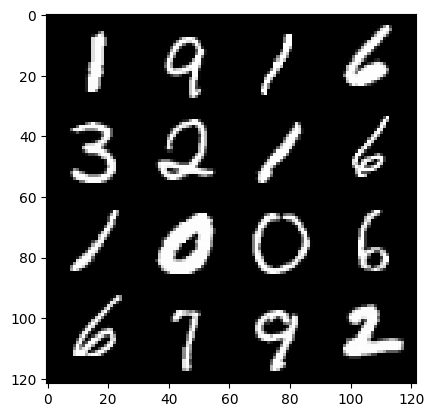

(epoch): step69600/Gen loss: 2.4788187821706136/disc_loss: 0.23003221909205115


  0%|          | 0/469 [00:00<?, ?it/s]

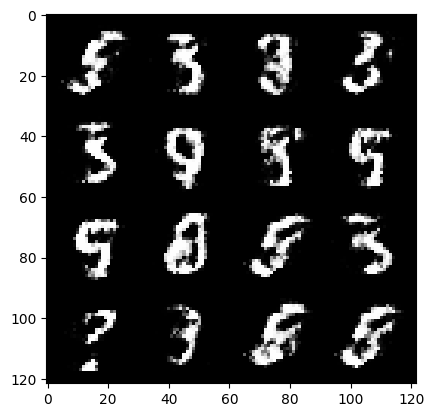

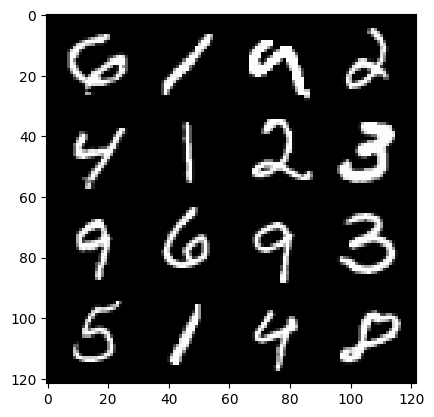

(epoch): step69900/Gen loss: 2.561020747820539/disc_loss: 0.22137043784062066


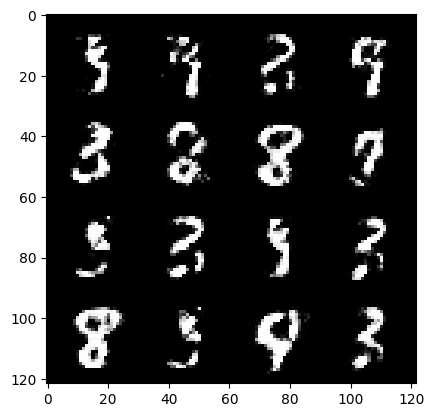

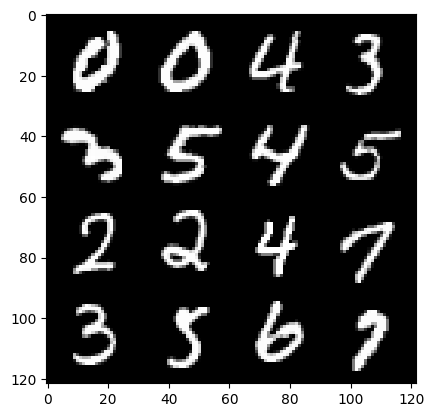

(epoch): step70200/Gen loss: 2.4451695855458597/disc_loss: 0.23769919246435156


  0%|          | 0/469 [00:00<?, ?it/s]

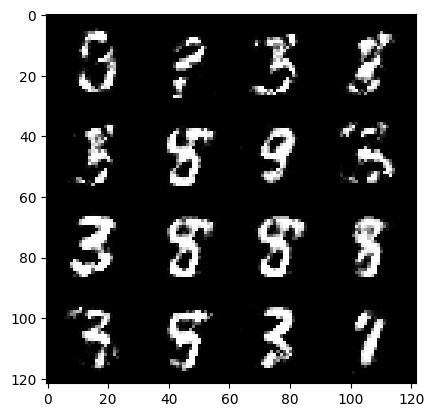

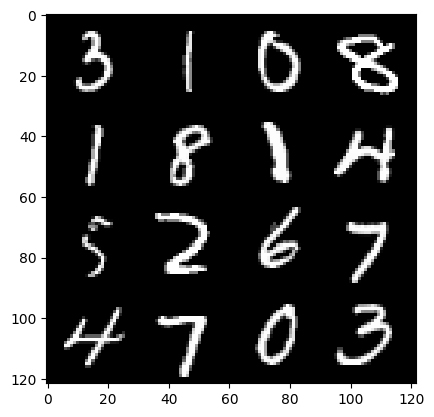

(epoch): step70500/Gen loss: 2.5202957669893884/disc_loss: 0.2341950780153277


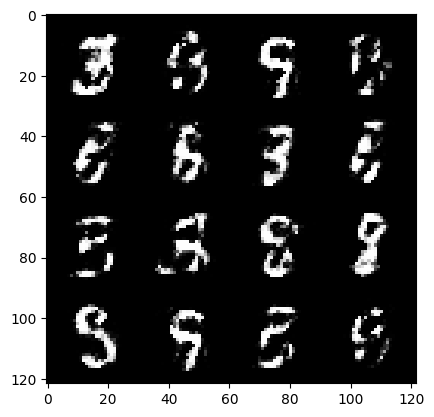

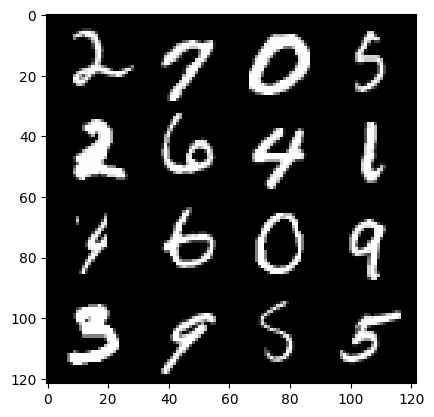

(epoch): step70800/Gen loss: 2.4230896178881323/disc_loss: 0.25450882996122054


  0%|          | 0/469 [00:00<?, ?it/s]

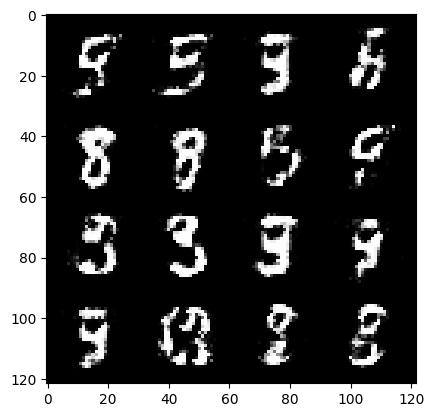

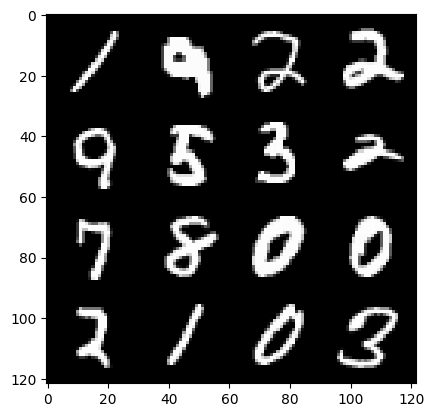

(epoch): step71100/Gen loss: 2.382310818831127/disc_loss: 0.2629518649478756


  0%|          | 0/469 [00:00<?, ?it/s]

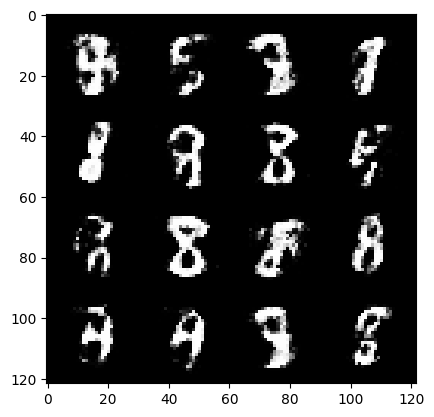

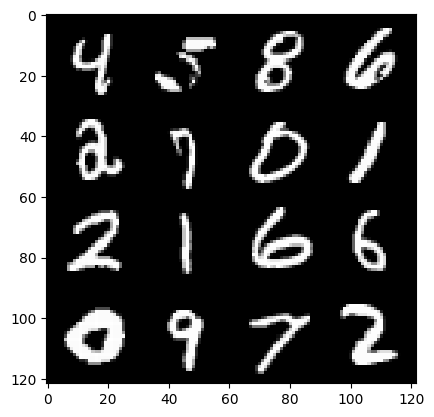

(epoch): step71400/Gen loss: 2.31709988395373/disc_loss: 0.26160241708159443


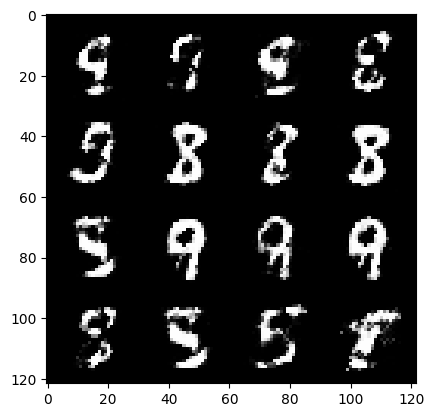

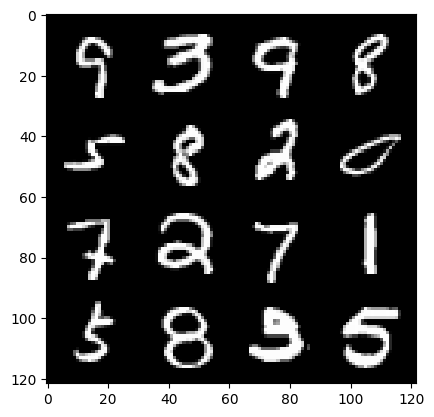

(epoch): step71700/Gen loss: 2.344651035467785/disc_loss: 0.24611810247103383


  0%|          | 0/469 [00:00<?, ?it/s]

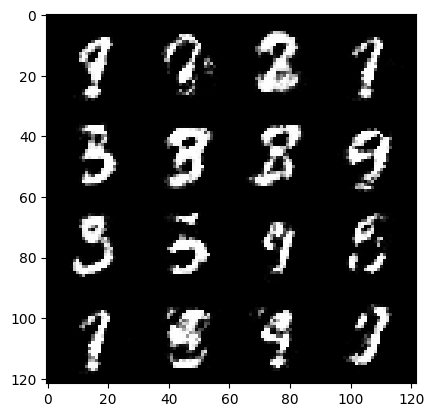

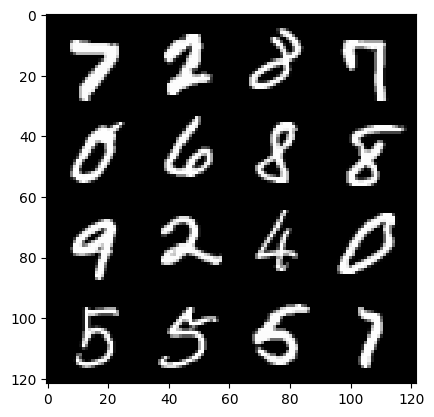

(epoch): step72000/Gen loss: 2.4896928219000514/disc_loss: 0.24185329010089254


  0%|          | 0/469 [00:00<?, ?it/s]

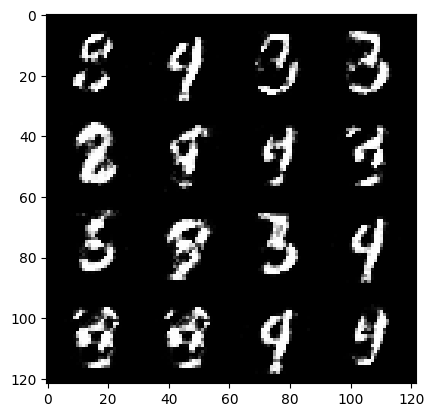

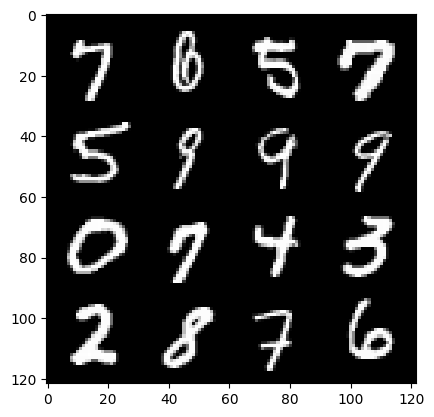

(epoch): step72300/Gen loss: 2.2518429569403335/disc_loss: 0.2706374097367127


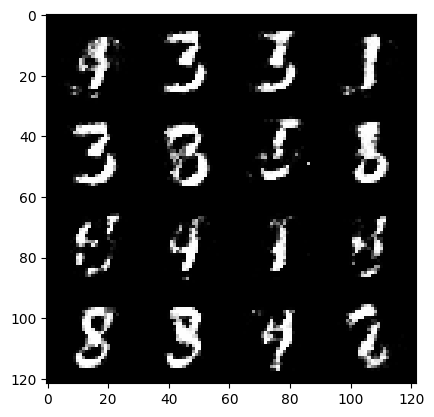

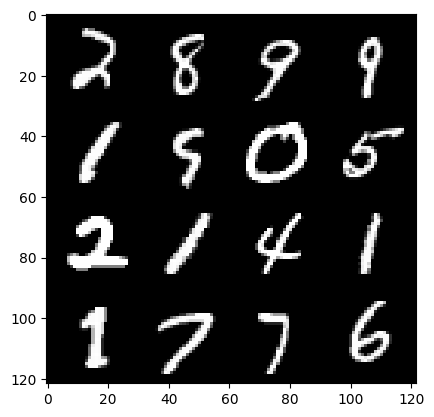

(epoch): step72600/Gen loss: 2.217249168157578/disc_loss: 0.2771601559221744


  0%|          | 0/469 [00:00<?, ?it/s]

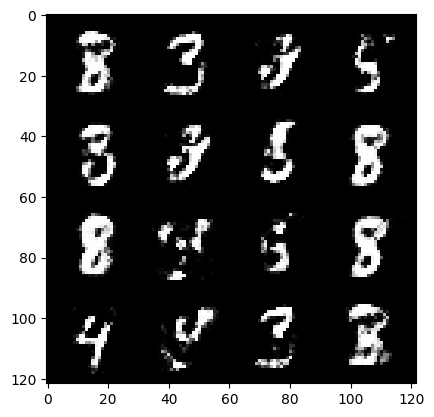

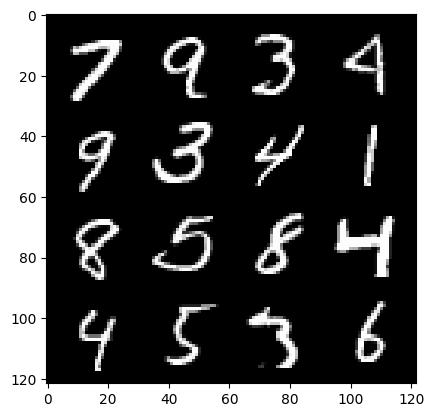

(epoch): step72900/Gen loss: 2.3535305420557644/disc_loss: 0.25371024250984175


  0%|          | 0/469 [00:00<?, ?it/s]

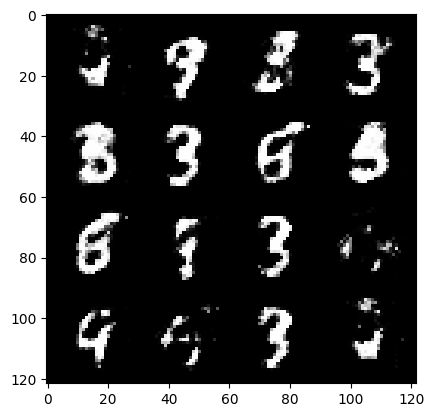

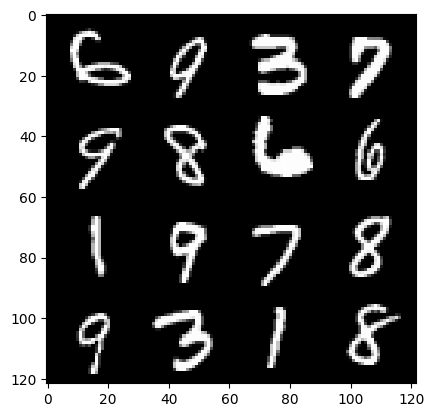

(epoch): step73200/Gen loss: 2.346954316298167/disc_loss: 0.2842929749687513


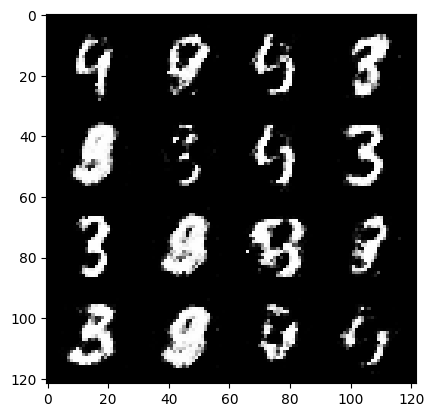

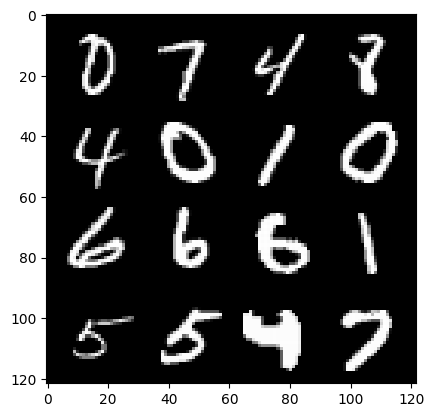

(epoch): step73500/Gen loss: 2.330928962628047/disc_loss: 0.2629313534498213


  0%|          | 0/469 [00:00<?, ?it/s]

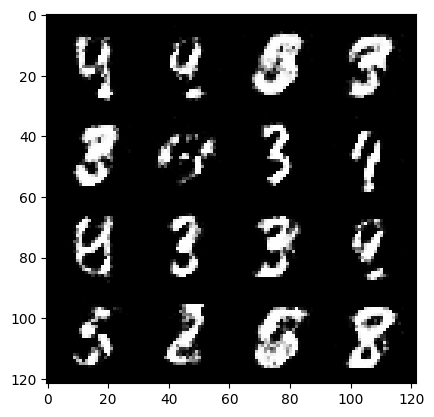

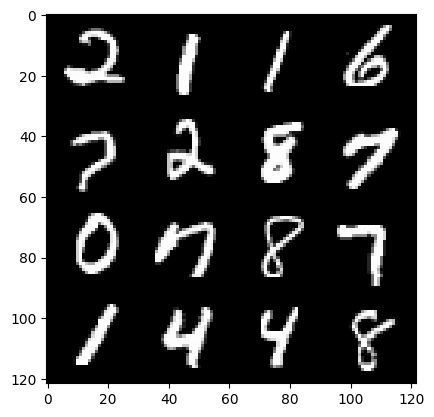

(epoch): step73800/Gen loss: 2.4246484323342656/disc_loss: 0.24344826698303215


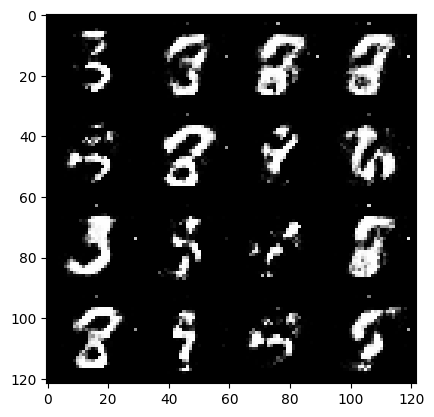

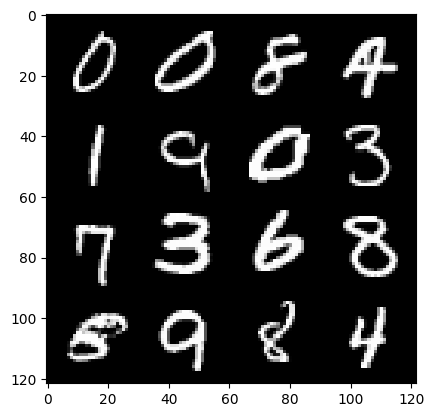

(epoch): step74100/Gen loss: 2.3950289428234113/disc_loss: 0.25995070452491437


  0%|          | 0/469 [00:00<?, ?it/s]

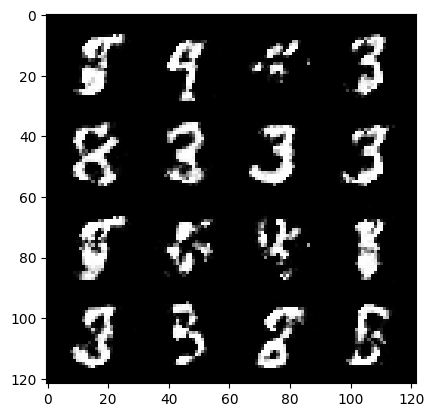

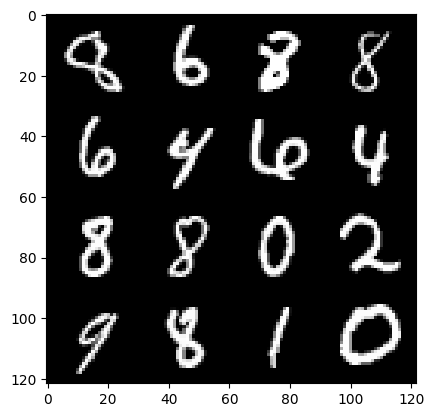

(epoch): step74400/Gen loss: 2.45263405760129/disc_loss: 0.2461212053894998


  0%|          | 0/469 [00:00<?, ?it/s]

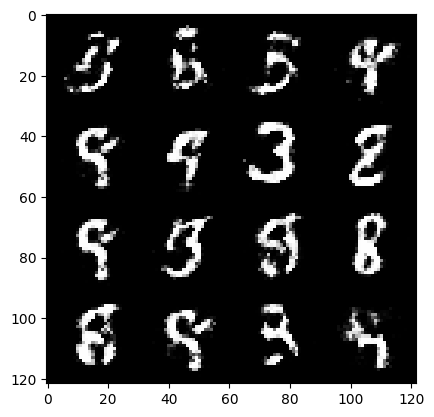

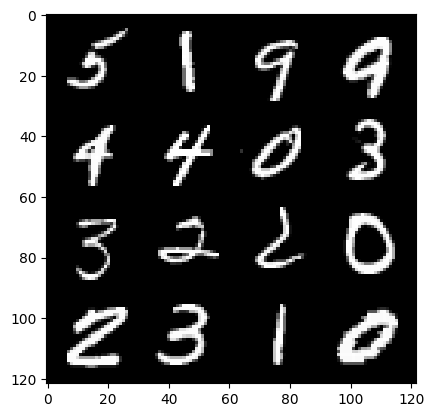

(epoch): step74700/Gen loss: 2.3883764068285616/disc_loss: 0.25149928102890656


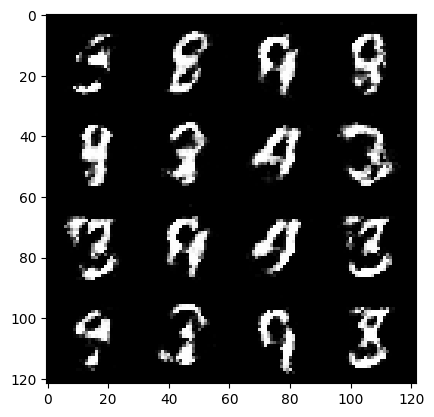

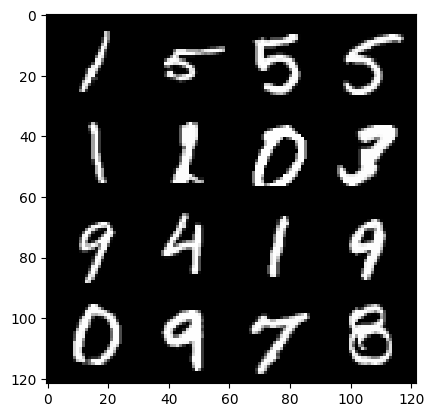

(epoch): step75000/Gen loss: 2.283990454673767/disc_loss: 0.2727445767819881


  0%|          | 0/469 [00:00<?, ?it/s]

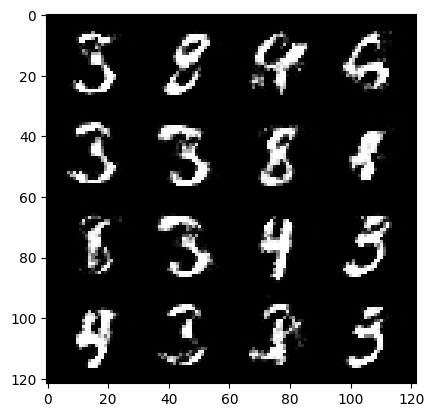

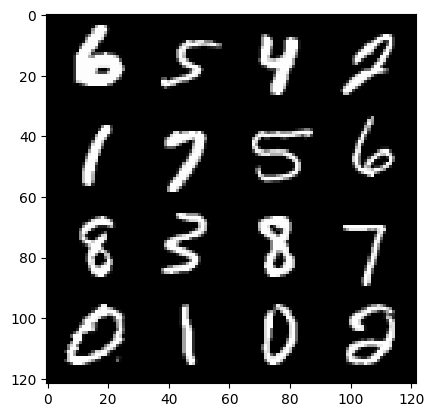

(epoch): step75300/Gen loss: 2.2909772253036484/disc_loss: 0.2719859763483205


  0%|          | 0/469 [00:00<?, ?it/s]

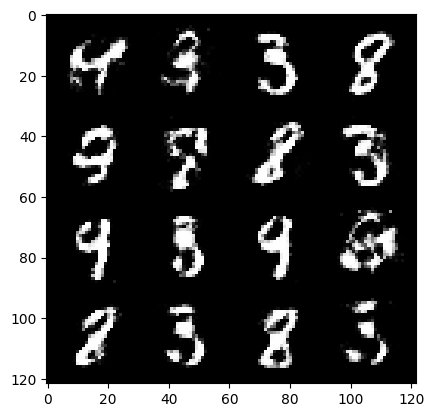

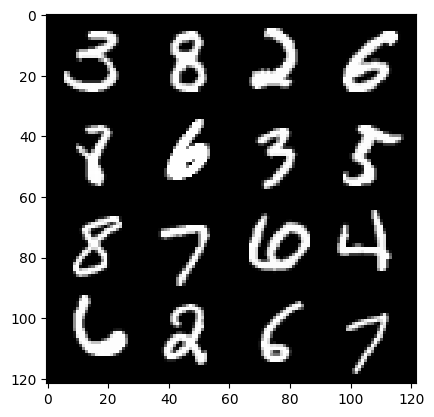

(epoch): step75600/Gen loss: 2.243367824554443/disc_loss: 0.29203018595774943


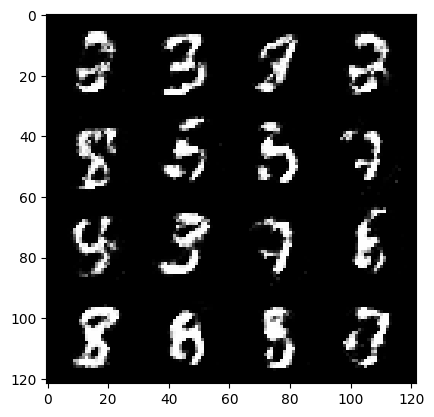

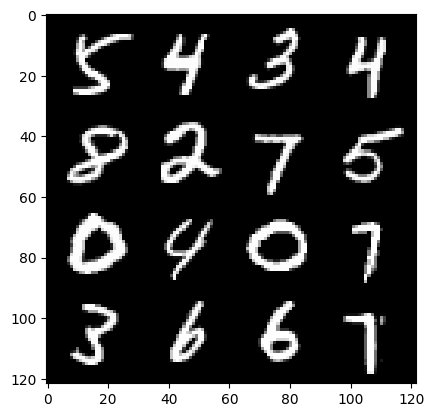

(epoch): step75900/Gen loss: 2.1945880397160846/disc_loss: 0.277393114119768


  0%|          | 0/469 [00:00<?, ?it/s]

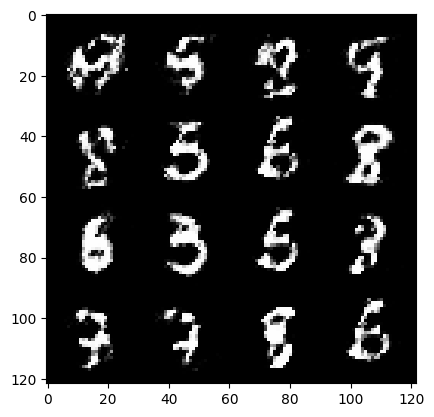

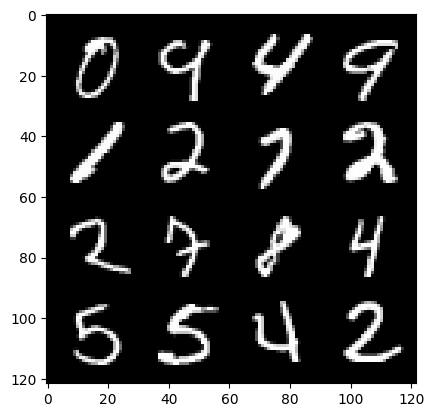

(epoch): step76200/Gen loss: 2.311747938394545/disc_loss: 0.25753936881820355


  0%|          | 0/469 [00:00<?, ?it/s]

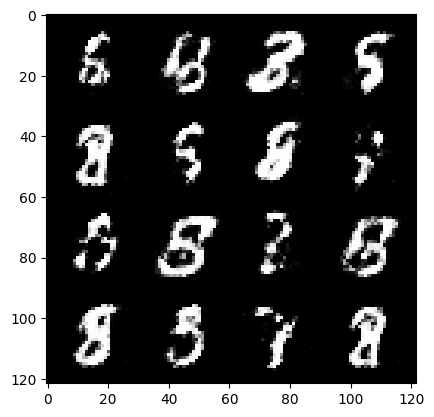

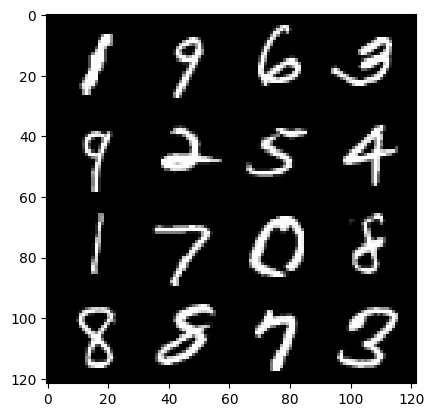

(epoch): step76500/Gen loss: 2.2008834250768015/disc_loss: 0.28251693959037455


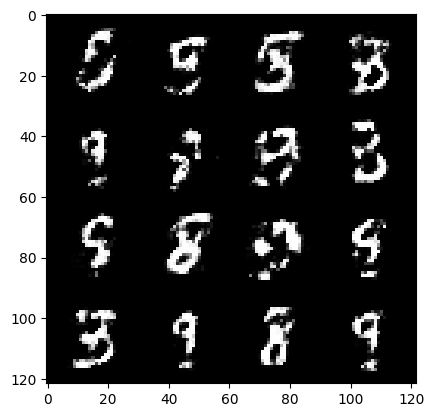

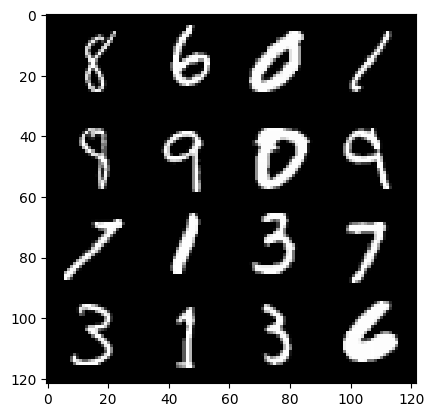

(epoch): step76800/Gen loss: 2.1783404306570695/disc_loss: 0.27483219946424153


  0%|          | 0/469 [00:00<?, ?it/s]

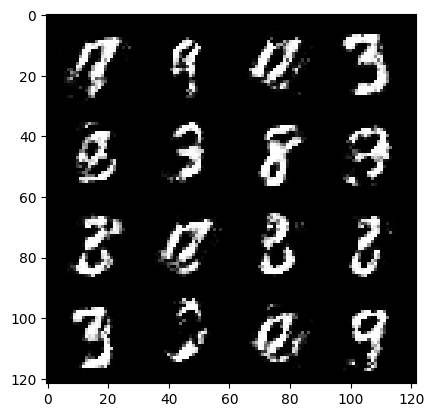

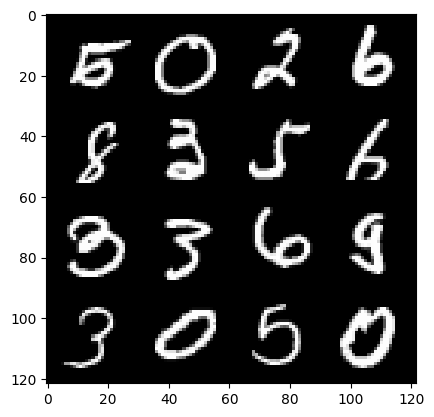

(epoch): step77100/Gen loss: 2.381810379823048/disc_loss: 0.252217329889536


  0%|          | 0/469 [00:00<?, ?it/s]

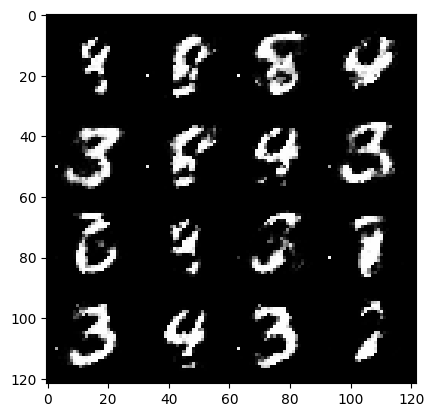

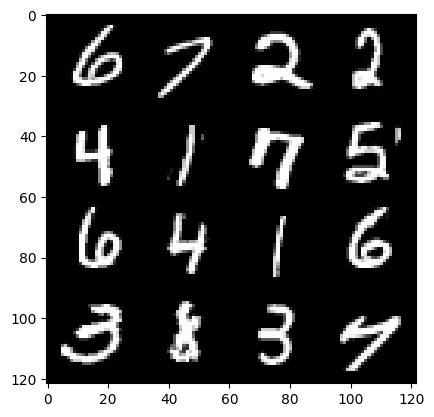

(epoch): step77400/Gen loss: 2.197970329125722/disc_loss: 0.34584099511305505


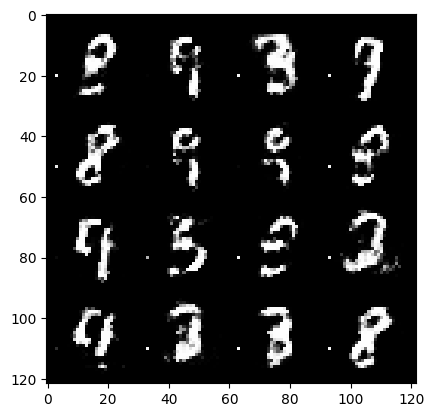

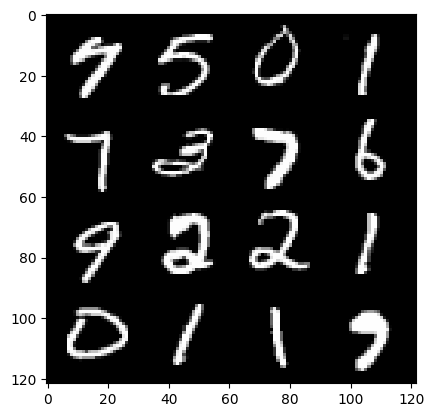

(epoch): step77700/Gen loss: 1.7387014472484585/disc_loss: 0.451168302496274


  0%|          | 0/469 [00:00<?, ?it/s]

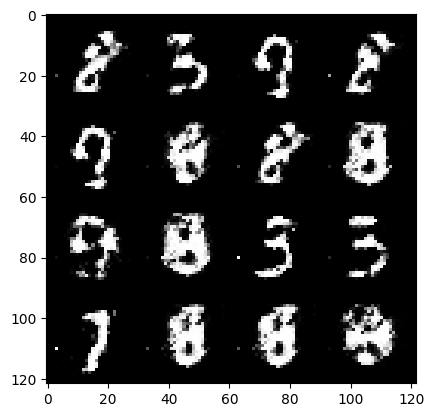

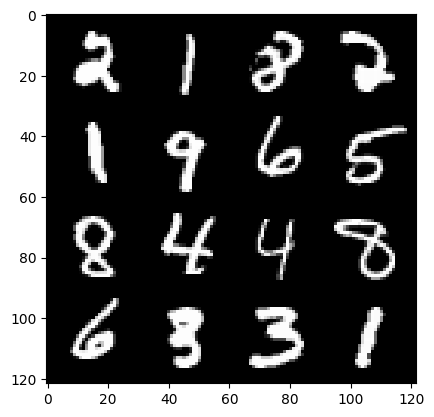

(epoch): step78000/Gen loss: 2.4928180813789385/disc_loss: 0.21681459128856637


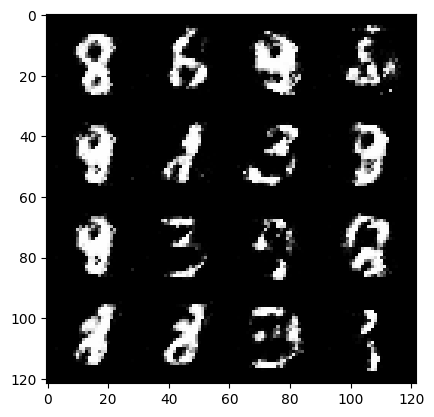

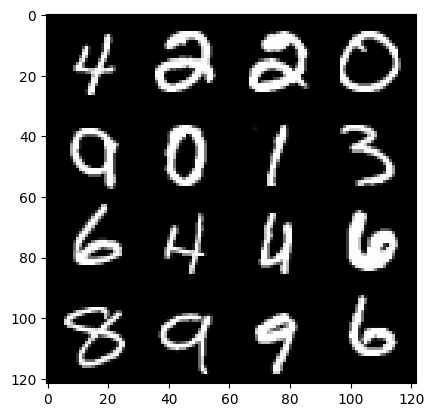

(epoch): step78300/Gen loss: 2.4401434119542444/disc_loss: 0.24018481805920613


  0%|          | 0/469 [00:00<?, ?it/s]

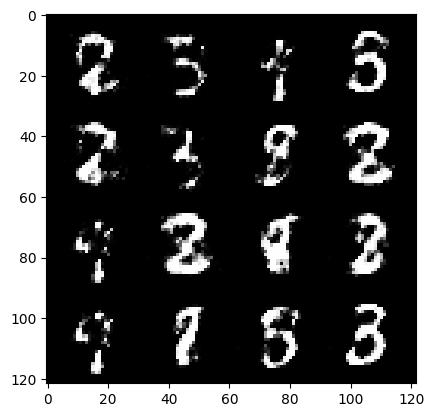

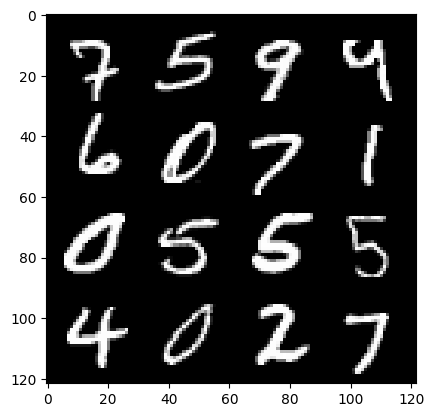

(epoch): step78600/Gen loss: 2.213625375429787/disc_loss: 0.2653851208090782


  0%|          | 0/469 [00:00<?, ?it/s]

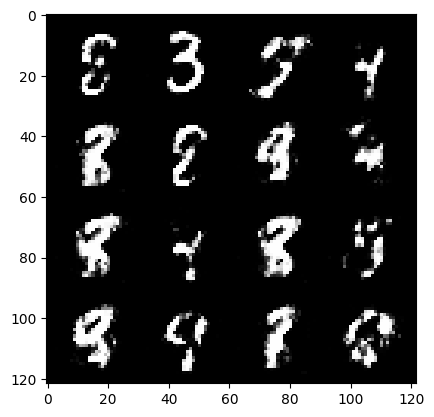

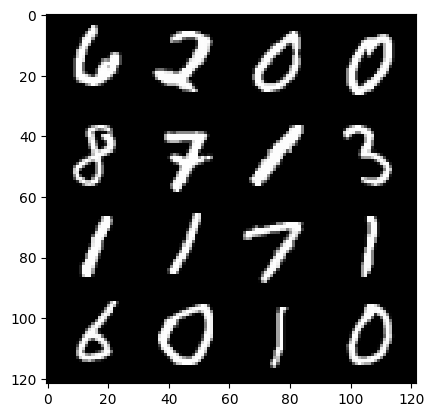

(epoch): step78900/Gen loss: 2.177633906205496/disc_loss: 0.2683246603111426


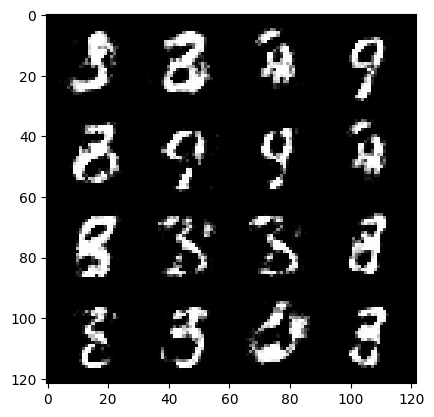

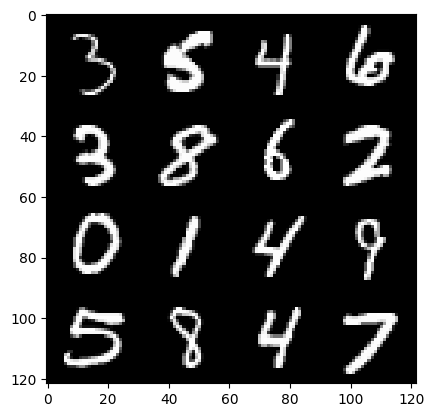

(epoch): step79200/Gen loss: 2.3545529290040337/disc_loss: 0.2396116498857737


  0%|          | 0/469 [00:00<?, ?it/s]

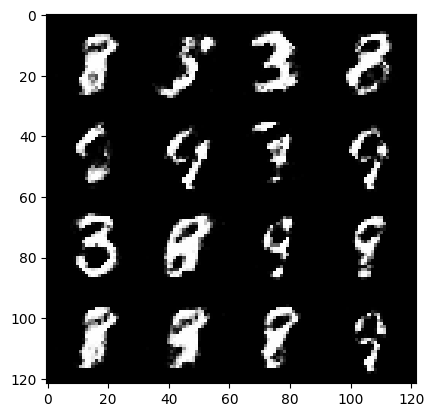

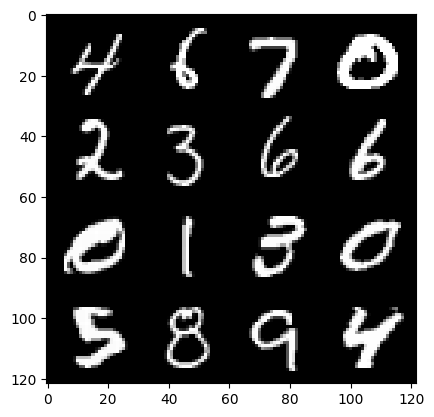

(epoch): step79500/Gen loss: 2.3896276923020685/disc_loss: 0.24357928320765515


  0%|          | 0/469 [00:00<?, ?it/s]

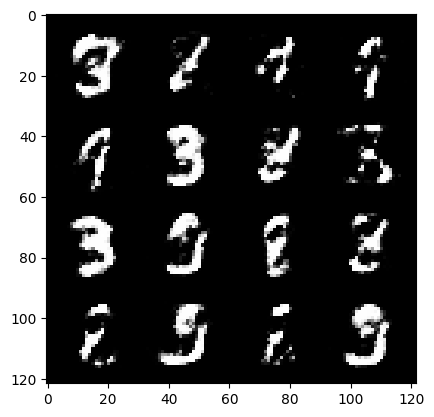

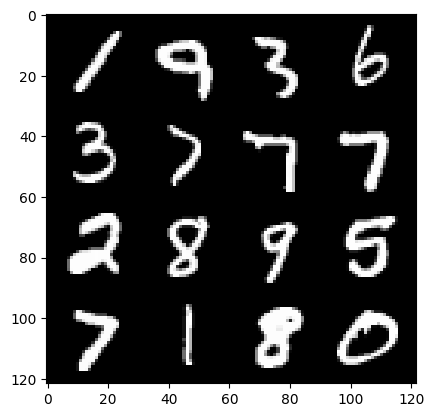

(epoch): step79800/Gen loss: 2.210824357668559/disc_loss: 0.27054082651933054


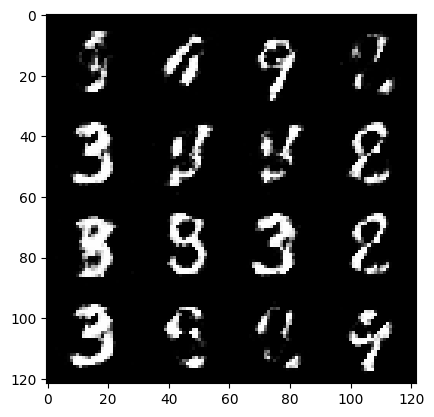

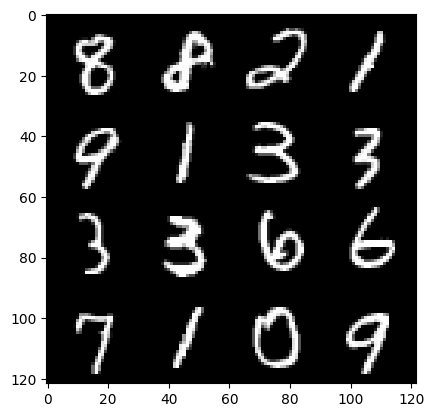

(epoch): step80100/Gen loss: 2.1712531864643076/disc_loss: 0.2675081768631936


  0%|          | 0/469 [00:00<?, ?it/s]

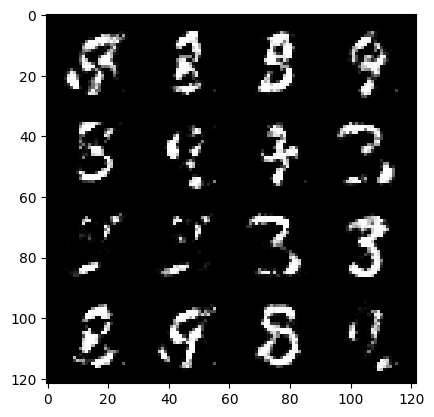

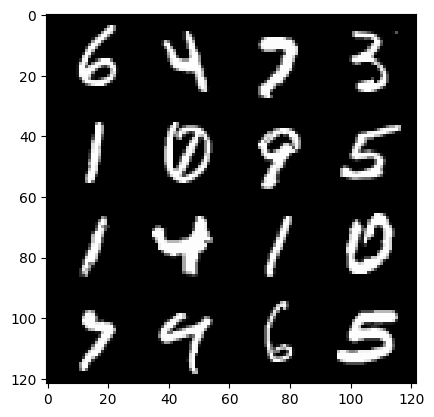

(epoch): step80400/Gen loss: 2.0928779498736065/disc_loss: 0.29303671091794947


  0%|          | 0/469 [00:00<?, ?it/s]

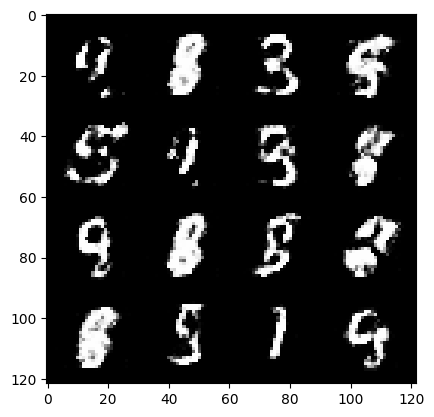

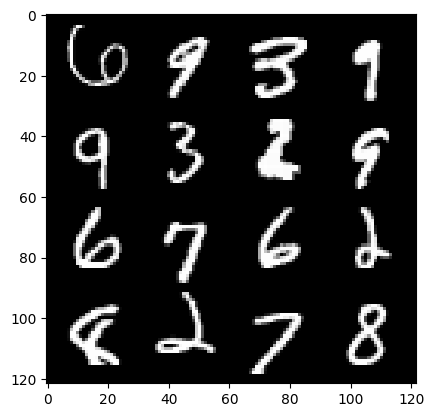

(epoch): step80700/Gen loss: 2.1155153866608947/disc_loss: 0.2887568996349969


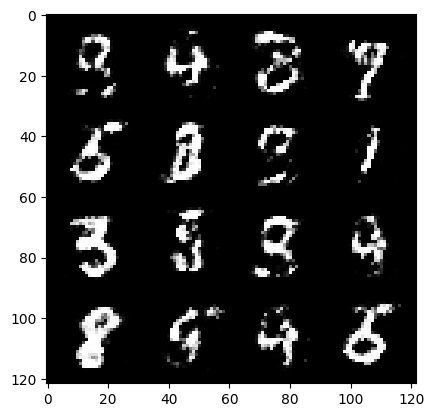

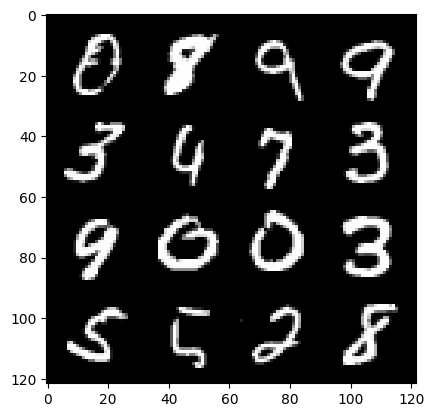

(epoch): step81000/Gen loss: 2.1572406653563165/disc_loss: 0.2883407902717591


  0%|          | 0/469 [00:00<?, ?it/s]

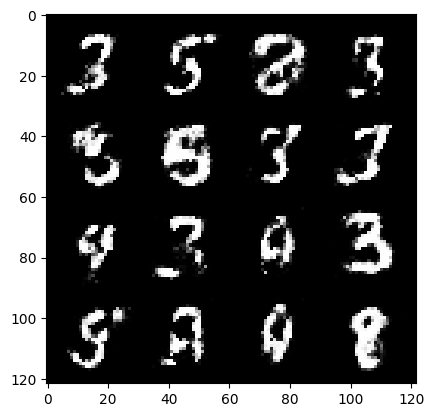

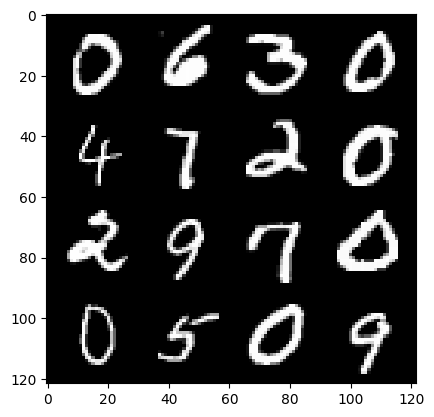

(epoch): step81300/Gen loss: 2.161357536315919/disc_loss: 0.2854736439387004


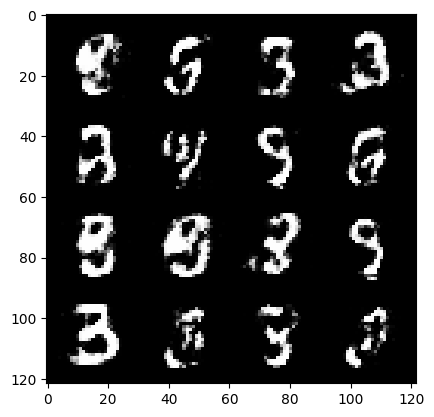

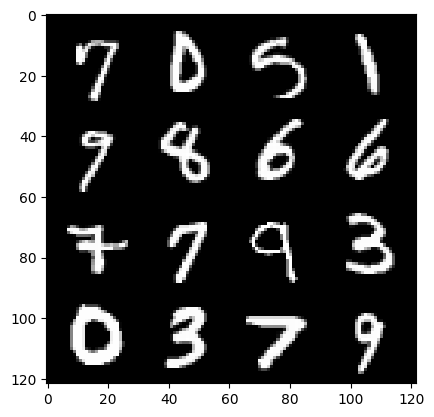

(epoch): step81600/Gen loss: 2.149757295449575/disc_loss: 0.2792858408391474


  0%|          | 0/469 [00:00<?, ?it/s]

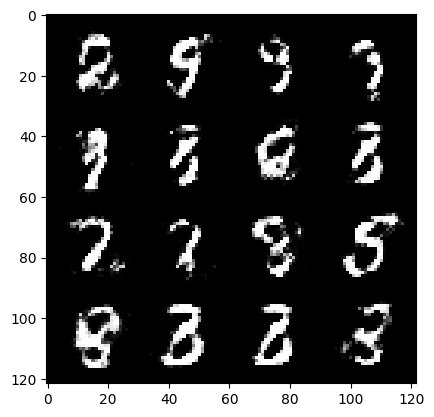

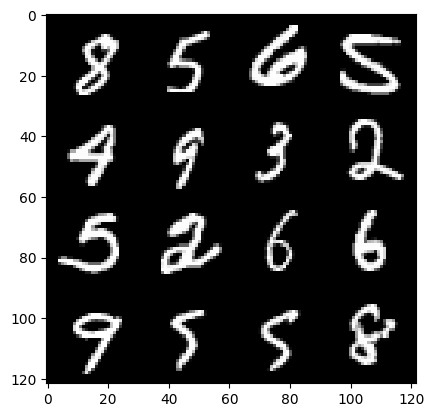

(epoch): step81900/Gen loss: 2.103521283864975/disc_loss: 0.29910442764560363


  0%|          | 0/469 [00:00<?, ?it/s]

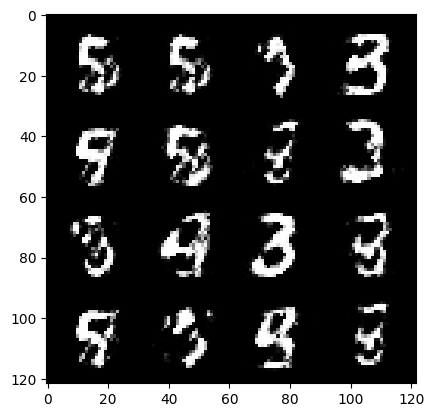

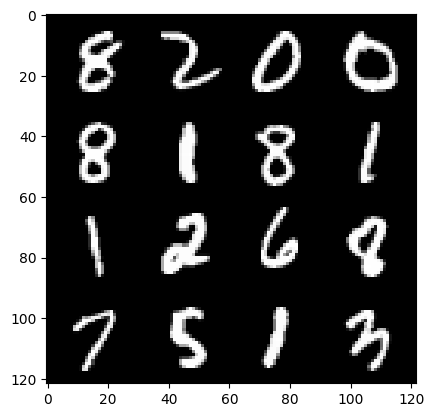

(epoch): step82200/Gen loss: 2.170266741116841/disc_loss: 0.2858901129662989


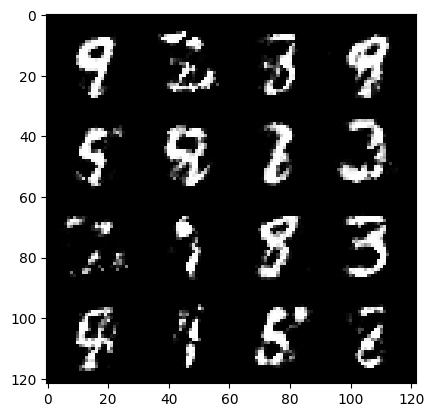

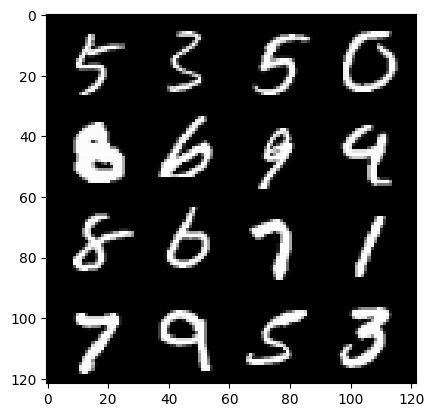

(epoch): step82500/Gen loss: 2.208191698392234/disc_loss: 0.2765410216649374


  0%|          | 0/469 [00:00<?, ?it/s]

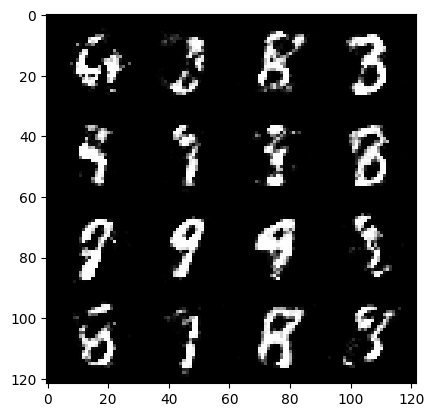

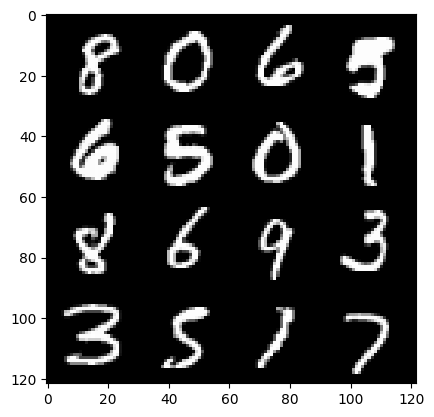

(epoch): step82800/Gen loss: 2.1240755863984444/disc_loss: 0.28643374115228637


  0%|          | 0/469 [00:00<?, ?it/s]

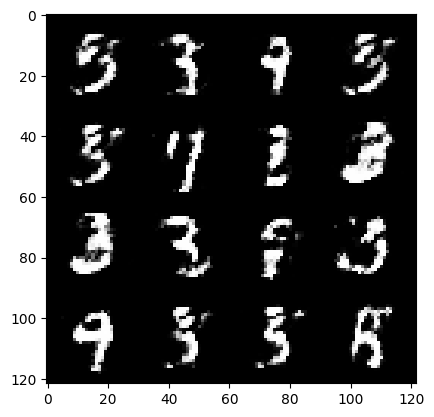

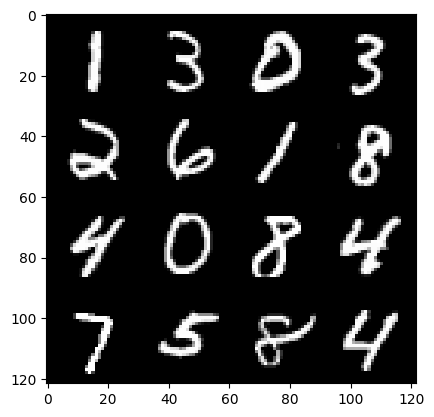

(epoch): step83100/Gen loss: 1.9830636707941671/disc_loss: 0.3088314715524513


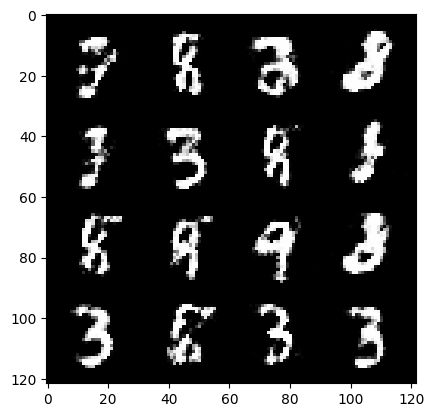

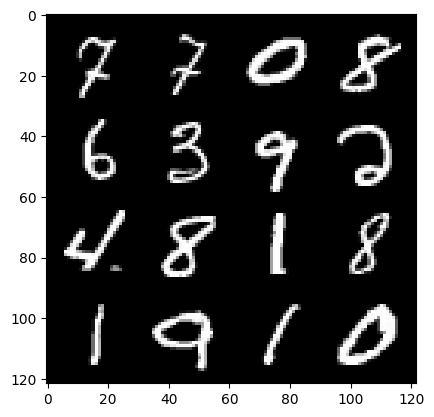

(epoch): step83400/Gen loss: 1.960376983880999/disc_loss: 0.31022421464323996


  0%|          | 0/469 [00:00<?, ?it/s]

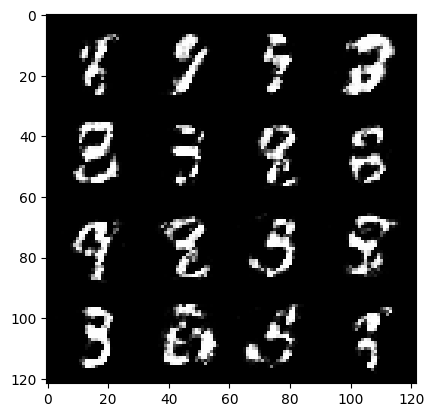

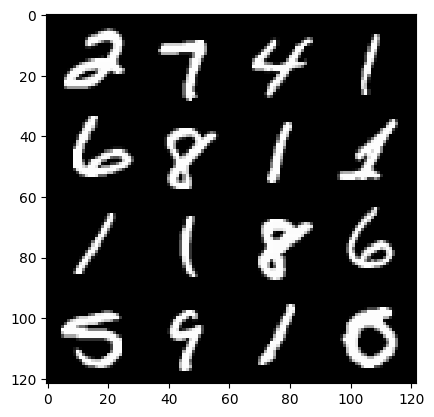

(epoch): step83700/Gen loss: 1.9886023970445001/disc_loss: 0.3057521240413185


  0%|          | 0/469 [00:00<?, ?it/s]

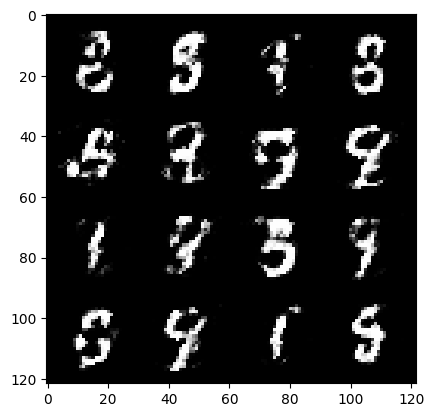

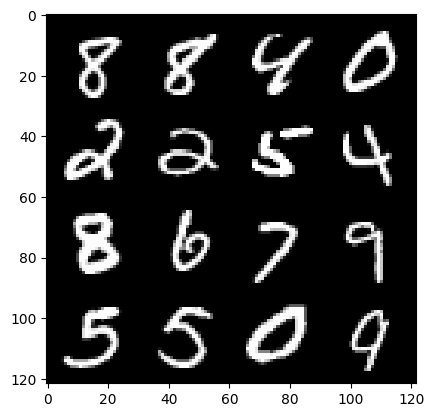

(epoch): step84000/Gen loss: 2.089838562011719/disc_loss: 0.287355957329273


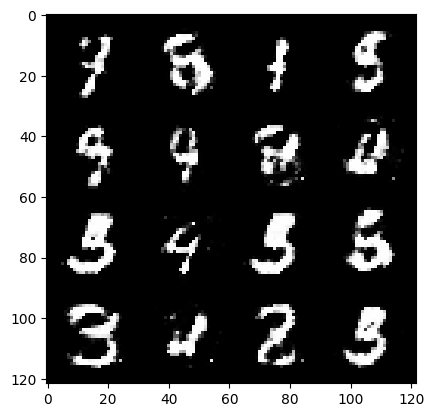

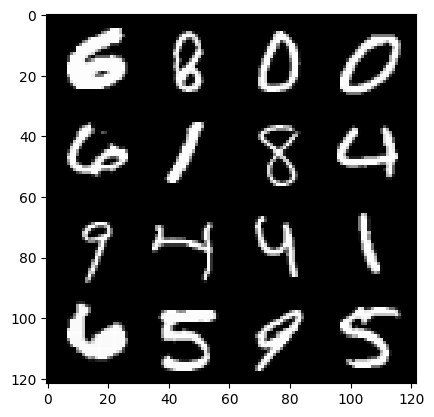

(epoch): step84300/Gen loss: 2.1353846402963006/disc_loss: 0.2803590540587901


  0%|          | 0/469 [00:00<?, ?it/s]

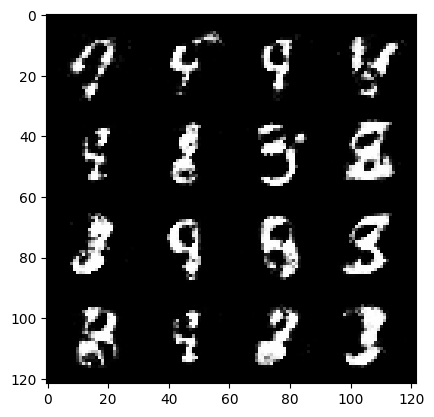

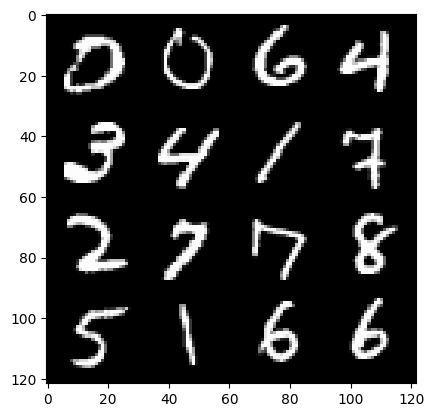

(epoch): step84600/Gen loss: 2.2539107843240114/disc_loss: 0.25995026558637624


  0%|          | 0/469 [00:00<?, ?it/s]

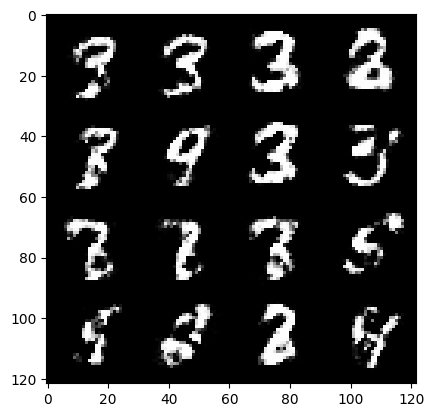

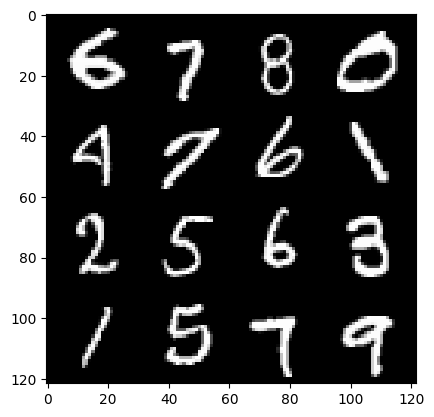

(epoch): step84900/Gen loss: 2.1122882032394403/disc_loss: 0.28830670073628417


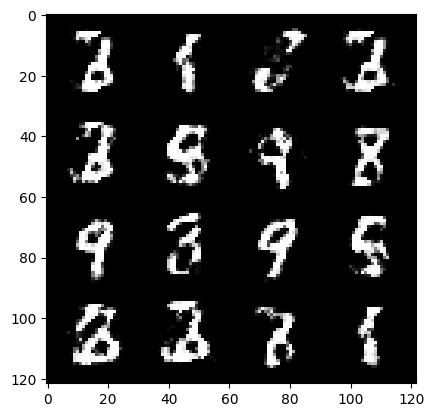

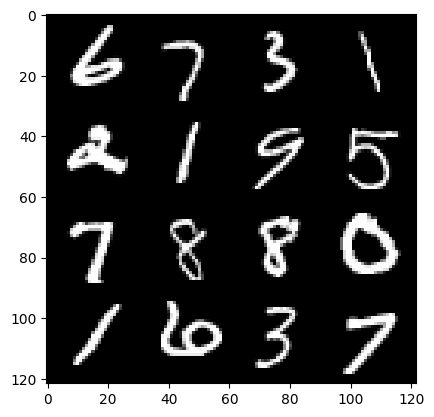

(epoch): step85200/Gen loss: 2.1032695293426498/disc_loss: 0.2967029967904091


  0%|          | 0/469 [00:00<?, ?it/s]

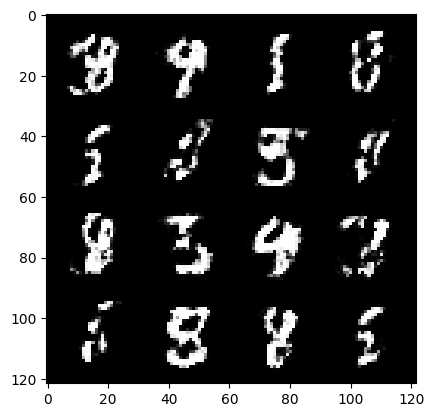

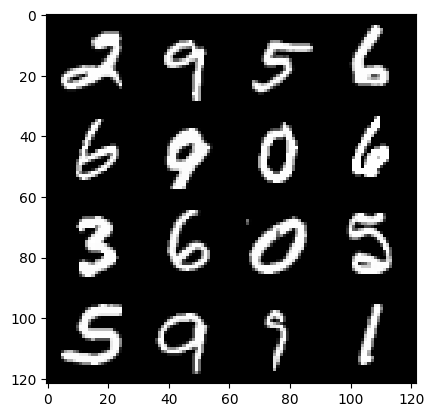

(epoch): step85500/Gen loss: 2.001072899103165/disc_loss: 0.31865470106403027


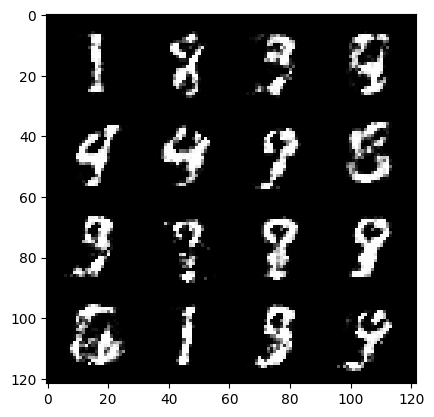

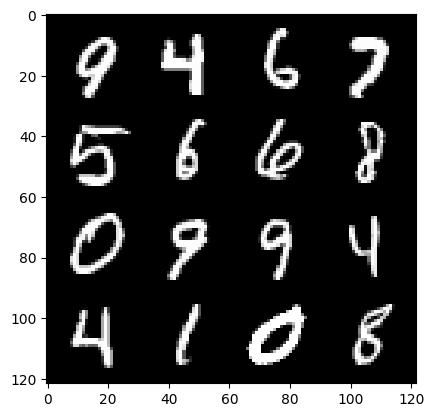

(epoch): step85800/Gen loss: 2.0708275771141054/disc_loss: 0.3067082777122657


  0%|          | 0/469 [00:00<?, ?it/s]

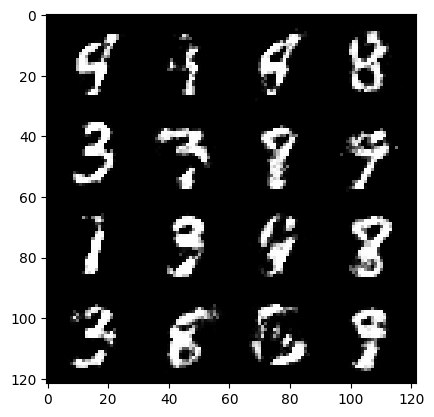

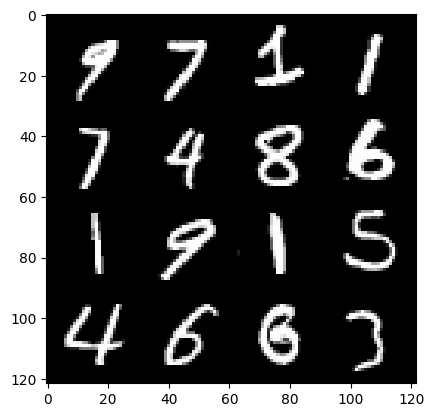

(epoch): step86100/Gen loss: 1.894776704708736/disc_loss: 0.33271933193008135


  0%|          | 0/469 [00:00<?, ?it/s]

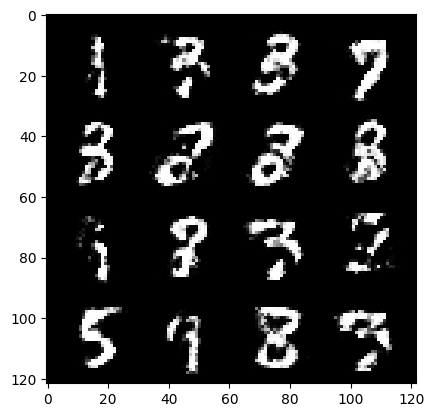

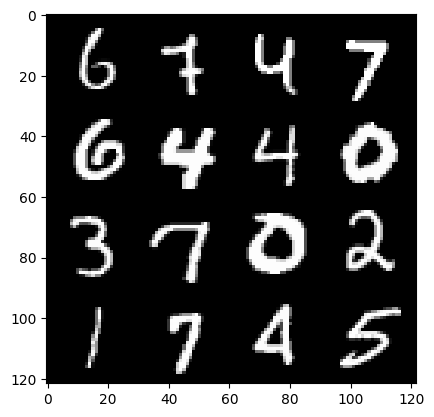

(epoch): step86400/Gen loss: 1.9813154391447692/disc_loss: 0.3258202290038268


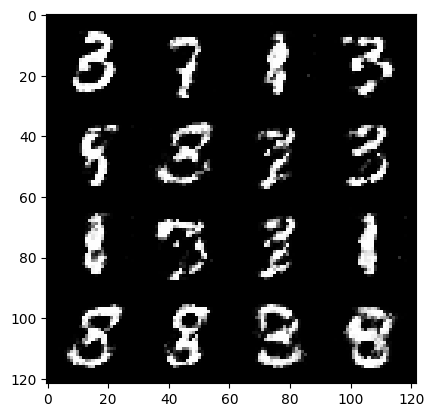

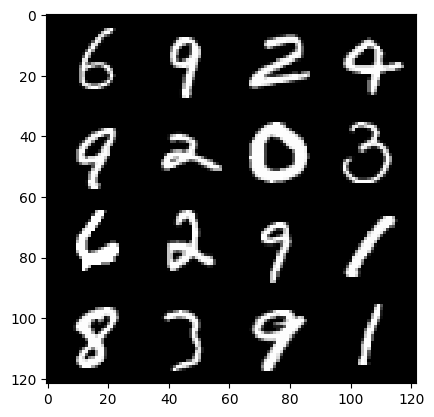

(epoch): step86700/Gen loss: 1.919915856520334/disc_loss: 0.3324525599181654


  0%|          | 0/469 [00:00<?, ?it/s]

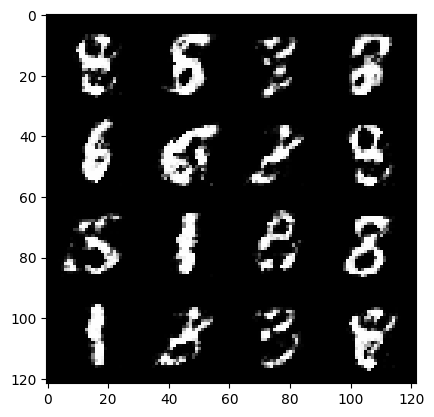

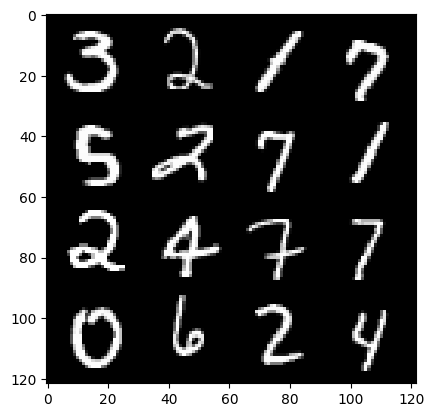

(epoch): step87000/Gen loss: 1.9146352509657545/disc_loss: 0.33029162585735333


  0%|          | 0/469 [00:00<?, ?it/s]

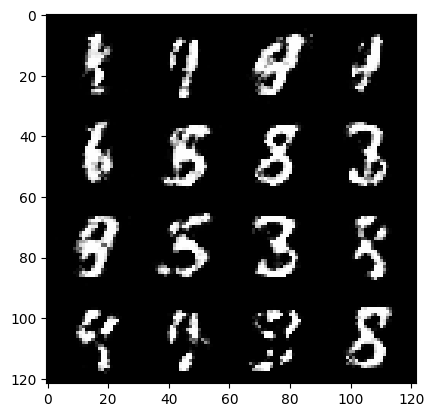

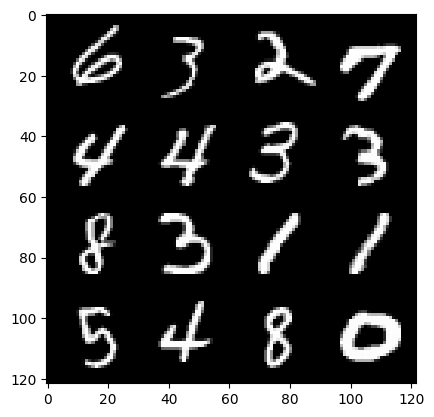

(epoch): step87300/Gen loss: 1.9271625606218974/disc_loss: 0.33245235691467906


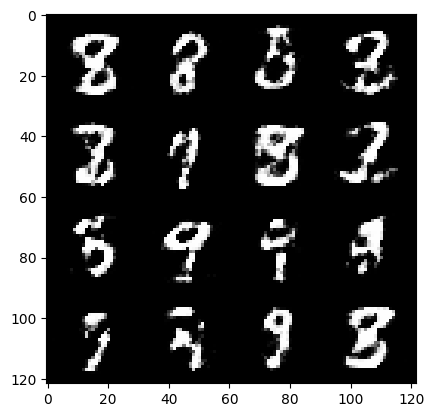

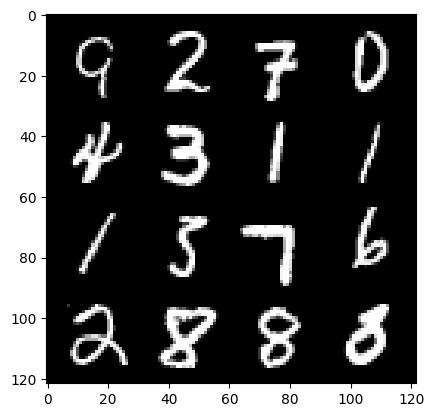

(epoch): step87600/Gen loss: 1.8558470559120195/disc_loss: 0.34370929931600896


  0%|          | 0/469 [00:00<?, ?it/s]

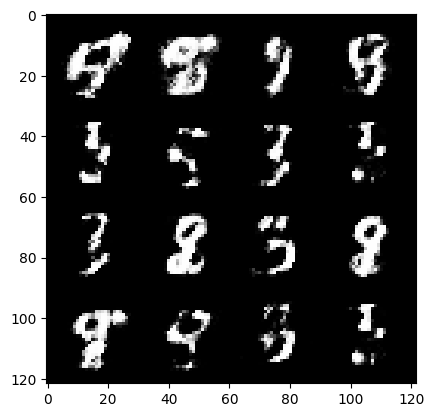

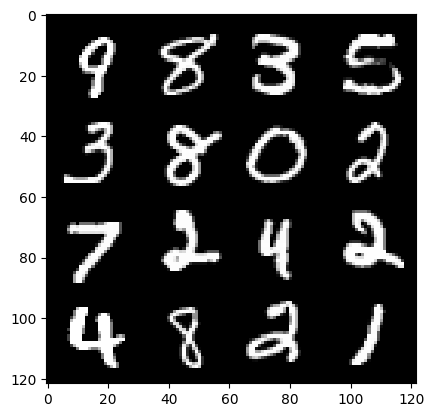

(epoch): step87900/Gen loss: 1.914244025945664/disc_loss: 0.3259857680400218


  0%|          | 0/469 [00:00<?, ?it/s]

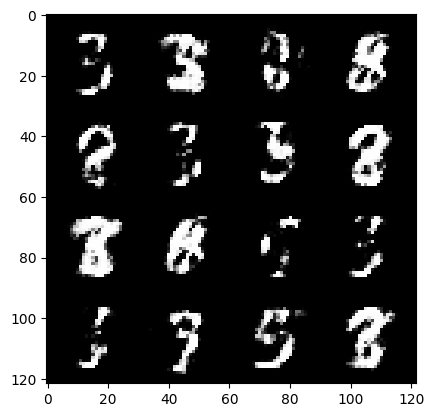

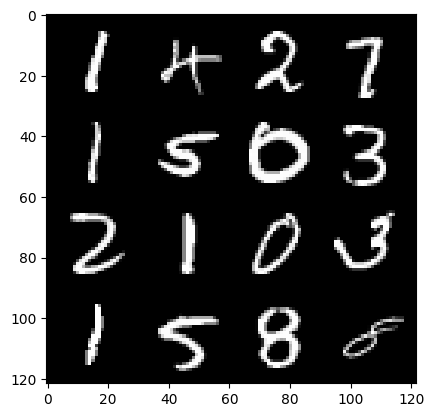

(epoch): step88200/Gen loss: 1.9168287595113116/disc_loss: 0.32446259126067173


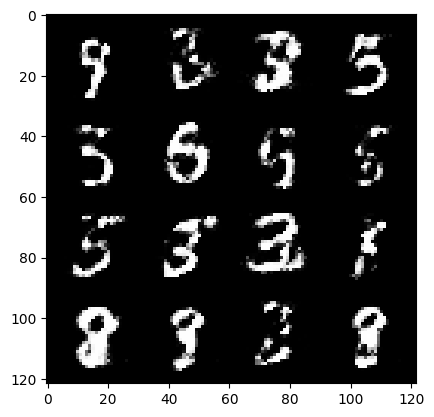

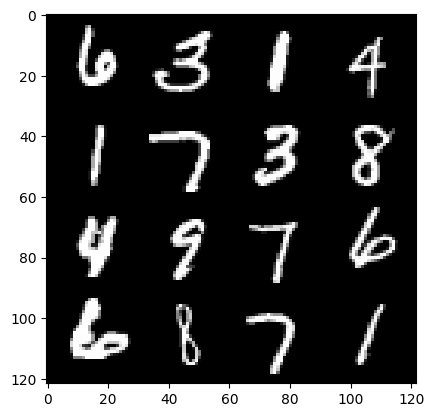

(epoch): step88500/Gen loss: 1.8959929581483221/disc_loss: 0.3189714223146437


  0%|          | 0/469 [00:00<?, ?it/s]

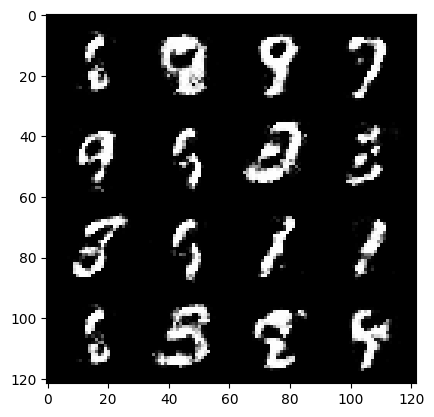

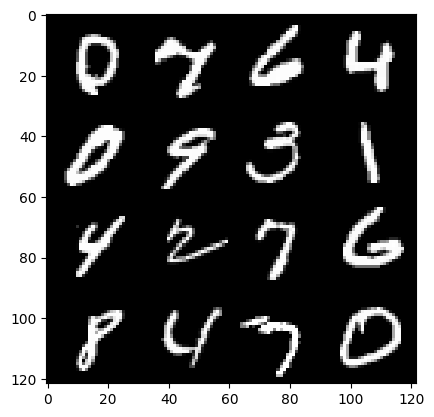

(epoch): step88800/Gen loss: 1.8628237740198776/disc_loss: 0.328473639190197


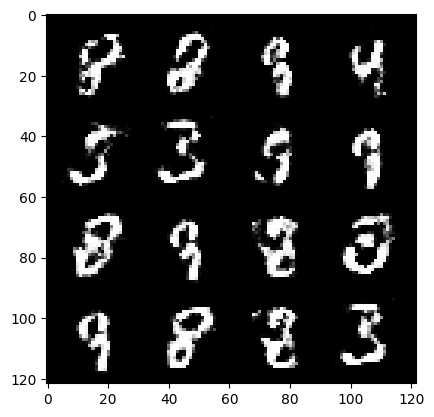

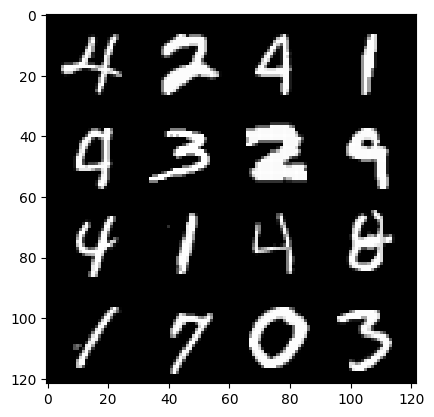

(epoch): step89100/Gen loss: 1.9311102279027306/disc_loss: 0.3230161503454054


  0%|          | 0/469 [00:00<?, ?it/s]

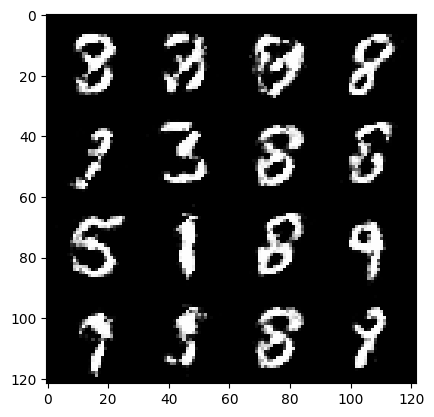

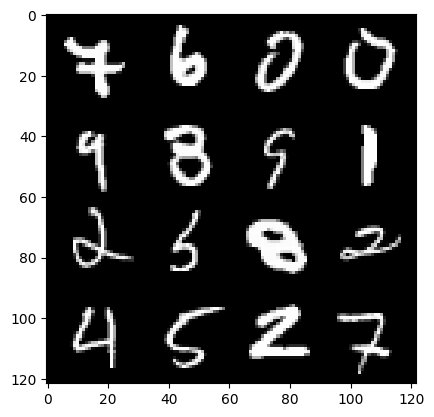

(epoch): step89400/Gen loss: 1.845853205919264/disc_loss: 0.3492782372236252


  0%|          | 0/469 [00:00<?, ?it/s]

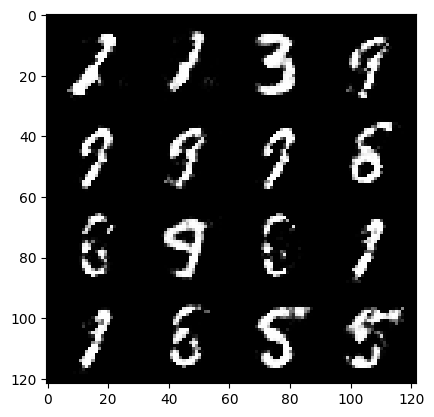

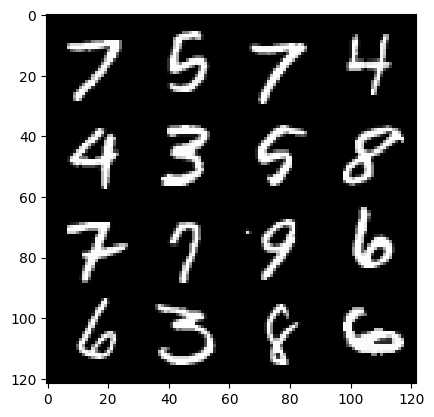

(epoch): step89700/Gen loss: 1.951022093693416/disc_loss: 0.3212724343935649


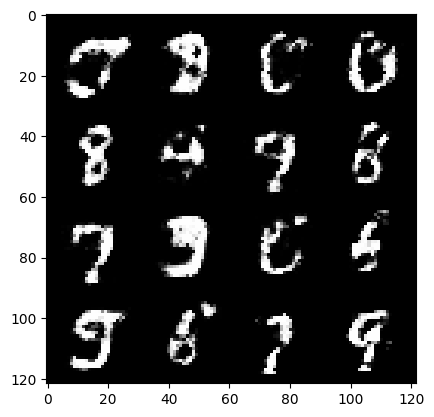

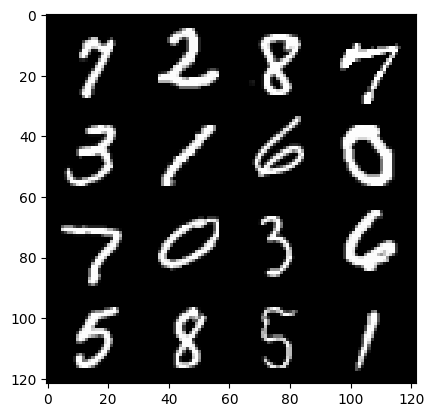

(epoch): step90000/Gen loss: 1.7102886072794603/disc_loss: 0.38160106201966587


  0%|          | 0/469 [00:00<?, ?it/s]

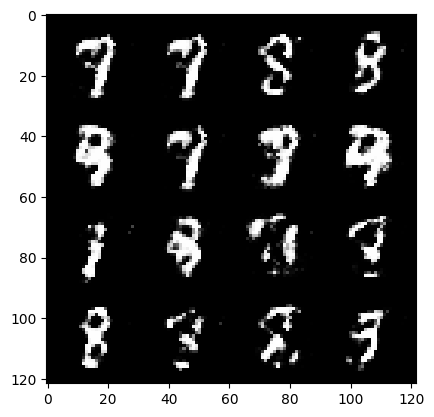

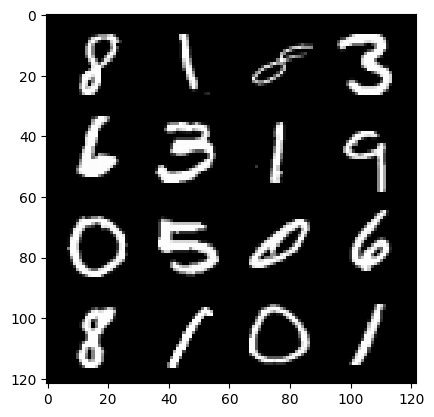

(epoch): step90300/Gen loss: 1.7436773176987967/disc_loss: 0.3533357120553651


  0%|          | 0/469 [00:00<?, ?it/s]

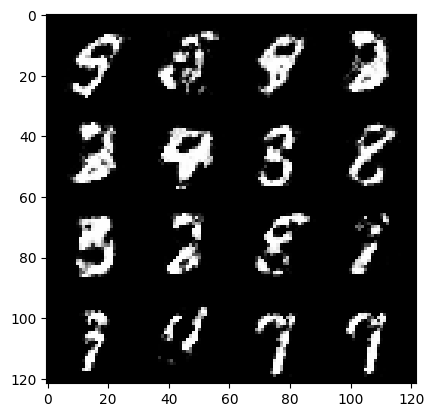

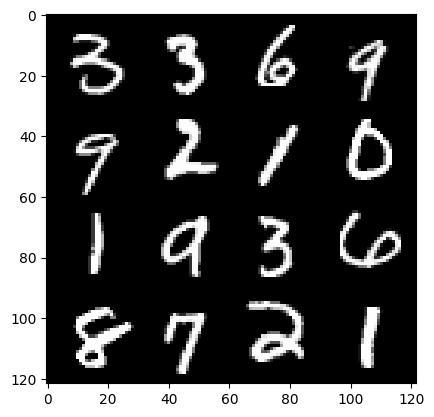

(epoch): step90600/Gen loss: 1.855317667722702/disc_loss: 0.32742213398218156


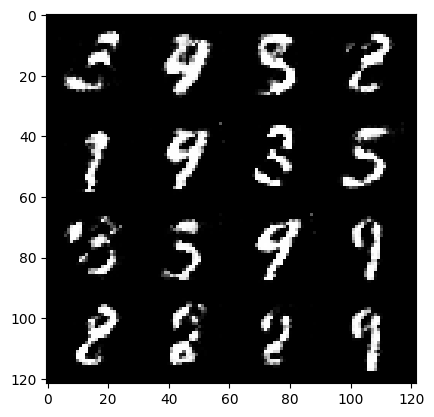

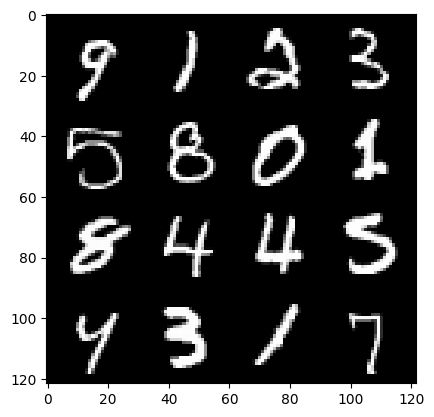

(epoch): step90900/Gen loss: 1.677978295485179/disc_loss: 0.3741542959213257


  0%|          | 0/469 [00:00<?, ?it/s]

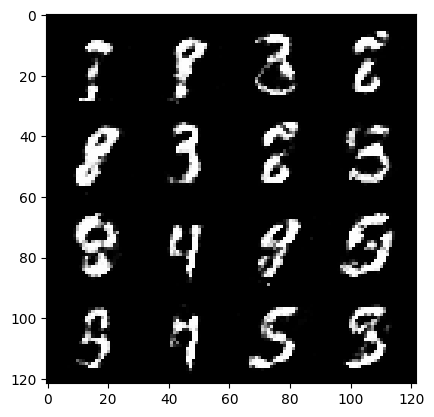

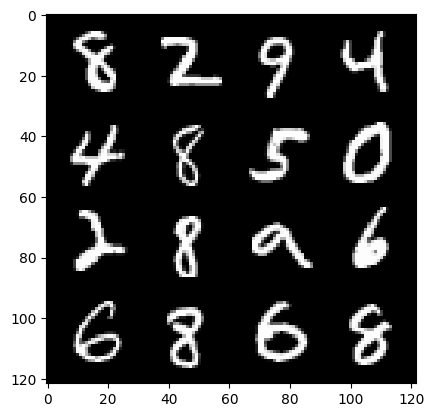

(epoch): step91200/Gen loss: 1.745774786074957/disc_loss: 0.35789984563986443


  0%|          | 0/469 [00:00<?, ?it/s]

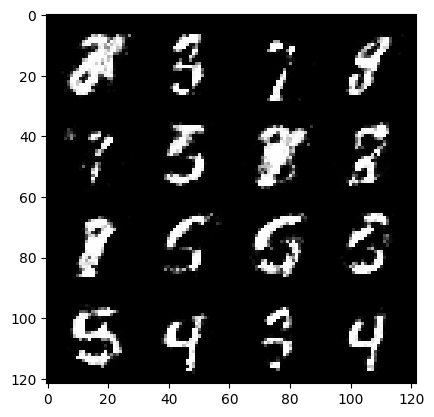

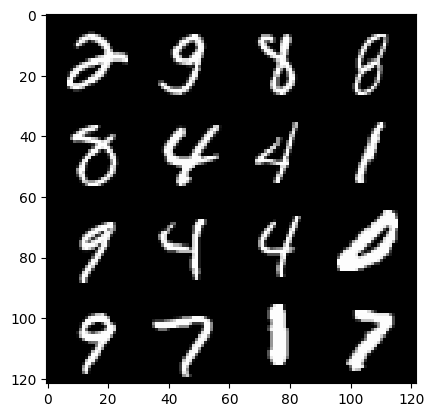

(epoch): step91500/Gen loss: 1.8952632677555077/disc_loss: 0.30867697611451156


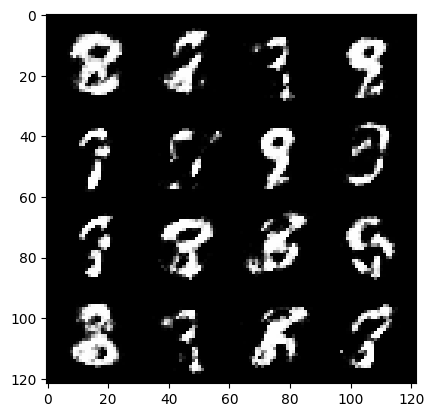

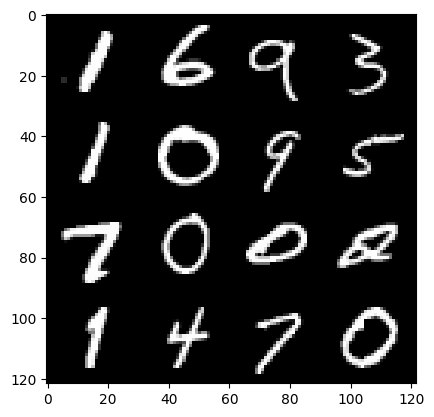

(epoch): step91800/Gen loss: 1.9209210248788198/disc_loss: 0.3113952786227065


  0%|          | 0/469 [00:00<?, ?it/s]

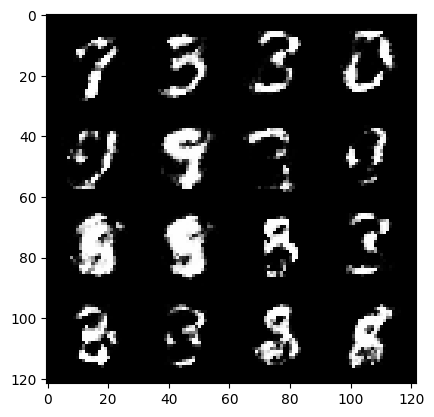

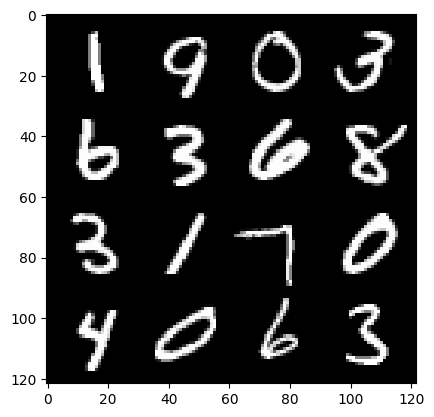

(epoch): step92100/Gen loss: 1.7248876114686322/disc_loss: 0.361947311659654


  0%|          | 0/469 [00:00<?, ?it/s]

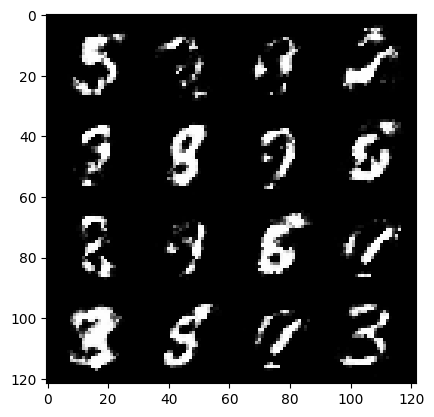

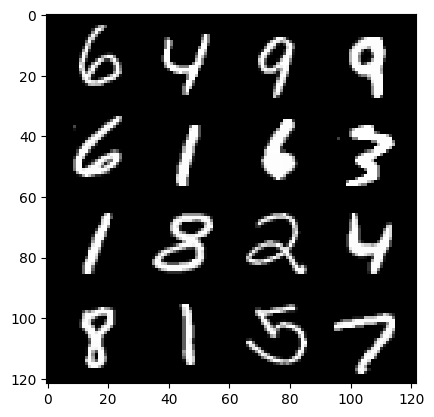

(epoch): step92400/Gen loss: 1.844776013692221/disc_loss: 0.31297436768809933


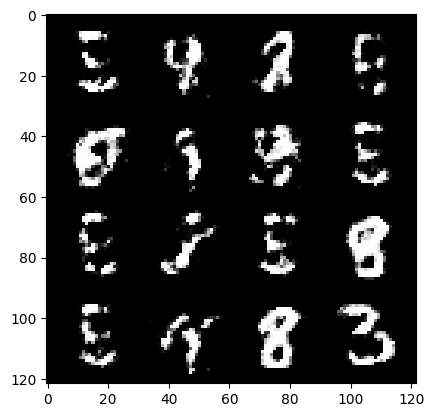

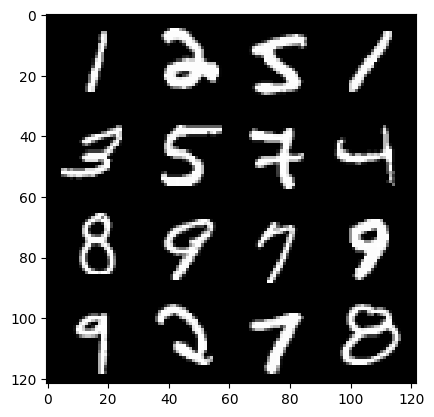

(epoch): step92700/Gen loss: 1.9881035168965662/disc_loss: 0.2963314441839853


  0%|          | 0/469 [00:00<?, ?it/s]

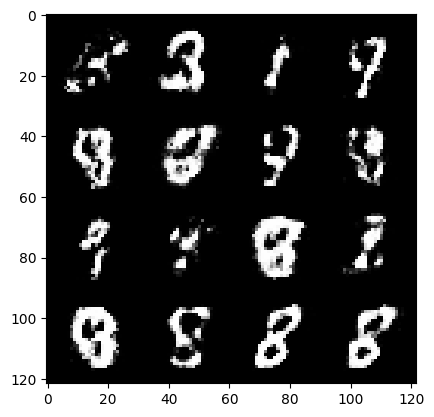

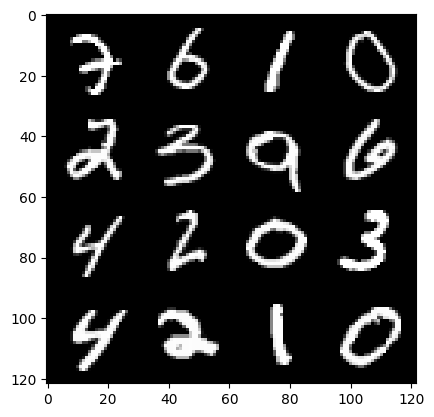

(epoch): step93000/Gen loss: 1.7973666751384736/disc_loss: 0.357043246726195


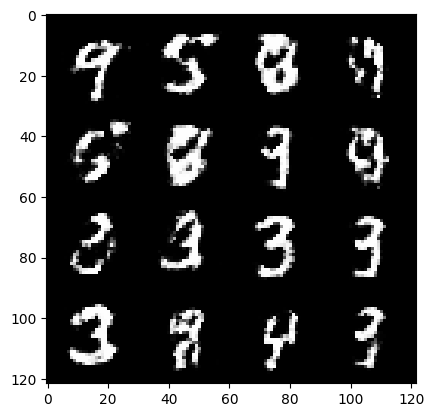

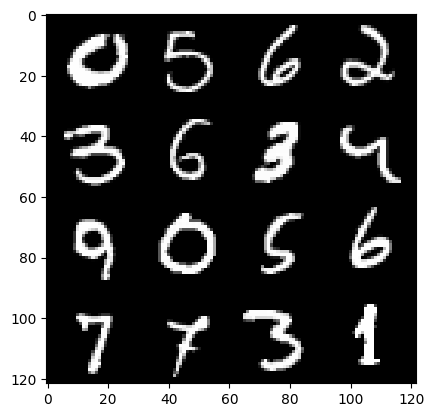

(epoch): step93300/Gen loss: 1.737820188999176/disc_loss: 0.3534619093934697


  0%|          | 0/469 [00:00<?, ?it/s]

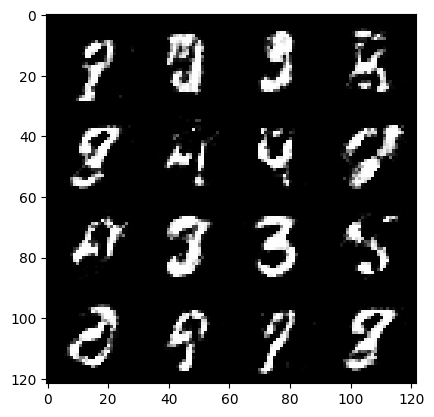

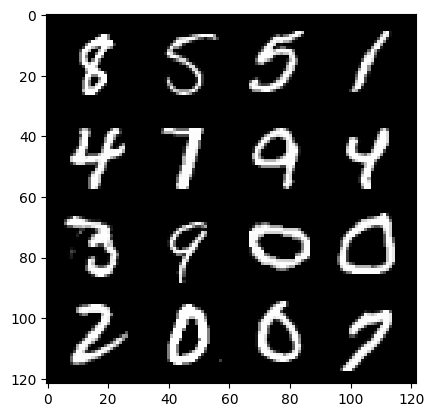

(epoch): step93600/Gen loss: 1.8619697221120208/disc_loss: 0.32913925478855777


  0%|          | 0/469 [00:00<?, ?it/s]

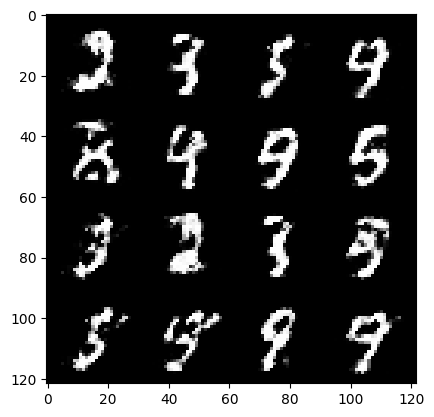

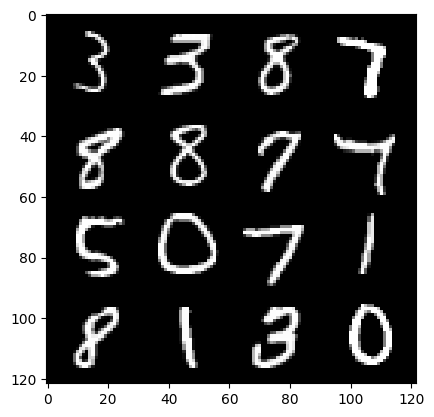

(epoch): step93900/Gen loss: 1.8379246143500014/disc_loss: 0.33823740874727576


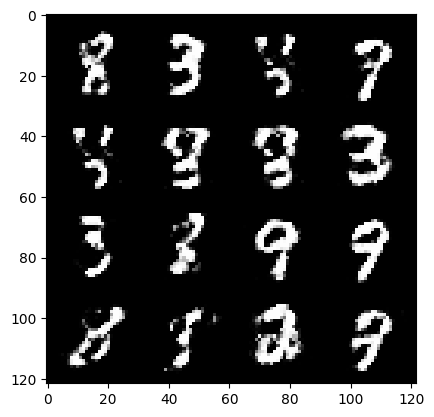

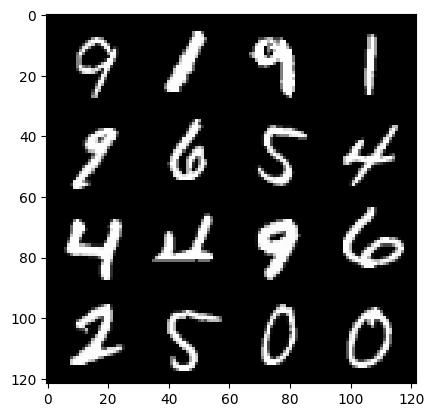

(epoch): step94200/Gen loss: 1.8177676037947335/disc_loss: 0.3530821683009465


  0%|          | 0/469 [00:00<?, ?it/s]

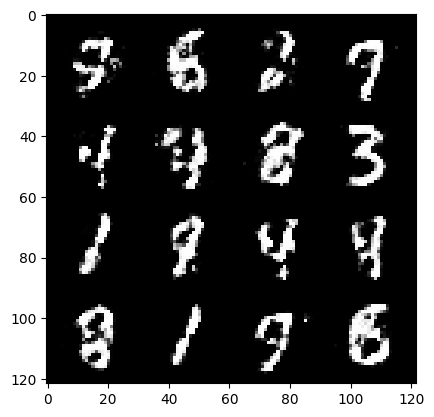

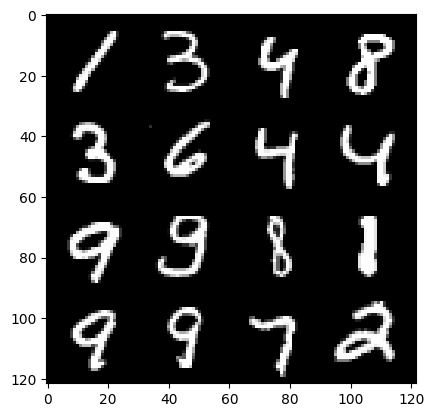

(epoch): step94500/Gen loss: 1.9329199496905003/disc_loss: 0.32515221883853285


  0%|          | 0/469 [00:00<?, ?it/s]

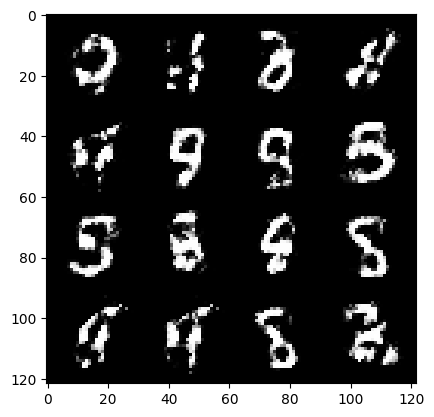

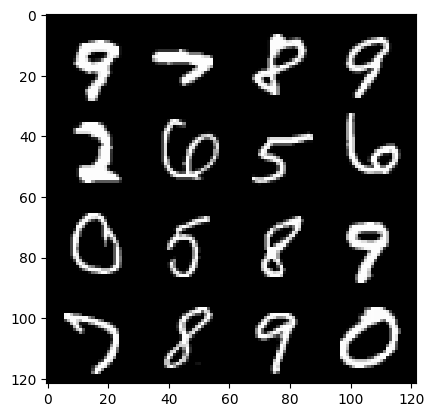

(epoch): step94800/Gen loss: 1.7831082534790048/disc_loss: 0.36363913993040714


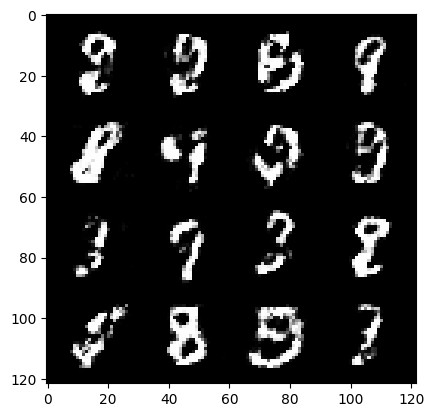

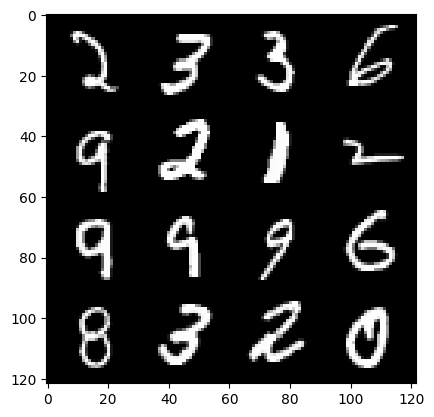

(epoch): step95100/Gen loss: 1.7980695025126145/disc_loss: 0.34068663716316244


  0%|          | 0/469 [00:00<?, ?it/s]

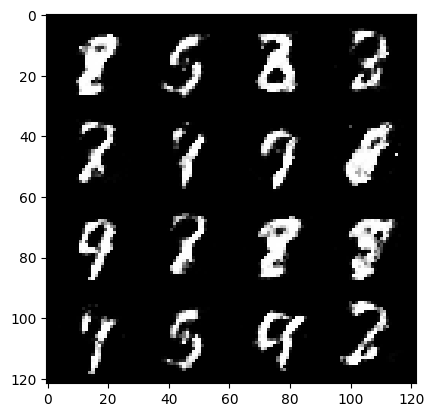

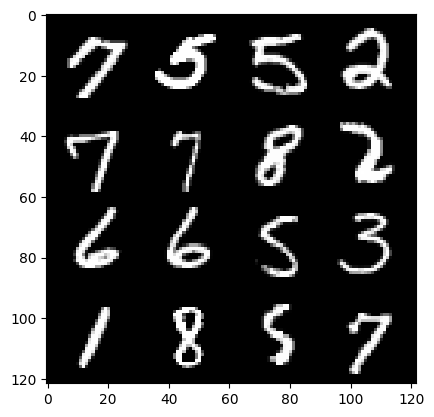

(epoch): step95400/Gen loss: 1.7940230039755496/disc_loss: 0.34452444156010936


  0%|          | 0/469 [00:00<?, ?it/s]

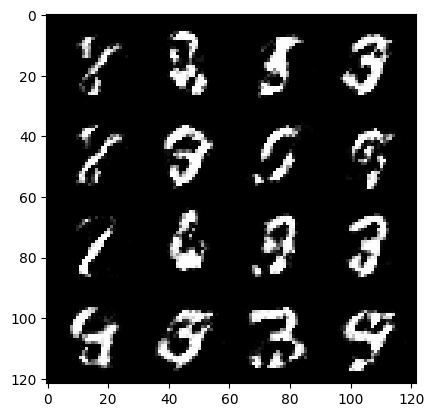

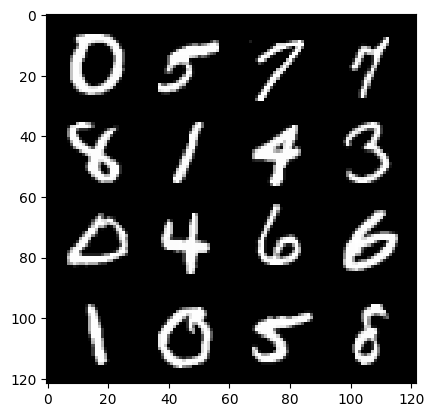

(epoch): step95700/Gen loss: 1.7710232182343815/disc_loss: 0.35152057896057787


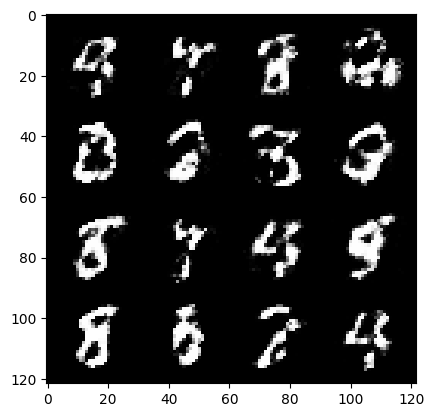

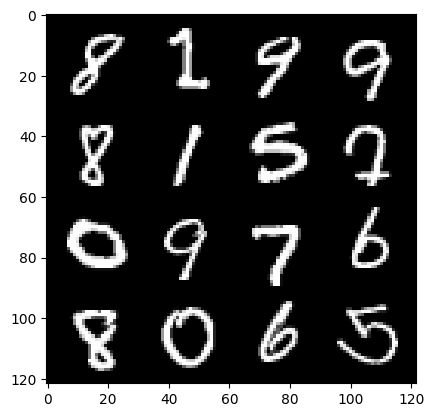

(epoch): step96000/Gen loss: 1.7867090284824385/disc_loss: 0.3483773509661357


  0%|          | 0/469 [00:00<?, ?it/s]

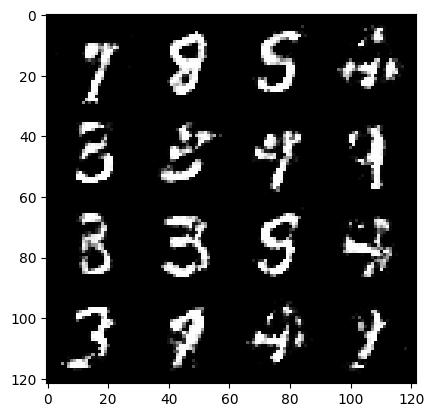

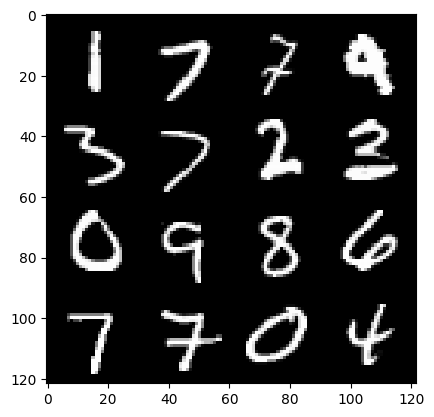

(epoch): step96300/Gen loss: 1.7506994724273683/disc_loss: 0.3536927209297818


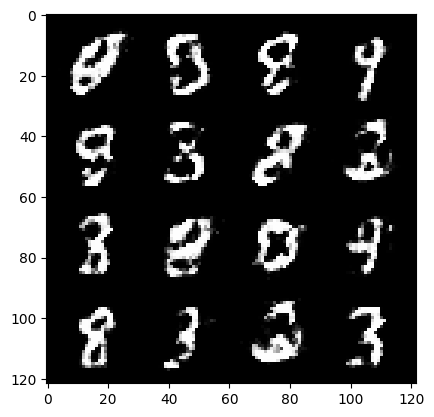

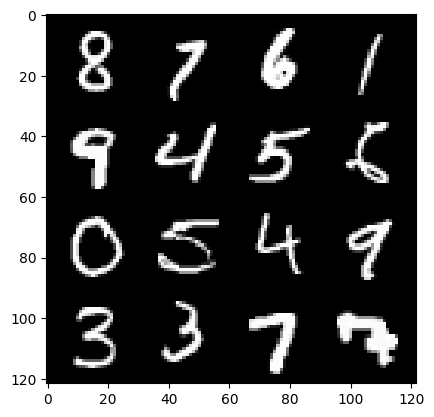

(epoch): step96600/Gen loss: 1.752460779746374/disc_loss: 0.36060343384742743


  0%|          | 0/469 [00:00<?, ?it/s]

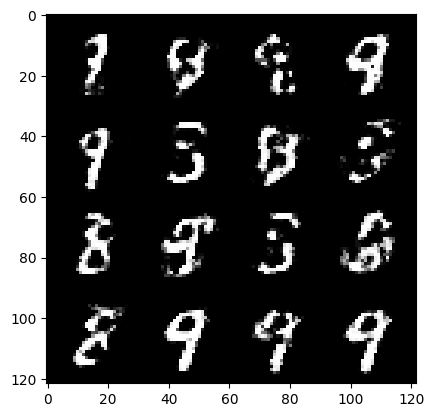

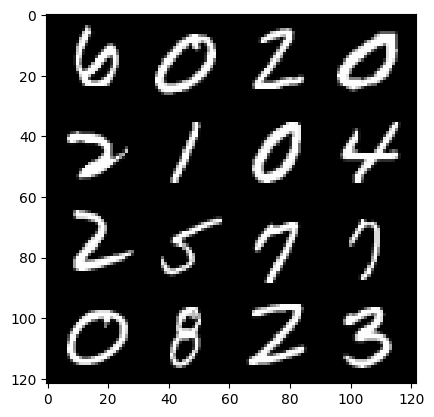

(epoch): step96900/Gen loss: 1.7501458307107298/disc_loss: 0.3480377743641538


  0%|          | 0/469 [00:00<?, ?it/s]

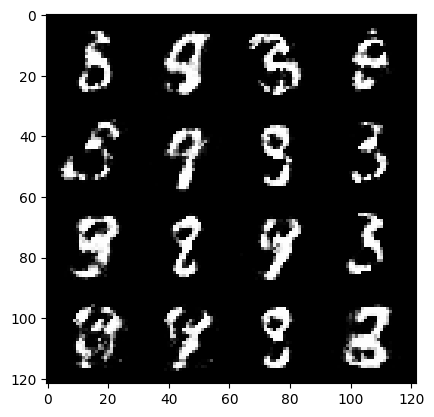

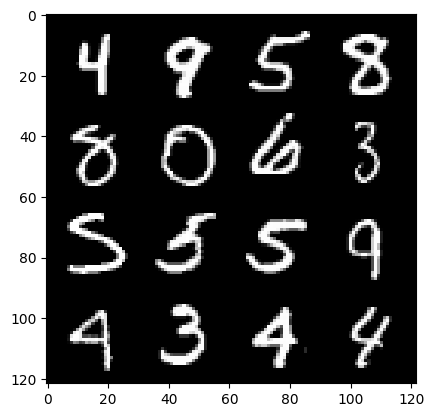

(epoch): step97200/Gen loss: 1.8909864338239035/disc_loss: 0.33133742918570813


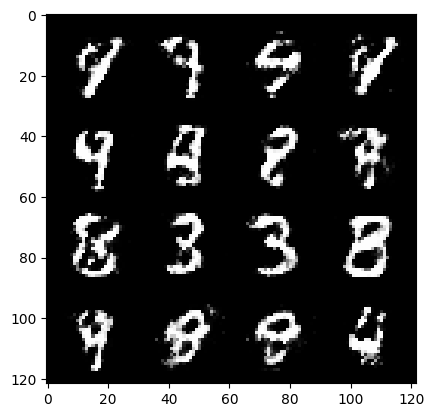

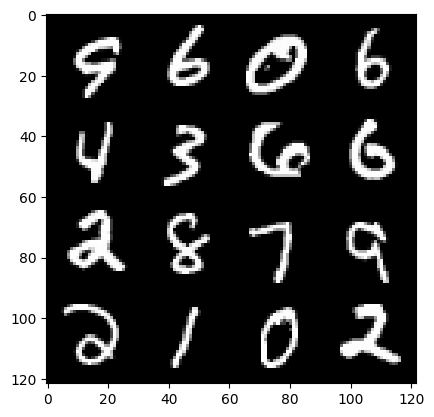

(epoch): step97500/Gen loss: 1.7779688950379697/disc_loss: 0.35228280007839224


  0%|          | 0/469 [00:00<?, ?it/s]

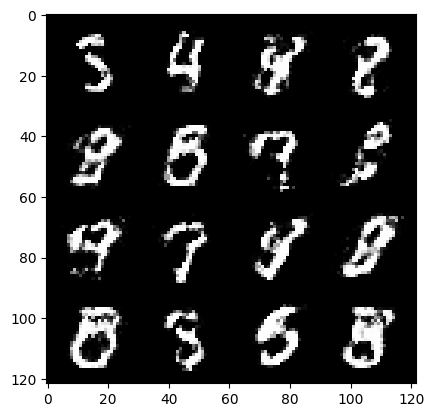

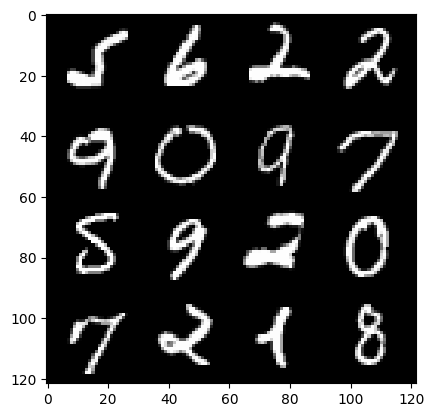

(epoch): step97800/Gen loss: 1.826833054224649/disc_loss: 0.3375025159120559


  0%|          | 0/469 [00:00<?, ?it/s]

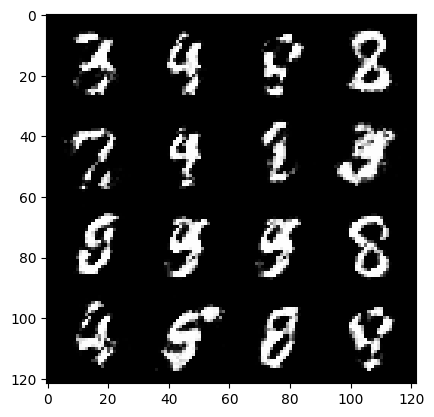

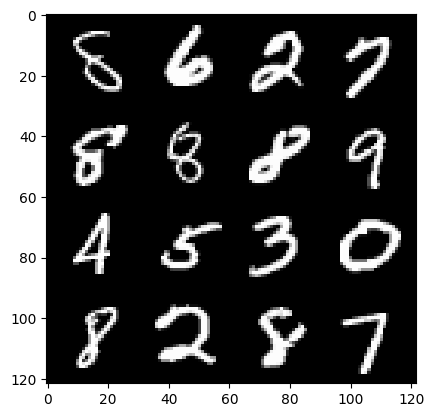

(epoch): step98100/Gen loss: 1.8601482892036438/disc_loss: 0.32783994515736914


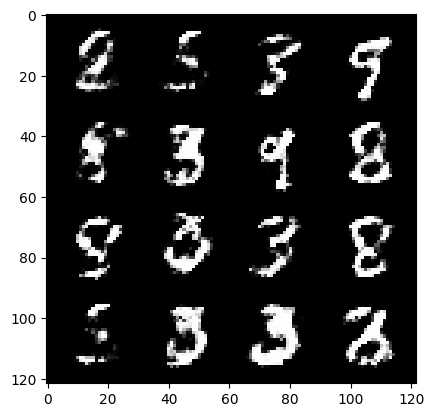

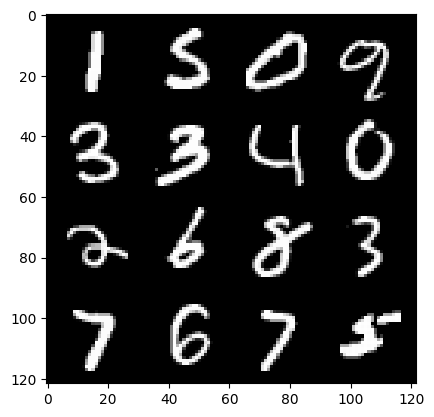

(epoch): step98400/Gen loss: 1.8219829463958732/disc_loss: 0.33083857392271343


  0%|          | 0/469 [00:00<?, ?it/s]

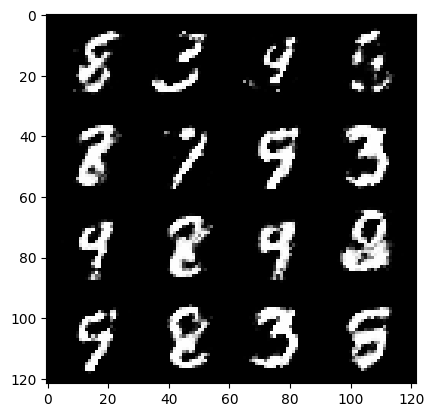

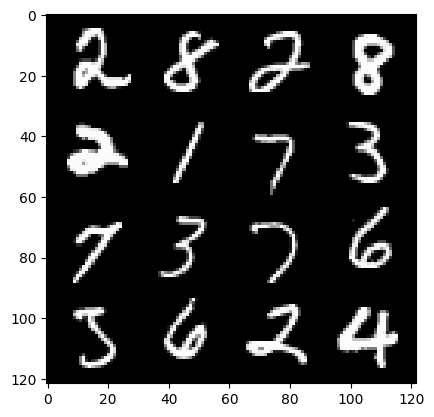

(epoch): step98700/Gen loss: 1.8854215578238178/disc_loss: 0.3219332070151968


  0%|          | 0/469 [00:00<?, ?it/s]

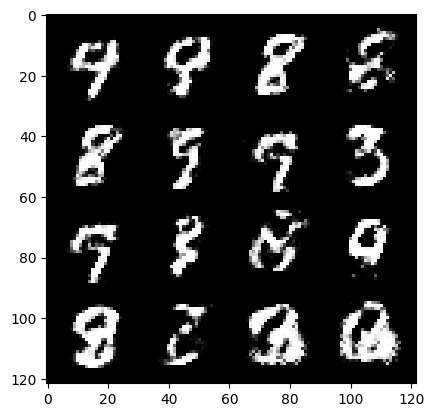

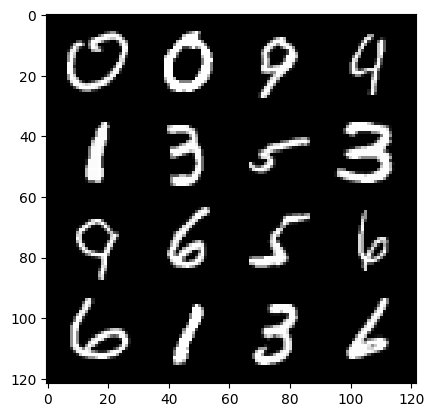

(epoch): step99000/Gen loss: 1.7803390562534323/disc_loss: 0.3498113275567688


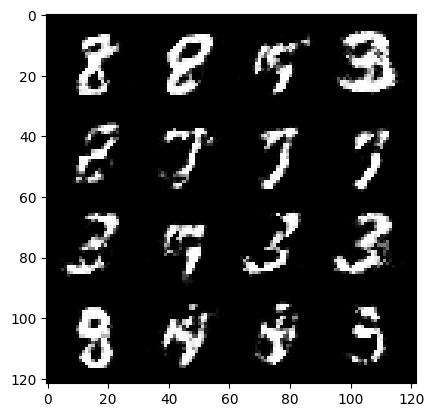

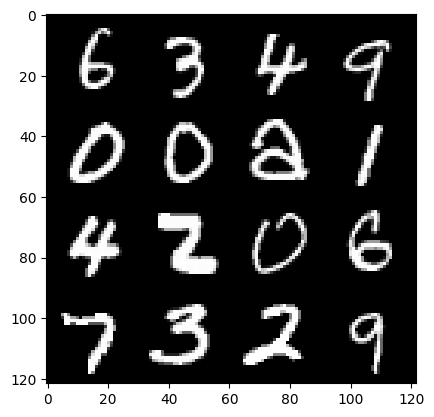

(epoch): step99300/Gen loss: 1.626097517410914/disc_loss: 0.3943475400408112


  0%|          | 0/469 [00:00<?, ?it/s]

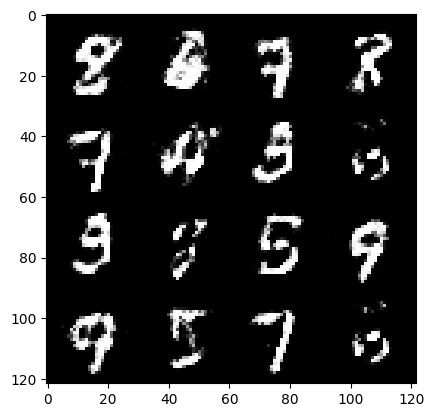

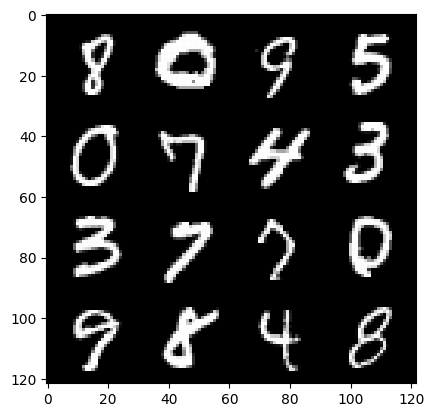

(epoch): step99600/Gen loss: 1.682581349611282/disc_loss: 0.3635431970159209


  0%|          | 0/469 [00:00<?, ?it/s]

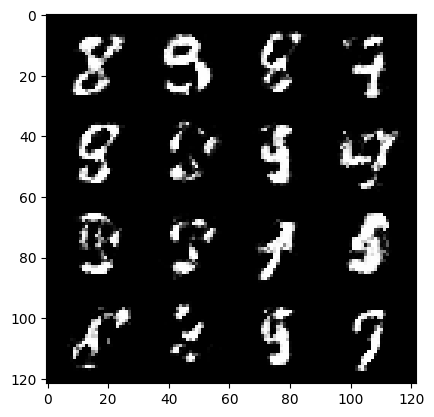

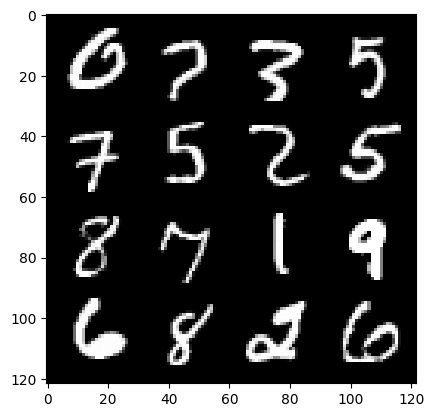

(epoch): step99900/Gen loss: 1.6633307890097306/disc_loss: 0.3655647393067681


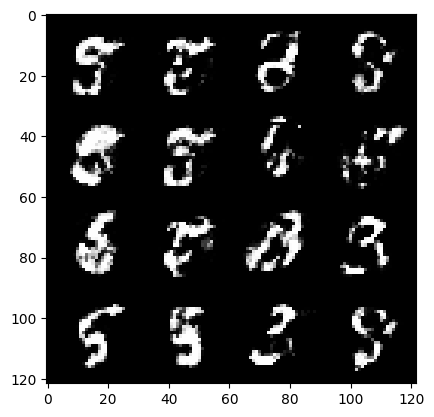

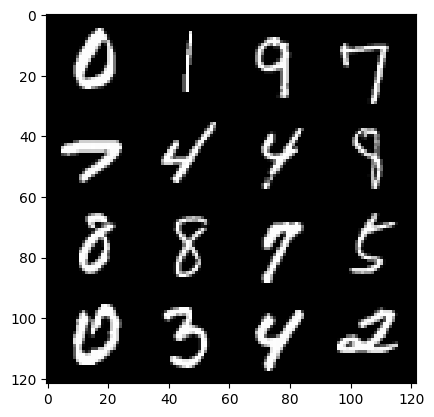

(epoch): step100200/Gen loss: 1.6883543642361951/disc_loss: 0.3678400358557703


  0%|          | 0/469 [00:00<?, ?it/s]

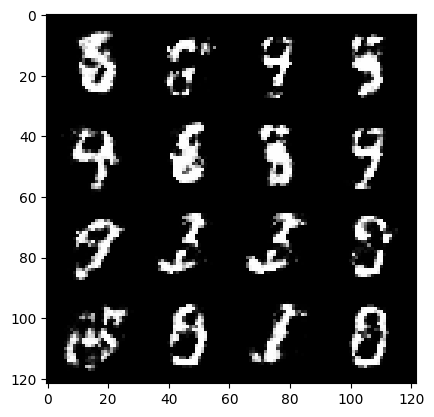

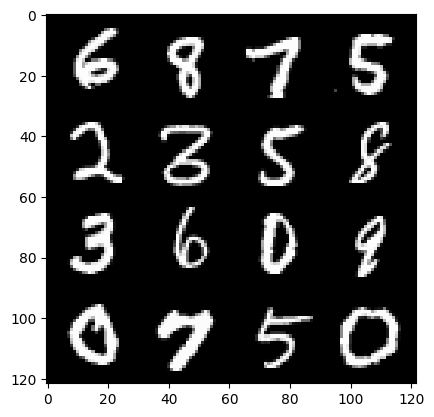

(epoch): step100500/Gen loss: 1.7509560906887056/disc_loss: 0.3529663734634716


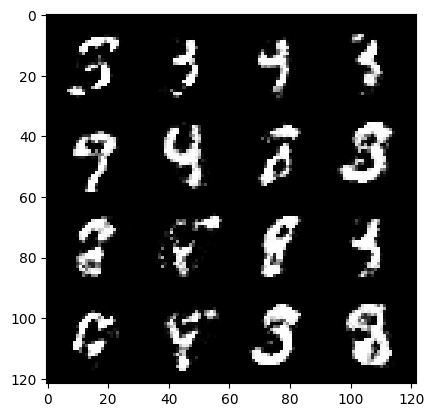

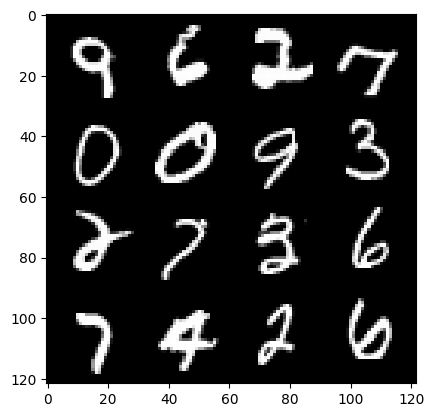

(epoch): step100800/Gen loss: 1.7194139866034182/disc_loss: 0.3613567352294922


  0%|          | 0/469 [00:00<?, ?it/s]

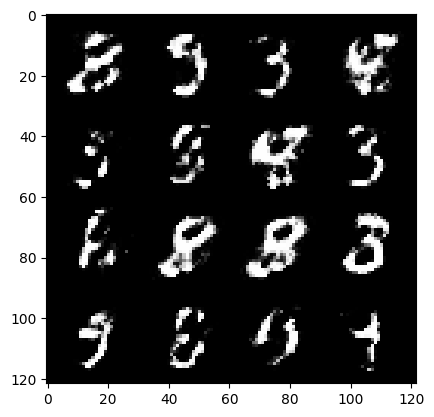

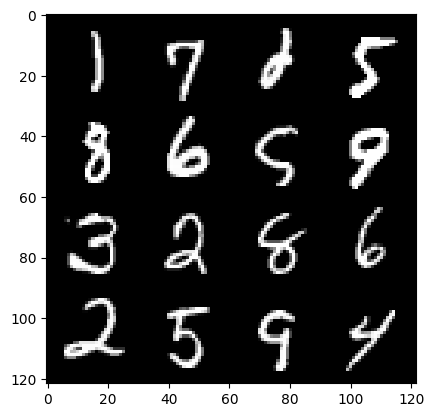

(epoch): step101100/Gen loss: 1.7048495896657316/disc_loss: 0.34792854328950257


  0%|          | 0/469 [00:00<?, ?it/s]

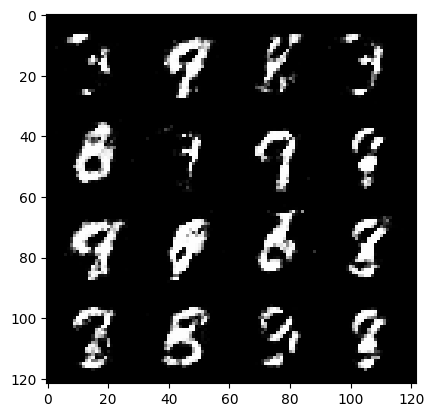

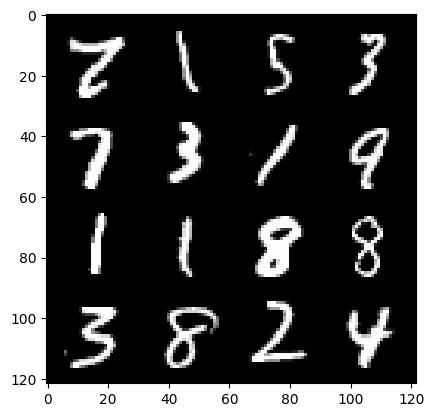

(epoch): step101400/Gen loss: 1.6848826781908668/disc_loss: 0.3552961670358975


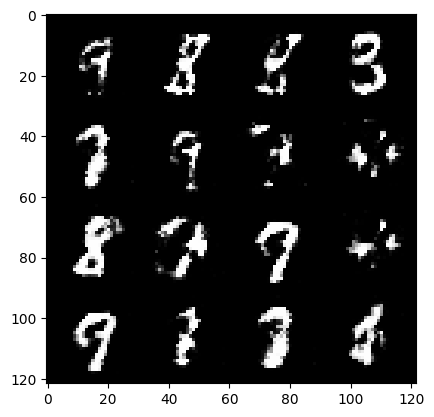

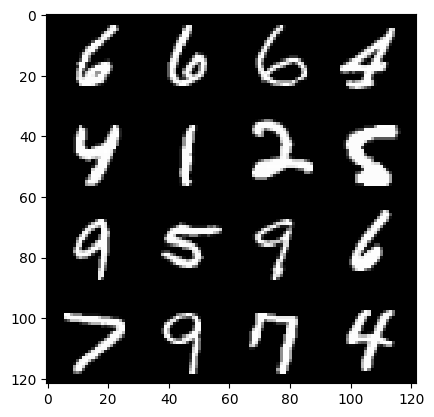

(epoch): step101700/Gen loss: 1.7058660399913785/disc_loss: 0.3421182180444399


  0%|          | 0/469 [00:00<?, ?it/s]

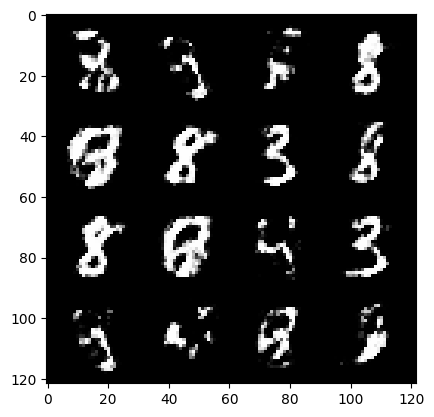

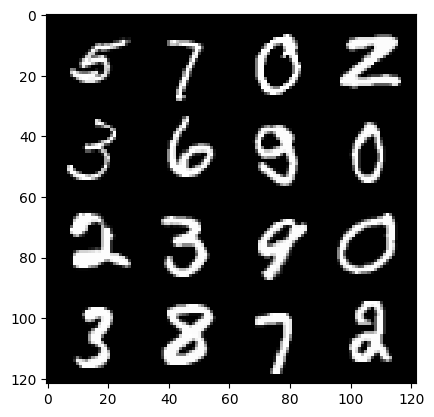

(epoch): step102000/Gen loss: 1.7446670814355214/disc_loss: 0.3443471409877145


  0%|          | 0/469 [00:00<?, ?it/s]

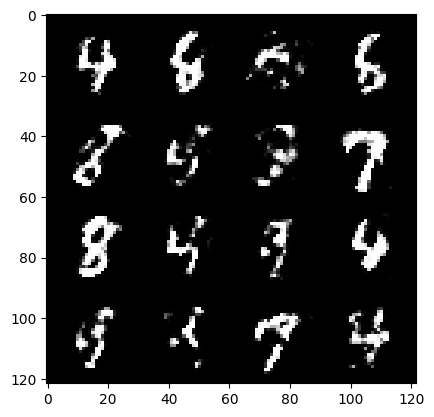

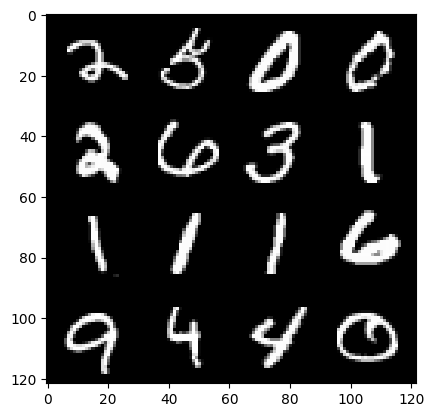

(epoch): step102300/Gen loss: 1.8023863291740407/disc_loss: 0.3345693794886271


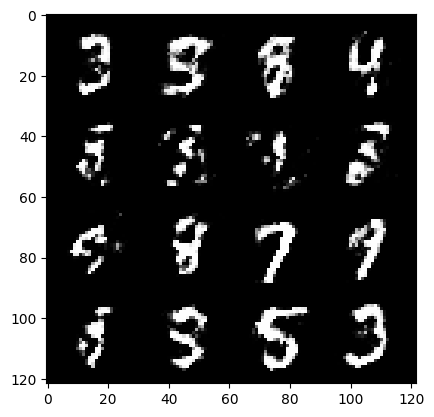

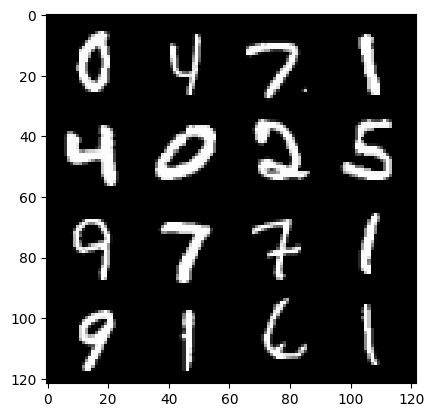

(epoch): step102600/Gen loss: 1.831271536747615/disc_loss: 0.32132892330487567


In [ ]:
###60000/128= 468.75= 469 steps in each epoch
## Each step is going to process 128 images= size of the batch(except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ###Training Discriminator:
    disc_opt.zero_grad()

    cur_bs= len(real) #real: 128 X1 X28 X28
    real= real.view(cur_bs, -1) #128* 784
    real= real.to(device)

    disc_loss= calc_disc_loss(loss_func, gen, disc, cur_bs, real, z_dim)

    disc_loss.backward(retain_graph= True)
    disc_opt.step()

    ##generator

    gen_opt.zero_grad()
    gen_loss= calc_gen_loss(loss_func, gen, disc, cur_bs, z_dim)
    gen_loss.backward(retain_graph= True)
    gen_opt.step()

    ##Visualization and stats
    mean_disc_loss+= disc_loss.item()/info_step
    mean_gen_loss+= gen_loss.item()/info_step

    if cur_step % info_step==0 and cur_step>0:
      fake_noise= gen_noise(cur_bs, z_dim)
      fake= gen(fake_noise)
      show(fake)
      show(real)
      print(f"(epoch): step{cur_step}/Gen loss: {mean_gen_loss}/disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0, 0
    cur_step+= 1

